TODO:
- for each dataset use multi-index from 1988-2024 with all unique ISO and re-merge all data with multi-index and then merge all data into a full dataset

- add UNHCR refugee/idp data; use country-of-origin data to adjust mortality estimates? e.g. conflict in neighboring country j leads to refugees and possibly in mortality increases in refugee-hosting country k, but this should be attributable in part to mortality increase in country j?

- based on Dixon include: log(population density? or population total?), running total of prior peace years?

- use ACLED data (from time period where it's reliable and comprehensive) use its best population exposure variable together with fatalities and use neural net to classify (based on acled notes col) whether health workers/facilities were attacked; run estimation with population exposure to conflict, with health attacks and population and conflict; also pair this data with gridded health access data


- calculate deaths etc of those areas where significance level is met based on simple slope test
- radarplots show where the marginal effect of improved health coverage would have made biggest theoretical difference in past wars; calculate the effect of this theoretical difference with the country's population estimates? === or use ucdp geodata and get the population within, say, 50 km (look at lancet paper which used geodata and checked for conflict effects on populations within different radiuses and use the best radius) and get the population at risk and get war effect on that population???


# libraries

In [ ]:
##### MIDASpy
# example use: https://github.com/MIDASverse/MIDASpy/blob/master/Examples/midas_demo.ipynb
## from MIDASpy.midas_base import Midas
# # https://github.com/MIDASverse/MIDASpy/blob/master/MIDASpy/midas_base.py
# # requires all missing data to be encoded as np.nan
# # requires the following order: [Continuous data], [Binary data], [Categorical data]
# # functions:
#     # build_model
#     # train_model
      # yield_samples(m=10) (after training, generates 10 datasets) # is a generator for combine, however we need to input a list
      # generate_samples(m=10).output_list # gives list
      # combine (after training and after imputing)

In [ ]:
!pip install --quiet linearmodels
!pip install --quiet econml
!pip install --quiet git+https://github.com/StatsReporting/stargazer
!pip install --quiet adjustText
!pip install --quiet rasterio
# !pip install --quiet midaspy
# import MIDASpy as md
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import KFold

from google.colab import drive
from google.colab import files
import os, itertools

import pandas as pd
import numpy as np
from scipy import stats
from scipy.sparse import coo_matrix # to conserve memory for sparse matrices
import geopandas as gpd

import rasterio
from rasterio.plot import show

from stargazer.stargazer import Stargazer
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.compat import lzip
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.diagnostic import het_breuschpagan
from statsmodels.stats.stattools import durbin_watson

from linearmodels import PanelOLS, PooledOLS, RandomEffects
from linearmodels.panel import compare

import seaborn as sns
import matplotlib.pyplot as plt

# get R functionality
%load_ext rpy2.ipython

np.random.seed(1)
pd.set_option('display.max_rows', 300)
pd.set_option('display.max_columns', None)
drive.mount('/content/gdrive')
wkdir = '/content/gdrive/MyDrive/Genocide/Deprivation of capabilities, Mortality, Demography, Ecocide/GBD, WDI, UCDP data/'

  Preparing metadata (setup.py) ... done
The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython
Mounted at /content/gdrive


In [ ]:
africanisos = {"DZA": "Africa",  # Algeria,
    "AGO": "Africa",  # Angola
    "BEN": "Africa",  # Benin
    "BWA": "Africa",  # Botswana
    "BFA": "Africa",  # Burkina Faso
    "BDI": "Africa",  # Burundi
    "CMR": "Africa",  # Cameroon
    "CPV": "Africa",  # Cape Verde
    "CAF": "Africa",  # Central African Republic
    "TCD": "Africa",  # Chad
    "COM": "Africa",  # Comoros
    "COG": "Africa",  # Congo
    "COD": "Africa",  # Democratic Republic of the Congo
    "DJI": "Africa",  # Djibouti
    "EGY": "Africa",  # Egypt
    "GNQ": "Africa",  # Equatorial Guinea
    "ERI": "Africa",  # Eritrea
    "SWZ": "Africa",  # Eswatini
    "ETH": "Africa",  # Ethiopia
    "GAB": "Africa",  # Gabon
    "GMB": "Africa",  # Gambia
    "GHA": "Africa",  # Ghana
    "GIN": "Africa",  # Guinea
    "GNB": "Africa",  # Guinea-Bissau
    "CIV": "Africa",  # Ivory Coast
    "KEN": "Africa",  # Kenya
    "LSO": "Africa",  # Lesotho
    "LBR": "Africa",  # Liberia
    "LBY": "Africa",  # Libya
    "MDG": "Africa",  # Madagascar
    "MWI": "Africa",  # Malawi
    "MLI": "Africa",  # Mali
    "MRT": "Africa",  # Mauritania
    "MUS": "Africa",  # Mauritius
    "MAR": "Africa",  # Morocco
    "MOZ": "Africa",  # Mozambique
    "NAM": "Africa",  # Namibia
    "NER": "Africa",  # Niger
    "NGA": "Africa",  # Nigeria
    "RWA": "Africa",  # Rwanda
    "STP": "Africa",  # Sao Tome and Principe
    "SEN": "Africa",  # Senegal
    "SYC": "Africa",  # Seychelles
    "SLE": "Africa",  # Sierra Leone
    "SOM": "Africa",  # Somalia
    "ZAF": "Africa",  # South Africa
    "SSD": "Africa",  # South Sudan
    "SDN": "Africa",  # Sudan
    "TZA": "Africa",  # Tanzania
    "TGO": "Africa",  # Togo
    "TUN": "Africa",  # Tunisia
    "UGA": "Africa",  # Uganda
    "ZMB": "Africa",  # Zambia
    "ZWE": "Africa"   # Zimbabwe
}

subsaharan_isos = {
    "AGO": "Subsaharan-Africa",  # Angola
    "BEN": "Subsaharan-Africa",  # Benin
    "BWA": "Subsaharan-Africa",  # Botswana
    "BFA": "Subsaharan-Africa",  # Burkina Faso
    "BDI": "Subsaharan-Africa",  # Burundi
    "CMR": "Subsaharan-Africa",  # Cameroon
    "CPV": "Subsaharan-Africa",  # Cape Verde
    "CAF": "Subsaharan-Africa",  # Central African Republic
    "TCD": "Subsaharan-Africa",  # Chad
    "COM": "Subsaharan-Africa",  # Comoros
    "COG": "Subsaharan-Africa",  # Congo
    "COD": "Subsaharan-Africa",  # Democratic Republic of the Congo
    "DJI": "Subsaharan-Africa",  # Djibouti
    "GNQ": "Subsaharan-Africa",  # Equatorial Guinea
    "ERI": "Subsaharan-Africa",  # Eritrea
    "SWZ": "Subsaharan-Africa",  # Eswatini
    "ETH": "Subsaharan-Africa",  # Ethiopia
    "GAB": "Subsaharan-Africa",  # Gabon
    "GMB": "Subsaharan-Africa",  # Gambia
    "GHA": "Subsaharan-Africa",  # Ghana
    "GIN": "Subsaharan-Africa",  # Guinea
    "GNB": "Subsaharan-Africa",  # Guinea-Bissau
    "CIV": "Subsaharan-Africa",  # Ivory Coast
    "KEN": "Subsaharan-Africa",  # Kenya
    "LSO": "Subsaharan-Africa",  # Lesotho
    "LBR": "Subsaharan-Africa",  # Liberia
    "MDG": "Subsaharan-Africa",  # Madagascar
    "MWI": "Subsaharan-Africa",  # Malawi
    "MLI": "Subsaharan-Africa",  # Mali
    "MRT": "Subsaharan-Africa",  # Mauritania
    "MUS": "Subsaharan-Africa",  # Mauritius
    "MOZ": "Subsaharan-Africa",  # Mozambique
    "NAM": "Subsaharan-Africa",  # Namibia
    "NER": "Subsaharan-Africa",  # Niger
    "NGA": "Subsaharan-Africa",  # Nigeria
    "RWA": "Subsaharan-Africa",  # Rwanda
    "STP": "Subsaharan-Africa",  # Sao Tome and Principe
    "SEN": "Subsaharan-Africa",  # Senegal
    "SYC": "Subsaharan-Africa",  # Seychelles
    "SLE": "Subsaharan-Africa",  # Sierra Leone
    "SOM": "Subsaharan-Africa",  # Somalia
    "ZAF": "Subsaharan-Africa",  # South Africa
    "SSD": "Subsaharan-Africa",  # South Sudan
    "SDN": "Subsaharan-Africa",  # Sudan
    "TZA": "Subsaharan-Africa",  # Tanzania
    "TGO": "Subsaharan-Africa",  # Togo
    "UGA": "Subsaharan-Africa",  # Uganda
    "ZMB": "Subsaharan-Africa",  # Zambia
    "ZWE": "Subsaharan-Africa"   # Zimbabwe
}



iso_numeric_letter = pd.read_csv(wkdir + 'iso_num_char_region.csv', usecols=['alpha-3', 'country-code'])
iso_numeric_letter = iso_numeric_letter.rename(columns={'alpha-3': 'ISO', 'country-code': 'numeric'})
iso_numeric_letter = dict(zip(iso_numeric_letter['numeric'].tolist(), iso_numeric_letter['ISO'].tolist()))

In [ ]:
# gbd country name to ISO mappings
country_iso = {
    'Brunei Darussalam': 'BRN', 'Guyana': 'GUY', 'Greece': 'GRC', 'Lesotho': 'LSO', 'Kuwait': 'KWT',
    'Haiti': 'HTI', 'Honduras': 'HND', 'Montenegro': 'MNE', 'Georgia': 'GEO', 'Timor-Leste': 'TLS',
    'Chile': 'CHL', 'Kazakhstan': 'KAZ', 'Guatemala': 'GTM', 'Poland': 'POL', 'Saint Lucia': 'LCA',
    'Kyrgyzstan': 'KGZ', 'Morocco': 'MAR', "Democratic People's Republic of Korea": 'PRK', 'China': 'CHN',
    'Palestine': 'PSE', 'Bhutan': 'BTN', 'Tajikistan': 'TJK', 'Oman': 'OMN', 'Taiwan': 'TWN', 'Mexico': 'MEX',
    'Turkmenistan': 'TKM', 'Panama': 'PAN', 'Canada': 'CAN', 'Saudi Arabia': 'SAU', 'Trinidad and Tobago': 'TTO',
    'Cambodia': 'KHM', 'Eritrea': 'ERI', 'Tuvalu': 'TUV', 'Grenada': 'GRD', 'Indonesia': 'IDN',
    'Syrian Arab Republic': 'SYR', 'Namibia': 'NAM', 'Guinea': 'GIN', 'Bolivia': 'BOL', 'Albania': 'ALB',
    'Ireland': 'IRL', 'Dominican Republic': 'DOM', 'El Salvador': 'SLV', 'France': 'FRA', 'Brazil': 'BRA',
    'Lebanon': 'LBN', 'Ecuador': 'ECU', 'Turkey': 'TUR', 'Paraguay': 'PRY', 'Malaysia': 'MYS', 'Maldives': 'MDV',
    'San Marino': 'SMR', 'Cook Islands': 'COK', 'Afghanistan': 'AFG', 'Germany': 'DEU', 'Serbia': 'SRB',
    'Jordan': 'JOR', 'Bulgaria': 'BGR', 'Peru': 'PER', 'Mauritania': 'MRT', 'United Arab Emirates': 'ARE',
    'Iraq': 'IRQ', 'South Africa': 'ZAF', 'Ethiopia': 'ETH', 'Algeria': 'DZA', 'Fiji': 'FJI', 'Niger': 'NER',
    'Israel': 'ISR', 'Costa Rica': 'CRI', 'Bahrain': 'BHR', 'United States Virgin Islands': 'VIR',
    'Philippines': 'PHL', 'Bangladesh': 'BGD', 'Nicaragua': 'NIC', 'Singapore': 'SGP', 'Hungary': 'HUN',
    'Bermuda': 'BMU', 'Liberia': 'LBR', 'Iran': 'IRN', 'Libya': 'LBY', 'Argentina': 'ARG', 'Greenland': 'GRL',
    'Djibouti': 'DJI', 'India': 'IND', 'Nigeria': 'NGA', 'American Samoa': 'ASM', 'Nepal': 'NPL', 'Mali': 'MLI',
    'Viet Nam': 'VNM', 'Pakistan': 'PAK', 'Madagascar': 'MDG', 'Zimbabwe': 'ZWE', 'Australia': 'AUS', 'Angola': 'AGO',
    'Malawi': 'MWI', 'Japan': 'JPN', 'Sao Tome and Principe': 'STP', 'Central African Republic': 'CAF',
    'South Sudan': 'SSD', 'Sri Lanka': 'LKA', 'Mozambique': 'MOZ', 'Uruguay': 'URY', 'Burkina Faso': 'BFA',
    'Democratic Republic of the Congo': 'COD', 'Rwanda': 'RWA', 'Sierra Leone': 'SLE',
    'Republic of Korea': 'KOR', 'Thailand': 'THA', 'Equatorial Guinea': 'GNQ', 'Burundi': 'BDI', 'Somalia': 'SOM',
    'Chad': 'TCD', 'New Zealand': 'NZL', 'Gambia': 'GMB', 'Myanmar': 'MMR', 'Comoros': 'COM', 'Zambia': 'ZMB',
    'North Macedonia': 'MKD', 'Ghana': 'GHA', 'Nauru': 'NRU', 'Botswana': 'BWA', 'Guinea-Bissau': 'GNB',
    'Jamaica': 'JAM', 'Niue': 'NIU', 'Northern Mariana Islands': 'MNP', 'Andorra': 'AND', 'Palau': 'PLW',
    'United States of America': 'USA', 'Puerto Rico': 'PRI', 'Guam': 'GUM', 'Saint Kitts and Nevis': 'KNA',
    'Kiribati': 'KIR', 'Saint Vincent and the Grenadines': 'VCT', 'Tokelau': 'TKL', 'Vanuatu': 'VUT',
    'Republic of Moldova': 'MDA', 'Cyprus': 'CYP', 'Armenia': 'ARM', 'Sudan': 'SDN', 'Romania': 'ROU',
    'Seychelles': 'SYC', 'Suriname': 'SUR', 'Sweden': 'SWE', 'Antigua and Barbuda': 'ATG', 'Kenya': 'KEN',
    'Monaco': 'MCO', 'Qatar': 'QAT', 'Ukraine': 'UKR', 'Micronesia': 'FSM',
    'Azerbaijan': 'AZE', 'Bahamas': 'BHS', 'Slovakia': 'SVK', 'Venezuela': 'VEN', 'Iceland': 'ISL',
    'Eswatini': 'SWZ', 'Portugal': 'PRT', 'Solomon Islands': 'SLB', 'Papua New Guinea': 'PNG', 'Egypt': 'EGY',
    'Cuba': 'CUB', 'Uganda': 'UGA', 'Denmark': 'DNK', 'Slovenia': 'SVN', 'Belize': 'BLZ', "Côte d'Ivoire": 'CIV',
    'Mauritius': 'MUS', 'Switzerland': 'CHE', 'Tunisia': 'TUN', 'Gabon': 'GAB', 'Yemen': 'YEM', 'Congo': 'COG',
    'Italy': 'ITA', 'Dominica': 'DMA', 'Marshall Islands': 'MHL', 'Belarus': 'BLR', 'Senegal': 'SEN', 'Benin': 'BEN',
    'Estonia': 'EST', 'Spain': 'ESP', 'Togo': 'TGO', 'Malta': 'MLT', 'Samoa': 'WSM', 'Mongolia': 'MNG',
    'Latvia': 'LVA', 'Lithuania': 'LTU', 'Netherlands': 'NLD', 'Cameroon': 'CMR', 'Cabo Verde': 'CPV',
    'Belgium': 'BEL', 'United Republic of Tanzania': 'TZA', 'Bosnia and Herzegovina': 'BIH', 'Colombia': 'COL',
    'Russian Federation': 'RUS', 'Barbados': 'BRB', 'Tonga': 'TON', 'Uzbekistan': 'UZB', 'Finland': 'FIN',
    'Norway': 'NOR', 'Czechia': 'CZE', 'Austria': 'AUT', 'Luxembourg': 'LUX', 'United Kingdom': 'GBR',
    'Croatia': 'HRV', "Lao People's Democratic Republic": 'LAO', 'Iran (Islamic Republic of)': 'IRN',
    'Taiwan (Province of China)': 'TWN', 'Micronesia (Federated States of)': 'FSM', 'Bolivia (Plurinational State of)':'BOL',
    'Venezuela (Bolivarian Republic of)':'VEN', 'Socialist Republic of Viet Nam': 'VNM',
    'Bolivarian Republic of Venezuela': 'VEN','Kingdom of Eswatini': 'SWZ','Republic of Nauru': 'NRU',
    'Plurinational State of Bolivia': 'BOL','Commonwealth of the Bahamas': 'BHS','Federated States of Micronesia': 'FSM',
    'Republic of Niue': 'NIU','Principality of Monaco': 'MCO','Republic of Palau': 'PLW','Islamic Republic of Iran': 'IRN',
    'Republic of Cabo Verde': 'CPV', 'Republic of the Gambia': 'GMB','United Kingdom of Great Britain and Northern Ireland': 'GBR',
    "Republic of Côte d'Ivoire": 'CIV','Czech Republic': 'CZE','Republic of San Marino': 'SMR','Brunei Darussalam': 'BRN', 'Guyana': 'GUY', 'Greece': 'GRC', 'Lesotho': 'LSO', 'Kuwait': 'KWT',
    'Haiti': 'HTI', 'Honduras': 'HND', 'Montenegro': 'MNE', 'Georgia': 'GEO', 'Timor-Leste': 'TLS',
    'Chile': 'CHL', 'Kazakhstan': 'KAZ', 'Guatemala': 'GTM', 'Poland': 'POL', 'Saint Lucia': 'LCA',
    'Kyrgyzstan': 'KGZ', 'Morocco': 'MAR', "Democratic People's Republic of Korea": 'PRK', 'China': 'CHN',
    'Palestine': 'PSE', 'Bhutan': 'BTN', 'Tajikistan': 'TJK', 'Oman': 'OMN', 'Taiwan': 'TWN',
    'Turkmenistan': 'TKM', 'Panama': 'PAN', 'Canada': 'CAN', 'Saudi Arabia': 'SAU', 'Trinidad and Tobago': 'TTO',
    'Cambodia': 'KHM', 'Eritrea': 'ERI', 'Tuvalu': 'TUV', 'Grenada': 'GRD', 'Indonesia': 'IDN',
    'Syrian Arab Republic': 'SYR', 'Namibia': 'NAM', 'Guinea': 'GIN', 'Bolivia': 'BOL', 'Albania': 'ALB',
    'Ireland': 'IRL', 'Dominican Republic': 'DOM', 'El Salvador': 'SLV', 'France': 'FRA', 'Brazil': 'BRA',
    'Lebanon': 'LBN', 'Ecuador': 'ECU', 'Turkey': 'TUR', 'Paraguay': 'PRY', 'Malaysia': 'MYS', 'Maldives': 'MDV',
    'San Marino': 'SMR', 'Cook Islands': 'COK', 'Afghanistan': 'AFG', 'Germany': 'DEU', 'Serbia': 'SRB',
    'Jordan': 'JOR', 'Bulgaria': 'BGR', 'Peru': 'PER', 'Mauritania': 'MRT', 'United Arab Emirates': 'ARE',
    'Iraq': 'IRQ', 'South Africa': 'ZAF', 'Ethiopia': 'ETH', 'Algeria': 'DZA', 'Fiji': 'FJI', 'Niger': 'NER',
    'Israel': 'ISR', 'Costa Rica': 'CRI', 'Bahrain': 'BHR', 'United States Virgin Islands': 'VIR',
    'Philippines': 'PHL', 'Bangladesh': 'BGD', 'Nicaragua': 'NIC', 'Singapore': 'SGP', 'Hungary': 'HUN',
    'Bermuda': 'BMU', 'Liberia': 'LBR', 'Iran': 'IRN', 'Libya': 'LBY', 'Argentina': 'ARG', 'Greenland': 'GRL',
    'Djibouti': 'DJI', 'India': 'IND', 'Nigeria': 'NGA', 'American Samoa': 'ASM', 'Nepal': 'NPL', 'Mali': 'MLI',
    'Viet Nam': 'VNM', 'Pakistan': 'PAK', 'Madagascar': 'MDG', 'Zimbabwe': 'ZWE', 'Australia': 'AUS', 'Angola': 'AGO',
    'Malawi': 'MWI', 'Japan': 'JPN', 'Sao Tome and Principe': 'STP', 'Central African Republic': 'CAF',
    'South Sudan': 'SSD', 'Sri Lanka': 'LKA', 'Mozambique': 'MOZ', 'Uruguay': 'URY', 'Burkina Faso': 'BFA',
    'Democratic Republic of the Congo': 'COD', 'Rwanda': 'RWA', 'Sierra Leone': 'SLE',
    'Republic of Korea': 'KOR', 'Thailand': 'THA', 'Equatorial Guinea': 'GNQ', 'Burundi': 'BDI', 'Somalia': 'SOM',
    'Chad': 'TCD', 'New Zealand': 'NZL', 'Gambia': 'GMB', 'Myanmar': 'MMR', 'Comoros': 'COM', 'Zambia': 'ZMB',
    'North Macedonia': 'MKD', 'Ghana': 'GHA', 'Nauru': 'NRU', 'Botswana': 'BWA', 'Guinea-Bissau': 'GNB',
    'Jamaica': 'JAM', 'Niue': 'NIU', 'Northern Mariana Islands': 'MNP', 'Andorra': 'AND', 'Palau': 'PLW',
    'United States of America': 'USA', 'Puerto Rico': 'PRI', 'Guam': 'GUM', 'Saint Kitts and Nevis': 'KNA',
    'Kiribati': 'KIR', 'Saint Vincent and the Grenadines': 'VCT', 'Tokelau': 'TKL', 'Vanuatu': 'VUT',
    'Republic of Moldova': 'MDA', 'Cyprus': 'CYP', 'Armenia': 'ARM', 'Sudan': 'SDN', 'Romania': 'ROU',
    'Seychelles': 'SYC', 'Suriname': 'SUR', 'Sweden': 'SWE', 'Antigua and Barbuda': 'ATG', 'Kenya': 'KEN',
    'Monaco': 'MCO', 'Qatar': 'QAT', 'Ukraine': 'UKR', 'Micronesia': 'FSM',
    'Azerbaijan': 'AZE', 'Bahamas': 'BHS', 'Slovakia': 'SVK', 'Venezuela': 'VEN', 'Iceland': 'ISL',
    'Eswatini': 'SWZ', 'Portugal': 'PRT', 'Solomon Islands': 'SLB', 'Papua New Guinea': 'PNG', 'Egypt': 'EGY',
    'Cuba': 'CUB', 'Uganda': 'UGA', 'Denmark': 'DNK', 'Slovenia': 'SVN', 'Belize': 'BLZ', "Côte d'Ivoire": 'CIV',
    'Mauritius': 'MUS', 'Switzerland': 'CHE', 'Tunisia': 'TUN', 'Gabon': 'GAB', 'Yemen': 'YEM', 'Congo': 'COG',
    'Italy': 'ITA', 'Dominica': 'DMA', 'Marshall Islands': 'MHL', 'Belarus': 'BLR', 'Senegal': 'SEN', 'Benin': 'BEN',
    'Estonia': 'EST', 'Spain': 'ESP', 'Togo': 'TGO', 'Malta': 'MLT', 'Samoa': 'WSM', 'Mongolia': 'MNG',
    'Latvia': 'LVA', 'Lithuania': 'LTU', 'Netherlands': 'NLD', 'Cameroon': 'CMR', 'Cabo Verde': 'CPV',
    'Belgium': 'BEL', 'United Republic of Tanzania': 'TZA', 'Bosnia and Herzegovina': 'BIH', 'Colombia': 'COL',
    'Russian Federation': 'RUS', 'Barbados': 'BRB', 'Tonga': 'TON', 'Uzbekistan': 'UZB', 'Finland': 'FIN',
    'Norway': 'NOR', 'Czechia': 'CZE', 'Austria': 'AUT', 'Luxembourg': 'LUX', 'United Kingdom': 'GBR',
    'Croatia': 'HRV', "Lao People's Democratic Republic": 'LAO', 'Taiwan (province of China)': 'TWN', 'Moldova': 'MDA',
    'Russia': 'RUS', 'Brunei': 'BRN', 'The Bahamas': 'BHS', 'North Korea': 'PRK', 'Laos': 'LAO','Vietnam': 'VNM', 'Tanzania': 'TZA',
    'eSwatini': 'SWZ', 'Cape Verde': 'CPV',"Cote d'Ivoire": 'CIV','The Gambia': 'GMB',
    'Sao Tome and PrIncipe': 'STP', 'Congo (Brazzaville)': 'COG','DR Congo': 'COD','Czech Republic':'CZE', 'USA':'USA', 'Taiwan (Province of China)': 'TWN',
    'Micronesia (Federated States of)': 'FSM','Bolivia (Plurinational State of)': 'BOL','Venezuela (Bolivarian Republic of)': 'VEN', 'Iran (Islamic Republic of)':'IRN',
    'Macedonia': 'MKD','South Korea': 'KOR','United States': 'USA','Syria': 'SYR','Swaziland': 'SWZ','Virgin Islands, U.S.': 'VIR'}
len(country_iso)

249

In [ ]:
# we'll use this as the basis for all other dfs to merge onto
# it's all possible combos of year-iso
minyear = 1988
maxyear = 2024
multiix = pd.MultiIndex.from_product([range(minyear, maxyear+1), country_iso.values()], names=['year', 'ISO']).to_frame(index=False)

In [ ]:
iso_region = {'MEX': 'Latin America', 'BGD': 'South Asia', 'GTM': 'Latin America', 'BLR': 'Europe', 'PAN': 'Latin America',
    'ZMB': 'Southern Africa', 'DNK': 'Europe', 'ETH': 'Eastern Africa', 'NZL': 'Oceania', 'KGZ': 'Central Asia',
    'IND': 'South Asia', 'GMB': 'Western Africa', 'KOR': 'East Asia', 'FRA': 'Europe', 'COL': 'Latin America',
    'TUR': 'Middle East', 'PAK': 'South Asia', 'TKM': 'Central Asia', 'UZB': 'Central Asia', 'MDV': 'South Asia',
    'KEN': 'Eastern Africa', 'MLI': 'Western Africa', 'UGA': 'Central Africa', 'KAZ': 'Central Asia',
    'TTO': 'Latin America', 'NAM': 'Southern Africa', 'COG': 'Central Africa', 'IRQ': 'Middle East', 'NIC': 'Latin America',
    'BOL': 'Latin America', 'TGO': 'Western Africa', 'ZAF': 'Southern Africa', 'CHE': 'Europe', 'RWA': 'Central Africa',
    'TZA': 'Eastern Africa', 'HUN': 'Europe', 'SYR': 'Middle East', 'ECU': 'Latin America', 'SLB': 'Oceania',
    'CUB': 'Latin America', 'VEN': 'Latin America', 'AUT': 'Europe', 'SWE': 'Europe', 'ZWE': 'Southern Africa',
    'ISL': 'Europe', 'JAM': 'Latin America', 'CAF': 'Central Africa', 'QAT': 'Middle East', 'URY': 'Latin America',
    'MUS': 'Eastern Africa', 'CMR': 'Central Africa', 'ITA': 'Europe', 'SLE': 'Western Africa', 'HTI': 'Latin America',
    'GAB': 'Central Africa', 'IRL': 'Europe', 'FJI': 'Oceania', 'SUR': 'Latin America', 'LAO': 'Southeast Asia',
    'TUN': 'North Africa', 'SAU': 'Middle East', 'MAR': 'North Africa', 'PHL': 'Southeast Asia', 'SGP': 'Southeast Asia',
    'IDN': 'Southeast Asia', 'AUS': 'Oceania', 'NGA': 'Western Africa', 'DZA': 'North Africa', 'VNM': 'Southeast Asia',
    'SDN': 'Eastern Africa', 'CIV': 'Western Africa', 'SWZ': 'Southern Africa', 'COD': 'Central Africa', 'MMR': 'Southeast Asia',
    'UKR': 'Europe', 'KWT': 'Middle East', 'PNG': 'Oceania', 'TJK': 'Central Asia', 'THA': 'Southeast Asia',
    'SLV': 'Latin America', 'TCD': 'Central Africa', 'CAN': 'Canada-US', 'BDI': 'Central Africa', 'BWA': 'Southern Africa',
    'NOR': 'Europe', 'BRA': 'Latin America', 'ESP': 'Europe', 'NER': 'Western Africa', 'ARG': 'Latin America',
    'MDG': 'Eastern Africa', 'YEM': 'Middle East', 'ROU': 'Europe', 'MRT': 'North Africa', 'GRC': 'Europe',
    'GUY': 'Latin America', 'BHR': 'Middle East', 'JPN': 'East Asia', 'BTN': 'South Asia', 'POL': 'Europe',
    'RUS': 'Europe', 'DJI': 'Eastern Africa', 'NLD': 'Europe', 'BEN': 'Western Africa', 'LSO': 'Southern Africa',
    'HND': 'Latin America', 'COM': 'Eastern Africa', 'VUT': 'Oceania', 'ARM': 'Europe', 'MNG': 'Central Asia',
    'PRT': 'Europe', 'MOZ': 'Southern Africa', 'CRI': 'Latin America', 'JOR': 'Middle East', 'BFA': 'Western Africa',
    'GNB': 'Western Africa', 'EGY': 'North Africa', 'AZE': 'Europe', 'PER': 'Latin America', 'CHN': 'East Asia',
    'PRY': 'Latin America', 'GHA': 'Western Africa', 'SEN': 'Western Africa', 'CHL': 'Latin America', 'LBN': 'Middle East',
    'MKD': 'Europe', 'GBR': 'Europe', 'CPV': 'Western Africa', 'GIN': 'Western Africa', 'ARE': 'Middle East',
    'DOM': 'Latin America', 'OMN': 'Middle East', 'FIN': 'Europe', 'MWI': 'Southern Africa', 'MLT': 'Europe',
    'ALB': 'Europe', 'BGR': 'Europe', 'LKA': 'South Asia', 'LBY': 'North Africa', 'AGO': 'Southern Africa',
    'DEU': 'Europe', 'USA': 'Canada-US', 'NPL': 'South Asia', 'MYS': 'Southeast Asia', 'GNQ': 'Western Africa',
    'CYP': 'Europe', 'BRB': 'Latin America', 'IRN': 'Middle East', 'ERI': 'Eastern Africa', 'SVK': 'Europe',
    'CZE': 'Europe', 'KHM': 'Southeast Asia', 'PSE': 'Middle East', 'BIH': 'Europe', 'MDA': 'Europe', 'EST': 'Europe',
    'ISR': 'Middle East', 'LVA': 'Europe', 'SVN': 'Europe', 'LTU': 'Europe', 'HRV': 'Europe', 'LBR': 'Western Africa',
    'LUX': 'Europe', 'TLS': 'Southeast Asia', 'BEL': 'Europe', 'GEO': 'Europe', 'STP': 'Central Africa', 'AFG': 'South Asia',
    'MNE': 'Europe', 'SRB': 'Europe', 'SSD': 'Eastern Africa', 'SOM': 'Eastern Africa'}
set(iso_region.values())
iso_region.get('RWA')

'Central Africa'

In [ ]:
iso_continent = {
    'MEX': 'North America', 'BGD': 'Asia', 'GTM': 'North America', 'BLR': 'Europe', 'PAN': 'North America',
    'ZMB': 'Africa', 'DNK': 'Europe', 'ETH': 'Africa', 'NZL': 'Oceania', 'KGZ': 'Asia', 'IND': 'Asia',
    'GMB': 'Africa', 'KOR': 'Asia', 'FRA': 'Europe', 'COL': 'South America', 'TUR': 'Asia', 'PAK': 'Asia',
    'TKM': 'Asia', 'UZB': 'Asia', 'MDV': 'Asia', 'KEN': 'Africa', 'MLI': 'Africa', 'UGA': 'Africa',
    'KAZ': 'Asia', 'TTO': 'North America', 'NAM': 'Africa', 'COG': 'Africa', 'IRQ': 'Asia', 'NIC': 'North America',
    'BOL': 'South America', 'TGO': 'Africa', 'ZAF': 'Africa', 'CHE': 'Europe', 'RWA': 'Africa', 'TZA': 'Africa',
    'HUN': 'Europe', 'SYR': 'Asia', 'ECU': 'South America', 'SLB': 'Oceania', 'CUB': 'North America',
    'VEN': 'South America', 'AUT': 'Europe', 'SWE': 'Europe', 'ZWE': 'Africa', 'ISL': 'Europe', 'JAM': 'North America',
    'CAF': 'Africa', 'QAT': 'Asia', 'URY': 'South America', 'MUS': 'Africa', 'CMR': 'Africa', 'ITA': 'Europe',
    'SLE': 'Africa', 'HTI': 'North America', 'GAB': 'Africa', 'IRL': 'Europe', 'FJI': 'Oceania', 'SUR': 'South America',
    'LAO': 'Asia', 'TUN': 'Africa', 'SAU': 'Asia', 'MAR': 'Africa', 'PHL': 'Asia', 'SGP': 'Asia', 'IDN': 'Asia',
    'AUS': 'Oceania', 'NGA': 'Africa', 'DZA': 'Africa', 'VNM': 'Asia', 'SDN': 'Africa', 'CIV': 'Africa', 'SWZ': 'Africa',
    'COD': 'Africa', 'MMR': 'Asia', 'UKR': 'Europe', 'KWT': 'Asia', 'PNG': 'Oceania', 'TJK': 'Asia', 'THA': 'Asia',
    'SLV': 'North America', 'TCD': 'Africa', 'CAN': 'North America', 'BDI': 'Africa', 'BWA': 'Africa', 'NOR': 'Europe',
    'BRA': 'South America', 'ESP': 'Europe', 'NER': 'Africa', 'ARG': 'South America', 'MDG': 'Africa', 'YEM': 'Asia',
    'ROU': 'Europe', 'MRT': 'Africa', 'GRC': 'Europe', 'GUY': 'South America', 'BHR': 'Asia', 'JPN': 'Asia',
    'BTN': 'Asia', 'POL': 'Europe', 'RUS': 'Europe', 'DJI': 'Africa', 'NLD': 'Europe', 'BEN': 'Africa', 'LSO': 'Africa',
    'HND': 'North America', 'COM': 'Africa', 'VUT': 'Oceania', 'ARM': 'Europe', 'MNG': 'Asia', 'PRT': 'Europe',
    'MOZ': 'Africa', 'CRI': 'North America', 'JOR': 'Asia', 'BFA': 'Africa', 'GNB': 'Africa', 'EGY': 'Africa',
    'AZE': 'Europe', 'PER': 'South America', 'CHN': 'Asia', 'PRY': 'South America', 'GHA': 'Africa', 'SEN': 'Africa',
    'CHL': 'South America', 'LBN': 'Asia', 'MKD': 'Europe', 'GBR': 'Europe', 'CPV': 'Africa', 'GIN': 'Africa',
    'ARE': 'Asia', 'DOM': 'North America', 'OMN': 'Asia', 'FIN': 'Europe', 'MWI': 'Africa', 'MLT': 'Europe',
    'ALB': 'Europe', 'BGR': 'Europe', 'LKA': 'Asia', 'LBY': 'Africa', 'AGO': 'Africa', 'DEU': 'Europe', 'USA': 'North America',
    'NPL': 'Asia', 'MYS': 'Asia', 'GNQ': 'Africa', 'CYP': 'Europe', 'BRB': 'North America', 'IRN': 'Asia', 'ERI': 'Africa',
    'SVK': 'Europe', 'CZE': 'Europe', 'KHM': 'Asia', 'PSE': 'Asia', 'BIH': 'Europe', 'MDA': 'Europe', 'EST': 'Europe',
    'ISR': 'Asia', 'LVA': 'Europe', 'SVN': 'Europe', 'LTU': 'Europe', 'HRV': 'Europe', 'LBR': 'Africa', 'LUX': 'Europe',
    'TLS': 'Asia', 'BEL': 'Europe', 'GEO': 'Europe', 'STP': 'Africa', 'AFG': 'Asia', 'MNE': 'Europe', 'SRB': 'Europe',
    'SSD': 'Africa', 'SOM': 'Africa'}
len([e for e in iso_continent.values() if e == 'Oceania'])

6

# unzip

In [ ]:
# !pip install --quiet py7zr
import py7zr

with py7zr.SevenZipFile('/content/gdrive/MyDrive/Genocide/Deprivation of capabilities, Mortality, Demography, Ecocide/GBD, WDI, UCDP data/epidemics/DiseaseOutbreaks.7z', mode='r') as z:
    z.extractall('/content/gdrive/MyDrive/Genocide/Deprivation of capabilities, Mortality, Demography, Ecocide/GBD, WDI, UCDP data/epidemics/')


In [ ]:
import os
import zipfile
directory_path = '/content/gdrive/MyDrive/Genocide/Deprivation of capabilities, Mortality, Demography, Ecocide/GBD, WDI, UCDP data/'
extension = "NASA population/"


for file_name in os.listdir(directory_path + extension):
    if file_name.endswith('.zip'):
        zip_file_path = os.path.join(directory_path + extension, file_name)
        with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
            zip_ref.extractall(directory_path + extension)

# gbd_tmp1 = []
# gbd_tmp2 = []
# for file_name in os.listdir(directory_path + extension):
#     if file_name.lower().endswith('.csv'):
#         csv_file_path = os.path.join(directory_path + extension, file_name)
#         df = pd.read_csv(csv_file_path)
#         gbd_tmp1.append(df)
#         # if 'noshock' in file_name.lower():
#         #     csv_file_path = os.path.join(directory_path + extension, file_name)
#         #     df = pd.read_csv(csv_file_path)
#         #     gbd_tmp1.append(df)
#         # elif 'wshock' in file_name.lower():
#         #     csv_file_path = os.path.join(directory_path + extension, file_name)
#         #     df = pd.read_csv(csv_file_path)
#         #     gbd_tmp2.append(df)

# gbd_causes = pd.concat(gbd_tmp1, ignore_index=True)
# gbd_causes.to_csv(directory_path+extension +'gbd_lvl1n2_causes_country_conflict_ages.csv')

In [ ]:
gbd_causes.drop(columns=['measure_id', 'metric_id', 'sex_id', 'age_id', 'cause_id', 'metric_id', 'metric_name'], inplace=True)
gbd_causes.rename(columns={'val': 'allcause_mortality_popnormed'}, inplace=True)
gbd_causes.to_csv(directory_path+extension +'gbd_lvl1n2_causes_country_conflict_ages.csv', index=False)

# WHO

**tested variables**

- who health expenditure (starts at 2000)
- hale (healthy life expectancy) was dropped in favor of gdb life expectancy estimates which are more complete

In [ ]:
who_cols = ['DIM_GEO_CODE_M49','GEO_NAME_SHORT','DIM_TIME','DIM_VALUE_TYPE','VALUE_NUMERIC']

# hale = pd.read_csv(wkdir+'WHO HALE.csv', usecols=who_cols+['DIM_SEX'])
# hale.rename(columns={'DIM_TIME': 'year', 'VALUE_NUMERIC': 'who_hale', 'GEO_NAME_SHORT': 'country',  'DIM_GEO_CODE_M49': 'M49', 'DIM_SEX':'sex'}, inplace=True)
# hale.sex = hale.sex.str.lower().str.replace('total', 'both')
### health expenditure has no missing values
h_exp = pd.read_csv(wkdir+'WHO govt health expenditure.csv', usecols=who_cols)
h_exp.rename(columns={'DIM_TIME': 'year', 'VALUE_NUMERIC': 'who_health_expenditure', 'GEO_NAME_SHORT': 'country',  'DIM_GEO_CODE_M49': 'M49'}, inplace=True)
h_exp['sex'] = 'both'
### doc density doesn't have any missing values
doc_dense = pd.read_csv(wkdir+'WHO_density of doctors.csv', usecols=who_cols)
doc_dense.rename(columns={'DIM_TIME': 'year', 'VALUE_NUMERIC': 'who_doc_density', 'GEO_NAME_SHORT': 'country',  'DIM_GEO_CODE_M49': 'M49'}, inplace=True)
doc_dense['sex'] = 'both'

In [ ]:
# set(h_exp.M49.unique()).union(set(doc_dense.M49.unique()))
m49_iso = pd.read_excel('/content/gdrive/MyDrive/Genocide/Deprivation of capabilities, Mortality, Demography, Ecocide/GBD, WDI, UCDP data/M49 to ISO.xlsx', engine='openpyxl')
m49_to_iso = dict(zip(m49_iso.M49.tolist(), m49_iso.ISO.tolist()))

In [ ]:
doc_dense.M49 = doc_dense.M49.map(m49_to_iso)
doc_dense.rename(columns={'M49': 'ISO'}, inplace=True)
h_exp.M49 = h_exp.M49.map(m49_to_iso)
h_exp.rename(columns={'M49': 'ISO'}, inplace=True)

In [ ]:
doc_dense.drop(columns=['DIM_VALUE_TYPE', 'country'], inplace=True)
h_exp.drop(columns=['DIM_VALUE_TYPE', 'country'], inplace=True)
who = doc_dense.merge(h_exp, how='outer', on=['ISO', 'year', 'sex'])
who.dropna(subset=['ISO'], inplace=True)
who = who[who.year <= 2019]

In [ ]:
who['cause'] = 'All causes'
who

,ISO,year,who_doc_density,sex,who_health_expenditure,cause
0,AUT,1990,30.086,both,NaN,All causes
1,FRA,1990,31.183,both,NaN,All causes
2,AUS,1990,21.698,both,NaN,All causes
3,CHE,1990,29.843,both,NaN,All causes
4,CYP,1990,15.193,both,NaN,All causes
...,...,...,...,...,...,...
4609,TZA,2019,NaN,both,9.44,All causes
4610,VEN,2019,NaN,both,4.91,All causes
4611,ZWE,2019,NaN,both,3.94,All causes
4612,GIN,2019,NaN,both,6.15,All causes


# UNHCR

In [ ]:
unhcr.columns

Index(['year', 'Country of origin', 'origin_ISO', 'Country of asylum',
       'target_ISO', 'refugees', 'Asylum-seekers', 'idps',
       'Other people in need of international protection', 'Stateless persons',
       'Host Community', 'Others of concern'],
      dtype='object')

In [ ]:
unhcr = pd.read_csv(wkdir+'UNHCR refugee idp/idp refugee data.csv')
unhcr.rename(columns={'Country of origin (ISO)' : 'origin_ISO',
                      'Country of asylum (ISO)' : 'ISO',
                      'Year' : 'year',
                      'Refugees under UNHCR\'s mandate' : 'refugees',
                     'Stateless persons': 'stateless',
                      'IDPs of concern to UNHCR':'idps'}, inplace=True)
numeric_cols = ['refugees', 'idps', 'Asylum-seekers','Other people in need of international protection', 'stateless','Host Community', 'Others of concern']
unhcr = unhcr.replace('-', np.nan)
unhcr[numeric_cols] = unhcr[numeric_cols].apply(pd.to_numeric, errors='coerce')
unhcr[['refugees', 'idps',
       'Other people in need of international protection', # there are 116 cases of these (out of 100+k) with 25,416,502 people
       'stateless', # 121702 cases with 79,112,223 people
       'Others of concern']].describe() # 121702 cases of concern with 46,388,637

,refugees,idps,Other people in need of international protection,stateless,Others of concern
count,1.217020e+05,1.217020e+05,1.160000e+02,1.217020e+05,1.217020e+05
mean,4.287106e+03,5.287519e+03,2.191078e+05,6.500487e+02,3.811658e+02
std,5.906445e+04,1.336780e+05,4.714336e+05,2.412825e+04,1.854480e+04
min,0.000000e+00,0.000000e+00,5.000000e+00,0.000000e+00,0.000000e+00
25%,5.000000e+00,0.000000e+00,1.177225e+04,0.000000e+00,0.000000e+00
50%,1.600000e+01,0.000000e+00,2.574300e+04,0.000000e+00,0.000000e+00
75%,1.260000e+02,0.000000e+00,1.720800e+05,0.000000e+00,0.000000e+00
max,3.752317e+06,9.052822e+06,2.851160e+06,3.500000e+06,3.206577e+06


In [ ]:
cols_to_sum = ['idps','refugees', 'Other people in need of international protection', 'stateless', 'Others of concern']
summed = unhcr[cols_to_sum].fillna(0).sum(axis=1)
unhcr['unhcr_people_displaced'] = np.where(unhcr.isna().all(axis=1), np.nan, summed) # only return a nan as a sum when each row-value is nan, otherwise ignore nan
unhcr = unhcr.groupby(['ISO', 'year'])[['unhcr_people_displaced']].sum().reset_index()
unhcr.sort_values(by=['unhcr_people_displaced'], ascending=False).head(50)

,ISO,year,unhcr_people_displaced
1137,COL,2020,10483293.0
1140,COL,2023,10287529.0
1136,COL,2019,10148294.0
4314,SDN,2023,9978932.0
1139,COL,2022,9812495.0
1138,COL,2021,9109907.0
1135,COL,2018,8988330.0
4718,SYR,2014,7944905.0
1134,COL,2017,7746614.0
4727,SYR,2023,7420199.0


In [ ]:
unhcr = multiix.merge(unhcr, on=['ISO', 'year'], how='outer')
unhcr[unhcr.year.isin(list(range(1989, 2024)))].unhcr_people_displaced.fillna(0, inplace=True) # only have data in this range


<ipython-input-122-509f4b8a4b01>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unhcr[unhcr.year.isin(list(range(1989, 2024)))].unhcr_people_displaced.fillna(0, inplace=True) # only have data in this range


In [ ]:
unhcr

,year,ISO,unhcr_people_displaced
0,1988,BRN,NaN
1,1988,BRN,NaN
2,1988,GUY,NaN
3,1988,GRC,NaN
4,1988,LSO,NaN
...,...,...,...
9372,1995,UNK,0.0
9373,1996,UNK,0.0
9374,1997,UNK,0.0
9375,1998,UNK,0.0


# WDI

In [ ]:
wdi_columns = ['Country Name', 'Country Code', 'Indicator Name',
                     '1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998',
                     '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007',
                     '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016',
                     '2017', '2018', '2019', '2020', '2021']
wdi = pd.read_csv(wkdir +'/WDI/WDIData.csv', usecols=wdi_columns)
wdi.rename(columns={'Country Name': 'country', 'Country Code': 'ISO', 'Indicator Name': 'wdi_indicator'}, inplace=True)

**tested WDI indicators but too many missing values:**
*   Control of Corruption: Percentile Rank
* Coverage of social insurance programs (% of population)
* Coverage of social safety net programs (% of population)
* Gini index
* Literacy rate, adult total (% of people ages 15 and above)
* Educational attainment, at least completed upper secondary, population 25+, total (%) (cumulative)

In [ ]:
for i in wdi.wdi_indicator.unique():
    if "refugee" in i:
    #     print(i)
    # if 'literacy' in i.lower() or 'education' in i.lower():
        print(i)
        print(len(wdi[wdi[wdi.wdi_indicator == i].notnull()].ISO.unique()))

In [ ]:
indicators_of_interest = [
    'Arable land (hectares per person)',
    "Hospital beds (per 1,000 people)",
    # 'Domestic general government health expenditure per capita (current US$)',
    # 'Domestic private health expenditure per capita (current US$)',
    # 'Average precipitation in depth (mm per year)',
    # 'Literacy rate, adult female (% of females ages 15 and above)',
    # 'Literacy rate, adult male (% of males ages 15 and above)',
    # 'Literacy rate, adult total (% of people ages 15 and above)',
    # 'Literacy rate, youth (ages 15-24), gender parity index (GPI)',
    # 'Literacy rate, youth female (% of females ages 15-24)',
    # 'Literacy rate, youth male (% of males ages 15-24)',
    # 'Literacy rate, youth total (% of people ages 15-24)',
    # 'Internally displaced persons, new displacement associated with conflict and violence (number of cases)', # only from 2008 on
    # 'Internally displaced persons, total displaced by conflict and violence (number of people)',# only from 2008 on
    # 'Internally displaced persons, new displacement associated with disasters (number of cases)',# only from 2008 on
    'Primary education, duration (years)',
    'Net official development assistance and official aid received (constant 2020 US$)',
    'Age dependency ratio (% of working-age population)',
    'GDP per capita (constant 2015 US$)',
    'Population density (people per sq. km of land area)',
    'Population, total',
    'Urban population (% of total population)',
    'Unemployment, total (% of total labor force) (modeled ILO estimate)']

wdi = wdi[wdi['wdi_indicator'].isin(indicators_of_interest)]
missing_values_per_indicator = wdi.groupby(['wdi_indicator']).apply(lambda x: x.iloc[:, 4:].isnull().sum()).reset_index()
missing_values_per_country = wdi.groupby(['country']).apply(lambda x: x.iloc[:, 4:].isnull().sum().sum()).reset_index(name='NA count')
print(missing_values_per_country[missing_values_per_country['NA count'] > 50].sort_values('NA count', ascending=False))
print(missing_values_per_indicator)#[missing_values_per_indicator['NA count'] > 50].sort_values('NA count', ascending=False))

                                               country  NA count
183                                     Not classified       403
227                           St. Martin (French part)       329
127                                             Kosovo       298
213                          Sint Maarten (Dutch part)       262
55                                             Curacao       254
92                                           Greenland       246
79                                       Faroe Islands       234
90                                           Gibraltar       234
44                                     Channel Islands       217
181                           Northern Mariana Islands       217
141                                      Liechtenstein       216
116                                        Isle of Man       215
164                                             Monaco       213
30                              British Virgin Islands       202
171                      

In [ ]:
# moving years from columns into rows
wdi = wdi.melt(id_vars=['country', 'ISO', 'wdi_indicator'],
                      var_name='year',
                      value_name='value')
wdi['year'] = pd.to_numeric(wdi['year'])

In [ ]:
# moving WDI indicators into columns
wdi = wdi.pivot_table(index=['country', 'ISO', 'year'],
                                               columns='wdi_indicator',
                                               values='value',
                                               aggfunc='first').reset_index()
wdi.rename(columns={
            #'Average precipitation in depth (mm per year)': 'precipitation',
            "Hospital beds (per 1,000 people)": 'hospitalbeds_1kppl',
            'Age dependency ratio (% of working-age population)': 'age_dependency',
            'Arable land (hectares per person)': 'arable_land',
            'GDP per capita (constant 2015 US$)': 'gdp_pc',
            # 'Internally displaced persons, new displacement associated with conflict and violence (number of cases)' : 'new_idps_conflict', # only from 2008 on
            # 'Internally displaced persons, total displaced by conflict and violence (number of people)': 'total_idps_conflict',# only from 2008 on
            # 'Internally displaced persons, new displacement associated with disasters (number of cases)': 'new_idps_disaster',# only from 2008 on
            'Population density (people per sq. km of land area)': 'pop_dense_sqkm',
            'Population, total':'population',
            'Primary education, duration (years)': 'primary_education',
            'Unemployment, total (% of total labor force) (modeled ILO estimate)': 'unemployment',
            'Urban population (% of total population)': 'urbanisation',
            'Net official development assistance and official aid received (constant 2020 US$)': 'dev_aid'}, inplace=True)
wdi.drop(columns=['country'], inplace=True)
# wdi.loc[wdi.year > 2008, ['new_idps_conflict', 'new_idps_disaster', 'total_idps_conflict']] = wdi.loc[wdi.year > 2008, ['new_idps_conflict', 'new_idps_disaster', 'total_idps_conflict']].fillna(0)
wdi['sex'] ='both'
wdi['cause'] = 'All causes'

In [ ]:
# merged.merge(wdi, how='outer', on=['ISO', 'year', 'sex'])[['primary_education', 'health_coverage']].dropna().corr()

# UCDP

In [ ]:
ucdp_columns = ["year","best","high","low", "country","region", 'deaths_civilians']
ucdp = pd.read_csv(wkdir + 'UCDP_GED_1989-2022.csv', usecols=ucdp_columns)
ucdp.columns

Index(['year', 'country', 'region', 'deaths_civilians', 'best', 'high', 'low'], dtype='object')

In [ ]:
# get ISO code for countries
ucdp_iso_dict = {
    'Afghanistan': 'AFG', 'Albania': 'ALB', 'Algeria': 'DZA', 'Angola': 'AGO',
    'Argentina': 'ARG', 'Armenia': 'ARM', 'Australia': 'AUS', 'Austria': 'AUT',
    'Azerbaijan': 'AZE', 'Bahrain': 'BHR', 'Bangladesh': 'BGD', 'Belgium': 'BEL',
    'Benin': 'BEN', 'Bhutan': 'BTN', 'Bolivia': 'BOL', 'Bosnia-Herzegovina': 'BIH',
    'Botswana': 'BWA', 'Brazil': 'BRA', 'Burkina Faso': 'BFA', 'Burundi': 'BDI',
    'Cambodia (Kampuchea)': 'KHM', 'Cameroon': 'CMR', 'Canada': 'CAN', 'Central African Republic': 'CAF',
    'Chad': 'TCD', 'China': 'CHN', 'Colombia': 'COL', 'Comoros': 'COM',
    'Congo': 'COG', 'Croatia': 'HRV', 'Djibouti': 'DJI', 'DR Congo (Zaire)': 'COD',
    'Ecuador': 'ECU', 'Egypt': 'EGY', 'El Salvador': 'SLV', 'Eritrea': 'ERI',
    'Ethiopia': 'ETH', 'France': 'FRA', 'Gambia': 'GMB', 'Georgia': 'GEO',
    'Germany': 'DEU', 'Ghana': 'GHA', 'Guatemala': 'GTM', 'Guinea': 'GIN',
    'Guinea-Bissau': 'GNB', 'Guyana': 'GUY', 'Haiti': 'HTI', 'Honduras': 'HND',
    'India': 'IND', 'Indonesia': 'IDN', 'Iran': 'IRN', 'Iraq': 'IRQ',
    'Israel': 'ISR', 'Italy': 'ITA', 'Ivory Coast': 'CIV', 'Jamaica': 'JAM',
    'Jordan': 'JOR', 'Kenya': 'KEN', 'Kingdom of eSwatini (Swaziland)': 'SWZ',
    'Kuwait': 'KWT', 'Kyrgyzstan': 'KGZ', 'Laos': 'LAO', 'Lebanon': 'LBN',
    'Lesotho': 'LSO', 'Liberia': 'LBR', 'Libya': 'LBY', 'Macedonia, FYR': 'MKD',
    'Madagascar (Malagasy)': 'MDG', 'Malaysia': 'MYS', 'Mali': 'MLI',
    'Malta': 'MLT', 'Mauritania': 'MRT', 'Mexico': 'MEX', 'Moldova': 'MDA',
    'Morocco': 'MAR', 'Mozambique': 'MOZ', 'Myanmar (Burma)': 'MMR', 'Namibia': 'NAM',
    'Nepal': 'NPL', 'Netherlands': 'NLD', 'Nicaragua': 'NIC', 'Niger': 'NER',
    'Nigeria': 'NGA', 'Pakistan': 'PAK', 'Panama': 'PAN', 'Papua New Guinea': 'PNG',
    'Paraguay': 'PRY', 'Peru': 'PER', 'Philippines': 'PHL', 'Poland': 'POL',
    'Qatar': 'QAT', 'Romania': 'ROU', 'Russia (Soviet Union)': 'RUS', 'Rwanda': 'RWA',
    'Saudi Arabia': 'SAU', 'Senegal': 'SEN', 'Serbia (Yugoslavia)': 'SRB', 'Sierra Leone': 'SLE',
    'Solomon Islands': 'SLB', 'Somalia': 'SOM', 'South Africa': 'ZAF', 'South Sudan': 'SSD',
    'Spain': 'ESP', 'Sri Lanka': 'LKA', 'Sudan': 'SDN', 'Sweden': 'SWE',
    'Syria': 'SYR', 'Tajikistan': 'TJK', 'Tanzania': 'TZA', 'Thailand': 'THA',
    'Togo': 'TGO', 'Trinidad and Tobago': 'TTO', 'Tunisia': 'TUN', 'Turkey': 'TUR',
    'Uganda': 'UGA', 'Ukraine': 'UKR', 'United Arab Emirates': 'ARE', 'United Kingdom': 'GBR',
    'United States of America': 'USA', 'Uzbekistan': 'UZB', 'Venezuela': 'VEN',
    'Yemen (North Yemen)': 'YEM', 'Zambia': 'ZMB', 'Zimbabwe (Rhodesia)': 'ZWE'}

In [ ]:
ucdp['ISO'] = ucdp.country.map(ucdp_iso_dict)
print((ucdp.ISO.isnull().sum()))
print(ucdp.country.isnull().sum())

0
0


In [ ]:
print(len(ucdp))
ucdp = ucdp.groupby(['ISO', 'year', 'country'])[['best', 'high', 'low', 'deaths_civilians']].agg('sum').reset_index()
ucdp['percent_civilian_deaths'] = ucdp.deaths_civilians / ucdp.best * 100

316818


In [ ]:
### the basic assumption is that all ISO's and years within 1989-2019 not covered by ucdp have deaths == 0
ucdp = multiix.merge(ucdp, on=['ISO', 'year'], how='outer')
# fill missing values with 0
ucdp.loc[ucdp.best.isnull() & ucdp.year.isin(list(range(1989, 2022))),'best'] = 0
ucdp.loc[ucdp.deaths_civilians.isnull() & ucdp.year.isin(list(range(1989, 2022))),'deaths_civilians'] = 0
ucdp.loc[ucdp.percent_civilian_deaths.isnull() & ucdp.year.isin(list(range(1989, 2022))),'percent_civilian_deaths'] = 0

In [ ]:
ucdp.rename(columns={'best':'conflict_deaths'}, inplace=True)
ucdp.drop(columns=['country', 'high', 'low'], inplace=True) # 'region'
ucdp['sex'] = 'both'
ucdp['cause'] = 'All causes'

In [ ]:
ucdp[ucdp.conflict_deaths>1000].groupby(['ISO'])[['percent_civilian_deaths','conflict_deaths', 'deaths_civilians']].agg('sum').reset_index().sort_values(by=['percent_civilian_deaths', 'conflict_deaths'], ascending=False).head(50)

,ISO,percent_civilian_deaths,conflict_deaths,deaths_civilians
11,COD,2147.041349,248200.0,157346.0
46,SYR,734.787592,814766.0,244116.0
40,SDN,673.722359,94634.0,25740.0
20,IND,562.213655,51053.0,12552.0
25,LBR,552.354428,21490.0,16864.0
3,BDI,545.345969,18670.0,11085.0
21,IRQ,486.783126,119071.0,29349.0
39,RWA,449.556190,791433.0,784276.0
0,AFG,407.107495,314931.0,31480.0
33,NGA,386.597550,60270.0,17866.0


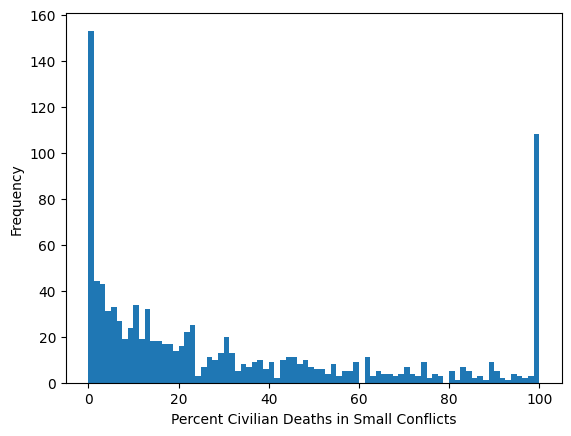

count    1069.000000
mean       32.225086
std        33.248935
min         0.000000
25%         4.878049
50%        19.444444
75%        51.063830
max       100.000000
Name: percent_civilian_deaths, dtype: float64
count    471.000000
mean      26.682183
std       23.443686
min        0.000000
25%        8.655150
50%       20.287298
75%       37.868102
max      100.000000
Name: percent_civilian_deaths, dtype: float64


In [ ]:
ucdp.loc[(ucdp.conflict_deaths>25) & (ucdp.conflict_deaths<1000),'percent_civilian_deaths'].plot.hist(bins=80)
plt.xlabel('Percent Civilian Deaths in Small Conflicts')
plt.show()
print(ucdp.loc[(ucdp.conflict_deaths>25) & (ucdp.conflict_deaths<1000),'percent_civilian_deaths'].describe())
print(ucdp.loc[(ucdp.conflict_deaths>1000),'percent_civilian_deaths'].describe())

In [ ]:
ucdp.conflict_deaths.sum() # 2,910,867

2910867.0

In [ ]:
ucdp.groupby(['ISO'])[['conflict_deaths']].sum().reset_index().sort_values(by='conflict_deaths', ascending=False)

,ISO,conflict_deaths
174,SYR,814784.0
155,RWA,793489.0
0,AFG,316692.0
58,ETH,299973.0
37,COD,257664.0
85,IRQ,126655.0
157,SDN,98508.0
115,MEX,94904.0
190,UKR,90965.0
131,NGA,66396.0


In [ ]:
ucdp.year.min()

1989

In [ ]:
# ucdp.groupby('region')[['conflict_deaths']].agg('sum').reset_index()

# EMDAT

In [ ]:
# emdat_cols = ['Country', 'ISO', 'Start Year','End Year', 'Total Deaths'] #, 'Total Affected'
# emdat = pd.read_excel(wkdir + 'emdat_1990-2022.xlsx',engine='openpyxl', usecols=emdat_cols) # converted xlsx to csv because too slow to read
emdat = pd.read_csv(wkdir + 'emdat_1990-2022.csv')
emdat.dropna(subset=['Total Deaths'], inplace=True)
emdat.rename(columns={'Country': 'country', 'Total Deaths': 'emdat_deaths',
                      'Total Affected':'emdat_affected', 'Start Year': 'emdat_start', 'End Year': 'year'}, inplace=True)
## aggregating deaths
## SHOULDNT USE DEATHS THEY ARE ALREADY INCLUDED IN GBD
emdat = emdat.groupby(['ISO', 'year'])[['emdat_deaths']].agg('sum').reset_index() #, 'emdat_affected'
# emdat.drop(columns=['emdat_start', 'country'], inplace=True)

In [ ]:
set(country_iso.values())

{'AFG',
 'AGO',
 'ALB',
 'AND',
 'ARE',
 'ARG',
 'ARM',
 'ASM',
 'ATG',
 'AUS',
 'AUT',
 'AZE',
 'BDI',
 'BEL',
 'BEN',
 'BFA',
 'BGD',
 'BGR',
 'BHR',
 'BHS',
 'BIH',
 'BLR',
 'BLZ',
 'BMU',
 'BOL',
 'BRA',
 'BRB',
 'BRN',
 'BTN',
 'BWA',
 'CAF',
 'CAN',
 'CHE',
 'CHL',
 'CHN',
 'CIV',
 'CMR',
 'COD',
 'COG',
 'COK',
 'COL',
 'COM',
 'CPV',
 'CRI',
 'CUB',
 'CYP',
 'CZE',
 'DEU',
 'DJI',
 'DMA',
 'DNK',
 'DOM',
 'DZA',
 'ECU',
 'EGY',
 'ERI',
 'ESP',
 'EST',
 'ETH',
 'FIN',
 'FJI',
 'FRA',
 'FSM',
 'GAB',
 'GBR',
 'GEO',
 'GHA',
 'GIN',
 'GMB',
 'GNB',
 'GNQ',
 'GRC',
 'GRD',
 'GRL',
 'GTM',
 'GUM',
 'GUY',
 'HND',
 'HRV',
 'HTI',
 'HUN',
 'IDN',
 'IND',
 'IRL',
 'IRN',
 'IRQ',
 'ISL',
 'ISR',
 'ITA',
 'JAM',
 'JOR',
 'JPN',
 'KAZ',
 'KEN',
 'KGZ',
 'KHM',
 'KIR',
 'KNA',
 'KOR',
 'KWT',
 'LAO',
 'LBN',
 'LBR',
 'LBY',
 'LCA',
 'LKA',
 'LSO',
 'LTU',
 'LUX',
 'LVA',
 'MAR',
 'MCO',
 'MDA',
 'MDG',
 'MDV',
 'MEX',
 'MHL',
 'MKD',
 'MLI',
 'MLT',
 'MMR',
 'MNE',
 'MNG',
 'MNP',
 'MOZ',


In [ ]:
### the basic assumption is that all ISO's and years within 1990-2019 not covered by emdat have disaster deaths == 0
# Create a DataFrame with all combinations of ISO codes and years from 1990 to 2019
iso_years = pd.MultiIndex.from_product([set(country_iso.values()), range(1990, 2020)], names=['ISO', 'year'])
full_df = pd.DataFrame(index=iso_years).reset_index()
emdat = full_df.merge(emdat, on=['ISO', 'year'], how='left')
# Fill missing values in 'emdat_deaths' column with 0
emdat['emdat_deaths'].fillna(0, inplace=True)

In [ ]:
emdat = emdat[(emdat.year >= 1990) & (emdat.year <= 2019)]
emdat['sex'] = 'both'
emdat['cause'] = 'All causes'
emdat

,ISO,year,emdat_deaths,sex,cause
0,GRC,1990,4.0,both,All causes
1,GRC,1991,71.0,both,All causes
2,GRC,1992,0.0,both,All causes
3,GRC,1993,1.0,both,All causes
4,GRC,1994,24.0,both,All causes
...,...,...,...,...,...
6115,KEN,2015,27.0,both,All causes
6116,KEN,2016,308.0,both,All causes
6117,KEN,2017,185.0,both,All causes
6118,KEN,2018,227.0,both,All causes


# GBD life tables & population

we're taking only the no shock life expectancy for countries (rather than other types of regions) for now

In [ ]:
# gbd_lt_columns = ['location_id','location_name', 'sex_name', 'age_group_name', 'year_id', 'measure_name', 'metric_name', 'val', 'upper', 'lower']
# # gbd_life_tables_wshock = pd.read_csv(wkdir + 'GBD_2019_life tables/' + 'gbd_life_tables_wshock.csv', usecols=gbd_lt_columns)
# gbd_life_tables_noshock = pd.read_csv(wkdir + 'GBD_2019_life tables/' + 'gbd_life_tables_noshock.csv', usecols=gbd_lt_columns)
# # drop georgia the US state
# gbd_life_tables_noshock = gbd_life_tables_noshock[(gbd_life_tables_noshock.location_name!='Georgia') & (gbd_life_tables_noshock.location_id!=533)]
# gbd_life_tables_noshock.drop(columns=['location_id'], inplace=True)

In [ ]:
# gbd_life_tables_noshock['ISO'] = gbd_life_tables_noshock.location_name.map(country_iso)
# gbd_life_tables_noshock = gbd_life_tables_noshock[gbd_life_tables_noshock.ISO.notnull()]
# gbd_life_tables_noshock.rename(columns={'val': 'gbd_life_expectancy_est'}, inplace=True)
# gbd_life_tables_noshock = gbd_life_tables_noshock[gbd_life_tables_noshock.measure_name== 'Life expectancy no-shock with hiv']
# gbd_life_tables_noshock.drop(columns=['metric_name', 'upper', 'lower', 'measure_name'], inplace=True)

getting population estimates per country and age group


In [ ]:
# popcols = ['location_id', 'location_name', 'sex_name', 'age_group_name', 'year_id', 'measure_name','val']
# gbd_population_agegroups = pd.read_csv(wkdir + 'GBD_population estimates/gbd_population_agegroups.csv', usecols=popcols)
# # we need to drop georgia US state from population data
# # georgia the country: print(gbd_population_agegroups[(gbd_population_agegroups.location_name=='Georgia') & (gbd_population_agegroups.location_id==35) & (gbd_population_agegroups.sex_name=='both')].groupby(['year_id'])[['val']].agg('sum'))
# len(gbd_population_agegroups) # 2855250
# len(gbd_population_agegroups.dropna()) # 2855250
# gbd_population_agegroups = gbd_population_agegroups[(gbd_population_agegroups.location_name!='Georgia') & (gbd_population_agegroups.location_id!=533)]
# # keep only the countries
# gbd_population_agegroups['ISO'] = gbd_population_agegroups.location_name.map(country_iso)
# gbd_population_agegroups = gbd_population_agegroups[gbd_population_agegroups.ISO.notnull()]

In [ ]:
# ## get total population
# total_pop = gbd_population_agegroups[(gbd_population_agegroups.age_group_name == 'All Ages')]
# total_pop.drop(columns=['location_id', 'measure_name', 'location_name', 'age_group_name'], inplace=True)
# total_pop.rename(columns={'year_id': 'year','sex_name': 'sex', 'val': 'gbd_pop_est'}, inplace=True)
# total_pop.to_csv(wkdir + 'GBD_2019_life tables/' + 'gbd_total_pop_1990-2019.csv', index=False)

In [ ]:
# gbd_life_tables_noshock.rename(columns={'year_id': 'year', 'sex_name': 'sex'}, inplace=True)
# gbd_life_tables_noshock = gbd_life_tables_noshock[(gbd_life_tables_noshock.year >= 1988) & (gbd_life_tables_noshock.year <= 2021)]
# gbd_life_tables_noshock = gbd_life_tables_noshock.merge(total_pop, on=['ISO', 'year', 'sex'])

In [ ]:
# gbd_life_tables_noshock['yearly_country_u1_life_exp_gdb_est'] = gbd_life_tables_noshock.loc[gbd_life_tables_noshock['age_group_name'] == '<1 year', 'gbd_life_expectancy_est']
# gbd_life_tables_noshock.drop(columns=['gbd_life_expectancy_est'], inplace=True)
# # ### median is just an awkward helper there are really no values to compare
# fill_values = gbd_life_tables_noshock.dropna().groupby(['ISO', 'year', 'sex'])['yearly_country_u1_life_exp_gdb_est'].median().to_dict()
# gbd_life_tables_noshock['yearly_country_sexspecific_u1_life_exp_gdb_est'] = gbd_life_tables_noshock.apply(lambda x: fill_values.get((x['ISO'], x['year'], x['sex'])) if pd.isna(x['yearly_country_u1_life_exp_gdb_est']) else x['yearly_country_u1_life_exp_gdb_est'], axis=1)
# gbd_life_tables_noshock.drop(columns=['yearly_country_u1_life_exp_gdb_est'], inplace=True)
# gbd_life_tables_noshock.drop(columns=['age_group_name'], inplace=True)
# gbd_life_tables_noshock = gbd_life_tables_noshock.drop_duplicates()
# gbd_life_tables_noshock[(gbd_life_tables_noshock.ISO=='CHN') & (gbd_life_tables_noshock.year==1990)]

In [ ]:
# gbd_life_tables_noshock.drop(columns=['location_name'], inplace=True)
# gbd_life_tables_noshock.to_csv(wkdir + 'GBD_2019_life tables/' + 'gbd_noshock_life_expectancy_country_pop_1988-2019.csv', index=False)
gbd_life_tables_noshock = pd.read_csv(wkdir + 'GBD_2019_life tables/' + 'gbd_noshock_life_expectancy_country_pop_1988-2019.csv')
gbd_life_tables_noshock['cause'] = 'All causes'

# GBD health care access & spending & IHME education & SDI & Fertility & health coverage & health workers & MCI & health industry workers

health care access was dropped after investigation because it doesn't contain yearly data; methodologically it would also have created some issues in that GBD mortality data (on specific diseases) is used to estimate HAQ

IHR (International Health Regulations) from WHO (via OURWORLDINDATA) was dropped since the WHO regulations were decided in 2005 with reporting beginning in 2010

median age from ourworldindata was dropped in favor of world bank data age-dependency ratio

In [ ]:
extension = 'GBD education_healthcare access_spending/'

In [ ]:
### SDI & Fertility based on GBD
# composite indicator of development status strongly correlated with health outcomes.
# It is the geometric mean of 0 to 1 indices of total fertility rate under the age of 25 (TFU25),
# mean education for those ages 15 and older (EDU15+), and lag distributed income (LDI) per capita. As a composite,
# a location with an SDI of 0 would have a theoretical minimum level of development
# relevant to health, while a location with an SDI of 1 would have a theoretical maximum level.
!pip install --quiet unidecode
from unidecode import unidecode
sdi = pd.read_csv(wkdir+extension+'IHME_GBD_2019_SDI_1990_2019_Y2020M10D15.csv', encoding='utf8')
sdi.drop(104, inplace=True) # drop Georgia the US state
sdi = sdi.melt(id_vars='Location', var_name='year', value_name='gbd_sdi')
sdi['sex'] = 'both'
sdi.year = pd.to_numeric(sdi.year)
# the country Mexico is duplicated in English and Spanish spelling
sdi = sdi[sdi.Location!='México']
sdi.Location = sdi.Location.apply(lambda x: unidecode(x))
sdi['ISO'] = sdi.Location.map(country_iso)
sdi = sdi[sdi.ISO.notnull()]
sdi.drop(columns=['Location'], inplace=True)
sdi.year = sdi.year.astype(int)
sdi = sdi[(sdi.year >= 1988) & (sdi.year<=2019)]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.5/235.5 kB 7.4 MB/s eta 0:00:00


In [ ]:
### population-weighted MEAN TEMP & 5Th quintile of population-weighted rainfall
popnormed_avg_temp = pd.read_csv(wkdir+extension+'IHME_GBD_2019_COV_1980_2019_MEAN_TEMPERATURE_Y2020M07D31.CSV', usecols=['location_id','location_name', 'year_id', 'val'])
popnormed_avg_temp.rename(columns={'year_id': 'year', 'val': 'popnormed_avg_temp'}, inplace=True)
popnormed_5quintile_rain = pd.read_csv(wkdir+extension+'IHME_GBD_2019_COV_1980_2019_RAINFALL_QUINT5_PROP_Y2020M07D31.CSV', usecols=['location_id','location_name', 'year_id', 'val'])
popnormed_5quintile_rain.rename(columns={'year_id': 'year', 'val': 'popnormed_5quintile_rain'}, inplace=True)
gbd_climate = popnormed_avg_temp.merge(popnormed_5quintile_rain, on=['location_id', 'location_name', 'year'])
fertility = pd.read_csv(wkdir+extension+'IHME_GBD_2019_COV_1980_2019_TFR_Y2020M07D31.CSV', usecols=['location_id', 'location_name', 'year_id', 'val'])
fertility.rename(columns={'year_id':'year', 'val':'fertility'}, inplace=True)
gbd_climate = gbd_climate.merge(fertility, on=['location_id', 'location_name', 'year']) # gbd_climate no longer the best variable name, but whatevs
gbd_climate = gbd_climate[gbd_climate.location_id!=533] # excluding US state georgia
gbd_climate['sex'] = 'both'
gbd_climate['ISO'] = gbd_climate.location_name.map(country_iso)
gbd_climate = gbd_climate[gbd_climate.ISO.notnull()]
gbd_climate.drop(columns=['location_id', 'location_name'], inplace=True)
gbd_climate = gbd_climate[(gbd_climate.year >= 1988) & (gbd_climate.year<=2020)]

In [ ]:
### International Health Regulations
### source: https://ourworldindata.org/grapher/ihr-core-capacity-index-sdgs
# ihr = pd.read_csv(wkdir+extension+'ihr-core-capacity-index-sdgs.csv')

In [ ]:
### median age
### source: https://ourworldindata.org/age-structure
# med_age = pd.read_csv(wkdir+extension+'ourworldindata median-age.csv')
# med_age = med_age[(med_age.Year >=1990) & (med_age.Year <=2019)]
# med_age (fillna with estimates if medium not available)

In [ ]:
# #### this wasn't used in the end because only two datapoints exist only for 1990 and 2019
# gbd_haq = pd.read_csv(wkdir+extension+'IHME_GBD_2019_HAQ_1990_2019, 2022.CSV')
# haq = gbd_haq.loc[(gbd_haq.indicator_name=='HAQ Index') & (gbd_haq.haq_index_age_type=='Overall'), ['location_name', 'year_id', 'val']]
# lines = []
# labels = []
# grouped = haq.groupby('location_name')

# for name, group in grouped:
#     x = group['year_id'].tolist()
#     y = group['val'].tolist()
#     # Create a line plot for each location with label
#     line, = plt.plot(x, y, label=name, alpha=0.7, marker='o')
#     lines.append(line)
#     labels.append(name)

# plt.xlabel('year_id')
# plt.ylabel('HAQ')
# plt.title('Developments in HAQ per location_name (1990 & 2019)')
# plt.grid(True)
# plt.legend(lines, labels, bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.show()

In [ ]:
usecols = ['location_id', 'location_name', 'year_id', 'val']
hw = pd.read_csv(wkdir+extension+'IHME_GBD_2019_COV_1980_2019_HEALTH_WORKER_DENSITY_Y2020M07D31.CSV', usecols=usecols)
hw['ISO'] = hw.location_name.map(country_iso)
hw.rename(columns={'location_name': 'country', 'year_id': 'year', 'val':'health_worker_density'}, inplace=True)
hw = hw[(hw.year>=1988) & (hw.year<=2020)]
hw = hw[hw.location_id != 533] # excluding US state georgia
hw.drop(columns=['location_id', 'country'], inplace=True)
hw = hw[hw.ISO.notnull()]

hc = pd.read_csv(wkdir+extension+'IHME_GBD_2019_COV_1980_2019_UNIVERSAL_HEALTH_COVERAGE_Y2020M07D31.CSV', usecols=usecols)
hc['ISO'] = hc.location_name.map(country_iso)
hc.rename(columns={'location_name': 'country', 'year_id': 'year', 'val':'health_coverage'}, inplace=True)
hc = hc[(hc.year>=1988) & (hc.year<=2020)]
hc = hc[hc.location_id != 533] # excluding US state georgia
hc.drop(columns=['location_id', 'country'], inplace=True)
hc = hc[hc.ISO.notnull()]

# # mci = pd.read_csv(wkdir+extension+'IHME_GBD_2019_COV_1980_2019_MCI_Y2020M07D31.CSV', usecols=usecols)
# # mci['ISO'] = mci.location_name.map(country_iso)
# # mci.rename(columns={'location_name': 'country', 'year_id': 'year', 'val':'mci'}, inplace=True)
# # mci = mci[(mci.year>=1988) & (mci.year<=2019)]
# # mci.drop(columns=['location_id', 'country'], inplace=True)
# # mci = mci[mci.ISO.notnull()]

hi = pd.read_csv(wkdir+extension+'IHME_GBD_2019_COV_1980_2019_IND_HEALTH_Y2020M07D31.CSV', usecols=usecols)
hi['ISO'] = hi.location_name.map(country_iso)
hi.rename(columns={'location_name': 'country', 'year_id': 'year', 'val':'health_industry_workers'}, inplace=True)
hi = hi[(hi.year>=1988) & (hi.year<=2020)]
hi = hi[hi.location_id != 533] # excluding US state georgia
hi.drop(columns=['location_id', 'country'], inplace=True)
hi = hi[hi.ISO.notnull()]

print(len(hw))
health = hw.merge(hc, on=['ISO', 'year'])
print(len(health))
# # health = health.merge(mci, on=['ISO', 'year'])
# # print(len(health))
health = health.merge(hi, on=['ISO', 'year'])
print(len(health))
health['sex'] = 'both'

6528
6528
6528


In [ ]:
allage_educ = pd.read_csv(wkdir + 'education/IHME_GBD_2019_COV_1980_2019_EDUCATION_ALL_AGES_AND_SEXES_PC_Y2020M07D31.CSV', usecols=['location_name', 'location_id', 'year_id', 'val'])
allage_educ.rename(columns={'year_id': 'year', 'val': 'allage_educ'}, inplace=True)
allage_educ['ISO'] = allage_educ.location_name.map(country_iso)
allage_educ = allage_educ[allage_educ.location_id!=533] # excluding US state georgia
allage_educ = allage_educ[allage_educ.year.isin(list(range(1989, 2021)))]
allage_educ.drop(columns=['location_id', 'location_name'], inplace=True)
allage_educ = allage_educ[allage_educ.ISO.notnull()]
allage_educ['sex'] = 'both'

In [ ]:
ihme_gdppc = pd.read_csv(wkdir+ 'IHME_GBD_2019_COV_1980_2019_GDPPC_ID_B2010_Y2020M07D31.CSV', usecols=['location_id', 'location_name', 'year_id', 'val'])
ihme_gdppc.rename(columns={'year_id': 'year', 'val': 'gdp_pc_2010'}, inplace=True)
ihme_gdppc['ISO'] = ihme_gdppc.location_name.map(country_iso)
ihme_gdppc = ihme_gdppc[ihme_gdppc.location_id!=533] # excluding US state georgia
ihme_gdppc = ihme_gdppc[ihme_gdppc.year.isin(list(range(1989, 2021)))]
ihme_gdppc = ihme_gdppc[ihme_gdppc.ISO.notnull()]
ihme_gdppc.drop(columns=['location_id', 'location_name'], inplace=True)
ihme_gdppc['sex'] = 'both'

In [ ]:
ihme_educ = pd.read_csv(wkdir+extension+'IHME_EDUCATION_1970_2030, 2020.CSV')
ihme_educ = ihme_educ[(ihme_educ.measure=='mean_years') & (ihme_educ.year>=1988) & (ihme_educ.year<=2019)]
ihme_educ = ihme_educ[ihme_educ.location_id!=533] # excluding US state georgia
ihme_educ.drop(columns=['location_id','age_group_id', 'age_group', 'sex_id', 'lower', 'upper', 'measure_name', 'metric_name', 'measure'], inplace=True)
ihme_educ.sex = ihme_educ.sex.str.lower()
ihme_educ.rename(columns={'mean': 'ihme_mean_adult_educ'},inplace=True)

hexp_cols=['iso3', 'level', 'year', 'the_total_ppp_mean', 'location_name']
gbd_hexp = pd.read_csv(wkdir+extension+'IHME_HEALTH_SPENDING_1995_2018, 2021.CSV', encoding='latin-1', usecols=hexp_cols)
gbd_hexp = gbd_hexp[gbd_hexp.level=='Country']
gbd_hexp.drop(columns=['level'], inplace=True)
gbd_hexp.rename(columns={'the_total_ppp_mean': 'ihme_ppp_mean_hexp'}, inplace=True)

ihme_educ['ISO'] = ihme_educ.location_name.map(country_iso)
ihme_educ.drop(columns='location_name', inplace=True)
avg_educ = ihme_educ.groupby(['ISO', 'year'])[['ihme_mean_adult_educ']].mean().reset_index()
avg_educ['sex'] = 'both'
ihme_educ = pd.concat([ihme_educ, avg_educ])
gbd_hexp['ISO'] = gbd_hexp['iso3']
gbd_hexp['sex'] = 'both'
gbd_hexp.drop(columns=['location_name', 'iso3'], inplace=True)
gbd_educ_hexp = ihme_educ.merge(gbd_hexp, on=['ISO', 'year', 'sex'], how='outer')
print(len(gbd_educ_hexp))
gbd_educ_hexp = gbd_educ_hexp.merge(gbd_climate, on=['ISO', 'year', 'sex'], how='outer')
print(len(gbd_educ_hexp))
gbd_educ_hexp = gbd_educ_hexp.merge(sdi, on=['ISO', 'year', 'sex'], how='outer')
print(len(gbd_educ_hexp))
gbd_educ_hexp = gbd_educ_hexp.merge(health, on=['ISO', 'year', 'sex'], how='outer')
print(len(gbd_educ_hexp))
gbd_educ_hexp = gbd_educ_hexp.merge(allage_educ, on=['ISO', 'year', 'sex'], how='outer')
print(len(gbd_educ_hexp))
gbd_educ_hexp = gbd_educ_hexp.merge(ihme_gdppc, on=['ISO', 'year', 'sex'], how='outer')
print(len(gbd_educ_hexp))
gbd_educ_hexp['cause'] = 'All causes'

18936
19008
19008
19008
19008
19008


In [ ]:
gbd_educ_hexp[(gbd_educ_hexp.sex=='both') & (gbd_educ_hexp.ISO=='SDN')]
len(gbd_educ_hexp[gbd_educ_hexp.ISO=='GEO']) # 96
# len(gbd_educ_hexp[gbd_educ_hexp.ISO=='DEU']) # 96

96

# GBD mortality

In [ ]:
gbd_cols=['location_id','location_name', 'location_id','sex_name','cause_name','year','val',  'upper','lower']
gbd = pd.read_csv('/content/gdrive/MyDrive/Genocide/Deprivation of capabilities, Mortality, Demography, Ecocide/GBD, WDI, UCDP data/GBD_1990-2019_allages_allcause_lvl1_mortality_country/GBD_1990-2019_allages_allcause_lvl1_mortality_country.csv', usecols=gbd_cols)
gbd = gbd[gbd.location_id!=533] # excluding US state georgia
gbd.drop(columns='location_id', inplace=True)
gbd.rename(columns={'location_name':'country', 'sex_name':'sex','cause_name': 'cause', 'val':'all_age_deaths'}, inplace=True)

In [ ]:
## removing conflict deaths from total deaths
allcause = gbd[gbd.cause=='All causes']
conflict = gbd[gbd.cause=='Conflict and terrorism']
merged_df = pd.merge(allcause, conflict, on=['country', 'sex', 'year'])
merged_df['all_cause_conflict_removed'] = merged_df['all_age_deaths_x'] - merged_df['all_age_deaths_y']
merged_df['lower_conflict_removed'] = merged_df['lower_x'] - merged_df['lower_y']
merged_df['upper_conflict_removed'] = merged_df['upper_x'] - merged_df['upper_y']
merged_df = merged_df.drop(columns=['all_age_deaths_x', 'upper_x', 'lower_x', 'all_age_deaths_y', 'upper_y', 'lower_y', 'cause_y'])
gbd = pd.merge(gbd, merged_df, left_on=['country','sex','year', 'cause'], right_on=['country','sex','year', 'cause_x'], how='left')
gbd = gbd[gbd['cause'] != 'Conflict and terrorism']
gbd.drop(columns=['cause_x'], inplace=True)

In [ ]:
gbd['ISO'] = gbd.country.map(country_iso)

In [ ]:
gbd[gbd.ISO.isnull()]

,country,sex,cause,year,all_age_deaths,upper,lower,all_cause_conflict_removed,lower_conflict_removed,upper_conflict_removed,ISO


In [ ]:
# making sure that all the columns with conflict removed with NaNs are filled with simply all_age_deaths,lower,	upper
gbd[['all_cause_conflict_removed', 'lower_conflict_removed', 'upper_conflict_removed']] = gbd[['all_cause_conflict_removed', 'lower_conflict_removed', 'upper_conflict_removed']].astype(str)
gbd[['all_cause_conflict_removed',
     'lower_conflict_removed',
     'upper_conflict_removed']] = gbd.loc[:, ['all_cause_conflict_removed',
                                    'lower_conflict_removed', 'upper_conflict_removed']].apply(lambda x: x.replace('nan', '-1'))
gbd[['all_cause_conflict_removed', 'lower_conflict_removed', 'upper_conflict_removed']] = gbd[['all_cause_conflict_removed', 'lower_conflict_removed', 'upper_conflict_removed']].astype(float)
gbd[['all_cause_conflict_removed',
     'lower_conflict_removed',
     'upper_conflict_removed']] = gbd[['all_cause_conflict_removed',
                                       'lower_conflict_removed',
                                       'upper_conflict_removed']].fillna(gbd[[
                                                                          'all_age_deaths', 'lower', 'upper']])
mask = (gbd['all_cause_conflict_removed'] == -1.0) | (gbd['lower_conflict_removed'] == -1.0) | (gbd['upper_conflict_removed'] == -1.0)

gbd.loc[mask, 'all_cause_conflict_removed'] = gbd.loc[mask, 'all_age_deaths']
gbd.loc[mask, 'lower_conflict_removed'] = gbd.loc[mask, 'lower']
gbd.loc[mask, 'upper_conflict_removed'] = gbd.loc[mask, 'upper']
gbd[gbd.all_cause_conflict_removed < gbd.all_age_deaths]

,country,sex,cause,year,all_age_deaths,upper,lower,all_cause_conflict_removed,lower_conflict_removed,upper_conflict_removed,ISO
0,Haiti,Male,All causes,1990,1883.035795,2033.039192,1718.991999,1882.685527,1718.669769,2032.658647,HTI
1,Haiti,Female,All causes,1990,1714.085523,1856.755124,1567.973653,1713.940415,1567.840160,1856.597474,HTI
2,Haiti,Both,All causes,1990,1792.261465,1917.235927,1652.158684,1792.020157,1651.936692,1916.973761,HTI
18,Timor-Leste,Male,All causes,1990,1374.642862,1544.692039,1253.166962,1337.067931,1219.049170,1503.348893,TLS
19,Timor-Leste,Female,All causes,1990,1324.212183,1467.386108,1211.943150,1308.477590,1197.656243,1450.073566,TLS
...,...,...,...,...,...,...,...,...,...,...,...
91771,Russian Federation,Female,All causes,2019,605.459459,700.862993,518.929508,605.451079,518.921898,700.853772,RUS
91772,Russian Federation,Both,All causes,2019,811.517544,906.532434,728.785124,811.503352,728.772238,906.516819,RUS
91776,United Republic of Tanzania,Male,All causes,2019,1198.894730,1340.658205,1062.529187,1198.845824,1062.484780,1340.604394,TZA
91777,United Republic of Tanzania,Female,All causes,2019,950.866629,1055.675326,862.745887,950.845980,862.727139,1055.652607,TZA


# V-DEM

In [ ]:
vdem_cols = ['country_text_id',	'year', 'v2x_polyarchy'] # 'country_name', 'v2x_mpi', 'v2x_api'
vdem = pd.read_csv(wkdir + 'V-Dem/' + 'V-Dem-CY-Core-v13.csv', usecols=vdem_cols)

In [ ]:
# import textwrap
# print(textwrap.fill(', '.join([c for c in vdem.columns])))
vdem = vdem[(vdem.year>=1990)&(vdem.year <=2019)]
vdem.rename(columns={'country_text_id': 'ISO'}, inplace=True)
vdem['sex'] = 'both'
vdem['cause'] = 'All causes'

#### checking for missing values ####
# vdem[vdem.v2x_polyarchy.isnull()]
# # country_name	country_text_id	country_id	year	v2x_polyarchy
# # 17662	Kazakhstan	KAZ	121	1990	NaN
# # 19159	Turkmenistan	TKM	136	1990	NaN

# vdem.country_name.unique()

In [ ]:
vdem

,ISO,year,v2x_polyarchy,sex,cause
201,MEX,1990,0.396,both,All causes
202,MEX,1991,0.418,both,All causes
203,MEX,1992,0.441,both,All causes
204,MEX,1993,0.451,both,All causes
205,MEX,1994,0.472,both,All causes
...,...,...,...,...,...
26148,ZZB,2015,0.305,both,All causes
26149,ZZB,2016,0.270,both,All causes
26150,ZZB,2017,0.267,both,All causes
26151,ZZB,2018,0.268,both,All causes


# POLITY

In [ ]:
polity_cols = ['scode', 'year', 'polity2']
polity = pd.read_excel(wkdir+'Polity/p5v2018.xls', usecols=polity_cols)
polity = polity[(polity.year>=1990) & (polity.year <= 2019)]
polity.rename(columns={'scode':'ISO'}, inplace=True)
polity['sex'] = 'both'
polity['cause'] = 'All causes'
polity

,ISO,year,polity2,sex,cause
190,AFG,1990,-8.0,both,All causes
191,AFG,1991,-8.0,both,All causes
192,AFG,1992,0.0,both,All causes
193,AFG,1993,0.0,both,All causes
194,AFG,1994,0.0,both,All causes
...,...,...,...,...,...
17569,ZIM,2014,4.0,both,All causes
17570,ZIM,2015,4.0,both,All causes
17571,ZIM,2016,4.0,both,All causes
17572,ZIM,2017,4.0,both,All causes


# GBD all lvl1n2 causes, sexes, ages

In [ ]:
directory_path = '/content/gdrive/MyDrive/Genocide/Deprivation of capabilities, Mortality, Demography, Ecocide/GBD, WDI, UCDP data/'
extension = 'GBD_1990-2019_LVL2_CAUSE_MORTALITY_COUNTRY_REGION_CONFLICT_SEXES_AGES/gbd_lvl1n2_causes_country_conflict_ages.csv'
gbd_causes = pd.read_csv(directory_path + extension)
gbd_causes = gbd_causes[gbd_causes.location_id!=533] # just to make sure that US state georgia is gone
gbd_causes['ISO'] = gbd_causes.location_name.map(country_iso)
gbd_causes.rename(columns={'val': 'mortality', 'upper': 'upper_mortality', 'lower': 'lower_mortality', 'sex_name': 'sex', 'age_name': 'age'}, inplace=True)
gbd_causes.drop(columns=['measure_name', 'location_id'], inplace=True)
gbd_causes.sex = gbd_causes.sex.str.lower()

In [ ]:
gbd_causes.columns

Index(['location_name', 'sex', 'age', 'cause_name', 'year',
       'allcause_mortality_popnormed', 'upper_mortality', 'lower_mortality',
       'ISO'],
      dtype='object')

In [ ]:
gbd_causes[gbd_causes.ISO.isnull()]
## removing conflict deaths from total deaths
allcause = gbd_causes[gbd_causes.cause_name=='All causes']
conflict = gbd_causes[gbd_causes.cause_name=='Conflict and terrorism']
merged_df = pd.merge(allcause, conflict, on=['ISO', 'sex', 'year', 'age'])
merged_df['all_cause_conflict_removed'] = merged_df['allcause_mortality_popnormed_x'] - merged_df['allcause_mortality_popnormed_y']
merged_df['lower_conflict_removed'] = merged_df['lower_mortality_x'] - merged_df['lower_mortality_y']
merged_df['upper_conflict_removed'] = merged_df['upper_mortality_x'] - merged_df['upper_mortality_y']
merged_df.drop(columns=['location_name_x', 'upper_mortality_x', 'lower_mortality_x','location_name_y', 'cause_name_y',
                        'allcause_mortality_popnormed_y','allcause_mortality_popnormed_x', 'upper_mortality_y','lower_mortality_y'], inplace=True)
merged_df.rename(columns={'cause_name_x': 'cause'}, inplace=True)

In [ ]:
merged_df.columns

Index(['sex', 'age', 'cause', 'year', 'ISO', 'all_cause_conflict_removed',
       'lower_conflict_removed', 'upper_conflict_removed'],
      dtype='object')

In [ ]:
gbd_causes[gbd_causes=='All causes'].sort_values(by=['ISO', 'year', 'sex', 'age'])[['allcause_mortality_popnormed', 'upper_mortality', 'lower_mortality']] = merged_df.sort_values(by=['ISO', 'year', 'sex', 'age'])[['all_cause_conflict_removed','lower_conflict_removed', 'upper_conflict_removed']]

# ACLED

In [ ]:
usecols = ['year', 'fatalities', 'iso', 'population_best'] # latitude, longitude, notes <= for additional info quite richly annotated
acled = []
for file_name in os.listdir(wkdir + 'ACLED/'):
    if file_name.endswith('.csv'):
        file_path = os.path.join(wkdir + 'ACLED/', file_name)
        acled.append(pd.read_csv(file_path, usecols=usecols, sep=';'))
acled = pd.concat(acled)
acled.rename(columns={'fatalities': 'acled_deaths', 'population_best': 'pop_exposure'}, inplace=True)
acled['ISO'] = acled.iso.map(iso_numeric_letter)
acled.drop(columns=['iso'], inplace=True)

In [ ]:
# acled_grp = acled.groupby(['ISO', 'year'])[['acled_deaths']].sum().reset_index()
# acled_grp = multiix.merge(acled_grp, on=['ISO', 'year'], how='outer')
# acled_grp.loc[acled_grp.acled_deaths.isnull() & acled_grp.year>=1997, 'acled_deaths'] = 0
# ucdp.merge(acled_grp, on=['ISO', 'year'])[['conflict_deaths', 'acled_deaths']].corr() # pearson correlation only 0.631406
# acled_grp.acled_deaths.sum() # ACLED records 4,574,945 (which is 1.5 mio more than UCDP reports for a longer time period)

,conflict_deaths,acled_deaths
conflict_deaths,1.000000,0.631406
acled_deaths,0.631406,1.000000


In [ ]:
acled_grp.groupby(['ISO'])[['acled_deaths']].sum().reset_index().sort_values(by='acled_deaths', ascending=False).head(50)

,ISO,acled_deaths
201,SYR,522434.0
1,AFG,401393.0
231,YEM,325734.0
42,COD,325366.0
2,AGO,288092.0
153,NGA,238444.0
181,SDN,226291.0
100,IRQ,212231.0
218,UKR,188937.0
189,SOM,155395.0


In [ ]:
# acled = acled.groupby(['ISO', 'year'])[['acled_deaths']].sum().reset_index()
# acled['sex'] = 'both'
# acled['cause'] = 'All causes'
acled['acled_popnormed'] = acled.acled_deaths / (acled.pop_exposure + 1) * 1000
acled.groupby(['ISO', 'year'])[['acled_deaths', 'pop_exposure', 'acled_popnormed']].sum().reset_index().sort_values(by='popnormed_deaths', ascending=False).head(50)

,ISO,year,acled_deaths,population_best,popnormed_deaths
1850,UKR,2024,55259,4.661237e+08,733035.326372
1925,YEM,2023,6439,5.481837e+07,370142.107289
1922,YEM,2020,39531,8.079214e+07,344479.787228
1234,MMR,2023,32024,4.165046e+08,243356.799977
1923,YEM,2021,36795,6.673335e+07,241802.871039
1849,UKR,2023,62938,8.405986e+08,209878.561840
1233,MMR,2022,39477,5.898000e+08,196740.053538
1848,UKR,2022,67610,1.299422e+09,136475.258183
1924,YEM,2022,14307,6.987035e+07,89990.728819
1211,MLI,2020,5708,3.008543e+07,76806.183819


In [ ]:
sub = acled[['ISO', 'year', 'fatalities', 'population_best']]
sub['exposure'] = sub.fatalities * sub.population_best
sub['popnormeddeaths'] = sub.fatalities / (sub.population_best + 1) * 1000
expo = sub[sub.year>=2010].groupby(['ISO', 'year'])[['fatalities','exposure', 'population_best', 'popnormeddeaths']].sum().reset_index().sort_values(by='exposure', ascending=False)
expo.iloc[np.argsort(expo.popnormeddeaths)[-100:]]


<ipython-input-70-3bec3b465627>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub['exposure'] = sub.fatalities * sub.population_best
<ipython-input-70-3bec3b465627>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub['popnormeddeaths'] = sub.fatalities / (sub.population_best + 1) * 1000


,ISO,year,fatalities,exposure,population_best,popnormeddeaths
323,LBN,2022,6,83569.0,5034174.0,83.920021
609,TGO,2022,81,613011.0,784922.0,92.690275
84,BWA,2021,305,3182608.0,7305711.0,94.340157
11,AGO,2021,150,6327174.0,19284003.0,105.487777
86,BWA,2023,200,1589731.0,3117510.0,110.401154
668,UGA,2022,363,4712083.0,9053811.0,111.969059
669,UGA,2023,367,6552529.0,8263858.0,115.047039
190,DZA,2023,14,888264.0,8199810.0,125.576373
28,BFA,2023,228,2675527.0,3175220.0,126.579353
39,BGR,2020,7,35724.0,93000.0,129.389289


In [ ]:
acled.groupby('ISO')[['acled_deaths']].sum().reset_index().sort_values(by='acled_deaths', ascending=False)

KeyError: "Columns not found: 'acled_deaths'"

# epidemics & AIDS

article:
https://www.nature.com/articles/s41597-022-01797-2#Sec6

data:
https://figshare.com/articles/dataset/A_global_dataset_of_pandemic-_and_epidemic-prone_disease_outbreaks/17207183/2

unfortunately these data start at 1996 and go past 2019
this means that including epidemic in the covars will result in a decent amount of missing data, but this may be worth it to reduce heteroskedasticity (which we have). since aids and epidemics are particularly relevant for africa anyway and since we'll run specialised models with ucdp and acled data (the latter only starts later anyway) including epidemics here may be worth it.

the aids data is straight from GBD 1990-2019 and is the % of total deaths attributable to aids. I'm using the 5 years of peak deaths from aids as a boolean which signals at that there's an aids epidemic and not otherwise.

In [ ]:
epidemics = pd.read_csv('/content/gdrive/MyDrive/Genocide/Deprivation of capabilities, Mortality, Demography, Ecocide/GBD, WDI, UCDP data/epidemics/DiseaseOutbreaks/Outbreaks.csv', usecols=['iso3', 'Year'])
# # epidemics[epidemics.icd103n.str.contains('AIDS|HIV', regex=True, case=False) | epidemics.icd104n.str.contains('AIDS|HIV', regex=True, case=False)]
# epidemics[epidemics.iso3.isin(['ZWE', 'CAF', 'BWA', 'RWA']) & (epidemics.Year <=2019)]
epidemics['epidemics'] = 1
epidemics = epidemics[epidemics.Year <=2019]
tmp = pd.DataFrame(index=pd.MultiIndex.from_product([list(set(country_iso.values())), list(range(1996, 2020))])).reset_index(names=['ISO', 'year'])
epidemics = tmp.merge(epidemics, left_on=['ISO', 'year'], right_on=['iso3', 'Year'], how='outer')
epidemics.epidemics = epidemics.epidemics.fillna(0)
epidemics.drop(columns=['iso3', 'Year'], inplace=True)
epidemics = epidemics.dropna()

In [ ]:
aids = pd.read_csv('/content/gdrive/MyDrive/Genocide/Deprivation of capabilities, Mortality, Demography, Ecocide/GBD, WDI, UCDP data/epidemics/share-deaths-aids.csv')
max_deaths_idx = aids.sort_values(by=['Code', 'Deaths - HIV/AIDS - Sex: Both - Age: All Ages (Percent)'], ascending=[True, False])
max_deaths_rows = max_deaths_idx.groupby('Code').head(5)[['Code', 'Year']]
max_deaths_rows.rename(columns={'Code':'ISO', 'Year': 'year'}, inplace=True)
max_deaths_rows['aids5'] = 1
epidemics = epidemics.merge(max_deaths_rows, on=['ISO', 'year'], how='outer')
epidemics.aids5 = epidemics.aids5.fillna(0)
epidemics['African'] = (epidemics.ISO.map(africanisos)=='Africa')*1
epidemics = epidemics.drop_duplicates()
aids.drop(columns=['Entity'], inplace=True)
aids.rename(columns={'Code': 'ISO', 'Year': 'year', 'Deaths - HIV/AIDS - Sex: Both - Age: All Ages (Percent)': 'aids_deaths'}, inplace=True)
epidemics = aids.merge(epidemics, on=['ISO', 'year'])
epidemics['cause'] = 'All causes'
epidemics['sex'] = 'both'
epidemics

In [ ]:
epidemics['aids5_africa'] = np.where((epidemics.African==1) & (epidemics.aids5==1), 1, 0)
epidemics['aids5_nonafrica'] = np.where((epidemics.African==0) & (epidemics.aids5==1), 1, 0)
epidemics.drop(columns=['African'], inplace=True)
epidemics[epidemics.aids5_africa==1]

# Development aid

In [ ]:
# source: https://ourworldindata.org/grapher/net-oda-per-capita?time=1983

In [ ]:
f = '/content/gdrive/MyDrive/Genocide/Deprivation of capabilities, Mortality, Demography, Ecocide/GBD, WDI, UCDP data/pet capita development aid, current USD, 1960-2020.csv'
dev = pd.read_csv(f)
# dev['Africa'] = dev.Code.map(africanisos)
# africanaid = dev[dev.Africa.notna()]
# africanaid[(africanaid.Year >= 1994)].groupby(['Entity', 'Code'])['Net ODA received per capita (current US$)'].sum().reset_index(name='total_ODA').sort_values(by='total_ODA', ascending=False).reset_index()
# dev[(dev.Year >= 1979)].groupby(['Entity', 'Code'])['Net ODA received per capita (current US$)'].sum().reset_index(name='total_ODA').sort_values(by='total_ODA', ascending=False).reset_index()
# np.log(df['Net ODA received per capita (current US$)'] - df['Net ODA received per capita (current US$)'].min() + 1).describe()
dev.drop(columns=['Entity'], inplace=True)
dev.rename(columns={'Code': 'ISO', 'Year': 'year', 'Net ODA received per capita (current US$)':'dev_aid'}, inplace=True)
dev['sex'] = 'both'
dev['cause'] = 'All causes'
print(len(dev))
dev = dev[dev['year'] >= 1989]
print(len(dev))

9292
5118


In [ ]:
print(len(dev.ISO.unique()))
print(set(country_iso.values()) - set(dev.ISO.unique()))
print(len(set(country_iso.values())))

171
{'ROU', 'NZL', 'CZE', 'GBR', 'RUS', 'HUN', 'SWE', 'CAN', 'TWN', 'NOR', 'AUT', 'GUM', 'JPN', 'PRT', 'IRL', 'TKL', 'DNK', 'LTU', 'LVA', 'NIU', 'POL', 'ESP', 'NLD', 'BEL', 'GRL', 'BGR', 'GRC', 'VIR', 'USA', 'DEU', 'ASM', 'FRA', 'PRI', 'EST', 'ITA', 'LUX', 'SMR', 'AUS', 'AND', 'FIN', 'COK', 'CHE', 'ISL', 'MCO', 'SVK'}
204


# join and process all data

### join the data

**datasets**
- gbd_causes
- gbd
- ucdp
- wdi
- who
- emdat
- vdem
- polity
- gbd_life_tables_noshock
- gbd_educ_hexp
- acled
- epidemics

dropped: dev (in favor of wdi indicators)

#### join all-cause data

In [ ]:
len(ucdp.ISO.isin(gbd.ISO.unique())) * len(gbd.sex.unique()) * len(gbd.cause.unique())
# result is 20592 which is, as expected, the length of the merge operation

75888

In [ ]:
# some changes in the names of columns in preparation for the merge
gbd.sex = gbd.sex.str.lower()
gbd.rename(columns={'upper': 'all_age_deaths_upper', 'lower': 'all_age_deaths_lower'}, inplace=True)

In [ ]:
merged_df = gbd.merge(gbd_life_tables_noshock, on=['ISO', 'year', 'sex', 'cause'], how='outer')
print(len(merged_df))
merged_df = ucdp.merge(merged_df, how='outer', on=['ISO', 'year', 'sex', 'cause'])
print(len(merged_df))
merged_df = merged_df.merge(wdi, how='outer', on=['ISO', 'year', 'sex', 'cause'])
print(len(merged_df))
merged_df = merged_df.merge(who, how='outer', on=['ISO', 'year', 'sex', 'cause'])
print(len(merged_df))
merged_df = merged_df.merge(emdat, how='outer', on=['ISO', 'year', 'sex', 'cause'])
print(len(merged_df))
merged_df = merged_df.merge(vdem, how='outer', on=['ISO', 'year', 'sex', 'cause'])
print(len(merged_df))
merged_df = merged_df.merge(polity, how='outer', on=['ISO', 'year', 'sex', 'cause'])
print(len(merged_df))
merged_df = merged_df.merge(gbd_educ_hexp, how='outer', on=['ISO', 'year', 'sex', 'cause'])
print(len(merged_df))
merged_df = merged_df.merge(acled, how='outer', on=['ISO', 'year', 'sex', 'cause'])
print(len(merged_df))
merged_df = merged_df.merge(epidemics, how='outer', on=['ISO', 'year', 'sex', 'cause'])
print(len(merged_df))
### dropping of OECD and world bank regions because these are de facto already represented in the countries (otherwise skewing data because doubly counted)
droplist = ['OEC', 'WBR', 'EUU', 'IDX', 'PSS', 'LMY', 'LIC', 'LMC', 'MIC', 'OED', 'OSS', 'PSS', 'PST', 'PRE', 'UMC', 'WLD', 'PSG', 'ZZB', 'OECD Countries', 'World Bank Regions', 'G20', 'Nordic Region', 'WHO region', 'OECD', 'World Bank Income Levels']
merged_df = merged_df[(~merged_df.country.isin(droplist)) & (~merged_df.ISO.isin(droplist))] #
### dropping duplicates
merged_df = merged_df.drop_duplicates()
print(len(merged_df))

73440
73644
75594
75594
75594
75668
78251
79235
79517
79522
79089


In [ ]:
merged_df = merged_df[merged_df.ISO.notnull()]

In [ ]:
### fill missing years, ISOs where sex=='both', cause=='All causes' with 0s assuming that a missing recording of deaths UCDP means no deaths
### we assume the same for emdat
merged_df.loc[(merged_df.conflict_deaths.isnull()) & (merged_df.sex == 'both') & (merged_df.cause == 'All cause'), 'conflict_deaths'] = merged_df.loc[
                            (merged_df.conflict_deaths.isnull()) & (merged_df.sex == 'both') & (merged_df.cause == 'All cause'), 'conflict_deaths'].fillna(0)
merged_df.loc[(merged_df.emdat_deaths.isnull()) & (merged_df.sex == 'both') & (merged_df.cause == 'All cause'), 'emdat_deaths'] = merged_df.loc[
                            (merged_df.emdat_deaths.isnull())& (merged_df.sex == 'both') & (merged_df.cause == 'All cause'), 'emdat_deaths'].fillna(0)
# merged_df.loc[(merged_df.ISO=='AFG') & ((merged_df.year==1990) | (merged_df.year==1991)), ['ISO', 'year', 'region',	'conflict_deaths',	'sex',	'country',	'cause']].sort_values('year')
merged_df.loc[(merged_df.emdat_deaths.isnull()) & (merged_df.sex == 'both') & (merged_df.cause == 'All cause'), 'emdat_deaths'] = merged_df.loc[
                            (merged_df.emdat_deaths.isnull())& (merged_df.sex == 'both') & (merged_df.cause == 'All cause'), 'emdat_deaths'].fillna(0)

In [ ]:
# ## will use gbd_pop_est instead of the wdi population variable, because less missing data
# ## when selecting sex=='both' then gbd_pop_est column holds the yearly total per country
merged_df.drop(columns=['population'], inplace=True)

In [ ]:
# popnorm_conflict[popnorm_conflict.conflict_deaths_popnormed.isnull()]
# merged_df[merged_df.gbd_pop_est.isnull()]
# popnorm_emdat[popnorm_emdat.emdat_deaths_popnormed.isnull()]
# popnorm_allcause_remov[popnorm_allcause_remov.all_cause_conflict_removed_popnormed.isnull()]
# merged_df[merged_df.all_cause_conflict_removed>0]

In [ ]:
merged_df.columns

Index(['ISO', 'year', 'conflict_deaths', 'deaths_civilians',
       'percent_civilian_deaths', 'sex', 'cause', 'country', 'all_age_deaths',
       'all_age_deaths_upper', 'all_age_deaths_lower',
       'all_cause_conflict_removed', 'lower_conflict_removed',
       'upper_conflict_removed', 'gbd_pop_est',
       'yearly_country_sexspecific_u1_life_exp_gdb_est', 'age_dependency',
       'arable_land', 'gdp_pc', 'hospitalbeds_1kppl', 'dev_aid',
       'pop_dense_sqkm', 'primary_education', 'unemployment', 'urbanisation',
       'who_doc_density', 'who_health_expenditure', 'emdat_deaths',
       'v2x_polyarchy', 'polity2', 'ihme_mean_adult_educ',
       'ihme_ppp_mean_hexp', 'popnormed_avg_temp', 'popnormed_5quintile_rain',
       'fertility', 'gbd_sdi', 'health_worker_density', 'health_coverage',
       'health_industry_workers', 'allage_educ', 'gdp_pc_2010', 'acled_deaths',
       'aids_deaths', 'epidemics', 'aids5', 'aids5_africa', 'aids5_nonafrica'],
      dtype='object')

In [ ]:
## norm deaths per 100 000 ## age-standardized conflict removed mortality is already per 100 000
popnorm_conflict = merged_df[merged_df.conflict_deaths>0]
popnorm_conflict = ((popnorm_conflict.conflict_deaths/popnorm_conflict.gbd_pop_est) * 100000)
merged_df['conflict_deaths_popnormed'] = np.nan
merged_df.loc[merged_df.conflict_deaths>0,'conflict_deaths_popnormed'] = popnorm_conflict.values
#
popnorm_emdat = merged_df[merged_df.emdat_deaths>0]
popnorm_emdat = (popnorm_emdat.emdat_deaths/popnorm_emdat.gbd_pop_est) * 100000
merged_df['emdat_deaths_popnormed'] = np.nan
merged_df.loc[merged_df.emdat_deaths>0, 'emdat_deaths_popnormed'] = popnorm_emdat
# #
merged_df.rename(columns={'all_cause_conflict_removed': 'all_cause_conflict_removed_popnormed'}, inplace=True)

In [ ]:
### assuming again that non-reports of conflict deaths (ucdp) and natural disaster deaths (emdat) means they're at 0,
### we can fill out some more popnormed columns with 0 where emdat and ucdp are 0 but we have no population estimate
### but of course we face the problem of not being able to do this when wanting to normalize all-age-deaths
merged_df.loc[(merged_df.conflict_deaths_popnormed.isnull()) & (merged_df.conflict_deaths==0), 'conflict_deaths_popnormed'] = 0
merged_df.loc[(merged_df.emdat_deaths_popnormed.isnull()) & (merged_df.emdat_deaths==0), 'emdat_deaths_popnormed'] = 0
### dev aid fillna with 0 with the assumption that NaN means no dev aid received (which makes sense since vast majority of countries that have NaNs are global north)
merged_df.loc[(merged_df.dev_aid.isnull()), 'dev_aid'] = merged_df.loc[
                            (merged_df.dev_aid.isnull()), 'dev_aid'].fillna(0)
# acled data starts at 1997
merged_df.loc[(merged_df.acled_deaths.isnull()) & (merged_df.year>=1997), 'acled_deaths'] = merged_df.loc[
                            (merged_df.acled_deaths.isnull())& (merged_df.year>=1997), 'acled_deaths'].fillna(0)
merged_df.loc[(merged_df.conflict_deaths_popnormed.notnull()) & merged_df.all_cause_conflict_removed_popnormed.isnull()]

,ISO,year,conflict_deaths,deaths_civilians,percent_civilian_deaths,sex,cause,country,all_age_deaths,all_age_deaths_upper,all_age_deaths_lower,all_cause_conflict_removed_popnormed,lower_conflict_removed,upper_conflict_removed,gbd_pop_est,yearly_country_sexspecific_u1_life_exp_gdb_est,age_dependency,arable_land,gdp_pc,hospitalbeds_1kppl,dev_aid,pop_dense_sqkm,primary_education,unemployment,urbanisation,who_doc_density,who_health_expenditure,emdat_deaths,v2x_polyarchy,polity2,ihme_mean_adult_educ,ihme_ppp_mean_hexp,popnormed_avg_temp,popnormed_5quintile_rain,fertility,gbd_sdi,health_worker_density,health_coverage,health_industry_workers,allage_educ,gdp_pc_2010,acled_deaths,aids_deaths,epidemics,aids5,aids5_africa,aids5_nonafrica,conflict_deaths_popnormed,emdat_deaths_popnormed
0,SVN,1989,0.0,0.0,NaN,both,All causes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.248219,NaN,9.438456,0.749238,1.521720,NaN,108.482259,73.465011,0.040770,10.577331,19412.08000,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
31,MCO,1989,0.0,0.0,NaN,both,All causes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.673576,0.000000,1.644991,NaN,249.150696,85.208629,0.061618,11.317660,185648.67000,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
62,GMB,1989,0.0,0.0,NaN,both,All causes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.137491,NaN,26.913060,0.494236,6.894236,NaN,18.211575,35.603503,0.007202,1.728277,1565.80480,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
124,LBY,1989,0.0,0.0,NaN,both,All causes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.686654,NaN,20.635653,0.000000,5.016967,NaN,20.694865,52.413706,0.027775,3.941570,17997.57000,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
155,ITA,1989,0.0,0.0,NaN,both,All causes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.126727,NaN,13.196937,0.106232,1.334987,NaN,131.011136,78.086836,0.031504,7.955606,28262.03100,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
248,DMA,1989,0.0,0.0,NaN,both,All causes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.528613,NaN,22.711844,1.000000,2.912558,NaN,32.801037,56.766090,0.020619,9.599449,6242.52980,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
310,RWA,1989,0.0,0.0,NaN,both,All causes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.420882,NaN,18.307752,0.587979,6.626479,NaN,9.989192,23.699680,0.010465,2.459453,887.49921,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
372,SLE,1989,0.0,0.0,NaN,both,All causes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.281576,NaN,26.094973,0.999315,5.897197,NaN,17.902623,27.648703,0.009949,1.623415,1295.30790,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
403,EST,1989,0.0,0.0,NaN,both,All causes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.933235,NaN,7.036813,0.000000,2.093129,NaN,136.375737,63.991874,0.060081,10.801537,13432.87800,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
434,VIR,1989,0.0,0.0,NaN,both,All causes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.831978,NaN,25.639604,0.999963,2.928203,NaN,91.575741,52.454904,0.049930,10.717791,16364.61900,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN


In [ ]:
merged_df[(merged_df.ISO=='AFG') & (merged_df.year==1990)]

,ISO,year,conflict_deaths,deaths_civilians,percent_civilian_deaths,sex,cause,country,all_age_deaths,all_age_deaths_upper,all_age_deaths_lower,all_cause_conflict_removed_popnormed,lower_conflict_removed,upper_conflict_removed,gbd_pop_est,yearly_country_sexspecific_u1_life_exp_gdb_est,age_dependency,arable_land,gdp_pc,hospitalbeds_1kppl,dev_aid,pop_dense_sqkm,primary_education,unemployment,urbanisation,who_doc_density,who_health_expenditure,emdat_deaths,v2x_polyarchy,polity2,ihme_mean_adult_educ,ihme_ppp_mean_hexp,popnormed_avg_temp,popnormed_5quintile_rain,fertility,gbd_sdi,health_worker_density,health_coverage,health_industry_workers,allage_educ,gdp_pc_2010,acled_deaths,aids_deaths,epidemics,aids5,aids5_africa,aids5_nonafrica,conflict_deaths_popnormed,emdat_deaths_popnormed
1706,AFG,1990,1514.0,101.0,6.67107,both,All causes,Afghanistan,1884.693137,2128.032583,1640.365020,1870.970902,1629.587158,2110.759005,1.141885e+07,54.115192,98.890488,0.739612,NaN,0.2498,1.965100e+08,16.397277,6.0,NaN,21.177,NaN,NaN,246.0,0.093,-8.0,1.432763,NaN,12.451966,0.0,7.21515,0.187,6.023222,15.93711,0.008411,1.279768,1696.7908,NaN,NaN,NaN,NaN,NaN,NaN,13.258775,2.154332
12098,AFG,1990,NaN,NaN,NaN,male,Non-communicable diseases,Afghanistan,1235.957034,1445.066836,1050.609112,1235.957034,1050.609112,1445.066836,NaN,NaN,NaN,NaN,NaN,NaN,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12099,AFG,1990,NaN,NaN,NaN,female,Non-communicable diseases,Afghanistan,1249.654359,1445.196194,1072.112094,1249.654359,1072.112094,1445.196194,NaN,NaN,NaN,NaN,NaN,NaN,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12100,AFG,1990,NaN,NaN,NaN,both,Non-communicable diseases,Afghanistan,1245.731154,1450.346789,1067.229392,1245.731154,1067.229392,1450.346789,NaN,NaN,NaN,NaN,NaN,NaN,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12761,AFG,1990,NaN,NaN,NaN,male,All causes,Afghanistan,1911.476633,2153.580867,1659.290511,1891.299788,1643.443000,2128.182213,5.648353e+06,54.362278,NaN,NaN,NaN,NaN,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.250138,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12762,AFG,1990,NaN,NaN,NaN,female,All causes,Afghanistan,1848.973354,2088.307594,1617.096658,1840.884050,1610.743072,2078.124762,5.770500e+06,53.993822,NaN,NaN,NaN,NaN,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.615387,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12763,AFG,1990,NaN,NaN,NaN,male,"Communicable, maternal, neonatal, and nutritio...",Afghanistan,481.138474,585.131721,392.108012,481.138474,392.108012,585.131721,NaN,NaN,NaN,NaN,NaN,NaN,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12764,AFG,1990,NaN,NaN,NaN,female,"Communicable, maternal, neonatal, and nutritio...",Afghanistan,515.310092,613.109875,426.373610,515.310092,426.373610,613.109875,NaN,NaN,NaN,NaN,NaN,NaN,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12765,AFG,1990,NaN,NaN,NaN,both,"Communicable, maternal, neonatal, and nutritio...",Afghanistan,502.387506,597.050896,419.630285,502.387506,419.630285,597.050896,NaN,NaN,NaN,NaN,NaN,NaN,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13997,AFG,1990,NaN,NaN,NaN,male,Injuries,Afghanistan,194.381125,230.513962,161.866385,194.381125,161.866385,230.513962,NaN,NaN,NaN,NaN,NaN,NaN,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
print(len(merged_df))
merged_df = merged_df.drop_duplicates()
print(len(merged_df))
merged_df.to_csv(wkdir + 'joint_country_allage_sex_mortality.csv', index=False)

79089
79089


#### join causes, ages, sexes data

In [ ]:
# we're not gonna bother with polity and who data for this one, none of their variables made it into the base models
# life expectancy turned out to be far too collinear with other variables
#   and in terms of theory it seems a bit of a petitio principii to regress mortality on it,
#   so we'll not use gbd_life_tables_noshock in favor of standardizing mortality by age group population
ucdp['age'] = 'All ages'
wdi['age'] = 'All ages'
emdat['age'] = 'All ages'
vdem['age'] = 'All ages'
gbd_educ_hexp['age'] = 'All ages'
epidemics['age'] = 'All ages'
gbd_causes.rename(columns={'location_name': 'country', 'cause_name': 'cause'}, inplace=True)
gbd_causes.age = gbd_causes.age.replace('Age-standardized', 'All ages')

NameError: name 'ucdp' is not defined

In [ ]:
popcols = ['location_id', 'location_name', 'sex_name', 'age_group_name', 'year_id', 'measure_name','val']
gbd_population_agegroups = pd.read_csv(wkdir + 'GBD_population estimates/gbd_population_agegroups.csv', usecols=popcols)
gbd_population_agegroups['ISO'] = gbd_population_agegroups.location_name.map(country_iso)
gbd_population_agegroups[gbd_population_agegroups.ISO.isnull()].location_name.unique()
gbd_population_agegroups = gbd_population_agegroups[gbd_population_agegroups.ISO.notnull()]
# we need to drop georgia US state from population data
gbd_population_agegroups = gbd_population_agegroups[(gbd_population_agegroups.location_id!=533)]
len(gbd_population_agegroups) # 2855250
len(gbd_population_agegroups.dropna()) # 2855250
gbd_population_agegroups.drop(columns=['location_id', 'location_name', 'measure_name'], inplace=True)
gbd_population_agegroups.rename(columns={'val': 'gbd_pop_est', 'year_id':'year', 'sex_name':'sex', 'age_group_name':'age'}, inplace=True)
# # the agegroups need to be renamed and/or aggregated (for which renaming is the first step)
agemaps = {'Under 5':'<5 years', '55 plus': '55+ years', 'All Ages':'All ages', # <5 & 55+
           '5 to 19':'5-19 years',
           '20 to 24': '20-54 years', '25 to 29': '20-54 years','30 to 34':'20-54 years', '35 to 39':'20-54 years', # 20-54
           '40 to 44':'20-54 years', '45 to 49':'20-54 years','50 to 54':'20-54 years'} # 20-54
# # these are age groups we need to drop because of double counting otherwise
todrop = ['Early Neonatal', 'Late Neonatal', 'Post Neonatal','0 to 14', '15 to 39', '25 to 49',
        '55 to 59', '60 to 64', '65 to 69', '70 to 74', '75 to 79','1 to 4', '5 to 9', '10 to 14', '15 to 19',
       '80 plus','50-69 years','70+ years', '80 to 84', '85 to 89', '90 to 94',
        '25 plus', '<20 years', '10 to 24', '10 to 19', 'Birth','5-14 years','15-49 years',
      'Neonatal', '95 plus', '65 to 74', '75 to 84', '20 plus', '75 plus', '85 plus']
gbd_population_agegroups = gbd_population_agegroups[~gbd_population_agegroups.age.isin(todrop)]
gbd_population_agegroups.age = gbd_population_agegroups.age.map(agemaps)
gbd_population_agegroups = gbd_population_agegroups.groupby(['ISO', 'year', 'sex', 'age'])[['gbd_pop_est']].agg('sum').reset_index()
gbd_population_agegroups['cause'] = 'All causes'

In [ ]:
# ### TESTING whether aggregation was correct
# # Separate 'All ages' from other age groups
# all_ages_df = gbd_population_agegroups[gbd_population_agegroups.age == 'All ages']
# specific_ages_df = gbd_population_agegroups[gbd_population_agegroups.age.isin(['20-54 years', '<5 years', '55+ years', '5-19 years'])]

# # Group and sum the populations for the specific age groups
# aggregated_ages_df = specific_ages_df.groupby(['ISO', 'year', 'sex'])['gbd_pop_est'].sum().reset_index()
# aggregated_ages_df.rename(columns={'gbd_pop_est': 'aggregated_pop'}, inplace=True)

# # Merge the two dataframes
# comparison_df = pd.merge(all_ages_df, aggregated_ages_df, on=['ISO', 'year', 'sex'])
# comparison_df.rename(columns={'gbd_pop_est': 'all_ages_pop'}, inplace=True)

# # Compare the summed populations with the 'All ages' population
# comparison_df['difference'] = comparison_df['all_ages_pop'] - comparison_df['aggregated_pop']
# comparison_df['relative_difference'] = comparison_df['difference'] / comparison_df['all_ages_pop']

# # Check for differences
# comparison_df[['ISO', 'year', 'sex', 'all_ages_pop', 'aggregated_pop', 'difference', 'relative_difference']]

In [ ]:
# comparison_df.relative_difference.plot.hist(bins=50)

In [ ]:
gbd_causes.cause.unique()

In [ ]:
merged_df = gbd_causes.merge(gbd_population_agegroups, on=['ISO', 'year', 'sex', 'cause', 'age'], how='outer')
print(len(merged_df))
merged_df = ucdp.merge(merged_df, how='outer', on=['ISO', 'year', 'sex', 'cause', 'age'])
print(len(merged_df))
merged_df = merged_df.merge(wdi, how='outer', on=['ISO', 'year', 'sex', 'cause', 'age'])
print(len(merged_df))
merged_df = merged_df.merge(emdat, how='outer', on=['ISO', 'year', 'sex', 'cause', 'age'])
print(len(merged_df))
merged_df = merged_df.merge(vdem, how='outer', on=['ISO', 'year', 'sex', 'cause', 'age'])
print(len(merged_df))
merged_df = merged_df.merge(gbd_educ_hexp, how='outer', on=['ISO', 'year', 'sex', 'cause', 'age'])
print(len(merged_df))
merged_df = merged_df.merge(epidemics, how='outer', on=['ISO', 'year', 'sex', 'cause', 'age'])
print(len(merged_df))
### dropping duplicates
merged_df = merged_df.drop_duplicates()
print(len(merged_df))

In [ ]:
print(merged_df.ISO.isnull().sum())
# print(merged_df[merged_df.ISO.isnull()].location.value_counts()) #  as expected these are just aggregate regions. but we'll aggregate manuall in case we're ever interested in regions
### dropping of OECD and world bank regions because these are de facto already represented in the countries (otherwise skewing data because doubly counted)
droplist = ['OEC', 'WBR', 'EUU', 'IDX', 'PSS', 'LMY', 'LIC', 'LMC', 'MIC', 'OED', 'OSS', 'PSS', 'PST', 'PRE', 'UMC', 'WLD', 'PSG', 'ZZB', 'OECD Countries', 'World Bank Regions', 'G20', 'Nordic Region', 'WHO region', 'OECD', 'World Bank Income Levels']
droplist += ['ABW', 'AFE', 'AFW', 'ARB', 'CEB', 'CHI', 'CUW', 'CSS',
    'CYM', 'EAP', 'EAR', 'EAS', 'ECA', 'ECS', 'EMU', 'FCS', 'FRO',
    'GIB', 'HIC', 'HKG', 'HPC', 'IBD', 'IBT', 'IDB', 'IDA',
    'IMN', 'LTE', 'LDC', 'LCN', 'LAC', 'MAC', 'MAF', 'MEA', 'MNA',
    'NAC', 'NCL', 'PYF', 'SAS', 'SST', 'SSA', 'SSF', 'SXM', 'TEC',
    'TEA', 'TLA', 'TMN', 'TSA', 'TSS', 'TCA', 'VGB', 'WLD', 'XKX',
    'YMD', 'DDR', 'SML']
merged_df = merged_df[(~merged_df.ISO.isin(droplist)) & (merged_df.ISO.notnull())]
print(len(merged_df))

In [ ]:
### fill missing years, ISOs where sex=='both', cause=='All causes' with 0s assuming that a missing recording of deaths UCDP means no deaths
### we assume the same for emdat
merged_df.loc[(merged_df.cause=='All causes')&(merged_df.sex=='both')&(merged_df.age=='All ages'),'conflict_deaths'] = merged_df.loc[(merged_df.cause=='All causes')&(merged_df.sex=='both')&(merged_df.age=='All ages'), 'conflict_deaths'].fillna(0)
merged_df.loc[(merged_df.cause=='All causes')&(merged_df.sex=='both')&(merged_df.age=='All ages'),'emdat_deaths'] = merged_df.loc[(merged_df.cause=='All causes')&(merged_df.sex=='both')&(merged_df.age=='All ages'),'emdat_deaths'].fillna(0)

## norm deaths per 100 000
popnorm_conflict = merged_df[(merged_df.conflict_deaths>0)&(merged_df.cause=='All causes')&(merged_df.sex=='both')&(merged_df.age=='All ages')]
popnorm_conflict = ((popnorm_conflict.conflict_deaths/popnorm_conflict.gbd_pop_est) * 100000)
merged_df['conflict_deaths_popnormed'] = np.nan
merged_df.loc[(merged_df.conflict_deaths>0)&(merged_df.cause=='All causes')&(merged_df.sex=='both')&(merged_df.age=='All ages'),'conflict_deaths_popnormed'] = popnorm_conflict.values
merged_df.loc[(merged_df.year.isin(list(range(1989,2020))))&(merged_df.cause=='All causes')&(merged_df.sex=='both')&(merged_df.age=='All ages'),'conflict_deaths_popnormed'] = \
                                                merged_df.loc[(merged_df.year.isin(list(range(1989,2020))))&(merged_df.cause=='All causes')&(merged_df.sex=='both')&(merged_df.age=='All ages'),'conflict_deaths_popnormed'].fillna(0)
#
popnorm_emdat = merged_df.loc[(merged_df.cause=='All causes')&(merged_df.sex=='both')&(merged_df.age=='All ages')&(merged_df.emdat_deaths>0)]
popnorm_emdat = (popnorm_emdat.emdat_deaths/popnorm_emdat.gbd_pop_est) * 100000
merged_df['emdat_deaths_popnormed'] = np.nan
merged_df.loc[(merged_df.cause=='All causes')&(merged_df.sex=='both')&(merged_df.age=='All ages')&(merged_df.emdat_deaths>0), 'emdat_deaths_popnormed'] = popnorm_emdat
merged_df.loc[(merged_df.year.isin(list(range(1989,2020))))&(merged_df.cause=='All causes')&(merged_df.sex=='both')&(merged_df.age=='All ages'), 'emdat_deaths_popnormed'] = \
                                                merged_df.loc[(merged_df.year.isin(list(range(1989,2020))))&(merged_df.cause=='All causes')&(merged_df.sex=='both')&(merged_df.age=='All ages'), 'emdat_deaths_popnormed'].fillna(0)
### dropping conflict and terrorism, since this was already used to remove its impact on all cause mortality
merged_df = merged_df[merged_df.cause != 'Conflict and terrorism']

In [ ]:
all_causes_both_sexes_df = merged_df[(merged_df.cause == 'All causes') & (merged_df.age == 'All ages')]


all_causes_both_counts = all_causes_both_sexes_df[all_causes_both_sexes_df.sex == 'both'].groupby(['ISO', 'year']).size().reset_index(name='count_both')
all_causes_male_counts = all_causes_both_sexes_df[all_causes_both_sexes_df.sex == 'male'].groupby(['ISO', 'year']).size().reset_index(name='count_male')
all_causes_female_counts = all_causes_both_sexes_df[all_causes_both_sexes_df.sex == 'female'].groupby(['ISO', 'year']).size().reset_index(name='count_female')

# Merge the male and female counts on ISO and year
merged_counts = pd.merge(all_causes_both_counts, all_causes_female_counts, on=['ISO', 'year'], how='outer')
merged_counts2 = pd.merge(all_causes_both_counts, all_causes_male_counts, on=['ISO', 'year'], how='outer')

# Identify where the counts differ between the sexes
discrepancies = merged_counts[merged_counts['count_both'] != merged_counts['count_female']]
discrepancies2 = merged_counts2[merged_counts2['count_both'] != merged_counts2['count_male']]
# discrepancies['count_both'] != discrepancies2['count_both'] # those are identical

# Merge to_drop_df with cleaned_counts to find the index of rows to drop
index_to_drop = pd.merge(discrepancies, merged_df[['ISO', 'year']], on=['ISO', 'year'], how='inner').index

# Drop the rows corresponding to the index_to_drop
tmp = merged_df.drop(index_to_drop)

In [ ]:
merged_df[['ISO', 'year']].apply(tuple, axis=1)

In [ ]:
merged_df.columns

In [ ]:
merged_df.rename(columns={'allcause_mortality_popnormed': 'mortality'}, inplace=True)

In [ ]:
merged_df.to_csv(wkdir + 'joint_causes_ages_sexes_mortality.csv', index=False)

### load joined data & process more

#### cause by age and sex

In [ ]:
### WE WANT:
### all-cause by sex and age
### causes by sex and age
variables = ['ISO', 'year', 'age', 'sex', 'cause', 'mortality','conflict_deaths', 'health_coverage',
             'age_dependency', 'arable_land', 'gdp_pc', 'pop_dense_sqkm', 'unemployment', 'v2x_polyarchy',
             'fertility', 'emdat_deaths_popnormed', 'dev_aid', 'aids_deaths']
mortvars = ['ISO', 'year', 'age', 'sex', 'cause', 'mortality']
generalvars = ['conflict_deaths', 'health_coverage',
             'age_dependency', 'arable_land', 'gdp_pc', 'pop_dense_sqkm', 'unemployment', 'v2x_polyarchy',
             'fertility', 'emdat_deaths_popnormed', 'dev_aid', 'aids_deaths']
causedata = pd.read_csv(wkdir + 'joint_causes_ages_sexes_mortality.csv')

causedata = causedata.sort_values(by=['ISO', 'year'], ascending=True)[variables]

## make sure we have all possible index combinations
multiix = pd.MultiIndex.from_product([causedata.ISO.unique(), causedata.year.unique(), causedata.sex.unique(), causedata.cause.unique(), causedata.age.unique()])
multiix = multiix.to_frame(index=False, name=['ISO', 'year', 'sex', 'cause','age'])
multiix[['ISO', 'year', 'age', 'sex', 'cause']] = multiix[['ISO', 'year', 'age', 'sex', 'cause']].astype(causedata[['ISO', 'year', 'age', 'sex', 'cause']].dtypes.to_dict())
cause_by_agesex = multiix.merge(causedata, on=['ISO', 'year', 'age', 'sex', 'cause'], how='outer')


# sort the DataFrame to ensure 'All cause', 'All ages', and 'both' are first within each group
# this is done using a sorting mapping for the values of allcause, bothsex, allage which get sorting priority 0
# and the remainder gets NaN and is filled with sorting priority 1
cause_by_agesex = cause_by_agesex.sort_values(by=['ISO', 'year', 'age', 'sex', 'cause'],
                           key=lambda col: col.map({'All ages': 0, 'both': 0, 'All cause': 0}).fillna(1))

# fill missing values since we added the multiindex
cause_by_agesex.loc[(cause_by_agesex.year>=1989) & (cause_by_agesex.age=='All ages') &
                    (cause_by_agesex.sex=='both') &
                     (cause_by_agesex.cause=='All causes'),'conflict_deaths']= cause_by_agesex.loc[(cause_by_agesex.year>=1989) & (cause_by_agesex.age=='All ages') &
                                                         (cause_by_agesex.sex=='both') & (cause_by_agesex.cause=='All causes'),'conflict_deaths'].fillna(0)
cause_by_agesex.loc[(cause_by_agesex.year>=1990) &
                    (cause_by_agesex.age=='All ages') &
                    (cause_by_agesex.sex=='both') &
                     (cause_by_agesex.cause=='All causes'),'emdat_deaths_popnormed'] = cause_by_agesex.loc[(cause_by_agesex.year>=1990) & (cause_by_agesex.age=='All ages') &
                                                                                        (cause_by_agesex.sex=='both') & (cause_by_agesex.cause=='All causes'),'emdat_deaths_popnormed'].fillna(0)
cause_by_agesex.drop_duplicates(inplace=True) # subset=['ISO', 'year', 'age', 'sex', 'cause', 'conflict_deaths', 'health_coverage']
# forward fill within each group
cause_by_agesex[generalvars] = cause_by_agesex.groupby(['ISO', 'year'])[generalvars].ffill()
cause_by_agesex[generalvars] = cause_by_agesex.groupby(['ISO', 'year'])[generalvars].bfill()
cause_by_agesex = cause_by_agesex.sort_values(by=['ISO','year', 'age', 'sex', 'cause'])

cause_by_agesex['lag2_health_coverage'] = cause_by_agesex.groupby(['ISO', 'sex', 'cause','age'])['health_coverage'].shift(2)
cause_by_agesex['lag1_conflict_deaths'] = cause_by_agesex.groupby(['ISO', 'sex', 'cause','age'])['conflict_deaths'].shift(1)
cause_by_agesex.loc[cause_by_agesex.year>= 1991, 'lag1_conflict_deaths'] = cause_by_agesex.loc[cause_by_agesex.year>= 1991, 'lag1_conflict_deaths'].fillna(0)

cause_by_agesex['emdat_deaths_popnormed'] = cause_by_agesex['emdat_deaths_popnormed'].fillna(0)

cause_by_agesex['aids30'] = (cause_by_agesex.aids_deaths > 30).astype(int)
cause_by_agesex['aids_deaths'] = cause_by_agesex.aids_deaths.fillna(0)

In [ ]:
## sanity check passed
years = cause_by_agesex[cause_by_agesex.cause.isin(['All causes', 'Mental disorders']) &
                cause_by_agesex.sex.isin(['both', 'male', 'female']) &
                cause_by_agesex.age.isin(['All ages', '<1 year'])].year.unique()
isos=years = cause_by_agesex[cause_by_agesex.cause.isin(['All causes', 'Mental disorders']) &
                cause_by_agesex.sex.isin(['both', 'male', 'female']) &
                cause_by_agesex.age.isin(['All ages', '<1 year'])].ISO.unique()
reference_subset = cause_by_agesex[(cause_by_agesex['cause'] == 'All causes') &
                                   (cause_by_agesex['age'] == 'All ages') &
                                   (cause_by_agesex['sex'] == 'both') &
                                   (cause_by_agesex['year'].isin(years))&
                                   (cause_by_agesex['ISO'].isin(isos))]


discrepancies = []
for var in generalvars:
    subset_cause = cause_by_agesex.set_index(['ISO', 'year', 'age', 'sex', 'cause'])[var]
    subset_reference = reference_subset.set_index(['ISO', 'year', 'age', 'sex', 'cause'])[var]
    comparison = subset_cause.reindex(subset_reference.index) != subset_reference
    if comparison.any():
        discrepancies.append(var)

if len(discrepancies) > 0:
    print(f"There are discrepancies in the following variables: {discrepancies}")
else:
    print("No discrepancies found.")

No discrepancies found.


In [ ]:
# cause_by_agesex[cause_by_agesex.cause.isin(['All causes', 'Mental disorders']) &
#                 cause_by_agesex.sex.isin(['both', 'male', 'female']) &
#                 cause_by_agesex.age.isin(['All ages', '<1 year']) &
#                 cause_by_agesex.year.isin([1988, 1989, 2010, 2011]) &
#                 (cause_by_agesex.ISO=='HTI')].sort_values(by=['year', 'sex', 'cause', 'age'])\
#                 [['ISO', 'year', 'sex', 'cause', 'age', 'mortality', 'conflict_deaths', 'lag1_conflict_deaths',
#                   'health_coverage', 'lag2_health_coverage', 'emdat_deaths_popnormed', 'dev_aid']]

In [ ]:
cause_by_agesex.to_csv(wkdir + 'gbd_cause_by_agesex_1990_2019.tsv', sep='\t', index=False)
cause_by_agesex = pd.read_csv(wkdir +  'gbd_cause_by_agesex_1990_2019.tsv', sep='\t')

#### all-cause, all age, both sex

In [ ]:
# merged = pd.read_csv(wkdir + 'joint_country_allage_sex_mortality.csv')
# print(len(merged[merged.conflict_deaths_popnormed>0]))
# print(len(merged[merged.conflict_deaths_popnormed==0]))
# print(len(merged[merged.all_cause_conflict_removed_popnormed.isnull() & merged.conflict_deaths_popnormed.notnull()]))
# print(len(merged[(merged.sex=='both') & (merged.cause=='All causes')]))
# print(len(merged[(merged.sex=='both') & (merged.cause=='All causes') & merged.all_cause_conflict_removed_popnormed.notnull() & ((merged.conflict_deaths==0)|(merged.conflict_deaths.isnull()))])) # 4486
# print(len(merged[(merged.sex=='both') & (merged.cause=='All causes') & merged.all_cause_conflict_removed_popnormed.notnull() & (merged.conflict_deaths==0)])) # 55
# # we assume that for all cases where we have no records of conflict we can set conflict_deaths and derivative variables to 0
# merged.loc[(merged.sex=='both') & (merged.cause=='All causes') & merged.all_cause_conflict_removed_popnormed.notnull() & ((merged.conflict_deaths==0)|(merged.conflict_deaths.isnull())), ['conflict_deaths', 'conflict_deaths_popnormed']] = 0
# merged.loc[(merged.sex=='both') & (merged.cause=='All causes') & merged.all_cause_conflict_removed_popnormed.notnull() & ((merged.emdat_deaths==0)|(merged.emdat_deaths.isnull())), ['emdat_deaths', 'emdat_deaths_popnormed']] = 0
# merged = merged.dropna(subset=['all_cause_conflict_removed_popnormed', 'conflict_deaths_popnormed'])
# merged['environmental_shocks'] = (merged.emdat_deaths>10000).astype(int)

In [ ]:
# merged.rename(columns={'yearly_country_sexspecific_u1_life_exp_gdb_est':'u1_life_exp_gdb_est'}, inplace=True)

In [ ]:
# ### creating lags columns
# merged = merged.sort_values(by='year')
# merged['lag1_conflict_deaths_popnormed'] = merged.groupby(['ISO', 'sex', 'cause'])['conflict_deaths_popnormed'].shift(1)
# merged['lag2_conflict_deaths_popnormed'] = merged.groupby(['ISO', 'sex', 'cause'])['conflict_deaths_popnormed'].shift(2)
# merged['lag3_conflict_deaths_popnormed'] = merged.groupby(['ISO', 'sex', 'cause'])['conflict_deaths_popnormed'].shift(3)
# merged['lag1_conflict_deaths'] = merged.groupby(['ISO', 'sex', 'cause'])['conflict_deaths'].shift(1)
# # we're interested in the basic health before the current year of war, since that however is already leading, we need to shift by two

# merged['lag2_sdi'] = merged.groupby(['ISO', 'sex', 'cause'])['gbd_sdi'].shift(2)
# merged['lag2_doc_density'] = merged.groupby(['ISO', 'sex', 'cause'])['who_doc_density'].shift(2)
# merged['lag2_hospitalbeds_1kppl'] = merged.groupby(['ISO', 'sex', 'cause'])['hospitalbeds_1kppl'].shift(2)
# merged['lag2_who_health_expenditure'] = merged.groupby(['ISO', 'sex', 'cause'])['who_health_expenditure'].shift(2)
# merged['lag2_mean_adult_educ'] = merged.groupby(['ISO', 'sex', 'cause'])['ihme_mean_adult_educ'].shift(2)
# merged['lag2_health_coverage'] = merged.groupby(['ISO', 'sex', 'cause'])['health_coverage'].shift(2)
# merged['lag1_health_coverage'] = merged.groupby(['ISO', 'sex', 'cause'])['health_coverage'].shift(1)
# merged['lag2_health_worker_density'] = merged.groupby(['ISO', 'sex', 'cause'])['health_worker_density'].shift(2)
# merged['lag2_health_industry_workers'] = merged.groupby(['ISO', 'sex', 'cause'])['health_industry_workers'].shift(2)
# merged['lag1_conflict_deaths_popnormed'] = merged.groupby(['ISO', 'sex', 'cause'])['conflict_deaths_popnormed'].shift(1)
# merged['lag1_acled_deaths'] = merged.groupby(['ISO', 'sex', 'cause'])['acled_deaths'].shift(1)
# merged = merged.drop_duplicates()

In [ ]:
# # ### removing outliers in conflict
# # lower_bound = merged.conflict_deaths_popnormed.mean() - 3*merged.conflict_deaths_popnormed.std()
# # upper_bound = merged.conflict_deaths_popnormed.mean() + 3*merged.conflict_deaths_popnormed.std()
# # nod_merged = merged.copy()
# # nod_merged = nod_merged[(nod_merged['lag1_conflict_deaths_popnormed']>(lower_bound)) & (nod_merged['lag1_conflict_deaths_popnormed']<(upper_bound))]

In [ ]:
# ### creating dummies for AIDS deaths
# merged['aids30'] = (merged.aids_deaths > 30).astype(int)
# merged['aids30'] = merged['aids30'].fillna(0)
# merged['emdat_deaths_popnormed'] = merged['emdat_deaths_popnormed'].fillna(0)
# merged.loc[merged.year>1991,'lag1_conflict_deaths'] = merged.loc[merged.year>1991,'lag1_conflict_deaths'].fillna(0)
# collist = 'acled_deaths deaths_civilians conflict_deaths emdat_deaths aids_deaths epidemics aids5 aids5_africa aids5_nonafrica conflict_deaths_popnormed environmental_shocks'.split()
# merged.loc[:, collist] = merged.loc[:, collist].fillna(0)

# ### creating a variable with cumulative sum over ISO and years of missing data per row
# # did not include 'who_doc_density' because of data overlap with health workers
# # other vars not included because they're largely duplicates
# nan_relevant_columns = ['gbd_pop_est', 'age_dependency', 'arable_land', 'gdp_pc', 'hospitalbeds_1kppl','dev_aid',
#                     'pop_dense_sqkm', 'unemployment', 'urbanisation', 'who_health_expenditure', 'emdat_deaths',
#                     'v2x_polyarchy','polity2', 'ihme_mean_adult_educ','ihme_ppp_mean_hexp', 'popnormed_avg_temp', 'popnormed_5quintile_rain',
#                     'fertility', 'gbd_sdi', 'health_worker_density', 'health_coverage','health_industry_workers', 'aids_deaths']
# tmp = merged[['ISO', 'year']].copy()
# tmp['nan'] = merged[nan_relevant_columns].isna().sum(axis=1)
# merged['nan_cumsum'] = tmp.groupby(['ISO', 'year'])['nan'].cumsum()

In [ ]:
# health_facility = pd.read_csv(wkdir+'health_facility_attacks/attack on health facilities.tsv', sep='\t', header=0)
# health_facility.rename(columns={'Incident date': 'year'}, inplace=True)
# health_facility.drop(columns=['Deprivation of liberty'], inplace=True)
# # ## converting all string entries to numbers
# string_cols = health_facility.iloc[:, 5:-1].dtypes[health_facility.dtypes == 'object'].index.tolist()
# for scol in string_cols:
#     health_facility[scol] = health_facility[scol].apply(lambda x: int(x) if str(x).isnumeric() else 0)
# health_facility['agg_hf_attacks'] = health_facility.iloc[:, 5:-1].sum(axis=1)
# health_facility = health_facility.groupby(['ISO', 'year'])[['agg_hf_attacks']].sum().reset_index()
# health_facility['cause'] = 'All causes'
# health_facility['sex'] = 'both'
# merged = merged.merge(health_facility, on=['ISO', 'year', 'sex', 'cause'], how='outer')
# merged['agg_hf_attacks'] = merged['agg_hf_attacks'].fillna(0)

# merged.to_csv(wkdir + 'joint_country_allage_sex_mortality.csv', index=False)
merged = pd.read_csv(wkdir + 'joint_country_allage_sex_mortality.csv')

### HELPERS & sets of tested exog-vars

In [ ]:
def AIC(model_results, verbose=1):
    params = len(model_results._params) + int(model_results.entity_info["total"]) + int(model_results.time_info["total"])
    AICresult = 2 * params - 2 * model_results.loglik
    if verbose:
        return f'AIC is {AICresult}'
    else: return AICresult

def VIF(model, verbose=1):
    X = model.exog.dataframe.values
    vif = [variance_inflation_factor(X, i) for i in range(X.shape[1])]
    cols = model.exog.dataframe.columns
    vifs = pd.DataFrame({str(c): [np.round(v, 3)] for c, v in zip(cols, vif)})
    s = '\n'.join([str(c) + ':  ' + str(np.round(v, 3)) for c, v in zip(cols, vif)])
    if verbose==1:
        print(s)
    elif verbose==2:
        return s
    else:
        return vifs
    # else:
        # X = model.exog # for GLM
        # vif = [variance_inflation_factor(X, i) for i in range(X.shape[1])]
        # print(vif) # for GLM

def VIF_df(df):
    # for testing VIF before model is run
    # assumes index with entity and time is set
    X = df.astype(float).values
    vif = [variance_inflation_factor(X, i) for i in range(X.shape[1])]
    return pd.DataFrame({str(c): [np.round(v, 3)] for c, v in zip(df.columns, vif)})

def DW(model_results, verbose=1):
    ### Durbin Watson test for linearmodels object
    ### values should be around 2 for no serial autocorrelation
    residuals = model_results.resids
    # d = ((residuals[1:]-residuals[:-1])**2).sum()/(residuals**2).sum()
    # d_final = d * 2/(len(residuals) - 20)
    if verbose:
        return f'Durbin Watson result: {sm.stats.durbin_watson(residuals)}'
    else: return sm.stats.durbin_watson(residuals)

def Ftest(modelresults_restricted, modelresults_unrestricted, verbose=1):
    ### F-test for nested models
    if modelresults_unrestricted.nobs != modelresults_restricted.nobs:
        return print('the models are not nested, n observations aren\'t equal')
    n = modelresults_unrestricted.nobs
    RSSU = modelresults_unrestricted._residual_ss
    RSSR = modelresults_restricted._residual_ss
    kr = len(modelresults_restricted._params) + int(modelresults_restricted.entity_info["total"]) + int(modelresults_restricted.time_info["total"])
    ku = len(modelresults_unrestricted._params) + int(modelresults_unrestricted.entity_info["total"]) + int(modelresults_unrestricted.time_info["total"])
    F = ((RSSR-RSSU)/(ku-kr))/(RSSU/(n-ku-1))
    dfu = n - ku - 1
    p_value = 1 - stats.f.cdf(F, ku - kr, dfu)
    if verbose:
        return f'p-val of F-test for nested models: {p_value}'
    else: return p_value

def loglikratio(modelresults_restricted, modelresults_unrestricted, verbose=1):
    ### loglikelihood ratio for nested models
    if modelresults_unrestricted.nobs != modelresults_restricted.nobs:
        return print('the models are not nested, n observations aren\'t equal')
    n = modelresults_unrestricted.nobs
    kr = len(modelresults_restricted._params) + int(modelresults_restricted.entity_info["total"]) + int(modelresults_restricted.time_info["total"])
    ku = len(modelresults_unrestricted._params) + int(modelresults_unrestricted.entity_info["total"]) + int(modelresults_unrestricted.time_info["total"])
    L_r = modelresults_restricted.loglik
    L_u = modelresults_unrestricted.loglik
    lr = 2 * (L_r - L_u)
    df = ku - kr
    p_value = stats.chi2.cdf(lr, df)
    if verbose:
        return f"Likelihood ratio test statistic: {lr}\np-value: {p_value}"
    else: return p_value

def cat_convert(df, allvars, conflict_var='lag1_conflict_deaths', interaction_var='lag1_health_coverage', interaction_terms=True, demean=False, dropna=True):
    # helper to convert conflict deaths (and if desired introduce interaction term) to categoricals
    # allvars should include the y variable
    if dropna: test = df[allvars].dropna()
    else: test = df[allvars]
    print('kept: ',len(test), ', dropped: ', len(df)-len(test), ' =', (len(df)-len(test))/len(df) * 100, '% dropped')
    conditions = [test[conflict_var] <25, (test[conflict_var] >= 25) & (test[conflict_var] <= 999), test[conflict_var] >= 1000]
    choices = [ "None", 'Small Conflict', 'War']
    test["lag1_conflict_type"] = np.select(conditions, choices)
    test.drop(columns=['lag1_conflict_deaths'], inplace=True)
    conflict_dummies = pd.get_dummies(test['lag1_conflict_type'], drop_first=True)
    if interaction_terms:
        if demean:
            test[interaction_var] -= test[interaction_var].mean()
        interaction = conflict_dummies * test[interaction_var].values.reshape(-1, 1)
        interaction.rename(columns={'War': 'interaction_war_'+interaction_var, 'Small Conflict': 'interaction_small_conflict_' + interaction_var}, inplace=True)
        test = pd.concat([test.iloc[:,:-1], conflict_dummies, interaction], axis=1)
    else:
        test = pd.concat([test.iloc[:,:-1], conflict_dummies], axis=1)
    print('features: ', len(test.columns) -1)
    test = test.drop_duplicates()
    test = sm.add_constant(test)
    # test = test.set_index(['ISO','year'])
    return test

def get_num_features(modelresults):
    return len(modelresults._params) + int(modelresults.entity_info["total"]) + int(modelresults.time_info["total"])

def t_lookup(alpha, df):
    # returns the t value for a particular alpha/significance level
    return stats.t.ppf(1 - alpha/2, df)

def p_lookup_t(tvalue, degree_freedom):
    # returns the p value for a given t value
    return 2*(1-stats.t.cdf(abs(tvalue), degree_freedom))

def studentize(modelresults, hat_mtx=False):
    # hat_mtx: bool: whether hat matrix should be manually calculated;
    # the hat matrix of shape (n,n) projects the observed to the fitted values
    n = modelresults._nobs
    residuals = modelresults._resids
    if not hat_mtx:
        t = residuals/(np.std(residuals) * np.sqrt((n-1)/n))
    else:
        X = modelresults.model.exog.dataframe.values
        H = X @ np.linalg.inv(X.T @ X) @ X.T
        h_ii = np.diag(H)
        t = residuals.squeeze()/(np.std(residuals) * np.sqrt(1-h_ii))
    return t

def del_rank_deficient_cols(df):
    if isinstance(df, pd.DataFrame):
        x = df.astype(float).values
    else: x = df # assuming it's an array, if not dataframe
    rank = np.linalg.matrix_rank(x)
    ncols = x.shape[1]
    ndel = ncols - rank
    if ndel:
        # get eigenvalues
        vals, vecs = np.linalg.eig(x.T @ x)
        # get ascending-sorted indices
        ix_del = np.argsort(vals)[:ndel]
        if isinstance(df, pd.DataFrame):
            return del_rank_deficient_cols(df[[c for i,c in enumerate(df.columns) if i not in ix_del]])
        else: return del_rank_deficient_cols(df[:,[c for c in list(range(ncols)) if not c in ix_del]])
    if not ndel: return df


class analyse_multicollinearity:
    def __init__(self, dataframe, targetvar, verbose=0):
        '''
        runs tests for collinearity
        dataframe: pd.DataFrame
        targetvar: str: column in dataframe that is the target variable (y)
        '''
        assert len(dataframe) == len(dataframe.dropna())
        self.df = dataframe
        self.var_names = [c for c in dataframe.columns if not c in ('ISO', 'year')]
        self.targetvar = targetvar # string of the y column to be predicted
        mtx = self.df.loc[:,[c for c in self.df.columns if not c in ('const', self.targetvar, 'ISO', 'year')]].values.copy() # design matrix without constant and y
        self.L2normed_X = mtx/np.linalg.norm(mtx, axis=0) # scale matrix so that columns have unit length
        self.panelmodel = None
        self.ridgemodel = None
        self.coefficient_variance_decomposition = None
        self.design_matrix_rank = None
        self.design_matrix_determinant = None
        self.design_matrix_condition = None
        self.eigenvalues = None
        self.eigenvalue_condition = None
        self.verbose = verbose
        self.vif = None

    def evaluate_eigenvalues(self):
        # evaluates eigenvalues and eigenvalue condition number of correlation matrix of design matrix
        mtx_cols = {i:name for i, name in enumerate([n for n in self.var_names if not n in ('const', self.targetvar)])}
        corr_matrix = np.corrcoef(self.L2normed_X, rowvar=False)
        eigenvalues = np.linalg.eigvals(corr_matrix)
        sorted_indices = np.argsort(eigenvalues)[::-1]
        sorted_variables = [mtx_cols[i] for i in sorted_indices]
        self.eigenvalues = eigenvalues[sorted_indices]
        eigvalstr = '\n'.join([str(t) for t in list(zip(list(sorted_variables), list(self.eigenvalues)))])
        self.eigenvalue_condition = np.max(eigenvalues) / np.min(eigenvalues)
        if self.verbose:
            print(f"\nmulticollinearity in correlation matrix eigenvalues (if many are <1): {eigvalstr} \n and condition number of correlation matrix (if large)?: {self.eigenvalue_condition}")

    def get_design_matrix_det(self):
        self.design_matrix_determinant = np.linalg.det(self.L2normed_X.T @ self.L2normed_X)
        if self.verbose:
            print(f'if det(X.T X) not close to 0 collinearity is likely {self.design_matrix_determinant}')

    def get_design_matrix_condition(self):
        self.design_matrix_condition = np.linalg.cond(self.L2normed_X)
        if self.verbose:
            print(f'if condition number of design matrix close to 30 collinearity is likely {self.design_matrix_condition}')

    def rank_deficiency_test(self):
        self.design_matrix_rank = np.linalg.matrix_rank(self.L2normed_X)
        no_constant_vars = [n for n in self.var_names if not n in ('const', self.targetvar, 'ISO', 'year')]
        if self.verbose:
            print(f'rank deficient? {self.design_matrix_rank < len(no_constant_vars)}, rank: {self.design_matrix_rank}, no. columns {len(no_constant_vars)}')

    def vdp(self):
        '''
        Regression-coefficient Variance Decomposition
        ---------------------------------------------
        expects a matrix with unit-normed columns and excluding the constant term
        expects constant term to be at first index of variable_names
        for algorithm see pp. 105-107 in Regression Diagnostics, 1980, Wiley
        '''
        U, s, Vt = np.linalg.svd(self.L2normed_X, full_matrices=False)
        s_condition = s[0]/s # condition indices relative to largest s which is in position 0, condition indices > 30 are a concern, for condition indices see p. 104
        phi_kj = Vt.T @ Vt / (s **2) # equivalent to: v_jk**2 / s_j**2
        phi_k = phi_kj.sum(axis=1) # summing over js
        pi_jk = phi_kj/phi_k
        pidf = pd.DataFrame(pi_jk.T, columns=[n for n in self.var_names if not n in ('const', self.targetvar)])
        pidf = pidf.assign(s_condition=s_condition)
        # to identify collinear variables and for the conditions, see p. 112
        condition1 = pidf['s_condition'] > 30
        condition2 = (pidf.iloc[:, :-1] > 0.5).sum(axis=1) > 2 # [:,:-1] to exclude the s_conditioned column
        condition3 = pidf['s_condition'] >10
        condition4 = pidf[pidf.iloc[:,:-1] >0.3].sum(axis=1) > 2
        if not pidf[condition1 & condition2].empty and self.verbose:
            print('collinear variables acc. to the conditions identified Belsley, Kuh, Welsch, p. 112')
            print(pidf[condition1 & condition2])
        elif not pidf[condition3 | condition4].empty and self.verbose:
            print(f'some variables are a concern for intermediate collinearity\n  {pidf[condition3 | condition4]}')
        else: print(f'\nRegression-coefficient Variance Decomposition showed no variables of concern')
        self.coefficient_variance_decomposition = pidf

    def ride_panel_coef_compare(self):
        from sklearn.linear_model import Ridge
        ridge_model = Ridge(alpha=0.5)
        # if not 'War' in self.df.columns:
        #     test = cat_convert(self.df, covars)
        # else: test=self.df.copy()
        test = self.df.copy()
        test = test.set_index(['ISO','year'])
        names = [c for c in test.columns if not c==self.targetvar]
        ridge_model.fit(test[self.targetvar].values.reshape(-1,1), test.loc[:,names])
        self.panel_model = PanelOLS(test[self.targetvar], test.loc[:,names], entity_effects=True, time_effects=True)
        res = self.panel_model.fit()
        ridge_coefficients = ridge_model.coef_
        ## Get the ridge regression coefficients
        ridge_coefficients = np.round(ridge_model.coef_, 6)
        absridge = self._tostring(names, ridge_coefficients)
        relpanel = self._tostring(names, res._params/np.abs(res._params).sum())
        relridge = self._tostring(names, ridge_coefficients/np.abs(ridge_coefficients).sum())
        ratios = (ridge_coefficients/np.abs(ridge_coefficients).sum()).reshape(-1) / (res._params/np.abs(res._params).sum())
        ratiostr = self._tostring(names, ratios)
        if self.verbose:
            print(f'coefficients for ridge: {absridge}')
            print(f'\nshowing relative magnitudes for coefficients of panel OLS \n{relpanel}')
            print(f'\nshowing relative magnitudes for coefficients of ridge \n{relridge}')
            print(f'\nratio of relative magnitudes of ridge coefficients / relative magnitudes of panelOLS coefficients:\n{ratiostr}')

    def _tostring(self, stringlist, valuelist):
        return '\n'.join([str(t) for t in list(zip(list(stringlist),list(valuelist)))])

    def diagnose_collinearity(self):
        self.verbose = 1
        _ = self.vdp()
        self.evaluate_eigenvalues()
        self.get_design_matrix_det()
        self.get_design_matrix_condition()
        self.rank_deficiency_test()
        print()
        self.ride_panel_coef_compare()
        print('\nVIF:')
        self.vif = VIF(self.panel_model, verbose=1)
        self.verbose = 0

def transformvars(df, cols_to_transform, trans_func=np.log, smoothing=0, inplace=True):
    if inplace:
        for c in cols_to_transform:
            df.loc[:, c] = trans_func(df.loc[:, c]+smoothing)
            df.rename(columns={c: trans_func.__name__ + f'({c})'}, inplace=True)
    else:
        df1 = df.copy()
        for c in cols_to_transform:
            df1.loc[:, c] = trans_func(df1.loc[:, c]+smoothing)
            df1.rename(columns={c: trans_func.__name__ + f'({c})'}, inplace=True)
        return df1

def get_var_covar(modelresults, return_df=False):
    n = modelresults._nobs
    k = get_num_features(modelresults) - 1 # excluding constant
    degree_freedom = n - k - 1
    coef_cov = pd.DataFrame(modelresults._deferred_cov(), columns=modelresults._var_names, index=modelresults._var_names)
    coef_dict = dict(zip(modelresults._var_names, modelresults._params))
    s_hc = coef_cov.loc[(coef_cov.index=='lag2_health_coverage'),'lag2_health_coverage'].values
    s_smc = coef_cov.loc[(coef_cov.index=='Small Conflict'),'Small Conflict'].values
    s_war = coef_cov.loc[(coef_cov.index=='War'),'War'].values
    s_hc_smc = coef_cov.loc[(coef_cov.index=='lag2_health_coverage'),'Small Conflict'].values
    s_hc_war = coef_cov.loc[(coef_cov.index=='lag2_health_coverage'),'War'].values
    if return_df:
        return pd.DataFrame({'covariance_war_hc':[s_hc_war], 'covariance_smc_hc': [s_hc_smc],
                             'var_war': [s_war], 'var_smc': [s_smc], 'var_hc':[s_hc],
                             'n_obs':[n], 'n_features':[k], 'df':[degree_freedom]})
    else: return n, k, degree_freedom, coef_dict, s_hc, s_smc, s_war, s_hc_smc, s_hc_war

def ttest_simple_slopes(modelresults):
    '''
    t-test for simple slopes (which are in fact nothing other than the marginal effect)
    based on Aiken, West, 1991, pp. 16-17,
    adjusted for categorical * continuous, pp. 130-38, esp. p. 131
        for a given regression: y = b0 + (b1 * X) + (b2 * Z) + (b3 * X * Z)
        the basic formula for simple slope t-test with continuous vars is:
        sb = sqrt(s11 + (2 * Z * s13) + (Z**2 * s33))
        it follows for CATEGORICAL vars that:
        sb = sqrt(s11 + 2 * s1_cat + scat_cat) => where cat is the
        where: s11 & s33 are the variances of b1 and b3
        and s13 is the covariance of b1 with b3;
        and for categorical case: s1_cat is covariance of b1 with the different categoricals
        and scat_cat the variance of the categorical
        (models return the variance-covariance matrix for above)
        to obtain the t-value we take the simple slope/marginal effect and divide it by
        sb, obtained by the formula above
        degrees of freedom are n - k - 1, with n=observations and k=#parameters

    note: Hayes, 2018, pp. 249-51 uses squared standard errors instead of variances, but variances are used here
    returns: percentile_dict, smc_values, smc_ci95, war_values, war_ci95, (war_lower, war_upper),
        percentile_dict: (t, p-value) for the percentiles proposed by Hayes
        smc_values: small conflict estimated with health coverage levels
        smc_ci95: (lower ci95, higher ci95) for small conflict estimated with health-coverage levels
        war_values: war estimated with health coverage levels
        war_ci95: (lower ci95, higher ci95) for war estimated with health-coverage levels
        (war_lower, war_upper): lower and upper health-coverage value at which its interaction with war is p <= 0.05
        (smc_lower, smc_upper): lower and upper health-coverage value at which its interaction with small conflict is p <= 0.05
    '''
    n, k, degree_freedom, coef_dict, s_hc, s_smc, s_war, s_hc_smc, s_hc_war = get_var_covar(modelresults)
    # now using the formula above
    s_error_no_conflict = np.sqrt(s_hc)
    s_error_small_conflict = np.sqrt(s_hc + s_smc + 2*s_hc_smc)
    s_error_war = np.sqrt(s_hc + s_war + 2*s_hc_war)
    # ### significance of coefficients from 0
    t_no_conflict = coef_dict['lag2_health_coverage']/s_error_no_conflict
    t_small_conflict = (coef_dict['Small Conflict'] + coef_dict['lag2_health_coverage'])/s_error_small_conflict
    t_war = (coef_dict['War'] + coef_dict['lag2_health_coverage'])/s_error_war
    # lookup t-statistic for two-sided test
    t_no_conflict = p_lookup_t(t_no_conflict, degree_freedom) #2*(1-stats.t.cdf(abs(t_no_conflict), degree_freedom))
    t_small_conflict = p_lookup_t(t_small_conflict, degree_freedom)#2*(1-stats.t.cdf(t_small_conflict, degree_freedom))
    t_war = p_lookup_t(t_war, degree_freedom)
    print(f't-test of significance of simple slope of no conflict {t_no_conflict}, significant at alpha=0.01?: {t_no_conflict<0.01}')
    print(f't-test of significance of simple slope of small conflict {t_small_conflict}, significant at alpha=0.01?: {t_small_conflict<0.01}')
    print(f't-test of significance of simple slope of war {t_war}, significant at alpha=0.01?: {t_war<0.01}')
    ### significance from a given value of hc
    # Hayes recommends using 16th, 50th, and 84th percentiles, pp. 249-51
    pcs = [0.16, 0.5, 0.84]
    health = modelresults.model.exog.dataframe.lag2_health_coverage
    percentiles = modelresults.model.exog.dataframe.lag2_health_coverage.quantile(pcs)
    def get_s(W, conflict_type):
        # helper
        # W = value at which to estimate (see Hayes p. 249)
        # conflict_type: str: 'war' or 'smc'
        if conflict_type.lower() == 'war':
            return np.sqrt(s_war + 2*W*s_hc_war + s_hc * W ** 2)
        elif conflict_type.lower() == 'smc' or conflict_type.lower() == 'small conflict':
            return np.sqrt(s_smc + 2*W*s_hc_smc + s_hc * W ** 2)
    percentile_dict = {}
    conflicts = ['Small Conflict', 'War']
    for pc in pcs:
        for c in conflicts:
            t = (coef_dict[c] + pc * coef_dict['interaction_'+c.lower().replace(' ', '_')+'_lag2_health_coverage']) / get_s(percentiles[pc], c)
            p = p_lookup_t(t,degree_freedom)
            percentile_dict[c+str(pc)+'(t-val, p-val)'] = (t, p)
    ### creating confidence intervals for later plotting
    healthrange = np.linspace(health.min(), health.max()+health.std()/20, 100)
    smc_srange = [get_s(h, 'smc') for h in healthrange]
    war_srange = [get_s(h, 'war') for h in healthrange]
    ts = (t_lookup(0.05, degree_freedom), t_lookup(.05, degree_freedom))
    ## see Bauer and Curran, 2005
    # calculate confidence intervals: (point * coefficient_interaction + coefficient_conflict) +/- t * s(point)
    # the two lists contain tuples (ci95_L, ci95_U) for each value of health coverage
    smc_values = [(coef_dict['Small Conflict'] + h * coef_dict['interaction_small_conflict_lag2_health_coverage']) for h in healthrange]
    smc_ci95 = [(smc - ts[0]*s, smc + ts[1]*s) for smc, s in zip(smc_values, smc_srange)]
    war_values = [(coef_dict['War']+ h * coef_dict['interaction_war_lag2_health_coverage']) for h in healthrange]
    war_ci95 = [(w - ts[0]*s, w + ts[1]*s) for w, s in zip(war_values, war_srange)]
    ## get the W or h values to see where the significant region starts
    def solve_for_h(b1, b3, s11, s33, cov_b1_b3, t_crit):
        ## see Bauer and Curran, 2005
        # set up quadratic formula
        a = t_crit**2 * s33 - b3**2
        b = 2 * (t_crit**2 * cov_b1_b3 - b1 * b3)
        c = t_crit**2 * s11 - b1**2
        # then solve like any quadrativ formula
        minus = (-b - np.sqrt(b**2 - 4*a*c))/(2*a)
        plus = (-b + np.sqrt(b**2 - 4*a*c))/(2*a)
        return minus, plus
    # note that the order upper, lower, is reversed here compared
    # to function output of solve_for_h (which is minus, plus)
    # because the coefficients of the interactions have negative sign
    war_upper, war_lower = solve_for_h(b1=coef_dict['War'],
                                       b3=coef_dict['interaction_war_lag2_health_coverage'],
                                       s11=s_war,
                                       s33=s_hc,
                                       cov_b1_b3=s_hc_war,
                                       t_crit=ts[1])
    # war_upper, war_lower = max(war_upper, war_lower), min(war_upper, war_lower)
    smc_upper, smc_lower = solve_for_h(b1=coef_dict['Small Conflict'],
                                       b3=coef_dict['interaction_small_conflict_lag2_health_coverage'],
                                       s11=s_smc,
                                       s33=s_hc,
                                       cov_b1_b3=s_hc_smc,
                                       t_crit=ts[1])
    # smc_upper, smc_lower = max(smc_upper, smc_lower), min(smc_upper, smc_lower)
    return percentile_dict, smc_values, smc_ci95, war_values, war_ci95, (war_lower, war_upper), (smc_lower, smc_upper)

def park_yi_test(modelresults, h, coef_dict):
    raise NotImplementedError()
    n = modelresults._nobs
    k = get_num_features(modelresults) - 1 # excluding constant
    degree_freedom = n - k - 1
    coef_cov = pd.DataFrame(modelresults._deferred_cov(), columns=modelresults._var_names, index=modelresults._var_names)
    coef_dict = dict(zip(modelresults._var_names, modelresults._params))
    s_hc = coef_cov.loc[(coef_cov.index=='lag2_health_coverage'),'lag2_health_coverage'].values
    s_smc = coef_cov.loc[(coef_cov.index=='Small Conflict'),'Small Conflict'].values
    s_war = coef_cov.loc[(coef_cov.index=='War'),'War'].values
    s_hc_smc = coef_cov.loc[(coef_cov.index=='lag2_health_coverage'),'Small Conflict'].values
    s_hc_war = coef_cov.loc[(coef_cov.index=='lag2_health_coverage'),'War'].values
    denominator = 2*np.sqrt(identical_to_ttest)
    numerator = (coef_dict['War']+ h * coef_dict['interaction_war_lag2_health_coverage'])

def bootstrap_SE(df, model, targetvar, iterations=10000, sample_size=None, **model_kwargs):
    '''
    TODO: add clustering!!
    time: select a number from range min_val+window_size+1, max_val-window_size-1, then take consecutive time around that interval by doing .isin(range(time_interval_min, time_interval_max))
    draw from entity clusters: do unique()
                enable multiple entity levels?

    assumes model has fit method and returns params as a pd.Series with parameter names in index
    if sample_size==None defaults to sample_size == len(df)
    returns: SE dict, MEAN coef dict
    '''
    coef_dict = {c: [] for c in df[[c for c in df.columns if c!=targetvar]].columns}
    if sample_size is None:
        sample_size = len(df)
    print(sample_size, model_kwargs)
    for i in range(iterations):
        sample = df.sample(sample_size, replace=True)
        x = sample.drop(columns=[targetvar])
        y = sample[targetvar]
        if model_kwargs:
            fitted = model(y, x, **model_kwargs).fit()
        else:
            fitted = model(y, x).fit()
        # a bit abusive but fast
        any([coef_dict[ix].append(p) for ix,p in fitted.params.items()])

    MEAN_coef_dict = {k: np.mean(np.squeeze(np.hstack(v))) for k,v in coef_dict.items()}
    SE_dict = {k: np.std(np.squeeze(np.hstack(v))) for k,v in coef_dict.items()}
    return SE_dict, MEAN_coef_dict


def cross_val_score_statsmodels(model_class, binary_cols=[], cv_folds=3, model_class_keyed_params=[], model_fit_keyed_params=[], num_core_features=None):
    '''
    MSE comparison with two different statsmodels
    model_class : list of statsmodels
    binary_cols : list of column names of binary variables
    model_class_keyed_params : list of dicts with additional keyed params to feed into instantiation of model,
                            must contain keys 'y', and 'X'
    model_fit_keyed_params : list of dicts with additional keyed params to feed into model.fit()
    '''
    scores = {mc.__name__+str(i):[] for i, mc in enumerate(model_class)}
    coefs_pvals = {mc.__name__+str(i):[] for i, mc in enumerate(model_class)}
    cond = False
    temp_X = model_class_keyed_params[0].get('X')
    if not isinstance(temp_X, pd.DataFrame): X = pd.DataFrame(temp_X)
    # we need to ensure for each binary variable in X
    # at least 1 of each binary value is represented for each train and test split
    iteration = 0
    cols = binary_cols if binary_cols else temp_X.columns
    while not cond and iteration<100:
        iteration+=1
        folds = KFold(n_splits=cv_folds, shuffle=True).split(temp_X)
        indices = [[train_index,test_index] for train_index, test_index in folds]
        cond = np.all([np.all(temp_X.iloc[train_index][c].nunique()>1) and np.all(temp_X.iloc[test_index][c].nunique()>1) for c in cols for train_index, test_index in indices])

    if iteration == 100:
        print(f'could not find a kfold split that preserved both binary values across all binary columns for each train-test split. consider reducing number of folds and/or of binary variables')

    for j, (train_index, test_index) in enumerate(indices):
        print(f'Fold {j}')

        for i in range(len(model_class)):

            X_train, X_test = model_class_keyed_params[i].get("X").iloc[train_index], model_class_keyed_params[i].get("X").iloc[test_index]
            y_train, y_test = model_class_keyed_params[i].get("y").iloc[train_index], model_class_keyed_params[i].get("y").iloc[test_index]
            other_class_params = {k:v for k,v in model_class_keyed_params[i].items() if not k in ('X', 'y')}
            # in case a binary variable was not listed and now we have a split with single-value columns that will clash with the constant
            # we drop these columns
            non_sparse_cols = [col for col in X_train.columns if X_train[col].nunique() > 1 and X_test[col].nunique() > 1]
            if len(set(temp_X.columns) - set(non_sparse_cols)) > 1:
                print(f'Warning: the following columns were single-valued after splitting {set(temp_X.columns) - set(non_sparse_cols)}, they have been dropped. An intercept was subsequently added.')
                print(f'If you have NOT given a number of core features (variables of interest + confounders, but not e.g. time and entity dummies for panel data) this will lead this function not to return averaged coefficients and p-values')
                X_train = sm.add_constant(X_train[non_sparse_cols])
                X_test = sm.add_constant(X_test[non_sparse_cols])
            else:
                X_train = sm.add_constant(X_train)
                X_test = sm.add_constant(X_test)

            if model_fit_keyed_params and 'cluster' in model_fit_keyed_params[i].values():
                # if we have clusters they need to be sliced identically
                cluster_train = model_fit_keyed_params[i].get('cov_kwds').get('groups')[train_index]
                if other_class_params:
                    model = model_class[i](y_train, X_train, **other_class_params).fit(cov_type='cluster', cov_kwds={'groups': cluster_train})
                else:
                    model = model_class[i](y_train, X_train).fit(cov_type='cluster', cov_kwds={'groups': cluster_train})

            elif other_class_params:
                model = model_class[i](y_train, X_train, **other_class_params).fit()

            else:
                model = model_class[i](y_train, X_train).fit()
            predictions = model.predict(X_test)

            # MSE
            mse = ((y_test.values - predictions.values) ** 2).mean()
            scores[model_class[i].__name__ + str(i)].append(mse)
            # if not num_core_features:
            #     # if certain variables were single-valued due to splitting and therefore dropped, these will not be appended
            #     if len(model.params) == len(temp_X.columns):
            #         coefs_pvals[model_class[i].__name__+str(i)].append(np.stack([model.params.values, model.pvalues.values], axis=1))
            #     else:
            #         print(f'warning, because a covariate was single-valued and dropped this fold\'s coefficients and p-values will not be part of the average.\nConsider setting parameter num_core_features to only focus on the first n variables (e.g. disregarding entity and time)')
            # else:
            #     coefs_pvals[model_class[i].__name__+str(i)].append(np.stack([model.params.values[:num_core_features], model.pvalues.values[:num_core_features]], axis=1))

    # average the MSE's across the folds
    scores = {k: (np.mean(v), np.std(v)) for k,v in scores.items()}

    # # average coefficients and p-vals across the folds
    # mtx = np.zeros((len(X.columns), 2*len(model_class)))
    # for i, (k,v) in enumerate(coefs_pvals.items()):
    #     for arr in v:
    #         mtx[:,i*2: i*2+2] += arr
    # mtx /= cv_folds
    # coefnames = [model_class[i].__name__ + str(i) +'_avg_coefficient' for i in range(len(model_class))]
    # pvalnames = [model_class[i].__name__ + str(i) + '_avg_pvalues' for i in range(len(model_class))]
    # if num_core_features:
    #     coef_pval_df = pd.DataFrame(mtx, index=temp_X.columns[:num_core_features], columns=list(itertools.chain.from_iterable(zip(coefnames, pvalnames))))
    # else:
    #     coef_pval_df = pd.DataFrame(mtx, index=temp_X.columns, columns=list(itertools.chain.from_iterable(zip(coefnames, pvalnames))))
    return scores#, coef_pval_df.round(4)


### add to propensity class methods
from scipy.linalg import sqrtm

def orthogonalize(X):
    '''
    Similar to PCA but keeping all principal components.
    Expects a numpy array of shape (n_samples, n_features)
    Returns orthogonalized numpy array of shape (n_samples, n_features)
    '''
    mean = np.mean(X, axis=0)
    X_centered = X - mean
    cov = np.cov(X_centered, rowvar=False) # rowvar=False so that we get covariance of variables (same as X.T with rowvars=True)
    # if np.linalg.cond(X_centered)>1e6:
    try:
        # if non-invertible use pseudo inverse
        inv_cov = np.linalg.pinv(sqrtm(cov))
    except:
        inv_cov = np.linalg.inv(sqrtm(cov))
    X_orthogonal = np.dot(X_centered, inv_cov)
    return X_orthogonal

def _filter_cat_cont(X, ignore_targetvars=None):
    '''
    Filters out indices of categorical and continuous variables for subsequent slicing.
    Expects a numpy array or pd.DataFrame. To avoid years or datetime columns being
    identified as continuous, input dataframe and name these columns either 'year' or 'datetime' to ignore them.
    If any particular columns should be ignored, pass them in as list or string to ignore_targetvars.

    If input was a pd.DataFrame, returns two tuples containing a list and array:
        (continuous column index, continuous variable name), (categorical_column_index, categorical variable)
    if input was a numpy array, returns two tuples of arrays:
        (continuous column index), (categorical_column_index)
    '''
    if isinstance(X, pd.DataFrame):
        X = X.astype(float, errors='ignore')
        types = X.dtypes.reset_index(name='type')
        nunique = X.nunique().reset_index(name='unique_values')
        # merge the dtypes and the count of unique values and then take only those indices
        nunique = types.merge(nunique, on='index')
        cat_cols_ix = nunique[(nunique.unique_values<=2) | (nunique['type']== object)]['index'].index.to_numpy()
        cat_cols_names = nunique[(nunique.unique_values<=2) | (nunique['type']==object)]['index'].tolist()
        ignoreset = set(['year', 'datetime'])
        if ignore_targetvars is not None:
            ignoreset.update([ignore_targetvars])
        cont_cols_ix = nunique[(nunique.unique_values>2) & (nunique['type']==np.float64) & (~nunique['index'].isin(ignoreset))]['index'].index.to_numpy()
        cont_cols_names = nunique[(nunique.unique_values>2) & (nunique['type']==np.float64)& (~nunique['index'].isin(ignoreset))]['index'].tolist()
        return (cat_cols_ix, cat_cols_names), (cont_cols_ix,cont_cols_names)
    else:
        X = pd.DataFrame(X).astype(float, errors='ignore')
        types = X.dtypes.reset_index(name='type')
        nunique = X.nunique().reset_index(name='unique_values')
        nunique = types.merge(nunique, on='index')
        cat_cols_ix = nunique[(nunique.unique_values<=2) | (nunique['type'] == object)]['index'].index.to_numpy()
        cont_cols_ix = nunique[(nunique.unique_values>2) & (nunique['type']==np.float64)]['index'].index.to_numpy()
        return cont_cols_ix, cat_cols_ix

def transform_cont_vars(X, trans_func, ignore_targetvars=None):
    '''
    Scale the continuous variables using function of choice
    Expects a numpy array or pd.DataFrame. To avoid years or datetime columns being
    Identified as continuous, input dataframe and name these columns either 'year' or 'datetime' to ignore them.

    returns numpy array or pd.DataFrame
    '''
    if isinstance(X, pd.DataFrame):
        (cat_cols_ix, cat_cols_names), (cont_cols_ix,cont_cols_names) = _filter_cat_cont(X, ignore_targetvars=ignore_targetvars)
        X.loc[:, cont_cols_names] = trans_func(X[cont_cols_names].values)
        return X
    else:
        cont_cols_ix, cat_cols_ix = _filter_cat_cont(X)
        X[:, cont_cols_ix] = trans_func(X[:, cont_cols_ix])
        return X

In [ ]:
# ttest_simple_slopes(war_health)

In [ ]:
###### the following are different covariate combinations tested in the AIC looper below
###### they're added here so they can be easily loaded together with the helper functions and do not need to be constantly specified
basevars = ['all_cause_conflict_removed_popnormed','ISO', 'year', 'lag1_conflict_deaths', 'lag1_health_coverage']#'lag2_health_coverage']
confounders = ['arable_land', 'pop_dense_sqkm', 'unemployment', 'urbanisation', 'v2x_polyarchy', 'emdat_deaths_popnormed', 'aids30', 'gdp_pc_2010', 'ihme_mean_adult_educ','age_dependency']
covars = basevars + confounders

# 54832.64748391186 ['age_dependency', 'arable_land', 'gdp_pc', 'pop_dense_sqkm', 'unemployment', 'v2x_polyarchy', 'fertility', 'primary_education', 'emdat_deaths_popnormed', 'dev_aid', 'aids30']


lin_fit_dict = dict(cov_type='clustered', cluster_entity=True, cluster_time=True)
#### below for crude mortality per 100k
# ### variables below give best AIC without VIF<10 restriction in the unrestricted model (but has quite high collinearities well above 10): AIC for fixed effect panelOLS: 24016.528105889913
# best_covars = basevars + ['age_dependency', 'arable_land', 'gdp_pc', 'hospitalbeds_1kppl', 'pop_dense_sqkm', 'unemployment', 'urbanisation', 'v2x_polyarchy', 'ihme_mean_adult_educ', 'ihme_ppp_mean_hexp', 'popnormed_avg_temp', 'fertility', 'emdat_deaths_popnormed']
# ### variables below give best AIC with VIF < 10 but with 35% missing data: AIC for fixed effect panelOLS: 48125.72144424559
# covars_ = basevars + ['arable_land', 'gdp_pc', 'pop_dense_sqkm', 'unemployment', 'v2x_polyarchy', 'ihme_mean_adult_educ', 'ihme_ppp_mean_hexp', 'popnormed_avg_temp', 'popnormed_5quintile_rain', 'fertility', 'health_worker_density', 'emdat_deaths_popnormed']
# ### variables below give best AIC with VIF < 10 and missing data < 30%: AIC for fixed effect PanelOLS: 58119.80780713604
# covars = basevars + ['arable_land', 'gdp_pc', 'pop_dense_sqkm', 'unemployment', 'v2x_polyarchy', 'ihme_mean_adult_educ', 'popnormed_avg_temp', 'popnormed_5quintile_rain', 'fertility', 'health_worker_density', 'emdat_deaths_popnormed']

### AIC looper to pick best covariates & check coefficient robustness across varying covariates

In [ ]:
import warnings
# Suppress RuntimeWarning for invalid values encountered in logarithm
warnings.filterwarnings("ignore", category=RuntimeWarning)
def AIC_looper(input_df):
    import itertools
    df = input_df.copy()
    min_p = np.inf
    best_combo_p = None
    most_significant_combo = None
    maxwars = len(df[df.lag1_conflict_deaths >= 1000])
    df = df.sort_values(by=['ISO','year'])
    possible_covariates = [
       'age_dependency', 'arable_land', 'gdp_pc', 'gdp_pc_2010', #'hospitalbeds_1kppl','ihme_ppp_mean_hexp' <= too many missing vals
       'pop_dense_sqkm', 'unemployment', 'urbanisation', 'v2x_polyarchy',
       'ihme_mean_adult_educ', 'popnormed_avg_temp',
       'popnormed_5quintile_rain', 'fertility', # 'gbd_sdi',
       'primary_education', 'allage_educ', # 'nan_cumsum', 'health_worker_density',
       'emdat_deaths_popnormed', 'dev_aid',  'aids30'] #'u1_life_exp_gdb_est', #  # 'health_industry_workers' <= highly correlated with health workers
    fixedvars_restricted = ['const', 'Small Conflict', 'War', 'lag2_health_coverage', 'all_cause_conflict_removed_popnormed']
    fixedvars_unrestricted = fixedvars_restricted + ['interaction_war_health_coverage', 'interaction_small_conflict_health_coverage']
    conditions = [df['lag1_conflict_deaths'] <25, (df['lag1_conflict_deaths'] >= 25) & (df['lag1_conflict_deaths'] <= 999), df['lag1_conflict_deaths'] >= 1000]
    choices = ["None", 'Small Conflict', 'War']
    df["lag1_conflict_type"] = np.select(conditions, choices)
    df.drop(columns=['lag1_conflict_deaths'], inplace=True)
    conflict_dummies = pd.get_dummies(df['lag1_conflict_type'], drop_first=True)
    df = pd.concat([df.iloc[:,:-1], conflict_dummies], axis=1) # last column is 'lead1_conflict_type', b/c added last, and needs to be dropped b/c now a dummy
    df = sm.add_constant(df).drop_duplicates()
    test_restricted = df.copy()
    test_unrestricted = df.copy() # unrestricted vars not yet in the df
    interaction = conflict_dummies * test_unrestricted['lag2_health_coverage'].values.reshape(-1, 1)
    interaction.rename(columns={'War': 'interaction_war_health_coverage', 'Small Conflict': 'interaction_small_conflict_health_coverage'}, inplace=True)
    test_unrestricted = pd.concat([test_unrestricted, interaction], axis=1)
    test_restricted = test_restricted.set_index(['ISO','year'])
    test_unrestricted = test_unrestricted.set_index(['ISO','year'])
    best_AIC = np.inf
    best_covariates = 'none'
    dropped_combos = []
    AIC_list = []
    VIF_list = []
    cov_list = []
    coeff_unrestricted_list = []
    coeff_restricted_list = []
    ci95_unrestricted_list = []
    ci95_restricted_list = []
    i = 0
    true_combos = 0
    for r in range(len(possible_covariates)-6, len(possible_covariates) + 1):
        for covariate_combination in itertools.combinations(possible_covariates, r):

            # print progress
            i += 1
            if i>0 and i%100==0:
                print(i)

            if len(set(covariate_combination).intersection(set(['ihme_mean_adult_educ', 'primary_education', 'allage_educ']))) < 2 and \
                len(set(covariate_combination).intersection(set(['gdp_pc', 'gdp_pc_2010']))) < 2: # we want only 1 of these variables in the covars at a time
                temp_test_restricted = test_restricted[fixedvars_restricted + list(covariate_combination)].copy()
                temp_test_unrestricted = test_unrestricted[fixedvars_unrestricted + list(covariate_combination)].copy()
                warsdropped = len(temp_test_restricted[temp_test_restricted.War==1].dropna())/maxwars

                if (len(df) - len(temp_test_restricted.dropna()))/len(df) > 0.28:
                    dropped_combos.append(covariate_combination)
                    # print(f'too many missing values {np.round((len(df) - len(temp_test_restricted.dropna()))/len(df),3)}, dropped combination {covariate_combination}')

                # there are only about 7.8% wars and we don't want to lose too many
                elif warsdropped < 0.13:
                    dropped_combos.append(covariate_combination)
                    print(f'too many wars dropped: {np.round(warsdropped*100,1)}%')

                # control for multicollinearity
                # minimum possible VIF for unrestricted model with healthcare interaction term and non-logging is ~ 7.6
                elif np.all(np.squeeze(VIF_df(temp_test_restricted.dropna()).values)[1:]> 5): # VIF not including the constant (first value) nor interaction vars which have higher collinearity
                    dropped_combos.append(covariate_combination)
                    print('VIF too high ')

                else:
                    temp_test_restricted = temp_test_restricted.dropna()
                    temp_test_unrestricted = temp_test_unrestricted.dropna()
                    intersected = list(set(covariate_combination).intersection(set(['health_worker_density']))) # log transform #  'gdp_pc',
                    if intersected:
                        transformvars(temp_test_restricted, intersected)
                        transformvars(temp_test_unrestricted, intersected)
                    y_restricted = temp_test_restricted.all_cause_conflict_removed_popnormed.copy()
                    temp_test_restricted.drop(columns=['all_cause_conflict_removed_popnormed'], inplace=True)
                    y_unrestricted = temp_test_unrestricted.all_cause_conflict_removed_popnormed.copy()
                    temp_test_unrestricted.drop(columns=['all_cause_conflict_removed_popnormed'], inplace=True)
                    model_restricted = PanelOLS(y_restricted,temp_test_restricted, entity_effects=True, time_effects=True)
                    modelresults_restricted = model_restricted.fit(**lin_fit_dict)
                    model_unrestricted = PanelOLS(y_unrestricted,temp_test_unrestricted, entity_effects=True, time_effects=True)
                    modelresults_unrestricted = model_unrestricted.fit(**lin_fit_dict)
                    if i%1000==0:
                        if best_covariates:
                            print(f'\nlowest p-val {min_p} with combo:\n{most_significant_combo}')
                            print(f'\nbest AIC {best_AIC}, p-val of best AIC {best_combo_p}, best AIC combo:\n{best_covariates}')
                        print()
                    AIC_list.append(AIC(modelresults_restricted, verbose=0))
                    VIF_list.append(VIF(model_unrestricted, verbose=2))
                    cov_list.append(list(covariate_combination))

                    # get an idea of best p-values
                    if modelresults_unrestricted.pvalues.T['interaction_war_health_coverage'] < min_p:
                        min_p = modelresults_unrestricted.pvalues.T['interaction_war_health_coverage']
                        most_significant_combo = covariate_combination

                    # control for AIC => best AIC determines the best covars
                    if (AIC(modelresults_restricted, verbose=0) < best_AIC):
                        true_combos += 1
                        best_AIC = AIC(modelresults_restricted, verbose=0)
                        best_covariates = list(covariate_combination)

                        # keep track of coefficients and confidence intervals mostly to check their variance and robustness
                        coeff_unrestricted_list.append(dict(zip(modelresults_unrestricted._var_names, modelresults_unrestricted._params)))
                        coeff_restricted_list.append(dict(zip(modelresults_restricted._var_names, modelresults_restricted._params)))
                        ci95_unrestricted_list.append(dict(zip(modelresults_unrestricted._var_names, modelresults_unrestricted.conf_int().values)))
                        ci95_restricted_list.append(dict(zip(modelresults_restricted._var_names, modelresults_restricted.conf_int().values)))

                        # get pval of best combo
                        best_combo_p = modelresults_unrestricted.pvalues.T['interaction_war_health_coverage']

                        if not (Ftest(modelresults_restricted, modelresults_unrestricted, verbose=0) <= 0.05) and \
                        not (loglikratio(modelresults_restricted, modelresults_unrestricted, verbose=0) <= 0.05):
                            print('warning best AIC does not produce significant difference between restricted and unrestricted models')
        print(f'\nnumber of combinations fulfilling all constraints {true_combos}')
        print(f'best AIC {best_AIC}, p-val of best AIC {best_combo_p}, best AIC combo {best_covariates}')
        return (best_AIC, best_covariates, AIC_list, VIF_list, cov_list, coeff_unrestricted_list,coeff_restricted_list, ci95_unrestricted_list, ci95_restricted_list, dropped_combos, (min_p, most_significant_combo))

best_AIC, best_covariates, AIC_list, VIF_list, cov_list, coeff_unrestricted_list, coeff_restricted_list, ci95_unrestricted_list, ci95_restricted_list, dropped_combos, (min_p, most_significant_combo) = AIC_looper(merged)

100
200
300
400
400
400
400
400
400
400
400
400
400
400
400
400
400
400
400
400
400
400
400
400
400
500
600
700
800
800
800
800
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
900
lowest p-val 0.015611637744436857 with combo ('age_dependency', 'arable_land', 'gdp_pc', 'pop_dense_sqkm', 'unemployment', 'urbanisation', 'v2x_polyarchy', 'popnormed_avg_temp', 'popnormed_5quintile_rain', 'emdat_deaths_popnormed', 'aids30')

best AIC 54832.64748391186, p-val of best AIC 0.05095463177493453, best AIC combo:
['age_dependency', 'arable_land', 'gdp_pc', 'pop_dense_sqkm', 'unemployment', 'v2x_polyarchy', 'fertility', 'primary_education', 'emdat_deaths_popnormed', 'dev_aid', 'aids30']

1000
1100
1100
1100
1100
1100
1100
1100
1100
1100
1100
1100
1100
1100
1100
1100
1100
1100
1100
1100
1100
1100
1100
1100
1100
1100
1200
1300
1300
1300
1300
1400
1500
1600
1600
1600
1600
1600
1600
1600
1600
1600
1600

number of combinations fulfilling all constraints 9
best AIC 5483

In [ ]:
import re
b = np.inf
for aic, vif, cov in zip(AIC_list, VIF_list, cov_list):
    if aic<b and np.all(np.array(list(map(float, re.findall(r'[\d]*[.][\d]+',vif)))[1:]) <= 9):
        b = aic
        bvif = vif
        bcov = cov
if b < np.inf:
    print(b, '\n', bvif, bcov)
else: print('NO COMBINATION FOUND FULFILLING CRITERIA')


55037.63027032965 
 const:  153.454
Small Conflict:  8.958
War:  8.481
lag2_health_coverage:  6.691
interaction_war_health_coverage:  8.083
interaction_small_conflict_health_coverage:  8.518
age_dependency:  3.239
arable_land:  1.09
gdp_pc:  2.698
pop_dense_sqkm:  1.125
unemployment:  1.242
urbanisation:  2.568
v2x_polyarchy:  1.678
primary_education:  1.34
emdat_deaths_popnormed:  1.004
dev_aid:  1.272
aids30:  1.192 ['age_dependency', 'arable_land', 'gdp_pc', 'pop_dense_sqkm', 'unemployment', 'urbanisation', 'v2x_polyarchy', 'primary_education', 'emdat_deaths_popnormed', 'dev_aid', 'aids30']


In [ ]:
### best AIC without VIF<10 restriction in the unrestricted model (but has quite high collinearities well above 10)
### note that among all combinations of covariates tested, the unrestricted model was ALWAYS a significant improvement in loglik & F-test

### best AIC with VIF < 10 and missing data < 30%
print(best_AIC, best_covariates)
# 65701.49279588972 ['age_dependency', 'arable_land', 'gdp_pc', 'pop_dense_sqkm', 'unemployment', 'urbanisation', 'v2x_polyarchy', 'popnormed_5quintile_rain', 'fertility', 'emdat_deaths_popnormed', 'dev_aid', 'nan_cumsum', 'aids30']

# 67695.16564544865 ['arable_land', 'gdp_pc', 'pop_dense_sqkm', 'unemployment', 'urbanisation', 'v2x_polyarchy', 'ihme_mean_adult_educ', 'fertility', 'health_worker_density', 'emdat_deaths_popnormed']

#### below were tests for crude (non-age-adjusted) mortality rates per 100k people
### best AIC overall without any VIF and missing data restrictions
# 24016.528105889913 ['age_dependency', 'arable_land', 'gdp_pc', 'hospitalbeds_1kppl', 'pop_dense_sqkm', 'unemployment', 'urbanisation', 'v2x_polyarchy', 'ihme_mean_adult_educ', 'ihme_ppp_mean_hexp', 'popnormed_avg_temp', 'fertility', 'emdat_deaths_popnormed']

### best AIC with VIF < 10 but with 35% missing data
# 48125.72144424559 ['arable_land', 'gdp_pc', 'pop_dense_sqkm', 'unemployment', 'v2x_polyarchy', 'ihme_mean_adult_educ', 'ihme_ppp_mean_hexp', 'popnormed_avg_temp', 'popnormed_5quintile_rain', 'fertility', 'health_worker_density', 'emdat_deaths_popnormed']

### best AIC with VIF < 10 and missing data < 30%
# 58119.80780713604 ['arable_land', 'gdp_pc', 'pop_dense_sqkm', 'unemployment', 'v2x_polyarchy', 'ihme_mean_adult_educ', 'popnormed_avg_temp', 'popnormed_5quintile_rain', 'fertility', 'health_worker_density', 'emdat_deaths_popnormed']

### best AIC with VIF < 9 and missing data < 30%
# 69336.84036502696 ['arable_land', 'pop_dense_sqkm', 'unemployment', 'urbanisation', 'v2x_polyarchy', 'ihme_mean_adult_educ', 'fertility', 'health_worker_density', 'emdat_deaths_popnormed']

### best AIC with VIF < 8.5 and missing data < 30%
# 69541.59123282647 ['arable_land', 'pop_dense_sqkm', 'unemployment', 'v2x_polyarchy', 'ihme_mean_adult_educ', 'emdat_deaths_popnormed']

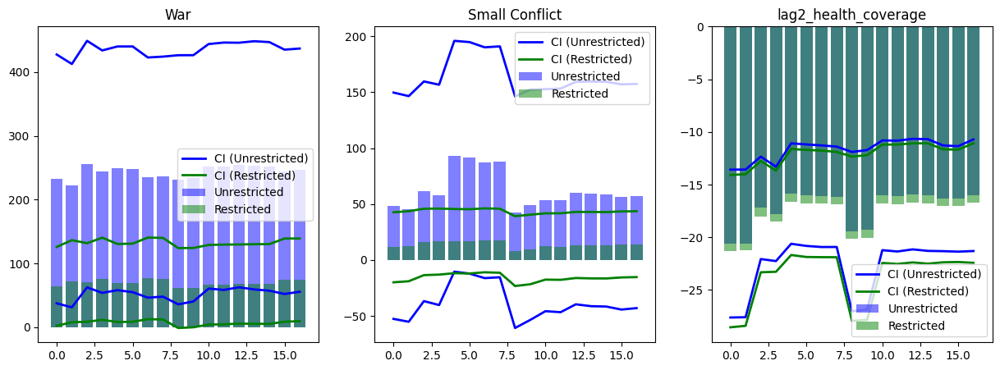

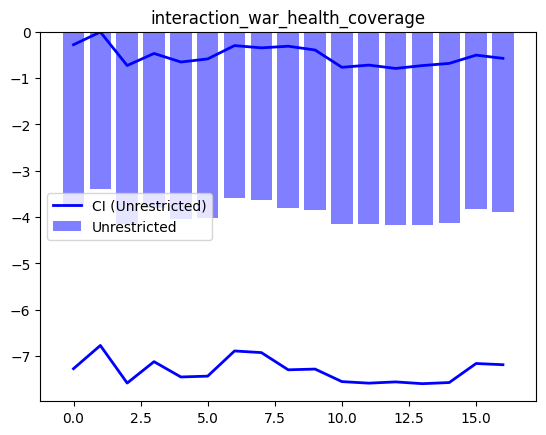

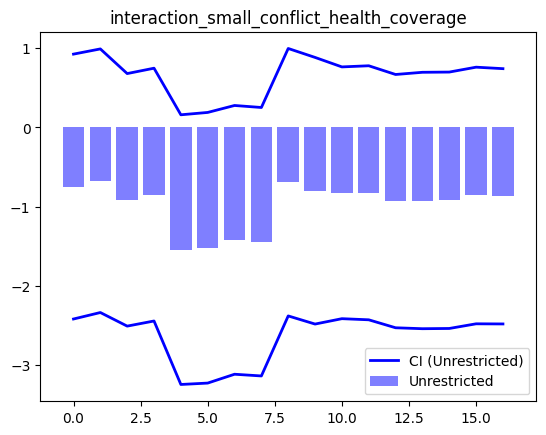

Coefficient Variation (CV) for Shared Variables (Unrestricted Model):
{'War': 4.025311383068296, 'Small Conflict': 25.453404700227473, 'lag2_health_coverage': -9.686674409436327}

Coefficient Variation (CV) for Unshared Variables (Unrestricted Model):
{'interaction_war_health_coverage': -5.855556232449259, 'interaction_small_conflict_health_coverage': -28.96185372384509}

Coefficient Variation (CV) for Shared Variables (Restricted Model):
{'War': 6.60766163222318, 'Small Conflict': 19.64938740824513, 'lag2_health_coverage': -9.098988946211827}


In [ ]:
## plot coefficients
# coeff_unrestricted_list,coeff_restricted_list, ci95_unrestricted_list, ci95_restricted_list

# Variables of interest
variables_shared = ['War', 'Small Conflict', 'lag2_health_coverage']
variables_unrestricted = ['interaction_war_health_coverage', 'interaction_small_conflict_health_coverage']

# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=len(variables_shared), figsize=(15, 5))

# Plot histograms for shared variables
for i, variable in enumerate(variables_shared):
    # Extract coefficients
    coeffs_unrestricted = [d[variable] for d in coeff_unrestricted_list]
    coeffs_restricted = [d[variable] for d in coeff_restricted_list]

    # Extract confidence intervals
    ci95_lower_unrestricted = np.array([d[variable][0] for d in ci95_unrestricted_list])
    ci95_upper_unrestricted = np.array([d[variable][1] for d in ci95_unrestricted_list])
    ci95_lower_restricted = np.array([d[variable][0] for d in ci95_restricted_list])
    ci95_upper_restricted = np.array([d[variable][1] for d in ci95_restricted_list])

    # Calculate bin midpoints
    bin_midpoints = np.arange(len(coeffs_unrestricted))

    # Plot histograms as bars
    axes[i].bar(bin_midpoints, coeffs_unrestricted, color='blue', alpha=0.5, label='Unrestricted')
    axes[i].bar(bin_midpoints, coeffs_restricted, color='green', alpha=0.5, label='Restricted')

    # Plot confidence intervals as lines
    axes[i].plot(bin_midpoints, ci95_lower_unrestricted, color='blue', linestyle='-', linewidth=2, label='CI (Unrestricted)')
    axes[i].plot(bin_midpoints, ci95_upper_unrestricted, color='blue', linestyle='-', linewidth=2)
    axes[i].plot(bin_midpoints, ci95_lower_restricted, color='green', linestyle='-', linewidth=2, label='CI (Restricted)')
    axes[i].plot(bin_midpoints, ci95_upper_restricted, color='green', linestyle='-', linewidth=2)

    axes[i].set_title(variable)
    axes[i].legend()

# Plot histograms for variables only in unrestricted model
for variable in variables_unrestricted:
    # Extract coefficients
    coeffs_unrestricted = [d[variable] for d in coeff_unrestricted_list]

    # Extract confidence intervals
    ci95_lower_unrestricted = [d[variable][0] for d in ci95_unrestricted_list]
    ci95_upper_unrestricted = [d[variable][1] for d in ci95_unrestricted_list]

    # Calculate bin midpoints
    bin_midpoints = np.arange(len(coeffs_unrestricted))

    # Plot histograms as bars
    fig, ax = plt.subplots()
    ax.bar(bin_midpoints, coeffs_unrestricted, color='blue', alpha=0.5, label='Unrestricted')

    # Plot confidence intervals as lines
    ax.plot(bin_midpoints, ci95_lower_unrestricted, color='blue', linestyle='-', linewidth=2, label='CI (Unrestricted)')
    ax.plot(bin_midpoints, ci95_upper_unrestricted, color='blue', linestyle='-', linewidth=2)

    ax.set_title(variable)
    ax.legend()
plt.show()

def coefficient_variation(coeff_list, variables_of_interest):
    coeffs_of_interest = [[d[var] for var in variables_of_interest] for d in coeff_list]
    means = np.mean(coeffs_of_interest, axis=0)
    stds = np.std(coeffs_of_interest, axis=0)
    cv_values = (stds / means) * 100
    return {var: cv_values[i] for i, var in enumerate(variables_of_interest)}

# Coefficients of interest
variables_shared = ['War', 'Small Conflict', 'lag2_health_coverage']
variables_unrestricted = ['interaction_war_health_coverage', 'interaction_small_conflict_health_coverage']

# Calculate coefficient variation for the unrestricted model
cv_unrestricted_shared = coefficient_variation(coeff_unrestricted_list, variables_shared)
cv_unrestricted_unshared = coefficient_variation(coeff_unrestricted_list, variables_unrestricted)

# Calculate coefficient variation for the restricted model
cv_restricted_shared = coefficient_variation(coeff_restricted_list, variables_shared)

print("Coefficient Variation (CV) for Shared Variables (Unrestricted Model):")
print(cv_unrestricted_shared)
print("\nCoefficient Variation (CV) for Unshared Variables (Unrestricted Model):")
print(cv_unrestricted_unshared)
print("\nCoefficient Variation (CV) for Shared Variables (Restricted Model):")
print(cv_restricted_shared)

# # % variability
# Coefficient Variation (CV) for Shared Variables (Unrestricted Model):
# {'War': 11.351889830618829, 'Small Conflict': 27.486922634160294, 'health_coverage': -14.524653028023554}

# Coefficient Variation (CV) for Unshared Variables (Unrestricted Model):
# {'interaction_war_health_coverage': -12.129355636876973, 'interaction_small_conflict_health_coverage': -27.438355472977815}

# Coefficient Variation (CV) for Shared Variables (Restricted Model):
# {'War': 25.618978430018817, 'Small Conflict': 72.0971717061132, 'health_coverage': -14.290585787578076}

In [ ]:
# test = cat_convert(merged, best_covariates)
# SE, MEAN = bootstrap_SE(test, PanelOLS, 'all_cause_conflict_removed_popnormed', 10000, **dict(entity_effects=True, time_effects=True))
# print(SE)
# print(MEAN)

# **modeling**

**NOTES**


*   Life expectancy (even if leading by 2 years) is -0.55 correlated with all-cause mortality
*   SDI is collinear with variables: 'ihme_mean_adult_educ', 'age_dependency', 'lead2_u1_life_exp', 'gdp_pc', 'fertility'
*  'lead2_health_coverage' is collinear with 'ihme_mean_adult_educ','fertility', 'age_dependency'


> "  UHC [Universal Health Coverage] tracer
interventions,  we  developed  an  index  based  on  the
geometric mean of the coverage of a set of UHC tracer
interventions:  met  need  with  modern  contraception;
antenatal  care  (one  or  more  visits  and  four  or  more
visits);  skilled  birth  attendance  coverage;  in-facility
delivery  rates;  vaccination  coverage  (three  doses  of
diphtheria–pertussis–tetanus,  measles  vaccine,  and
three  doses  of  oral  polio  vaccine  or  inactivated  polio
vaccine);  tuberculosis  case  detection  rate;  coverage  of
antiretroviral  therapy  for  populations  living  with  HIV,
and  coverage  of  insecticide-treated  nets  for  malaria-
endemic countries." Lancet 2015, pp. 1815




* 'lead2_mci' (Maternal care and immunization with PCA) is collinear with 'ihme_mean_adult_educ','fertility',
'health_coverage'
* 'lead2_health_worker_density' somewhat collinear with gdp_pc
* 'lead2_health_worker_density' and 'lead2_health_industry_workers' both have an increasing effect on mortality both correlated with gdp_pc

#### investigating & graphing correlates

<Axes: >

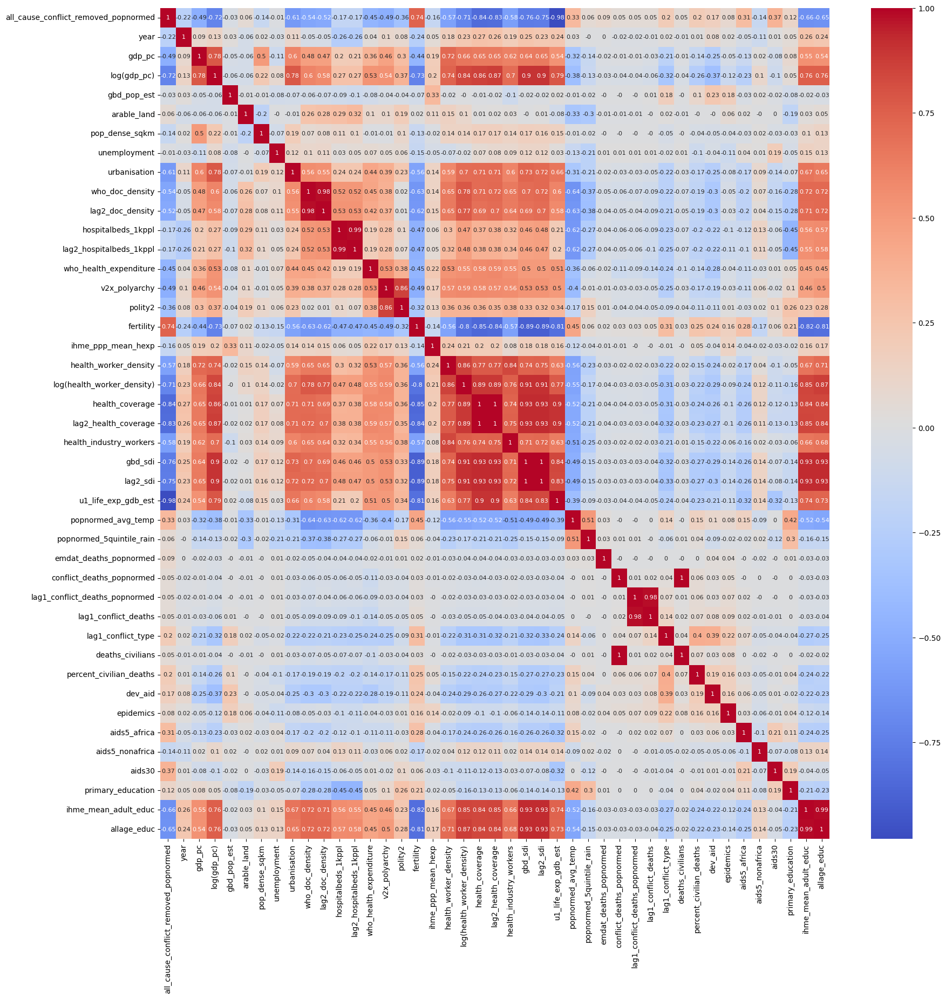

In [ ]:
test = merged.copy()
conditions = [test['lag1_conflict_deaths'] <25, (test['lag1_conflict_deaths'] >= 25) & (test['lag1_conflict_deaths'] <= 999), test['lag1_conflict_deaths'] >= 1000]
choices = [ 0, 1, 2]
test["lag1_conflict_type"] = np.select(conditions, choices)
vars = ['all_cause_conflict_removed_popnormed','year', 'gdp_pc', 'gbd_pop_est',
       'arable_land', 'pop_dense_sqkm', 'unemployment', 'urbanisation',
       'who_doc_density','lag2_doc_density', 'hospitalbeds_1kppl', 'lag2_hospitalbeds_1kppl',
        'who_health_expenditure',
       'v2x_polyarchy', 'polity2','fertility',
       'ihme_ppp_mean_hexp', 'health_worker_density',
        'health_coverage', 'lag2_health_coverage',
       'health_industry_workers','gbd_sdi', 'lag2_sdi','u1_life_exp_gdb_est',
        'popnormed_avg_temp', 'popnormed_5quintile_rain', 'emdat_deaths_popnormed',
       'conflict_deaths_popnormed',
       'lag1_conflict_deaths_popnormed', 'lag1_conflict_deaths','lag1_conflict_type',
        'deaths_civilians', 'percent_civilian_deaths',
        'dev_aid','epidemics', 'aids5_africa', 'aids5_nonafrica', 'aids30', 'primary_education', 'allage_educ', 'ihme_mean_adult_educ']
ordered_vars = ['all_cause_conflict_removed_popnormed','year', 'gdp_pc', 'log(gdp_pc)', 'gbd_pop_est',
       'arable_land', 'pop_dense_sqkm', 'unemployment', 'urbanisation',
       'who_doc_density','lag2_doc_density', 'hospitalbeds_1kppl', 'lag2_hospitalbeds_1kppl',
        'who_health_expenditure',
       'v2x_polyarchy', 'polity2','fertility',
       'ihme_ppp_mean_hexp', 'health_worker_density', 'log(health_worker_density)',
        'health_coverage', 'lag2_health_coverage',
       'health_industry_workers','gbd_sdi', 'lag2_sdi','u1_life_exp_gdb_est',
        'popnormed_avg_temp', 'popnormed_5quintile_rain', 'emdat_deaths_popnormed',
       'conflict_deaths_popnormed',
       'lag1_conflict_deaths_popnormed', 'lag1_conflict_deaths','lag1_conflict_type',
        'deaths_civilians', 'percent_civilian_deaths',
        'dev_aid','epidemics', 'aids5_africa', 'aids5_nonafrica', 'aids30', 'primary_education', 'ihme_mean_adult_educ', 'allage_educ']

test.percent_civilian_deaths = test.percent_civilian_deaths.fillna(0)
test = test[vars].drop_duplicates()
test[['log(gdp_pc)', 'log(health_worker_density)']] = transformvars(test, ['health_worker_density', 'gdp_pc'], inplace=False)[['log(gdp_pc)', 'log(health_worker_density)']]
plt.figure(figsize=(20,20))
cmtx=np.round(test[ordered_vars].corr(),2)
sns.heatmap(cmtx, annot=True, annot_kws={"size": 8}, cmap='coolwarm')

In [ ]:
test = merged[covars+['epidemics', 'aids5_africa', 'aids5_nonafrica']].dropna()
plt.figure(figsize=(14,14))
test.lead1_conflict_deaths.sort_values()[:-150].plot.hist(bins=40)

plt.xticks(list(range(0,10000,100)), rotation=90)


AttributeError: 'DataFrame' object has no attribute 'lead1_conflict_deaths'

<Figure size 1400x1400 with 0 Axes>

In [ ]:
iso_continent = {
    'AUS': 'Oceania','MEX': 'North America','LBN': 'Asia','ZAF': 'Africa','CPV': 'Africa','RUS': 'Europe','SDN': 'Africa',
    'SLB': 'Oceania','LKA': 'Asia','RWA': 'Africa','SEN': 'Africa','ZWE': 'Africa','BOL': 'South America',
    'TGO': 'Africa','THA': 'Asia','NPL': 'Asia','PAK': 'Asia','TJK': 'Asia',
    'NGA': 'Africa','TTO': 'North America','TCD': 'Africa','TUR': 'Asia','NZL': 'Oceania','NER': 'Africa','MRT': 'Africa','MAR': 'Africa',
    'MWI': 'Africa','TZA': 'Africa','UGA': 'Africa','MOZ': 'Africa','PHL': 'Asia','MMR': 'Asia','BLR': 'Europe','VEN': 'South America',
    'MLI': 'Africa','ITA': 'Europe','PNG': 'Oceania','SLE': 'Africa','PER': 'South America','SLV': 'North America','JAM': 'North America',
    'TKM': 'Asia','GUY': 'South America','VNM': 'Asia','MNG': 'Asia','SGP': 'Asia','HUN': 'Europe','KAZ': 'Asia','NAM': 'Africa',
    'LSO': 'Africa','GIN': 'Africa','GTM': 'North America','IRQ': 'Asia','CHN': 'Asia','GRC': 'Europe',
    'JPN': 'Asia','HND': 'North America','CHL': 'South America','LBY': 'Africa','URY': 'South America','IDN': 'Asia','IND': 'Asia',
    'MDG': 'Africa','BTN': 'Asia','NIC': 'North America','ZMB': 'Africa','GNB': 'Africa','KWT': 'Asia','POL': 'Europe','DNK': 'Europe',
    'BEN': 'Africa','JOR': 'Asia','CAN': 'North America','KEN': 'Africa','GAB': 'Africa','YEM': 'Asia','GMB': 'Africa','KGZ': 'Asia',
    'ISL': 'Europe','CHE': 'Europe','DOM': 'North America','BWA': 'Africa','COM': 'Africa','ROU': 'Europe','OMN': 'Asia',
    'CRI': 'North America','HTI': 'North America','FIN': 'Europe','IRL': 'Europe','SUR': 'South America','GHA': 'Africa',
    'UKR': 'Europe','LAO': 'Asia','AZE': 'Asia','BGR': 'Europe','NOR': 'Europe','ESP': 'Europe','ETH': 'Africa',
    'QAT': 'Asia','BRA': 'South America','BRB': 'North America','CAF': 'Africa','EGY': 'Africa','MUS': 'Africa',
    'TUN': 'Africa','VUT': 'Oceania','COL': 'South America','COG': 'Africa','CUB': 'North America','CIV': 'Africa',
    'PRT': 'Europe','SWE': 'Europe','COD': 'Africa','ARG': 'South America','ARM': 'Asia','DEU': 'Europe',
    'DJI': 'Africa','CMR': 'Africa','ARE': 'Asia','DZA': 'Africa','AGO': 'Africa','CYP': 'Europe',
    'GNQ': 'Africa','AUT': 'Europe','BHR': 'Asia','FRA': 'Europe','BDI': 'Africa','SAU': 'Asia','MLT': 'Europe',
    'ALB': 'Europe','GBR': 'Europe','MDV': 'Asia','MYS': 'Asia','FJI': 'Oceania','BFA': 'Africa','BGD': 'Asia','UZB': 'Asia',
    'NLD': 'Europe','PRY': 'South America','ECU': 'South America','PAN': 'North America','IRN': 'Asia','KHM': 'Asia',
    'SVK': 'Europe','CZE': 'Europe','ERI': 'Africa','PSE': 'Asia','BIH': 'Europe','EST': 'Europe','MDA': 'Europe',
    'SVN': 'Europe','HRV': 'Europe','LTU': 'Europe','ISR': 'Asia','LVA': 'Europe','TLS': 'Asia','LUX': 'Europe',
    'BEL': 'Europe','LBR': 'Africa','GEO': 'Asia','STP': 'Africa','AFG': 'Asia','SRB': 'Europe','MNE': 'Europe','SSD': 'Africa','SOM': 'Africa'
}

In [ ]:
test = cat_convert(merged, covars+['epidemics','aids5_africa', 'aids5_nonafrica'])
test['region'] = test.ISO.map(iso_continent)
# print(test.gdp_pc.describe())
region_colors = {
    'North America': 'blue',
    'South America': 'red',
    'Europe': 'purple',
    'Africa': 'green',
    'Asia': 'orange',
    'Oceania': 'black'}
# transformvars(test, cols_to_transform=['gdp_pc'])
# print(test['log(gdp_pc)'].describe())
test = test.set_index(['ISO'])
test.drop(columns=['const'], inplace=True)
sns.pairplot(test, hue='region', hue_order=region_colors.keys(), palette=region_colors, diag_kind='kde', plot_kws={'alpha': 0.4, 's': 10}) # hue='region'
plt.show()

## CONTINUOUS conflict deaths

In [ ]:
testvars = covars#, 'lead1_conflict_deaths_popnormed']
# testvars.remove('lead1_conflict_deaths')
# test = nod_merged[covars].dropna()
test = merged[testvars].dropna()
test = test.drop_duplicates()
transformvars(test, ['gdp_pc'])
# transformvars(test,['dev_aid'], trans_func=np.log1p)
transformvars(test,['lag1_conflict_deaths'], trans_func=np.log1p)
test = test.set_index(['ISO','year'])
y = test.all_cause_conflict_removed_popnormed.copy()
test.drop(columns=['all_cause_conflict_removed_popnormed'], inplace=True)
test = sm.add_constant(test)
model = PanelOLS(y, test,entity_effects=True, time_effects=True)#
result = model.fit(**lin_fit_dict)
randmod = RandomEffects(y, test)
randresults = randmod.fit(**lin_fit_dict)
pooledmod = PooledOLS(y, test)
pooled= pooledmod.fit(**lin_fit_dict)
print(compare({"FE": result, "RE": randresults, "Pooled": pooled}))
### another calculcation of violence toll
# coefficient = result.params['lead1_conflict_deaths_popnormed']
# print('PanelOLS number of deaths indirectly attributable to violence: ',(test.loc[test["lead1_conflict_deaths_popnormed"]>0, 'gbd_pop_est'] * coefficient/100000).sum())
# print('PooledOLS number of deaths indirectly attributable to violence: ',(test.loc[test["lead1_conflict_deaths_popnormed"]>0, 'gbd_pop_est'] * pooled.params['lead1_conflict_deaths_popnormed']/100000).sum())

                                                                     Model Comparison                                                                     
                                                                      FE                                       RE                                   Pooled
----------------------------------------------------------------------------------------------------------------------------------------------------------
Dep. Variable                       all_cause_conflict_removed_popnormed     all_cause_conflict_removed_popnormed     all_cause_conflict_removed_popnormed
Estimator                                                       PanelOLS                            RandomEffects                                PooledOLS
No. Observations                                                    4540                                     4540                                     4540
Cov. Est.                                                      Cluster

<Axes: ylabel='Frequency'>

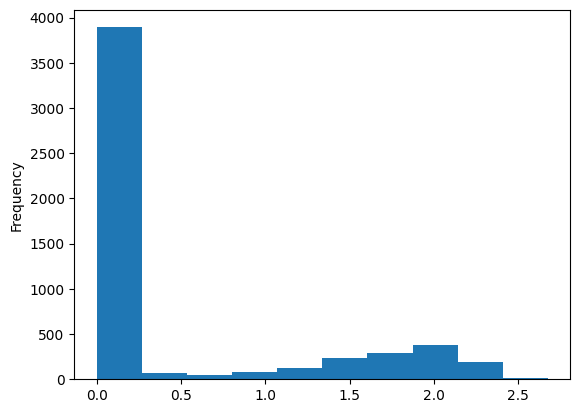

In [ ]:
np.log(test['lag1_conflict_deaths'] + 1).plot.hist(bins=10)

In [ ]:
test[['lag1_conflict_deaths', 'lag2_health_coverage']].mean()

lead1_conflict_deaths     1.292631
lead2_health_coverage    60.235952
dtype: float64

In [ ]:
test = merged[covars].dropna()
test = test.drop_duplicates()
# test = test.drop(columns=['age_dependency', 'fertility', 'gdp_pc'])
transformvars(test, ['gdp_pc'])
transformvars(test,['lag1_conflict_deaths'], trans_func=np.log1p)
test = test.set_index(['ISO','year'])
# test[['lag1_conflict_deaths', 'lag2_health_coverage']] -= test[['lag1_conflict_deaths', 'lag2_health_coverage']].mean()
# test[['log1p(lag1_conflict_deaths)', 'lag2_health_coverage']] -= test[['log1p(lag1_conflict_deaths)', 'lag2_health_coverage']].mean()
test -= test.mean()
test['interaction_conflict_health'] = test['log1p(lag1_conflict_deaths)']  * test.lag2_health_coverage
test = sm.add_constant(test)

# test.drop(columns=['log(health_worker_density)'], inplace=True)
model = PanelOLS(test.all_cause_conflict_removed_popnormed, test[[c for c in test.columns if c!='all_cause_conflict_removed_popnormed']], entity_effects=True, time_effects=True)
conflict_health = model.fit(**lin_fit_dict)
VIF(model)
restricted = test.copy().drop(columns=['interaction_conflict_health'])
model = PanelOLS(restricted.all_cause_conflict_removed_popnormed, restricted[[c for c in restricted.columns if c!='all_cause_conflict_removed_popnormed']], entity_effects=True, time_effects=True)
conflict = model.fit(**lin_fit_dict)
print(conflict)
print(conflict_health)
print()
try:
    print('loglikratio significant compared to restricted model?:',loglikratio(conflict, conflict_health))
    print('ftest significant compared to restricted model?:',Ftest(conflict, conflict_health))
except: pass
bp_test = sm.stats.het_breuschpagan(conflict_health.resids, test[[c for c in test.columns if c!='all_cause_conflict_removed_popnormed']])
print("\nBreusch-Pagan test p-value:", bp_test[1])
# white_test = sm.stats.het_white(conflict_health.resids, test[[c for c in test.columns if c!='all_cause_conflict_removed_popnormed']])
# print("White test p-value:", white_test[1], '\n')
analyse_multicollinearity(test.astype(float).reset_index(), 'all_cause_conflict_removed_popnormed').diagnose_collinearity()

# ### another calculcation of violence toll
# coefficient = result.params['lag1_conflict_deaths_popnormed']
# print('PanelOLS number of deaths indirectly attributable to violence: ',(test.loc[test["lag1_conflict_deaths_popnormed"]>0, 'gbd_pop_est'] * coefficient/100000).sum())
# print('PooledOLS number of deaths indirectly attributable to violence: ',(test.loc[test["lag1_conflict_deaths_popnormed"]>0, 'gbd_pop_est'] * pooled.params['lead1_conflict_deaths_popnormed']/100000).sum())

const:  1.148
log1p(lag1_conflict_deaths):  1.655
lag2_health_coverage:  1.707
arable_land:  1.051
pop_dense_sqkm:  1.094
unemployment:  1.084
v2x_polyarchy:  1.552
emdat_deaths_popnormed:  1.004
dev_aid:  1.236
aids30:  1.099
interaction_conflict_health:  1.332


/usr/local/lib/python3.10/dist-packages/linearmodels/panel/results.py:88: RuntimeWarning: invalid value encountered in sqrt
  return Series(np.sqrt(np.diag(self.cov)), self._var_names, name="std_error")


                                   PanelOLS Estimation Summary                                    
Dep. Variable:     all_cause_conflict_removed_popnormed   R-squared:                        0.4029
Estimator:                                     PanelOLS   R-squared (Between):              0.7743
No. Observations:                                  4604   R-squared (Within):               0.6447
Date:                                  Mon, Jul 29 2024   R-squared (Overall):              0.7564
Time:                                          10:08:48   Log-likelihood                -2.782e+04
Cov. Estimator:                               Clustered                                           
                                                          F-statistic:                      329.72
Entities:                                           171   P-value                           0.0000
Avg Obs:                                         26.924   Distribution:                  F(9,4397)
Min Obs:  

#### Interaction life exp and continuous conflict deaths

In [ ]:
exogvars = ['all_cause_conflict_removed_popnormed','v2x_polyarchy', 'arable_land','unemployment',  'emdat_deaths_popnormed',
            'gdp_pc', 'gbd_pop_est','pop_dense_sqkm', 'urbanisation',  'ihme_mean_adult_educ', 'year', 'ISO', 'lead2_u1_life_exp','lead1_conflict_deaths']
test = nod_merged[exogvars].dropna()

# test['lead2_u1_life_exp'] = test['lead2_u1_life_exp'] - test['lead2_u1_life_exp'].mean()
print(len(nod_merged), len(test))

test['interaction_conflict_life_exp'] = test['lead1_conflict_deaths'].values.reshape(-1, 1) * test['lead2_u1_life_exp'].values.reshape(-1, 1)
test = test.set_index(['ISO','year'])
exog = sm.add_constant(test.iloc[:,1:])
model = PanelOLS(test.all_cause_conflict_removed_popnormed, exog, entity_effects=True, time_effects=True)
cdeaths_le = model.fit(**lin_fit_dict)
print(cdeaths_le)
cdeaths_le.summary.as_html()

5944 4307
                                   PanelOLS Estimation Summary                                    
Dep. Variable:     all_cause_conflict_removed_popnormed   R-squared:                        0.6266
Estimator:                                     PanelOLS   R-squared (Between):             -1.2109
No. Observations:                                  4307   R-squared (Within):               0.5217
Date:                                  Mon, Feb 19 2024   R-squared (Overall):             -0.7874
Time:                                          12:59:33   Log-likelihood                -2.511e+04
Cov. Estimator:                              Unadjusted                                           
                                                          F-statistic:                      575.33
Entities:                                           153   P-value                           0.0000
Avg Obs:                                         28.150   Distribution:                 F(12,4114)


'<table class="simpletable">\n<caption>PanelOLS Estimation Summary</caption>\n<tr>\n  <th>Dep. Variable:</th>    <td>all_cause_conflict_removed_popnormed</td> <th>  R-squared:         </th>     <td>0.6266</td>  \n</tr>\n<tr>\n  <th>Estimator:</th>                      <td>PanelOLS</td>               <th>  R-squared (Between):</th>    <td>-1.2109</td> \n</tr>\n<tr>\n  <th>No. Observations:</th>                 <td>4307</td>                 <th>  R-squared (Within):</th>     <td>0.5217</td>  \n</tr>\n<tr>\n  <th>Date:</th>                       <td>Mon, Feb 19 2024</td>           <th>  R-squared (Overall):</th>    <td>-0.7874</td> \n</tr>\n<tr>\n  <th>Time:</th>                           <td>12:59:33</td>               <th>  Log-likelihood     </th>   <td>-2.511e+04</td>\n</tr>\n<tr>\n  <th>Cov. Estimator:</th>                <td>Unadjusted</td>              <th>                     </th>        <td></td>     \n</tr>\n<tr>\n  <th></th>                                    <td></td>        

In [ ]:
VIF(model)

const:  102.178
v2x_polyarchy:  1.466
arable_land:  1.077
unemployment:  1.195
emdat_deaths_popnormed:  1.002
gdp_pc:  2.01
gbd_pop_est:  1.038
pop_dense_sqkm:  1.105
urbanisation:  2.553
ihme_mean_adult_educ:  2.913
lead2_u1_life_exp:  3.132
lead1_conflict_deaths:  55.315
interaction_conflict_life_exp:  55.296


##**WAR**

In [ ]:
# war
test = cat_convert(merged, covars, interaction_terms=False)
to_transform = ['gdp_pc']
transformvars(test, to_transform)
test = test.set_index(['ISO','year'])
y = test.all_cause_conflict_removed_popnormed
test.drop(columns=['all_cause_conflict_removed_popnormed'], inplace=True)
test = sm.add_constant(test)
war_model = PanelOLS(y, test,entity_effects=True, time_effects=True)
re_war_model = RandomEffects(y, test)
result_war = war_model.fit(cov_type='heteroskedastic')
re_result_war = re_war_model.fit(cov_type='heteroskedastic')
print(f'\nVIF for fe model:\n{VIF(war_model,2)}')
bp_test = sm.stats.het_breuschpagan(result_war.resids, test[[c for c in test.columns if c!='all_cause_conflict_removed_popnormed']])
print("\nBreusch-Pagan test p-value:", bp_test[1])
# white_test = sm.stats.het_white(result_war.resids, test[[c for c in test.columns if c!='all_cause_conflict_removed_popnormed']])
# print("White test p-value:", white_test[1], '\n')
print(result_war)
print(re_result_war)
result_war.summary.as_html()
# re_result_war.summary.as_html()

kept:  5327 , dropped:  2137  = 28.63076098606645 % dropped
features:  16

VIF for fe model:
const:  175.778
lead2_health_coverage:  8.925
age_dependency:  8.063
arable_land:  1.134
log(gdp_pc):  6.278
pop_dense_sqkm:  1.122
unemployment:  1.209
urbanisation:  2.795
v2x_polyarchy:  1.793
popnormed_5quintile_rain:  1.421
fertility:  10.109
emdat_deaths_popnormed:  1.004
dev_aid:  1.279
Small Conflict:  1.128
War:  1.211

Breusch-Pagan test p-value: 2.0172624117472725e-129
                                   PanelOLS Estimation Summary                                    
Dep. Variable:     all_cause_conflict_removed_popnormed   R-squared:                        0.2691
Estimator:                                     PanelOLS   R-squared (Between):              0.7050
No. Observations:                                  4665   R-squared (Within):               0.5691
Date:                                  Thu, Apr 18 2024   R-squared (Overall):              0.6889
Time:                        

'<table class="simpletable">\n<caption>PanelOLS Estimation Summary</caption>\n<tr>\n  <th>Dep. Variable:</th>    <td>all_cause_conflict_removed_popnormed</td> <th>  R-squared:         </th>     <td>0.2691</td>  \n</tr>\n<tr>\n  <th>Estimator:</th>                      <td>PanelOLS</td>               <th>  R-squared (Between):</th>    <td>0.7050</td>  \n</tr>\n<tr>\n  <th>No. Observations:</th>                 <td>4665</td>                 <th>  R-squared (Within):</th>     <td>0.5691</td>  \n</tr>\n<tr>\n  <th>Date:</th>                       <td>Thu, Apr 18 2024</td>           <th>  R-squared (Overall):</th>    <td>0.6889</td>  \n</tr>\n<tr>\n  <th>Time:</th>                           <td>13:52:15</td>               <th>  Log-likelihood     </th>   <td>-2.863e+04</td>\n</tr>\n<tr>\n  <th>Cov. Estimator:</th>                  <td>Robust</td>                <th>                     </th>        <td></td>     \n</tr>\n<tr>\n  <th></th>                                    <td></td>        

In [ ]:
#### calculating the total toll of war
war_coefficient = result_war.params['War']
# test['gbd_pop_est'] = merged[covars+['gbd_pop_est']].set_index(['ISO', 'year']).dropna()['gbd_pop_est']
test = test.reset_index().merge(merged[['ISO', 'year', 'gbd_pop_est']], on=['ISO', 'year'], how='inner').drop_duplicates()
print('Number of deaths indirectly attributable to war: ',(test.loc[test['War']==1, 'gbd_pop_est'].values/100000 * war_coefficient).sum())

### previous estimates with crude mortality data that was normalized per 100,000 but not age-standardized
# with best_AIC and VIF <10 the total war deaths are at 28,990,872
# with best_AIC and VIF <10 and missing data ~ 26% total war deaths are: 27,885,644

Number of deaths indirectly attributable to war:  30160887.337828856


## **HEALTH COVERAGE** and WAR deaths

#### mediation

In [ ]:
X_vif = outcome_model.model.exog  # Exogenous variables (independent variables)
vifs = pd.DataFrame({
    'VIF': [variance_inflation_factor(X_vif, i) for i in range(X_vif.shape[1])],
    'variable': outcome_model.model.exog_names
})
print(vifs)

divide by zero encountered in scalar divide


           VIF                variable
0     0.000000               Intercept
1     3.466441             C(ISO)[T.1]
2     5.395139             C(ISO)[T.2]
3    12.929517             C(ISO)[T.3]
4     8.261621             C(ISO)[T.4]
5     6.104464             C(ISO)[T.5]
6    12.694152             C(ISO)[T.6]
7     9.132457             C(ISO)[T.7]
8     5.009442             C(ISO)[T.8]
9     2.594377             C(ISO)[T.9]
10    8.238166            C(ISO)[T.10]
11    2.753883            C(ISO)[T.11]
12    2.504716            C(ISO)[T.12]
13    3.664171            C(ISO)[T.13]
14    7.043350            C(ISO)[T.14]
15    9.297701            C(ISO)[T.15]
16    5.700807            C(ISO)[T.16]
17    7.286730            C(ISO)[T.17]
18    4.521186            C(ISO)[T.18]
19    6.001152            C(ISO)[T.19]
20    6.618438            C(ISO)[T.20]
21    2.972622            C(ISO)[T.21]
22    4.639901            C(ISO)[T.22]
23    2.399308            C(ISO)[T.23]
24   13.064183           

In [ ]:
np.linalg.matrix_rank(mediator_model.model.exog)
np.corrcoef(mediator_model.model.exog)

array([[1.        , 0.99879659, 0.99840936, ..., 0.99904319, 0.99794922,
        0.99840632],
       [0.99879659, 1.        , 0.99493981, ..., 0.99995116, 0.99789708,
        0.99898296],
       [0.99840936, 0.99493981, 1.        , ..., 0.9955695 , 0.99354021,
        0.99385582],
       ...,
       [0.99904319, 0.99995116, 0.9955695 , ..., 1.        , 0.99796519,
        0.99896699],
       [0.99794922, 0.99789708, 0.99354021, ..., 0.99796519, 1.        ,
        0.99978059],
       [0.99840632, 0.99898296, 0.99385582, ..., 0.99896699, 0.99978059,
        1.        ]])

In [ ]:
# X.to_csv('test_mediation.csv', index=False)

In [ ]:
import patsy
from statsmodels.stats.mediation import Mediation
# getting data
test = merged[covars + ['health_coverage']].dropna()
test.drop(columns=['lag1_health_coverage'], inplace=True)
transformvars(test, ['lag1_conflict_deaths'], np.log1p)
test = sm.add_constant(test)

# #prepping dummies
isonumbermap = {iso:i for i, iso in enumerate(test.ISO.unique())}
entitynumbers = test.ISO.map(isonumbermap)
regiondummies = pd.get_dummies(test.ISO, drop_first=False)
regiondummies.drop(columns=['USA'], inplace=True) # this will be the comparison region
regiontest = pd.concat([test, regiondummies], axis=1)
time_dummies = pd.get_dummies(regiontest['year'], drop_first=True)
# X = pd.concat([regiontest, time_dummies], axis=1)

X = test.copy()
X.rename(columns={'log1p(lag1_conflict_deaths)':'logged_conflict_deaths'}, inplace=True)
X['ISO'] = X['ISO'].astype('category').cat.codes
X['year'] = X['year'].astype(int)

covariates = "const + C(ISO) + C(year) + logged_conflict_deaths + arable_land \
             + pop_dense_sqkm + unemployment + urbanisation + v2x_polyarchy \
             + emdat_deaths_popnormed + aids30 + gdp_pc_2010 + ihme_mean_adult_educ + age_dependency"

# model1
outcome = np.asarray(X['all_cause_conflict_removed_popnormed'].copy())
outcome_exog = patsy.dmatrix(covariates + ' + health_coverage',X, return_type='dataframe')
fam = sm.families.NegativeBinomial(alpha=1, link=sm.families.links.Log())
outcome_model = sm.GLM(outcome, outcome_exog, family=fam)

# model2
mediator = np.asarray(X['health_coverage'].copy())
mediator_exog = patsy.dmatrix(covariates, X, return_type='dataframe')
mediator_model = sm.OLS(mediator, mediator_exog)

# # mediation
med = Mediation(outcome_model, mediator_model, exposure='logged_conflict_deaths', mediator='health_coverage',
                mediator_fit_kwargs={'cov_type':'HC3'},#'cluster', 'cov_kwds':{'groups': X['ISO']}},
                outcome_fit_kwargs={'cov_type':'HC3'}).fit()#'cluster', 'cov_kwds':{'groups': X['ISO']}}).fit()
med_results = med
med_results.summary()

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/mediation.py:194: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  return np.random.multivariate_normal(mn, cov)
/usr/local/lib/python3.10/dist-packages/statsmodels/genmod/families/links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/usr/local/lib/python3.10/dist-packages/statsmodels/stats/mediation.py:327: RuntimeWarning: invalid value encountered in subtract
  indirect_effects[t].append(predicted_outcomes[1][t] - predicted_outcomes[0][t])
/usr/local/lib/python3.10/dist-packages/statsmodels/stats/mediation.py:328: RuntimeWarning: invalid value encountered in subtract
  direct_effects[t].append(predicted_outcomes[t][1] - predicted_outcomes[t][0])
/usr/local/lib/python3.10/dist-packages/statsmodels/stats/mediation.py:373: RuntimeWarning: invalid value encountered in divide
  self.prop_med_ctrl = self.ACME_ctrl / self.total_effect
/usr/local/lib/python3.10/dist-packages/statsmodels/stat

,Estimate,Lower CI bound,Upper CI bound,P-value
ACME (control),NaN,NaN,NaN,0.0
ACME (treated),NaN,NaN,NaN,0.0
ADE (control),NaN,NaN,NaN,0.0
ADE (treated),NaN,NaN,NaN,0.0
Total effect,NaN,NaN,NaN,0.0
Prop. mediated (control),NaN,NaN,NaN,0.0
Prop. mediated (treated),NaN,NaN,NaN,0.0
ACME (average),NaN,NaN,NaN,0.0
ADE (average),NaN,NaN,NaN,0.0
Prop. mediated (average),NaN,NaN,NaN,0.0


In [ ]:
from statsmodels.stats.mediation import Mediation
# getting data
test = merged[covars + ['health_coverage']].dropna()
test.drop(columns=['lag1_health_coverage'], inplace=True)
transformvars(test, ['lag1_conflict_deaths'], np.log1p)
test = sm.add_constant(test)

#prepping dummies
isonumbermap = {iso:i for i, iso in enumerate(test.ISO.unique())}
entitynumbers = test.ISO.map(isonumbermap)
regiondummies = pd.get_dummies(test.ISO, drop_first=False)
regiondummies.drop(columns=['USA'], inplace=True) # this will be the comparison region
regiontest = pd.concat([test, regiondummies], axis=1)
time_dummies = pd.get_dummies(regiontest['year'], drop_first=True)
# X = pd.concat([regiontest, time_dummies], axis=1)

X = test.copy()
X.rename(columns={'log1p(lag1_conflict_deaths)':'logged_conflict_deaths'}, inplace=True)
X['ISO'] = X['ISO'].astype('category').cat.codes
X['year'] = X['year'].astype(int)

# model1
fam = sm.families.NegativeBinomial(alpha=1, link=sm.families.links.Log())
outcome_model = sm.GLM.from_formula(formula= 'all_cause_conflict_removed_popnormed ~ \
                                const + C(ISO) + C(year) + logged_conflict_deaths + arable_land + pop_dense_sqkm \
                                + unemployment + urbanisation + v2x_polyarchy + emdat_deaths_popnormed + aids30 \
                                + gdp_pc_2010 + ihme_mean_adult_educ + age_dependency + health_coverage',
                            data=X, family=fam).fit()#cov_type='cluster', cov_kwds={'groups': X[['ISO', 'year']]})

# model2
mediator_model = sm.OLS.from_formula(formula= ' health_coverage ~ \
                                const + C(ISO) + C(year) + logged_conflict_deaths + arable_land + pop_dense_sqkm \
                                + unemployment + urbanisation + v2x_polyarchy + emdat_deaths_popnormed + aids30 \
                                + gdp_pc_2010 + ihme_mean_adult_educ + age_dependency',
                                data=X).fit()#cov_type='cluster', cov_kwds={'groups': X[['ISO', 'year']]})

# model3
outcome_model_no_med = sm.GLM.from_formula(formula= 'all_cause_conflict_removed_popnormed ~ \
                                const + C(ISO) + C(year) + logged_conflict_deaths + arable_land + pop_dense_sqkm \
                                + unemployment + urbanisation + v2x_polyarchy + emdat_deaths_popnormed + aids30 \
                                + gdp_pc_2010 + ihme_mean_adult_educ + age_dependency',
                            data=X, family=fam).fit()#cov_type='cluster', cov_kwds={'groups': X[['ISO', 'year']]})

# Extract coefficients for the models
alpha = mediator_model.params['logged_conflict_deaths']  # Effect of conflict deaths on health coverage (Path a)
beta = outcome_model.params['health_coverage']  # Effect of health coverage on mortality (Path b)
delta = outcome_model.params['logged_conflict_deaths']  # Direct effect of conflict deaths on mortality (Path c')
gamma = outcome_model_no_med.params['logged_conflict_deaths']  # Total effect of conflict deaths on mortality (Path c)

# Indirect Effect (a * b)
indirect_effect = alpha * beta

# Direct Effect (c')
direct_effect = delta

# Total Effect (c)
total_effect = gamma

# Proportion Mediated
proportion_mediated = indirect_effect / total_effect if total_effect != 0 else np.nan

# Display the effects
effects = {
    "Indirect Effect (IE)": indirect_effect,
    "Direct Effect (DE)": direct_effect,
    "Total Effect (TE)": total_effect,
    "Proportion Mediated": proportion_mediated
}

print("Mediation Analysis Results:")
for key, value in effects.items():
    print(f"{key}: {value}")

# Significance levels for mediator model
print("Significance Levels for Mediator Model:")
print(mediator_model.summary())

# Significance levels for outcome model with mediator
print("\nSignificance Levels for Outcome Model with Mediator:")
print(outcome_model.summary())

# Significance levels for outcome model without mediator
print("\nSignificance Levels for Outcome Model without Mediator:")
print(outcome_model_no_med.summary())


# # mediation
# med = Mediation(outcome_model, mediator_model, exposure='logged_conflict_deaths', mediator='health_coverage',
#                 mediator_fit_kwargs={'cov_type':'cluster', 'cov_kwds':{'groups': X[['ISO', 'year']]}},
#                 outcome_fit_kwargs={'cov_type':'cluster', 'cov_kwds':{'groups': X[['ISO', 'year']]}}).fit()
# med_results = med
# med_results.summary()

Mediation Analysis Results:
Indirect Effect (IE): 0.003802014562373236
Direct Effect (DE): 0.0022844182627451345
Total Effect (TE): 0.00614020249408654
Proportion Mediated: 0.6192001918560261
Significance Levels for Mediator Model:
                            OLS Regression Results                            
Dep. Variable:        health_coverage   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     2006.
Date:                Wed, 14 Aug 2024   Prob (F-statistic):               0.00
Time:                        13:52:45   Log-Likelihood:                -10701.
No. Observations:                4886   AIC:                         2.182e+04
Df Residuals:                    4675   BIC:                         2.320e+04
Df Model:                         210                                         
Covariance Type:            nonrobust                    

#### using R

In [ ]:
' + '.join(test.columns)

'const + all_cause_conflict_removed_popnormed + ISO + year + lag2_health_coverage + arable_land + pop_dense_sqkm + unemployment + urbanisation + v2x_polyarchy + emdat_deaths_popnormed + aids30 + gdp_pc_2010 + ihme_mean_adult_educ + age_dependency + log1p(lag1_conflict_deaths_popnormed) + interaction_conflict_health'

In [ ]:
test = cat_convert(merged, covars, interaction_terms=False)

test.to_csv('test_data.csv', index=False)

kept:  4886 , dropped:  1268  = 20.604484887877803 % dropped
features:  15


In [ ]:
# test = cat_convert(merged, covars) #+ ['age_dependency', 'primary_education']) +['gdp_pc_2010', 'allage_educ']
# test.reset_index(inplace=True)
# test.rename(columns={'Small Conflict': 'small_conflict'}, inplace=True)
test.rename(columns={'log1p(lag1_conflict_deaths_popnormed)': 'log1p_lag1_conflict_deaths_popnormed'}, inplace=True)
# test.drop(columns='const', inplace=True)
# test = transform_cont_vars(test, orthogonalize, 'all_cause_conflict_removed_popnormed')
test.to_csv('test_data.csv', index=False)

In [ ]:
%%R
# install.packages('CBPS')
# install.packages('car') # for vif
# install.packages('plm') # for panel regression
library('car')
library('CBPS')
library('plm')


test <- read.csv("C:/Users/jackewiebohne/Downloads/test_data.csv", header=TRUE,sep = ',')
test$ISO <- as.factor(test$ISO)
test$year <- as.numeric(as.character(test$year))

war_mortality_formula <- "all_cause_conflict_removed_popnormed ~ ISO + year +\
                 lag2_health_coverage + arable_land + gdp_pc + pop_dense_sqkm +\
                  unemployment + urbanisation + v2x_polyarchy + popnormed_avg_temp +\
                  emdat_deaths_popnormed + dev_aid + aids30 + War + interaction_war_lag2_health_coverage"
smc_mortality_formula <- "all_cause_conflict_removed_popnormed ~ ISO + year +\
                 lag2_health_coverage + arable_land + gdp_pc + pop_dense_sqkm +\
                  unemployment + urbanisation + v2x_polyarchy + popnormed_avg_temp +\
                  emdat_deaths_popnormed + dev_aid + aids30 + small_conflict +\
                  interaction_small_conflict_lag2_health_coverage"
general_mortality_formula <- "all_cause_conflict_removed_popnormed ~ ISO + year +\
                 lag2_health_coverage + arable_land + gdp_pc + pop_dense_sqkm +\
                  unemployment + urbanisation + v2x_polyarchy + popnormed_avg_temp +\
                  emdat_deaths_popnormed + dev_aid + aids30 + small_conflict + war +\
                  interaction_small_conflict_lag2_health_coverage + interaction_war_lag2_health_coverage"
treatment_warhc_formula <- "interaction_war_lag2_health_coverage ~ ISO + year + lag2_health_coverage + arable_land +\
                     gdp_pc + pop_dense_sqkm + unemployment + urbanisation + v2x_polyarchy +\
                      popnormed_avg_temp + emdat_deaths_popnormed + dev_aid + aids30 + War"
treatment_smchc_formula <- "interaction_small_conflict_lag2_health_coverage ~ ISO + year + lag2_health_coverage + arable_land +\
                        gdp_pc + pop_dense_sqkm + unemployment + urbanisation + v2x_polyarchy +\
                      popnormed_avg_temp + emdat_deaths_popnormed + dev_aid + aids30 + small_conflict"

warfit <- CBPS(treatment_warhc_formula, data = wartest, ATT=0) # ATT only available for binary
smcfit <- CBPS(treatment_smchc_formula, data=smctest, ATT=0)
summary(fit1)
summary(fit2)

balance(fit1)

test$weights <- (warfit$weights + smcfit$weights)/2
test$warweights <- warfit$weights
test$smcweights <- smcfit$weights
write.csv(test, "C:/Users/jackewiebohne/Downloads/cbps_weighted_panel.csv", row.names = FALSE)

(as ‘lib’ is unspecified)






















































	‘/tmp/Rtmp0BnbYR/downloaded_packages’








Version: 0.23
Authors: Christian Fong [aut, cre],
  Marc Ratkovic [aut],
  Kosuke Imai [aut],
  Chad Hazlett [ctb],
  Xiaolin Yang [ctb],
  Sida Peng [ctb],
  Inbeom Lee [ctb]


  could not find function "CPBS"




Error in CPBS(treatment_smchc_formula, data = test) : 
  could not find function "CPBS"


#### war & health global

##### fixed and random effects panel

In [ ]:
test = cat_convert(merged, covars, interaction_terms=False)
test = test.set_index(['ISO', 'year'])
m = PanelOLS(test.health_coverage, test[[c for c in test.columns if c not in ['health_coverage', 'all_cause_conflict_removed_popnormed']]], entity_effects=True, time_effects=True)
result = m.fit(**lin_fit_dict)
print(result)

kept:  4886 , dropped:  1268  = 20.604484887877803 % dropped
features:  15
                          PanelOLS Estimation Summary                           
Dep. Variable:        health_coverage   R-squared:                        0.2218
Estimator:                   PanelOLS   R-squared (Between):              0.6722
No. Observations:                4886   R-squared (Within):               0.5727
Date:                Fri, Aug 16 2024   R-squared (Overall):              0.6612
Time:                        12:48:07   Log-likelihood                 -1.07e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      111.03
Entities:                         172   P-value                           0.0000
Avg Obs:                       28.407   Distribution:                 F(12,4674)
Min Obs:                       8.0000                                           
Max Obs:                       29.

In [ ]:
## checking missing variables per variable type
wars = merged[merged.lag1_conflict_deaths >= 1000]
pairs = set(wars.ISO + '_'+ wars.year.astype(str).values)
t = wars[tempvars].dropna()
tpairs = set(t.ISO + '_'+ t.year.astype(str).values)
warsmissing = (pairs - tpairs)
for i in merged.columns:
    # if 'gdp' in i:
    t = merged[merged[i].isnull() & (merged.lag1_conflict_deaths >= 1000)]
    tpairs = set(t.ISO + '_'+ t.year.astype(str).values)
    print(i, warsmissing - tpairs)

ISO {'PER_1991', 'IND_1991', 'AGO_1991', 'SOM_1991', 'SRB_1993', 'LBN_1991', 'AFG_1991', 'RWA_1991', 'SRB_1999', 'ETH_1991', 'LKA_1991', 'LBR_1991', 'SRB_2000', 'SRB_1992', 'ZAF_1991', 'KWT_1991', 'SDN_1991', 'MOZ_1991', 'PHL_1991'}
year {'PER_1991', 'IND_1991', 'AGO_1991', 'SOM_1991', 'SRB_1993', 'LBN_1991', 'AFG_1991', 'RWA_1991', 'SRB_1999', 'ETH_1991', 'LKA_1991', 'LBR_1991', 'SRB_2000', 'SRB_1992', 'ZAF_1991', 'KWT_1991', 'SDN_1991', 'MOZ_1991', 'PHL_1991'}
conflict_deaths {'PER_1991', 'IND_1991', 'AGO_1991', 'SOM_1991', 'SRB_1993', 'LBN_1991', 'AFG_1991', 'RWA_1991', 'SRB_1999', 'ETH_1991', 'LKA_1991', 'LBR_1991', 'SRB_2000', 'SRB_1992', 'ZAF_1991', 'KWT_1991', 'SDN_1991', 'MOZ_1991', 'PHL_1991'}
deaths_civilians {'PER_1991', 'IND_1991', 'AGO_1991', 'SOM_1991', 'SRB_1993', 'LBN_1991', 'AFG_1991', 'RWA_1991', 'SRB_1999', 'ETH_1991', 'LKA_1991', 'LBR_1991', 'SRB_2000', 'SRB_1992', 'ZAF_1991', 'KWT_1991', 'SDN_1991', 'MOZ_1991', 'PHL_1991'}
percent_civilian_deaths {'PER_1991', 'RWA_

In [ ]:
# war & health
interaction_var = 'lag2_health_coverage'
tempvars = covars.copy()# + ['primary_education']
test = merged[tempvars].dropna().drop_duplicates()

### different LEVELS of war
# test = merged[covars].dropna()
# print('kept: ',len(test), ', dropped: ', len(merged)-len(test), ' =', (len(merged)-len(test))/len(merged) * 100, '% dropped')
# # col = 'lag1_conflict_deaths_popnormed'
## 2 relative levels
# conditions = [(test[col] < 1), test[col] >= 1]
# choices = [ "No-War", 'War']
### 4 levels
# col = 'lag1_conflict_deaths'
# conditions = [(test[col] < 25),(test[col] > 25) & (test[col] < 999), (test[col] >= 1000) & (test[col] < 10000), (test[col] >= 10000)]
# choices = [ "No_conflict", 'Smc', 'War', 'Severe_war']
# test["lag1_conflict_type"] = np.select(conditions, choices)
# test.drop(columns=['lag1_conflict_deaths'], inplace=True)
# conflict_dummies = pd.get_dummies(test['lag1_conflict_type'], drop_first=True)
# interaction = conflict_dummies * test[interaction_var].values.reshape(-1, 1)
# interaction.rename(columns={'No_conflict':'No_conflict_interaction',
#                             'War': 'interaction_war_'+interaction_var,
#                             'Smc': 'interaction_small_conflict_' + interaction_var,
#                             'Severe_war': 'interaction_severe_war_' + interaction_var}, inplace=True)
# interaction.drop(columns=['No_conflict_interaction'], inplace=True)
# conflict_dummies.drop(columns=['No_conflict'], inplace=True)
# test.drop(columns=['lag1_conflict_type'], inplace=True)
# test = pd.concat([test, conflict_dummies, interaction], axis=1)
# print('features: ', len(test.columns) -1)


#### 2-level CATEGORICAL
## (centering has no noticeable effect with categorical interactions)
# test = cat_convert(test, tempvars)
# print(f'number of wars {len(test[test.War==1])} out of total possible 356')

#### logged CONTINUOUS interaction
## since using continuous interactions leads to massive VIF we need to center
test[['ihme_mean_adult_educ', 'urbanisation', 'gdp_pc_2010', 'age_dependency']] -= test[['ihme_mean_adult_educ', 'urbanisation', 'gdp_pc_2010', 'age_dependency']].mean()
test = merged[tempvars].dropna()
transformvars(test, ['lag1_conflict_deaths'], np.log1p)
test[['age_dependency', 'ihme_mean_adult_educ', 'v2x_polyarchy', 'gdp_pc_2010', 'unemployment', 'urbanisation']] -= test[['age_dependency', 'ihme_mean_adult_educ', 'v2x_polyarchy', 'gdp_pc_2010', 'unemployment', 'urbanisation']].mean()
test['log1p(lag1_conflict_deaths)'] -= test['log1p(lag1_conflict_deaths)'].mean()
test['lag2_health_coverage'] -= test['lag2_health_coverage'].mean()
test['interaction_conflict_health'] = test['log1p(lag1_conflict_deaths)'] * test.lag2_health_coverage

# to_transform = ['gdp_pc']
# transformvars(test, to_transform)
# test = transform_cont_vars(test, orthogonalize, 'all_cause_conflict_removed_popnormed')
test = test.set_index(['ISO','year'])


### environmental shocks binary => FAR WORSE fit than emdat popnormed continuous!
### plus environmental shocks can only affect conflict and not the other way around and we want to isolate effect of conflict as much as possible
# test['environmental_shocks'] = (test.emdat_deaths>10000).astype(int)
# test.drop(columns=['emdat_deaths'], inplace=True)
# tempvars += ['environmental_shocks']

# ### adding conflict duration
# test['smc_duration'] = test.groupby(test['Small Conflict'] != test['Small Conflict'].shift().cumsum())['Small Conflict'].transform('sum')
# test['war_duration'] = test.groupby(test['War'] != test['War'].shift().cumsum())['War'].transform('sum')


##################
### PANEL OLS
##################
test = sm.add_constant(test)
model = PanelOLS(test.all_cause_conflict_removed_popnormed, test[[c for c in test.columns if c not in ['all_cause_conflict_removed_popnormed']]], entity_effects=True, time_effects=True)
war_health = model.fit(**lin_fit_dict) # cov_type='kernel' very similar results with HAC/kernel to clustering
print(war_health)

try:
    print('loglikratio significant compared to restricted model?:',loglikratio(result_war, war_health))
    print('ftest significant compared to restricted model?:',Ftest(result_war, war_health))
except: pass
bp_test = het_breuschpagan(war_health.resids, test[[c for c in test.columns if c!='all_cause_conflict_removed_popnormed']])
print("\nBreusch-Pagan test p-value:", bp_test[1])
print('durbin watson indicator of autocorrelation (should be close to 2):', durbin_watson(war_health.resids))
# white_test = sm.stats.het_white(war_health.resids, test[[c for c in test.columns if c!='all_cause_conflict_removed_popnormed']])
# print("White test p-value:", white_test[1], '\n')
war_health.summary.as_html()
print('\n\n\n')

####################
### RANDOM EFFECTS
####################

re_model = RandomEffects(test.all_cause_conflict_removed_popnormed, test[[c for c in test.columns if c!='all_cause_conflict_removed_popnormed']])
re_war_health = re_model.fit(**lin_fit_dict)
print(re_war_health)

# bp_test = sm.stats.het_breuschpagan(war_health.resid_response, war_health.model.exog)
# print("Breusch-Pagan test p-value:", bp_test[1])
# white_test = sm.stats.het_white(war_health.resid_response, war_health.model.exog)
# print("White test p-value:", white_test[1])

analyse_multicollinearity(test.copy().astype(float).reset_index(), 'all_cause_conflict_removed_popnormed').diagnose_collinearity()

                                   PanelOLS Estimation Summary                                    
Dep. Variable:     all_cause_conflict_removed_popnormed   R-squared:                        0.4246
Estimator:                                     PanelOLS   R-squared (Between):              0.7326
No. Observations:                                  4727   R-squared (Within):               0.6398
Date:                                  Tue, Aug 13 2024   R-squared (Overall):              0.7223
Time:                                          16:09:25   Log-likelihood                -2.846e+04
Cov. Estimator:                               Clustered                                           
                                                          F-statistic:                      256.25
Entities:                                           172   P-value                           0.0000
Avg Obs:                                         27.483   Distribution:                 F(13,4515)
Min Obs:  

In [ ]:
# SE, MEAN = bootstrap_SE(test, PanelOLS, 'all_cause_conflict_removed_popnormed', iterations=5000, **dict(entity_effects=True, time_effects=True))
# print(SE)
# print(MEAN)

4740 {'entity_effects': True, 'time_effects': True}
{'lag2_health_coverage': 0.8852709152765081, 'arable_land': 29.42769855566752, 'pop_dense_sqkm': 0.013102759208831385, 'unemployment': 0.6284580583787165, 'urbanisation': 0.7292871857668569, 'v2x_polyarchy': 21.12674879004861, 'emdat_deaths_popnormed': 0.28033787556513123, 'aids30': 30.946102404027965, 'gdp_pc_2010': 0.0006055188607189543, 'ihme_mean_adult_educ': 4.049581413876731, 'small_conflict': 20.13950203595628, 'War': 34.93717701694764, 'interaction_small_conflict_lag2_health_coverage': 0.34444365445541086, 'interaction_war_lag2_health_coverage': 0.6400887461182958}
{'lag2_health_coverage': -15.874854806943649, 'arable_land': 108.68620786681139, 'pop_dense_sqkm': -0.08012533247519289, 'unemployment': 1.7018539953644254, 'urbanisation': -1.5161458022991603, 'v2x_polyarchy': 10.910766005592242, 'emdat_deaths_popnormed': 0.8800672732915685, 'aids30': 524.7911631499387, 'gdp_pc_2010': 0.004759593912800332, 'ihme_mean_adult_educ': 4

In [ ]:
### some tests and checks with centering vs noncentering

# test.plot.scatter('lag2_health_coverage','all_cause_conflict_removed_popnormed')
# plt.scatter(np.log(test.lag2_health_coverage.values), test.all_cause_conflict_removed_popnormed, alpha=0.5, marker='o')

### means for the different levels of conflict
print('small conflict health coverage mean:',test[(test['Small Conflict']==1)]['lag2_health_coverage'].mean()) # 47.690249663230624
print('war health coverage mean', test[(test['War']==1)]['lag2_health_coverage'].mean()) # 43.11450470680287
print('no conflict health conflict mean', test[(test['War']==0) & (test['Small Conflict']==0)]['lag2_health_coverage'].mean()) # 63.619434574541
print('overall health coverage mean', test.lag2_health_coverage.mean(), '\n') # 60.23595175140956

noncentered = cat_convert(merged,covars)
centered = cat_convert(merged, covars, demean=True)
interaction_smc_var = noncentered.interaction_small_conflict_lag2_health_coverage.var()
interaction_war_var = noncentered.interaction_war_lag2_health_coverage.var()
centered_interaction_smc_var = centered.interaction_small_conflict_lag2_health_coverage.var()
centered_interaction_war_var = centered.interaction_war_lag2_health_coverage.var()
centered = centered.set_index(['ISO', 'year'])
noncentered = noncentered.set_index(['ISO', 'year'])
y = centered.all_cause_conflict_removed_popnormed.copy()
centered.drop(columns=['all_cause_conflict_removed_popnormed'], inplace=True)
noncentered.drop(columns=['all_cause_conflict_removed_popnormed'], inplace=True)
centeredmodel = PanelOLS(y, centered, entity_effects=True, time_effects=True)
noncenteredmodel = PanelOLS(y, noncentered, entity_effects=True, time_effects=True)

var_ratio_smc = interaction_smc_var/centered_interaction_smc_var
var_ratio_war = interaction_war_var/centered_interaction_war_var
vif_ratio_smc = VIF(noncenteredmodel, verbose=0)['interaction_small_conflict_lag2_health_coverage'].values \
                                / VIF(centeredmodel, verbose=0)['interaction_small_conflict_lag2_health_coverage'].values
vif_ratio_war = VIF(noncenteredmodel, verbose=0)['interaction_war_lag2_health_coverage'].values \
                                / VIF(centeredmodel, verbose=0)['interaction_war_lag2_health_coverage'].values
print(f'\n\nnon-centered variance small conflict {interaction_smc_var} & war {interaction_war_var}')
print(f'centered variance small conflict {centered_interaction_smc_var} & war {centered_interaction_war_var}')
print(f'variance ratios noncentered/centered small conflict {var_ratio_smc} & war {var_ratio_war}')
print(f'VIF ratios noncentered/centered small conflict {vif_ratio_smc} & war {vif_ratio_war}')
print('VIF has gone down at the same rate as variance has decreased.\ncentering has not affected standard errors this way since VIF is in the numerator and variance in the denominator (see Hayes pp. 308-9)')

small conflict health coverage mean: 47.51766798282983
war health coverage mean 42.18175980282654
no conflict health conflict mean 61.248943054081664
overall health coverage mean 57.85351091717129 

kept:  4604 , dropped:  1507  = 24.66044837178858 % dropped
features:  17
kept:  4604 , dropped:  1507  = 24.66044837178858 % dropped
features:  17


non-centered variance small conflict 344.5464754898938 & war 129.48355875660346
centered variance small conflict 64.56046075976455 & war 33.147908321647996
variance ratios noncentered/centered small conflict 5.336803229642104 & war 3.9062361793742886
VIF ratios noncentered/centered small conflict [5.33584432] & war [3.90703276]
VIF has gone down by at the same rate as variance has decreased.
centering has not affected standard errors this way since VIF is in the numerator and variance in the denominator (see Hayes pp. 308-9)


###### outliers

In [ ]:
len(test.iloc[(studentize(war_health, hat_mtx=True)>2)])

124

In [ ]:
### testing model without studentized residuals > 2
nod = test.iloc[(studentize(war_health, hat_mtx=True)<2)] # select those data where studentized residuals are <2

nod_model = PanelOLS(nod.all_cause_conflict_removed_popnormed, nod[[c for c in nod.columns if c!='all_cause_conflict_removed_popnormed']], entity_effects=True, time_effects=True)
nod_res = nod_model.fit(cov_type='clustered', cluster_entity=True)
print(DW(nod_res))
print(DW(war_health))
stargazer = Stargazer([war_health, nod_res])
stargazer.show_confidence_intervals(True)
stargazer.custom_columns(['original model', 'outliers removed'])
stargazer.show_model_numbers(False)
stargazer.add_custom_notes(['Outlier-removed model used data whose studentized residuals were < 2.'])
stargazer.significance_levels([0.05, 0.01, 0.001])
stargazer
# stargazer.render_html()

Durbin Watson result: 2.0233311900809015
Durbin Watson result: 2.034058133783059


###### plotting interactions, and predictions based on fixed effects panel

In [ ]:
# test = acled_africa
# war_health = acled_res
# model = acled_model

# test = ucdp_africa
# war_health = ucdp_res
# model = ucdp_model

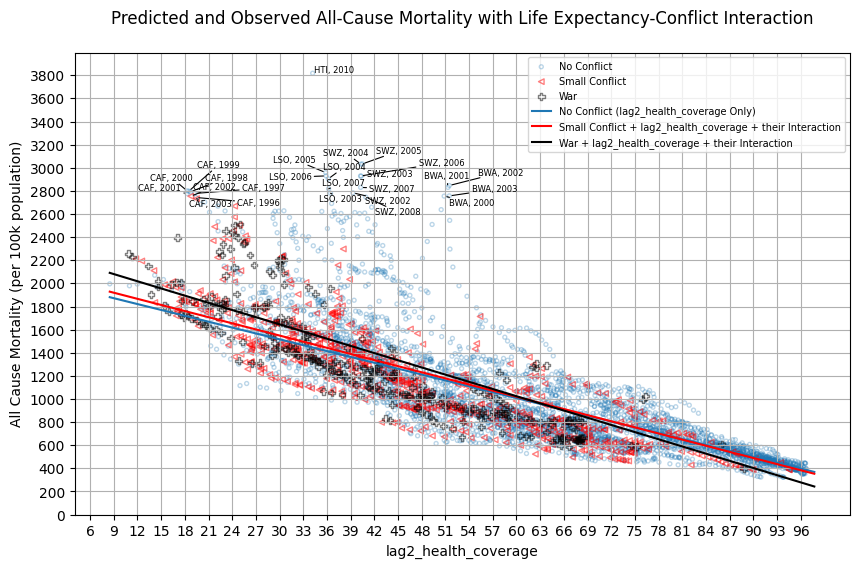

In [ ]:
from adjustText import adjust_text
### plotting interactions 1
### based on Aiken, West, 1991, pp. 12-14
### with globally averaged covariates added to simple slopes
### BUT since conflict_type is a categorical AND the interactions
### get "activated" by conflict type (each gets its own slope)
### I have not used the global average of 'Small Conflict' and 'War'
### but instead have in those cases
predictions = False

### linear PanelOLS
residuals = war_health.resids
fitted = war_health._fitted
coefs =  war_health._params
exog = war_health.model.exog.dataframe.copy()
texog = exog.copy().reset_index()
varnames = exog.columns
X = war_health.model.exog.dataframe.copy().values
y = test.all_cause_conflict_removed_popnormed.copy()
coef_dict = dict(zip(war_health._var_names, coefs))

# ### GLM
# coefs = war_health.params
# X = model.exog
# exog=test.iloc[:,1:].copy()
# exog = sm.add_constant(exog)
# texog = exog.copy().reset_index()
# y = test.iloc[:,0]
# coef_dict = dict(zip(exog.columns,coefs))


category_markers = {'No Conflict': 'o', 'Small Conflict': '<', 'War': 'P'}
exog.loc[exog['War']==1, 'War']+=1 # where War add 1 so that war has category == 1 and then we can add it to conflict
conflict_cats = exog['Small Conflict'] + exog['War'] # possible because categories are mutually exclusive
cchoices = ['No Conflict', 'Small Conflict', 'War']
cconds = [conflict_cats==0, conflict_cats==1, conflict_cats==2]
exog['conflict_cat'] = np.select(cconds,cchoices)
exog['all_cause_mortality'] = y # implied is however: all_cause_conflict_removed_popnormed
exog['markersize'] = (conflict_cats+1)*8
exog['edgecolor'] = np.select(cconds, ['#1f77b4', 'red', 'black'])
covariates_columns = [c for c in test.columns
                      if not c==interaction_var and not c=='all_cause_conflict_removed_popnormed'
                      and not c=='interaction_war_'+interaction_var and not c=='interaction_small_conflict_' + interaction_var]

extreme_points = test.reset_index().nlargest(25, 'all_cause_conflict_removed_popnormed')[['ISO', 'year']]

plt.figure(figsize=(10, 6))
for conflict, marker in category_markers.items():
    if conflict != 'No Conflict':
        plt.scatter(exog.loc[exog['conflict_cat']==conflict, interaction_var], exog.loc[exog['conflict_cat']==conflict, 'all_cause_mortality'],
                    s=exog.loc[exog['conflict_cat'] == conflict, 'markersize'],
                    edgecolor=exog.loc[exog['conflict_cat'] == conflict, 'edgecolor'], marker=marker, alpha=0.5, label=conflict, facecolor='none')
    else:
        plt.scatter(exog.loc[exog['conflict_cat']==conflict, interaction_var], exog.loc[exog['conflict_cat']==conflict, 'all_cause_mortality'],
                    s=exog.loc[exog['conflict_cat'] == conflict, 'markersize'],
                    edgecolor=exog.loc[exog['conflict_cat'] == conflict, 'edgecolor'],  alpha=0.3, label=conflict, facecolor='none')

# Add labels for extreme points
texts = []
for i, point in extreme_points.iterrows():
    texts.append(plt.text(test.reset_index().loc[i, interaction_var], test.reset_index().loc[i, 'all_cause_conflict_removed_popnormed'], f"{point['ISO']}, {int(point['year'])}", fontsize=6))
adjust_text(texts, arrowprops=dict(arrowstyle="-", color='k', lw=0.8))

### for slicing row of data based on conflict scenario
no_conflict_ix =(texog['War']==0) & (texog['Small Conflict']==0)
small_conflict_ix = texog['Small Conflict']==1
war_ix = texog['War']==1

### OLS predicting linear model outcomes based on observed values
pred_mortality_no_conflict = (X[no_conflict_ix] @ coefs)
pred_mortality_small_conflict = (X[small_conflict_ix] @ coefs)
pred_mortality_war = (X[war_ix] @ coefs)

### OLS continuous increase of interaction var and averaged covariates
# DOES NOT AVERAGE BOOLEAN VARS IF INCL. IN MODEL! (added separately)
le = np.linspace(exog[interaction_var].min(), exog[interaction_var].max()+exog[interaction_var].std()/20, 100)
# cov_col_ix = [exog.columns.get_loc(col) for col in covariates_columns]
cov_col_ix = np.array([exog.columns.get_loc(col) for col in covariates_columns if not col in ('War', 'Small Conflict')]) # we won't use these for averaging and instead add them separately for each conflict case whose simple slope we plot
bool_condition_mask = (pd.DataFrame(X[:, cov_col_ix]).nunique()==2) # gets all the boolean columns
bool_col_ix = bool_condition_mask[bool_condition_mask].index
nonbool_mask = (pd.DataFrame(X[:, cov_col_ix]).nunique()!=2)
nonbool_col_ix = nonbool_mask[nonbool_mask].index
nonbool_cov_coefs = coefs[cov_col_ix[nonbool_col_ix]]
bool_cov_coefs = coefs[cov_col_ix[bool_col_ix]]
cov_coefs = coefs[cov_col_ix]
global_avg_covs = X[:, cov_col_ix].mean(axis=0) @ cov_coefs
global_avg_covs_obsolete = X[:, [exog.columns.get_loc(col) for col in covariates_columns]].mean(axis=0) \
                            @ coefs[[exog.columns.get_loc(col) for col in covariates_columns]]
# take covariate average for each conflict case, instead of global avg covariates
noc_covs_avg = X[np.ix_(no_conflict_ix, cov_col_ix)].mean(axis=0) @ cov_coefs
smc_covs_avg = X[np.ix_(small_conflict_ix, cov_col_ix)].mean(axis=0) @ cov_coefs
war_covs_avg = X[np.ix_(war_ix, cov_col_ix)].mean(axis=0) @ cov_coefs

# ### GLM continuous increase of interaction var and averaged covariates
#### this has not been adjusted to check for other boolean columns
# le = np.linspace(exog[interaction_var].min(), exog[interaction_var].max()+1, 100)
# cov_col_ix = [exog.columns.get_loc(col) for col in covariates_columns] # [1, 2, 3, 4, 5, 6, 7, 8, 9]
# cov_coefs = coefs[cov_col_ix]
# noc_covs_avg = X[np.ix_(no_conflict_ix, cov_col_ix)].mean(axis=0)
# smc_covs_avg = X[np.ix_(small_conflict_ix, cov_col_ix)].mean(axis=0)
# war_covs_avg = X[np.ix_(war_ix, cov_col_ix)].mean(axis=0)

# GLM_nc_avg = pd.DataFrame({'const': np.ones(len(le)),
#                             interaction_var: le,
#                            'Small Conflict': np.zeros(len(le)),
#                            'War': np.zeros(len(le)),
#                             'interaction_small_conflict_' + interaction_var: np.zeros(len(le)),
#                             'interaction_war_' + interaction_var: np.zeros(len(le))
#                            })
# GLM_nc_avg[covariates_columns] = noc_covs_avg
# GLM_smc_avg = GLM_nc_avg.copy()
# GLM_smc_avg[covariates_columns] = smc_covs_avg
# GLM_smc_avg['Small Conflict'] = 1
# GLM_war_avg = GLM_nc_avg.copy()
# GLM_war_avg[covariates_columns] = war_covs_avg
# GLM_war_avg['War'] = 1
# GLM_pred_no_conflict = war_health.predict(GLM_nc_avg)
# GLM_pred_small_conflict = war_health.predict(GLM_smc_avg)
# GLM_pred_war = war_health.predict(GLM_war_avg)

for conflict in category_markers.keys():
    if conflict == 'No Conflict':
        if not predictions:
            ### OLS holding cov constant and varying interaction var
            pred_y = coef_dict[interaction_var] * le + global_avg_covs # + noc_covs_avg
            plt.plot(le, pred_y, color='#1f77b4', label=f'No Conflict ({interaction_var} Only)')
        else:
            ## OLS predictions
            nc = np.vstack([texog.loc[no_conflict_ix, interaction_var].values, pred_mortality_no_conflict]).T
            nc = nc[nc[:, 0].argsort()]
            plt.plot(nc[:, 0], nc[:,1], color='#1f77b4', label=f'Predicted No Conflict ({interaction_var} Only)', alpha=0.65, linewidth=1)
        ### GLM holding cov constant and varying life-exp
        # plt.plot(GLM_nc_avg[interaction_var], GLM_pred_no_conflict, color='#1f77b4', label=f'No Conflict ({interaction_var} Only)', alpha=0.65, linewidth=1)
    elif conflict == 'Small Conflict':
        if not predictions:
            ### OLS holding cov constant and varying interaction var
            pred_y = coef_dict[interaction_var] * le + coef_dict['interaction_small_conflict_' + interaction_var] * le \
                        + coef_dict['Small Conflict'] \
                        + global_avg_covs # + smc_covs_avg
            plt.plot(le, pred_y, color='red', label=f'Small Conflict + {interaction_var} + their Interaction')
        else:
            ## OLS predictions
            sc = np.vstack([texog.loc[small_conflict_ix, interaction_var].values, pred_mortality_small_conflict]).T
            sc = sc[sc[:, 0].argsort()]
            plt.plot(sc[:,0], sc[:, 1], color='red', label=f'Predicted Small Conflict + {interaction_var} + their Interaction', linewidth=1, alpha=0.75)
        ### GLM holding cov constant and varying interaction var
        # plt.plot(GLM_smc_avg[interaction_var], GLM_pred_small_conflict, color='red', label=f'Small Conflict + {interaction_var} + Their Interaction', linewidth=1, alpha=0.75)
    elif conflict == 'War':
        if not predictions:
            ### OLS holding cov constant and varying interaction var
            pred_y = coef_dict[interaction_var] * le + coef_dict['interaction_war_' + interaction_var] * le \
                        + coef_dict['War']  \
                        + global_avg_covs # + war_covs_avg #
            plt.plot(le, pred_y, color='black', label=f'War + {interaction_var} + their Interaction')
        else:
            ### OLS predictions
            w = np.vstack([texog.loc[war_ix, interaction_var].values, pred_mortality_war]).T
            w = w[w[:,0].argsort()]
            plt.plot(w[:,0],w[:,1],color='black', label=f'Predicted War + {interaction_var} + their Interaction', alpha=0.85, linewidth=1)
        # ### GLM holding cov constant and varying life-exp
        # plt.plot(GLM_war_avg[interaction_var], GLM_pred_war,color='black', label=f'War + {interaction_var} + their Interaction', alpha=0.85, linewidth=1)

# plt.title(f'{interaction_var} Interaction Impact on All-Cause Mortality\n')
plt.title('Predicted and Observed All-Cause Mortality with Life Expectancy-Conflict Interaction\n')
plt.legend(fontsize=7)
plt.xlabel(interaction_var)
plt.ylabel('All Cause Mortality (per 100k population)')
try:
    plt.xticks(np.arange(int(exog[interaction_var].min()-int(exog[interaction_var].std()/10)),
                        int(exog[interaction_var].max()+int(exog[interaction_var].std()/10)),
                        int((exog[interaction_var].max()-exog[interaction_var].min())/25)))
except:
    pass

plt.yticks(np.arange(0,y.max()+np.std(y)/20,200))
plt.grid(True)
plt.show()


In [ ]:
extreme_points.ISO.value_counts()
# the 80 most extreme cases are just these countries: ['HTI', 'SWZ', 'LSO', 'BWA', 'CAF', 'ZMB', 'ZWE', 'BDI', 'MWI']
# the 200 most extreme cases are these ['HTI', 'SWZ', 'LSO', 'BWA', 'CAF', 'ZMB', 'ZWE', 'BDI', 'MWI', 'RWA', 'UGA', 'ETH', 'COG', 'GNB', 'NAM', 'SLB', 'CIV', 'ERI','BFA']
# going by value counts, the frequency with which each country is in the 200 most extreme cases is this:
                # CAF    25
                # LSO    23
                # SLB    20
                # SWZ    18
                # ZWE    15
                # MWI    13
                # BWA    13
                # ZMB    13
                # GNB     9
                # BDI     9
                # CIV     8
                # UGA     8
                # NAM     7
                # RWA     6
                # ETH     5
                # COG     5
                # ERI     1
                # HTI     1
                # BFA     1
extreme_points[extreme_points.ISO=='SLB']

,ISO,year


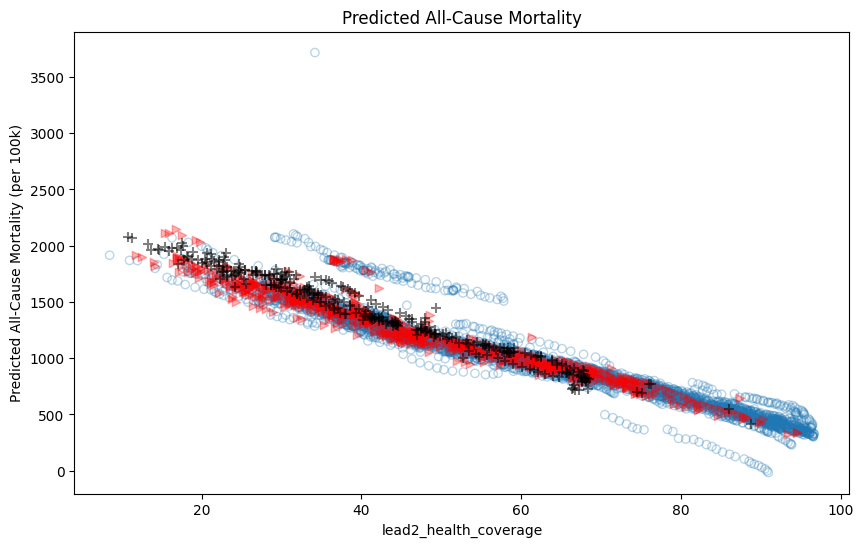

In [ ]:
### plotting predictions
alpha = 0.4
coefs =  war_health._params
exog = model.exog.dataframe
X = exog.values
y = test.iloc[:,0]
texog = exog.copy().reset_index()
no_conflict_ix =(texog['War']==0) & (texog['Small Conflict']==0)
small_conflict_ix = texog['Small Conflict']==1
war_ix = texog['War']==1

pred_mortality_no_conflict = (X[no_conflict_ix] @ coefs)
pred_mortality_small_conflict = (X[small_conflict_ix] @ coefs)
pred_mortality_war = (X[war_ix] @ coefs)
plt.figure(figsize=(10, 6))
# plt.contourf(np.vstack([texog[no_conflict_ix, interaction_var].values, pred_mortality_no_conflict]), cmap='viridis', alpha=0.5, label='No Conflict')
# plt.contourf(np.vstack([texog[small_conflict_ix, interaction_var].values, pred_mortality_small_conflict]), cmap='viridis', alpha=0.5, label='Small Conflict')
# plt.contourf(np.vstack([texog[war_ix, interaction_var].values, pred_mortality_war]), cmap='viridis', alpha=0.5, label='War')
plt.scatter(texog.loc[no_conflict_ix, interaction_var].values, pred_mortality_no_conflict, marker='o', facecolor='none', edgecolor='#1f77b4', alpha=0.3)
plt.scatter(texog.loc[small_conflict_ix, interaction_var].values, pred_mortality_small_conflict, marker='>', c='red', alpha=0.3)
plt.scatter(texog.loc[war_ix, interaction_var].values, pred_mortality_war, marker='+', c='black', alpha=0.5, s=50)

plt.xlabel(interaction_var)
plt.ylabel('Predicted All-Cause Mortality (per 100k)')
plt.title('Predicted All-Cause Mortality')
plt.show()



###### MARGINAL effects plotting and calculating

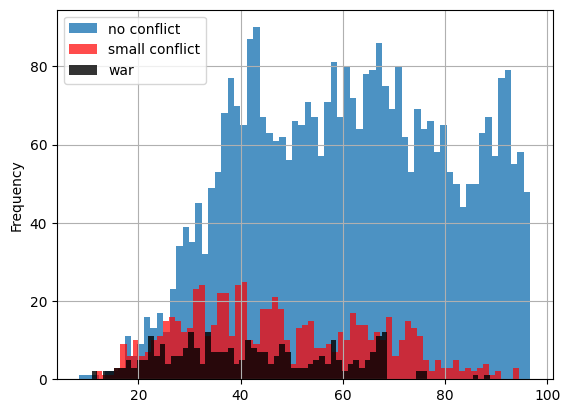

57.85351091717129
57.7323005672024


In [ ]:
# health coverage distribution of war torn countries
exog = model.exog.dataframe.copy()
texog = exog.copy().reset_index()
texog[(texog.War==0) & (texog['Small Conflict']==0)].lag2_health_coverage.plot.hist(bins=70, alpha=0.8, color='#1f77b4', label='no conflict')
texog[texog['Small Conflict']==1].lag2_health_coverage.plot.hist(bins=70, alpha=0.7, color='red', label='small conflict')
texog.loc[texog.War==1].lag2_health_coverage.plot.hist(bins=70, alpha=0.8,color='black', label='war')
plt.grid(True)
plt.legend()
plt.show()
print(texog.lag2_health_coverage.mean())
print(texog.lag2_health_coverage.median())

In [ ]:
set(merged.ISO.unique()) - set(merged[covars+['gbd_pop_est']].ISO.unique()) # no countries dropped when pop est is included

set()

In [ ]:
### ESTIMATING MITIGATION BY INTERACTION
### RAW MORTALITY WAS TRANSFORMED BY /POPULATION * 100K TO GET MORTALITY PER 100K PEOPLE
### THIS WAS USED IN MODEL AND COEFFICIENTS ARE THUS IMPACT ON MORTALITY PER 100K
### NOW WE NEED TO REVERSE THIS: * POPULATION/100000, SO WE NEED TO GET gbd_pop_est AGAIN

coefs =  war_health._params
exog = model.exog.dataframe.copy()
texog = cat_convert(merged, covars+['gbd_pop_est']).set_index(['ISO', 'year'])
texog = test.reset_index().merge(merged[['ISO', 'year', 'gbd_pop_est']], on=['ISO', 'year'], how='inner').drop_duplicates()
warsframe = texog.loc[texog.War==1].copy()

varnames = exog.columns
X = texog[varnames].values # model.exog.dataframe.copy().values
y = test.all_cause_conflict_removed_popnormed.copy()
coef_dict = dict(zip(war_health._var_names, coefs))

no_conflict_ix =(texog['War']==0) & (texog['Small Conflict']==0)
small_conflict_ix = texog['Small Conflict']==1
war_ix = texog['War']==1
wars = (X[war_ix,:] @ coefs)

warsframe['predicted_total_mortality_in_war'] = wars

#### below was not used
# # get observed maximum in health-baseline across total data
# max_health_coverage = np.repeat(texog.lag2_health_coverage.max(), len(warsframe)) # the value is 96.696083
# X_hypo = texog.copy().loc[war_ix]
# X_hypo.loc[:, ['lag2_health_coverage','interaction_war_lag2_health_coverage']] = np.stack([max_health_coverage,max_health_coverage], axis=1)
# X_hypo = X_hypo.set_index(['ISO', 'year'])[model.exog.dataframe.columns].values
# warsframe['hypothetical_mortality_in_war_with_max_health'] = X_hypo @ coefs
# warsframe['difference_predicted_vs_hypothetical_max'] = warsframe['predicted_total_mortality_in_war'] - warsframe['hypothetical_mortality_in_war_with_max_health']
# # get mean of observed health-baseline across total data
# avg_health_coverage = np.repeat(texog.lag2_health_coverage.mean(), len(warsframe)) # the value is 57.165220944908455 # median is around 56
# X_hypo = texog.copy().loc[war_ix]
# X_hypo.loc[:, ['lag2_health_coverage','interaction_war_lag2_health_coverage']] = np.stack([avg_health_coverage,avg_health_coverage], axis=1)
# X_hypo = X_hypo.set_index(['ISO', 'year'])[model.exog.dataframe.columns].values
# warsframe['hypothetical_mortality_in_war_with_mean_health'] = X_hypo @ coefs
# warsframe['difference_predicted_vs_hypothetical_mean'] = warsframe['predicted_total_mortality_in_war'] - warsframe['hypothetical_mortality_in_war_with_mean_health']
# np.argsort(warsframe.difference_predicted_vs_hypothetical_max.values) == np.argsort(warsframe.predicted_total_mortality_in_war.values)
# np.argsort(warsframe.difference_predicted_vs_hypothetical_mean.values) == np.argsort(warsframe.difference_predicted_vs_hypothetical_max.values) ## remarkably similar!!!


#### INTERACTION EFFECTS
## effect of interaction d_mortality/(d_health d_war) wrt different health levels
warsframe['interaction_effect_predicted_on_observed'] = warsframe['lag2_health_coverage'] * coef_dict['interaction_war_lag2_health_coverage']
warsframe['interaction_effect_global_max'] = texog.lag2_health_coverage.max() * coef_dict['interaction_war_lag2_health_coverage']
warsframe['interaction_effect_global_mean'] = texog.lag2_health_coverage.mean() * coef_dict['interaction_war_lag2_health_coverage']
## effect DIFFERENCE for interaction d_mortality/(d_health d_war) wrt different health levels
warsframe['diff_interaction_predicted_vs_hypothetical_mean'] = (texog.lag2_health_coverage.mean() - warsframe['lag2_health_coverage'])* coef_dict['interaction_war_lag2_health_coverage']
warsframe['diff_interaction_predicted_vs_hypothetical_max'] = (texog.lag2_health_coverage.max() - warsframe['lag2_health_coverage'])* coef_dict['interaction_war_lag2_health_coverage']

## effects of health alone d_mortality/d_health wrt different health AND conflict types
# not calculated

### marginal DIFFERENCE for health d_mortality/d_health
# warsframe['diff_health_predicted_vs_hypothetical_mean'] = (texog.lag2_health_coverage.mean() - warsframe['lag2_health_coverage']) * (coef_dict['interaction_war_lag2_health_coverage'] + coef_dict['lead2_health_coverage'])
# warsframe['diff_health_predicted_vs_hypothetical_max'] = (texog.lag2_health_coverage.max() - warsframe['lag2_health_coverage']) * (coef_dict['interaction_war_lag2_health_coverage']+ coef_dict['lead2_health_coverage'])

iso_ctry_map = {'SDN': 'Sudan', 'COD': 'Democratic Republic of the Congo', 'IND': 'India', 'AFG': 'Afghanistan', 'NGA': 'Nigeria',
    'BDI': 'Burundi','IRQ': 'Iraq','MEX': 'Mexico','LKA': 'Sri Lanka','UGA': 'Uganda','ETH': 'Ethiopia',
    'PAK': 'Pakistan','SOM': 'Somalia','AGO': 'Angola','SLE': 'Sierra Leone','YEM': 'Yemen','RWA': 'Rwanda',
    'TUR': 'Turkey','COL': 'Colombia','DZA': 'Algeria','NPL': 'Nepal','MMR': 'Myanmar','PHL': 'Philippines',
    'TCD': 'Chad','CAF': 'Central African Republic','IDN': 'Indonesia','RUS': 'Russia','SSD': 'South Sudan',
    'AZE': 'Azerbaijan','CMR': 'Cameroon','TJK': 'Tajikistan','ERI': 'Eritrea','LBY': 'Libya','COG': 'Republic of the Congo',
    'LBR': 'Liberia','BIH': 'Bosnia and Herzegovina','CIV': 'Côte d\'Ivoire','BRA': 'Brazil','PER': 'Peru','MOZ': 'Mozambique',
    'GHA': 'Ghana','MLI': 'Mali','UKR': 'Ukraine','ISR': 'Israel'}


warsframe['country'] = warsframe.ISO.map(iso_ctry_map)
warsframe['region'] = warsframe.ISO.map(iso_region)
warsframe['continent'] = warsframe.ISO.map(iso_continent)

# np.argsort(warsframe.diff_interaction_predicted_vs_hypothetical_mean.values) == np.argsort(warsframe.diff_interaction_predicted_vs_hypothetical_max.values) # identical orders

kept:  4593 , dropped:  1518  = 24.840451644575356 % dropped
features:  18


In [ ]:
measures = ['mean', 'max']
for measure in measures:
    ### WARNING THE BELOW TAKES THE SUM, MOST COVARIATES ARE NO LONGER REPRESENTATIVE AFTER THIS, BUT HERE THE ONLY INTEREST IS IN AGGREGATE INTERACTION EFFECTS!!!
    warsagg = warsframe.groupby('ISO').agg('sum').reset_index().sort_values(by='diff_interaction_predicted_vs_hypothetical_' + measure)
    warsagg['country'] = warsagg.ISO.map(iso_ctry_map)
    warsagg['region'] = warsagg.ISO.map(iso_region)
    warsagg['continent'] = warsagg.ISO.map(iso_continent)
    subset = warsagg.iloc[:10]
    import plotly.express as px
    import plotly.graph_objects as go
    fig = go.Figure()

    fig.add_trace(go.Scatterpolar(
        r=subset['interaction_effect_global_max'].values,
        theta=subset.country.tolist(),
        fill='toself',
        name='interaction effect with global max health coverage'
    ))

    fig.add_trace(go.Scatterpolar(
        r=subset['interaction_effect_global_mean'].values,
        theta=subset.country.tolist(),
        fill='toself',
        name='interaction effect with global mean health coverage'
    ))

    fig.add_trace(go.Scatterpolar(
        r=subset['interaction_effect_predicted_on_observed'].values,
        theta=subset.country.tolist(),
        fill='toself',
        name='interaction effect with observed health coverage'
    ))

    fig.update_layout(
        title_text='Ten Countries Where Elevating Health Coverage to Global ' + measure.capitalize() + ' Would Have Made Largest Difference on Mortality in War (Aggregated 1990-2019)',
    polar=dict(
        radialaxis=dict(
        visible=True,
        range=(0,-8500),
        tickangle=90,
        )),
    showlegend=True
    )

    fig.show()
    fig.write_html("radarplot interaction effects country, global " + measure + " diff ordered, mortality per 100k.html")

In [ ]:
### WARNING THE BELOW TAKES THE SUM, MOST COVARIATES ARE NO LONGER REPRESENTATIVE AFTER THIS, BUT HERE THE ONLY INTEREST IS IN AGGREGATE INTERACTION EFFECTS!!!
measure = 'mean'
pops = merged[['ISO', 'gbd_pop_est']]
pops['region'] = merged.ISO.map(iso_region)
pops['continent'] = merged.ISO.map(iso_continent)
pops = pops.dropna()
pops_isomax = pops.groupby('ISO')['gbd_pop_est'].max().reset_index()
region_pop = pops_isomax.merge(pops[['ISO', 'region']], on=['ISO']).drop_duplicates()\
                            .groupby('region')['gbd_pop_est'].sum()\
                            .apply(lambda x: str("{:,.0f}".format(int(np.round(x))))).to_dict() # aggregating and formatting numbers
continent_pop = pops_isomax.merge(pops[['ISO', 'continent']], on=['ISO']).drop_duplicates()\
                            .groupby('continent')['gbd_pop_est'].sum()\
                            .apply(lambda x: str("{:,.0f}".format(int(np.round(x))))).to_dict() # aggregating and formatting numbers
#pops.groupby('region')['gbd_pop_est'].sum().apply(lambda x: str("{:,.0f}".format(int(np.round(x))))).to_dict() # aggregating and formatting numbers
# continent_pop = pops.groupby('continent')['gbd_pop_est'].sum().apply(lambda x: str("{:,.0f}".format(int(np.round(x))))).to_dict() # aggregating and formatting numbers

warsagg2 = warsagg.groupby('region').agg('sum').reset_index().sort_values(by='diff_interaction_predicted_vs_hypothetical_' + measure)
warsagg2['gbd_pop_est'] = warsagg2.region.map(region_pop)
fig = go.Figure()
thetas = [c + ', population: '+ v for (c,v) in warsagg2[['region','gbd_pop_est']].values]
fig.add_trace(go.Scatterpolar(
      r=warsagg2['interaction_effect_global_max'].values,
      theta=thetas,
      fill='toself',
      name='interaction effect with global max health coverage'
))

fig.add_trace(go.Scatterpolar(
      r=warsagg2['interaction_effect_global_mean'].values,
      theta=thetas,
      fill='toself',
      name='interaction effect with global mean health coverage'
))

fig.add_trace(go.Scatterpolar(
      r=warsagg2['interaction_effect_predicted_on_observed'].values,
      theta=thetas,
      fill='toself',
      name='interaction effect with observed health coverage'
))

fig.update_layout(
    title_text='Regions Where Elevating Health Coverage Would Have Made Largest Difference on Mortality in War (Aggregated 1990-2019)',
  polar=dict(
    radialaxis=dict(
      visible=True,
      range=(0,-23000),
    )),
  showlegend=True
)

fig.show()
fig.write_html("radarplot interaction effects aggregated region, mortality per 100k.html")

warsagg3 = warsagg.groupby('continent').agg('sum').reset_index().sort_values(by='diff_interaction_predicted_vs_hypothetical_' + measure)
warsagg3['gbd_pop_est'] = warsagg3.continent.map(continent_pop)
thetas = [c + ', population: '+ v for (c,v) in warsagg3[['continent','gbd_pop_est']].values]
fig = go.Figure()

fig.add_trace(go.Scatterpolar(
      r=warsagg3['interaction_effect_global_max'].values,
      theta=thetas,
      fill='toself',
      name='interaction effect with global max health coverage'
))

fig.add_trace(go.Scatterpolar(
      r=warsagg3['interaction_effect_global_mean'].values,
      theta=thetas,
      fill='toself',
      name='interaction effect with global mean health coverage'
))

fig.add_trace(go.Scatterpolar(
      r=warsagg3['interaction_effect_predicted_on_observed'].values,
      theta=thetas,
      fill='toself',
      name='interaction effect with observed health coverage'
))

fig.update_layout(
    title_text='Continents Where Elevating Health Coverage Would Have Made Largest Difference on Mortality in War (Aggregated 1990-2019)',
  polar=dict(
    radialaxis=dict(
      visible=True,
      range=(0,-50000),
    )),
  showlegend=True
)

fig.show()
fig.write_html("radarplot interaction effects aggregated continent, mortality per 100k.html")

<ipython-input-74-6a7129df5e86>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-74-6a7129df5e86>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
## TODO:
## estimate total toll & CI95
## merge ucdp conflict deaths and sum them for comparison with estimated indirect mortality and also merge small conflict
## in the comparison with wise's table also use small conflict data?
rescale = (warsframe['gbd_pop_est']/100000).values

ci95_coef = war_health.conf_int().loc['interaction_war_lag2_health_coverage', ['lower', 'upper']].values # shape (2,)

ci95 = ((np.stack([warsframe['lag2_health_coverage'].values, np.repeat(texog.lag2_health_coverage.mean(),
    len(warsframe)), np.repeat(texog.lag2_health_coverage.max(), len(warsframe))], axis=1)).T[..., None]  # now shaped (3, 341, 1)
        * ci95_coef.reshape(1,1,-1) * rescale.reshape(1, -1, 1)).sum(axis=1) # getting some 3D tensor practice in
ci95 = np.round(ci95)
print(f'total lives saved during war with observed levels of health coverage:\
\n{(warsframe.interaction_effect_predicted_on_observed.values * rescale).sum().round()}, CI95 {ci95[0]}')
print(f'total lives that would have been saved during war with global mean levels of health coverage:\
\n{(warsframe.interaction_effect_global_mean.values * rescale).sum().round()}, CI95 {ci95[1]}')
print(f'total lives that would have been saved during war with global max levels of health coverage:\
\n{(warsframe.interaction_effect_global_max.values * rescale).sum().round()}, CI95 {ci95[2]}')
print('\nlives lost to war ',(rescale * coef_dict['War']).sum().round(), \
', CI95 ',(war_health.conf_int().loc['War', ['lower', 'upper']].values.reshape(-1,1) * rescale.reshape(1,-1)).sum(axis=1).round())
print('wars - observed interaction: ', (rescale * coef_dict['War']).sum().round() + (warsframe.interaction_effect_predicted_on_observed.values * rescale).sum().round())

# East Timor not in data and Angola largely falls outside the data here; added India because it showed up in my previous graphs
isos = ['BDI', 'COG', 'SDN', 'COD', 'IRQ', 'LBR', 'UGA', 'SLE', 'SSD', 'IND'] # compare, roughly, with table in: Wise - The Epidemiologic Challenge to the Conduct of Just War: Confronting Indirect Civilian Casualties of War
# these below are (as close as possible given the data range here) the year-ranges of conflicts with indirect mortality estimates given in Wise
years = [list(range(1993,2001)), [2003], list(range(2003,2006)), list(range(1998, 2003)),
         list(range(1990,2012)), list(range(1990, 1997)), [2005], list(range(1991,2003)), list(range(1999, 2006)), list(range(1990,2019))]
conflictcountries = {}
conflictyearcountries = {}
for i,iso in enumerate(isos):
    scaler = (warsframe[(warsframe['ISO'] == iso)]['gbd_pop_est']/100000).values
    yearscaler = (warsframe[(warsframe['ISO'] == iso) & (warsframe.year.isin(years[i]))]['gbd_pop_est']/100000).values
    conflictcountries[iso + ' (1990-2019)'] = \
                            (scaler * coef_dict['War']).sum().round() + (warsframe[warsframe['ISO'] == iso]['interaction_effect_predicted_on_observed'] * scaler).sum().round()
    if len(years[i]) > 1:
        y = (str(years[i][0])+'-'+str(years[i][-1])).replace('[', '(').replace(']', ')')
    else:
        y = str(years[i]).replace('[', '(').replace(']', ')')
    conflictyearcountries[iso + ' ' + y] = \
                            (yearscaler * coef_dict['War']).sum().round() + \
                             (warsframe[(warsframe['ISO'] == iso) & (warsframe.year.isin(years[i]))]['interaction_effect_predicted_on_observed'] * yearscaler).sum().round()
print('estimated indirect mortality in select countries with war for 1990-2015\n', pd.DataFrame(list(conflictcountries.items()), columns=['ISO', 'Estimated War Mortality']))
print('estimated indirect mortality in select countries with war for certain periods\n', pd.DataFrame(list(conflictyearcountries.items()), columns=['ISO', 'Estimated War Mortality']))

total lives saved during war with observed levels of health coverage:
-49330013.0, CI95 [-68677453. -29982573.]
total lives that would have been saved during war with global mean levels of health coverage:
-71213000.0, CI95 [-99143041. -43282960.]
total lives that would have been saved during war with global max levels of health coverage:
-119025071.0, CI95 [-1.65707207e+08 -7.23429350e+07]

lives lost to war  84939819.0 , CI95  [5.81682130e+07 1.11711425e+08]
wars - observed interaction:  35609806.0
estimated indirect mortality in select countries with war for 1990-2015
                ISO  Estimated War Mortality
0  BDI (1990-2019)                  91852.0
1  COG (1990-2019)                   8956.0
2  SDN (1990-2019)                 712066.0
3  COD (1990-2019)                1507900.0
4  IRQ (1990-2019)                 244887.0
5  LBR (1990-2019)                   7384.0
6  UGA (1990-2019)                 275663.0
7  SLE (1990-2019)                  33091.0
8  SSD (1990-2019)       

marginal effect of **conflict** by region vs observed deaths (based on UCDP)

(d mortality)/(d conflict_type) =
     β_conflict_type + β_conflict_type:health_coverage * health_coverage


In [ ]:
ratios = texog.copy().merge(merged[['ISO', 'year', 'conflict_deaths']]).drop_duplicates()
rescale = ratios['gbd_pop_est']/100000
covariates_columns = [c for c in test.columns
                      if not c==interaction_var and not c=='all_cause_conflict_removed_popnormed'
                      and not c=='interaction_war_'+interaction_var and not c=='interaction_small_conflict_' + interaction_var]
cov_col_ix = [exog.columns.get_loc(col) for col in covariates_columns if not col in ('War', 'Small Conflict')] # we won't use these for averaging and instead add them separately for each conflict case whose simple slope we plot
cov_coefs = coefs[cov_col_ix]
global_avg_covs = X[:, cov_col_ix].mean(axis=0) @ coefs[cov_col_ix] # X was defined above as: varnames = exog.columns # X = texog[varnames].values
ratios['pred_mortality'] = (X @ coefs) * rescale
ratios['pred_conflict'] = (ratios['Small Conflict'].values * coef_dict['Small Conflict'] + ratios.War.values * coef_dict['War']) * rescale
ratios['mitigation'] = (coef_dict['interaction_small_conflict_lag2_health_coverage'] * ratios['interaction_small_conflict_lag2_health_coverage']\
                        + coef_dict['interaction_war_lag2_health_coverage'] * ratios['interaction_war_lag2_health_coverage'])*rescale
ratios['conflict-mitigation'] = ratios['pred_conflict'] + ratios['mitigation']
ratios['region'] = ratios.ISO.map(iso_region)
ratios['continent'] = ratios.ISO.map(iso_continent)
ratios = ratios.groupby('region')[['pred_conflict', 'mitigation', 'conflict-mitigation', 'conflict_deaths']].agg('sum')
ratios['conflict_deaths/(conflict-mitigation)'] = ratios['conflict_deaths']/ratios['conflict-mitigation']
print('NOTE the predicted conflict deaths are INDIRECT\n==> so we are here looking at the ratio of DIRECT deaths to the marginal effect of conflicts which estimate INDIRECT mortality')
ratios.sort_values(by='conflict_deaths/(conflict-mitigation)')

NOTE the predicted conflict deaths are INDIRECT
==> so we are here looking at the ratio of DIRECT deaths to the marginal effect of conflicts which estimate INDIRECT mortality


,pred_conflict,mitigation,conflict-mitigation,conflict_deaths,conflict_deaths/(conflict-mitigation)
region,,,,,
Europe,4.694567e+06,-4.784251e+06,-8.968396e+04,65465.0,-0.729952
Canada-US,6.899004e+05,-8.626820e+05,-1.727816e+05,3108.0,-0.017988
East Asia,1.775605e+06,-2.036327e+06,-2.607224e+05,303.0,-0.001162
South Asia,6.655535e+07,-3.652415e+07,3.003120e+07,341715.0,0.011379
Southeast Asia,7.630126e+06,-5.478414e+06,2.151712e+06,48668.0,0.022618
Western Africa,7.261499e+06,-4.068274e+06,3.193225e+06,102634.0,0.032141
Oceania,3.119067e+04,-1.696318e+04,1.422749e+04,512.0,0.035987
Eastern Africa,5.066210e+06,-2.368410e+06,2.697800e+06,214191.0,0.079395
Southern Africa,6.960089e+05,-3.476098e+05,3.483991e+05,31747.0,0.091123


In [ ]:
war_upper

array([18.3950673])

t-test of significance of simple slope of no conflict [2.47181386e-10], significant at alpha=0.01?: [ True]
t-test of significance of simple slope of small conflict [0.4587482], significant at alpha=0.01?: [False]
t-test of significance of simple slope of war [0.02021795], significant at alpha=0.01?: [False]


<ipython-input-7-c6bfc7747fb2>:373: RuntimeWarning: invalid value encountered in sqrt
  minus = (-b - np.sqrt(b**2 - 4*a*c))/(2*a)
<ipython-input-7-c6bfc7747fb2>:374: RuntimeWarning: invalid value encountered in sqrt
  plus = (-b + np.sqrt(b**2 - 4*a*c))/(2*a)


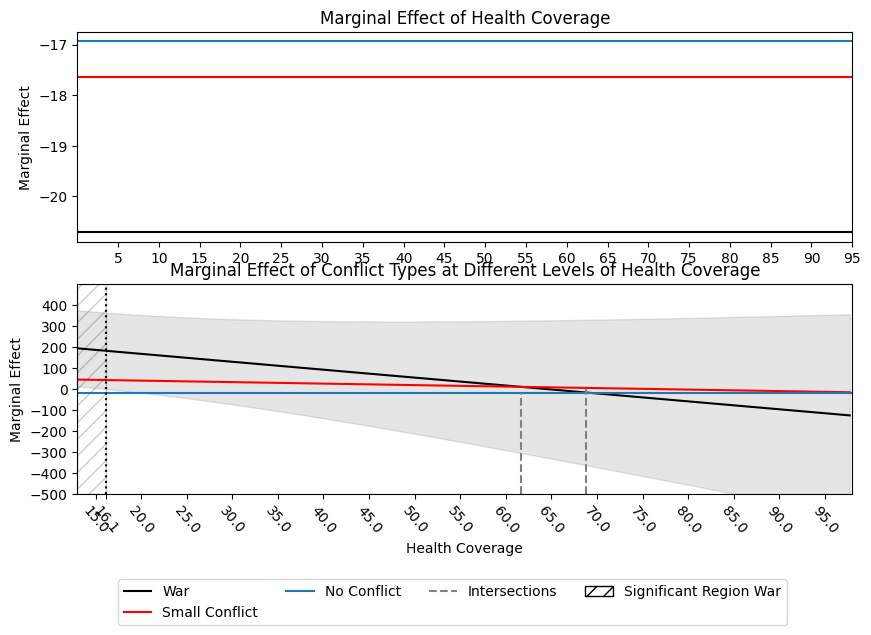

In [ ]:
## MARGINAL EFFECT of health coverage or conflict type
## abstract plotting

from matplotlib.lines import Line2D

conflict_type_mtx = [[0,0], # no conflict
                     [1,0], # small conflict
                     [0,1]] # war
exog = war_health.model.exog.dataframe.copy()
coef_dict = dict(zip(war_health._var_names, war_health._params))
health_coverage_vals = np.linspace(exog[interaction_var].min(), exog[interaction_var].max()+exog[interaction_var].std()/20, 100)
# marginal effect of health_coverage in interaction with different conflict types on all-cause mortality per 100k
dy_dhealth_coverage = coef_dict['lag2_health_coverage'] + conflict_type_mtx @ np.hstack([coef_dict['interaction_small_conflict_lag2_health_coverage'], coef_dict['interaction_war_lag2_health_coverage']])
# print('dy_dhealth_coverage', dy_dhealth_coverage)
# marginal effect of war and its interaction with health coverage on all-cause mortality per 100k
dy_dwar = coef_dict['War'] + coef_dict['interaction_war_lag2_health_coverage'] * health_coverage_vals
# print('dy_dwar', dy_dwar)
# marginal effect of small conflict and its interaction with health coverage on all-cause mortality per 100k
dy_dsmall_conflict = coef_dict['Small Conflict'] + coef_dict['interaction_small_conflict_lag2_health_coverage'] * health_coverage_vals
# print('dy_dsmall_conflict', dy_dsmall_conflict)
# marginal effect of no conflict and its interaction with health coverage on all-cause mortality per 100k
dy_dno_conflict = coef_dict['lag2_health_coverage']
# print('dy_dno_conflict', dy_dno_conflict)

plt.figure(figsize=(10, 6))
# Plot marginal effect of health coverage
plt.subplot(2, 1, 1)
plt.ylabel('Marginal Effect')
plt.xticks(np.arange(5,95+1, 5))
dy_dhealth_coverage_no_conflict = dy_dhealth_coverage[0]
dy_dhealth_coverage_small_conflict = dy_dhealth_coverage[1]
dy_dhealth_coverage_war = dy_dhealth_coverage[2]
plt.axhline(dy_dhealth_coverage_no_conflict, color='#1f77b4', linestyle='-', label='No Conflict')
plt.axhline(dy_dhealth_coverage_small_conflict, color='red', linestyle='-', label='Small Conflict')
plt.axhline(dy_dhealth_coverage_war, color='black', linestyle='-', label='War')
plt.title('Marginal Effect of Health Coverage')

# Plot marginal effect of conflict types
# war
plt.subplot(2, 1, 2)
plt.plot(health_coverage_vals, dy_dwar, color='black', label='War')
plt.xlabel('Health Coverage')
plt.ylabel('Marginal Effect')
plt.title('\n\nMarginal Effect of Conflict Types at Different Levels of Health Coverage')

percentile_dict, smc_values, smc_ci95, war_values, war_ci95, (war_lower, war_upper), (smc_lower, smc_upper) = ttest_simple_slopes(war_health)
war_ci95 = np.stack(war_ci95).squeeze()
smc_ci95 = np.stack(smc_ci95).squeeze()

plt.fill_between(health_coverage_vals, war_ci95[:,0], war_ci95[:,1], alpha=0.1, color='black')
if not np.isnan(smc_lower) and not np.isnan(smc_upper):
    plt.fill_between(health_coverage_vals, smc_ci95[:,0], smc_ci95[:,1], alpha=0.1, color='red')

# small conflict
plt.subplot(2, 1, 2)
plt.plot(health_coverage_vals, dy_dsmall_conflict, color='red', label='Small Conflict')

# plot marginal effect of no conflict
plt.subplot(2, 1, 2)
plt.axhline(dy_dno_conflict, color='#1f77b4', label='No Conflict')

## Add vertical lines where war-health interaction is significant
xlim_upper = 98
xlim_lower = 13
ylim_upper = 500
ylim_lower = -500
warhatch = '//'
smchatch = '\\\\'

## Add vertical dotted lines where lines cross
plt.plot(np.repeat(-(coef_dict['War'] - coef_dict['Small Conflict']) / (coef_dict['interaction_war_lag2_health_coverage'] - coef_dict['interaction_small_conflict_lag2_health_coverage']),2),
         np.array([ylim_lower, coef_dict['lag2_health_coverage']]),color='gray', linestyle='--')
plt.plot(np.repeat((coef_dict['lag2_health_coverage'] - coef_dict['Small Conflict']) /coef_dict['interaction_small_conflict_lag2_health_coverage'],2),
            np.array([ylim_lower, coef_dict['lag2_health_coverage']]), color='gray', linestyle='--')
plt.plot(np.repeat((coef_dict['lag2_health_coverage'] - coef_dict['War']) /coef_dict['interaction_war_lag2_health_coverage'], 2),
         np.array([ylim_lower, coef_dict['lag2_health_coverage']]),color='gray', linestyle='--')


# checking if the results for areas of significance for war-health interactions
# are within the possible range of health coverage values
if (0<war_lower[0]<100):
    plt.fill_betweenx([ylim_lower, ylim_upper], max(war_lower, xlim_lower), min(war_lower, xlim_lower), edgecolor='black', facecolor='none', alpha=0.2, hatch=warhatch) # max(xlim_lower, smc_lower)
    y2_lower = coef_dict['War'] + coef_dict['interaction_war_lag2_health_coverage'] * war_lower
    plt.axvline(war_lower, linestyle=':', color='black')
if (0<war_upper[0] <100):
    y2_upper = coef_dict['War'] + coef_dict['interaction_war_lag2_health_coverage'] * war_upper
    plt.axvline(war_upper, ymin=0, ymax=y2_upper[0], color='black')
    plt.axvline(war_upper, linestyle=':', color='black')
    plt.fill_betweenx([ylim_lower, ylim_upper], min(war_upper, xlim_upper), max(war_upper, xlim_upper), edgecolor='black', facecolor='none', alpha=0.2, hatch=warhatch) # min(xlim_upper, smc_upper)
# checking if the results for areas of significance for war-health interactions
# are within the possible range of health coverage values

if (0<smc_lower[0]<100):
    plt.fill_betweenx([ylim_lower, ylim_upper], xlim_lower, smc_lower, edgecolor='red', facecolor='none', alpha=0.6, hatch=smchatch)
    y2_lower = coef_dict['Small Conflict'] + coef_dict['interaction_small_conflict_lag2_health_coverage'] * smc_lower
    plt.axvline(smc_lower, linestyle=':', color='darkred')
if (0<smc_upper[0]< 100):
    plt.fill_betweenx([ylim_lower, ylim_upper], smc_upper, xlim_upper, edgecolor='red', facecolor='none', alpha=0.6, hatch=smchatch)
    y2_upper = coef_dict['Small Conflict'] + coef_dict['interaction_small_conflict_lag2_health_coverage'] * smc_upper
    plt.axvline(smc_upper, ymin=0, ymax=y2_upper[0], color='red')
    plt.axvline(smc_upper, linestyle=':', color='darkred')
ticks = (list(range(15, 100, 5)) + [e for e in (smc_lower[0], war_lower[0], smc_upper[0], war_upper[0]) if not np.isnan(e) and (0<e<100)])

plt.xticks(ticks, rotation=-50)
plt.xlim(xlim_lower, xlim_upper)

plt.ylim(ylim_lower, ylim_upper)
plt.yticks(np.arange(ylim_lower, ylim_upper, 100))

from matplotlib.patches import Patch
handles, labels = plt.gca().get_legend_handles_labels()
handles +=  [Line2D([0], [0], linestyle='--', color='gray')]
labels += ['Intersections']
# handles +=  [Line2D([0], [0], linestyle=':', color='black')]
handles +=  [Patch(facecolor='none', edgecolor='black', hatch=warhatch, label='Significant Region War')]
labels += ['Significant Region War']
if any((0<smc_lower[0]<100, 0<smc_upper[0]<100)):
    handles +=  [Patch(facecolor='none', edgecolor='red', hatch=smchatch, label='Significant Region Small Conflict')]
    labels += ['Significant Region Small Conflict']
plt.figlegend(handles, labels, loc='lower center',ncol=4, bbox_to_anchor=(0.5, -0.12))
# plt.tight_layout()
# plt.grid(True)
x_value = (coef_dict['lag2_health_coverage'] - coef_dict['War']) / coef_dict['interaction_war_lag2_health_coverage']
plt.plot([x_value, x_value], [0, coef_dict['lag2_health_coverage']], color='gray', linestyle='--')

plt.show()

In [ ]:
### countries with health coverage <= significant area for war
tmp = war_health.model.exog.dataframe
print('health coverage level where interaction war-health significant at 0.05:', war_lower)
tmp[(tmp['interaction_war_lag2_health_coverage'] <= war_lower[0]) & (tmp['interaction_war_lag2_health_coverage'] > 0)].groupby(['ISO', 'year']).mean()

health coverage level where interaction war-health significant at 0.05: [18.3950673]


const  lag2_health_coverage  age_dependency  arable_land  \
ISO year                                                             
AFG 2002    1.0             15.425052      109.347157     0.365615   
    2003    1.0             15.949303      109.447532     0.343208   
AGO 1993    1.0             17.470441       96.195529     0.230092   
    1994    1.0             16.942315       96.563333     0.222849   
    1995    1.0             16.290972       96.704399     0.215637   
ETH 1992    1.0             10.847037       98.100539     0.204762   
    1993    1.0             11.318861       98.621197     0.185902   
    1996    1.0             13.345904       99.457769     0.167269   
    1999    1.0             14.585266      100.733321     0.151834   
    2000    1.0             14.610308      100.813670     0.147273   
    2001    1.0             13.710397      100.608412     0.142888   
    2004    1.0             17.857947       98.563030     0.164194   
RWA 1996    1.0             17.083402      109.573651     0.111682   
SOM 2013    1.0             18.140006      101.761120     0.085587   
    2014    1.0             18.324484      101.454019     0.082649   
TCD 1993    1.0             17.534132      103.186691     0.522620   
    2001    1.0             17.641074      107.246287     0.433316   

          log(gdp_pc)  pop_dense_sqkm  unemployment  v2x_polyarchy  \
ISO year                                                             
AFG 2002     5.204962       32.197624         8.186          0.223   
    2003     5.296532       34.719547         8.122          0.230   
AGO 1993     6.145642       10.458226         4.531          0.158   
    1994     5.798158       10.798132         4.395          0.158   
    1995     5.986754       11.159263         4.304          0.158   
ETH 1992     5.306997       47.240285         3.155          0.231   
    1993     5.100872       53.791672         3.023          0.231   
    1996     4.970033       59.347649         3.285          0.241   
    1999     4.773504       65.077579         3.710          0.241   
    2000     4.811873       67.031867         3.508          0.241   
    2001     4.781322       69.018932         3.298          0.239   
    2004     4.901880       66.720899         2.683          0.240   
RWA 1996     5.327110      272.213620        11.854          0.107   
SOM 2013     6.118267       20.487272        19.066          0.177   
    2014     6.196831       21.215346        19.010          0.177   
TCD 1993     5.424603        5.120934         0.700          0.177   
    2001     5.300121        6.781134         0.799          0.283   

          emdat_deaths_popnormed       dev_aid  aids30  Small Conflict  War  \
ISO year                                                                      
AFG 2002               19.518819  1.801040e+09     0.0             0.0  1.0   
    2003                0.741625  1.987130e+09     0.0             0.0  1.0   
AGO 1993                0.000000  4.352900e+08     0.0             0.0  1.0   
    1994                2.527960  6.422900e+08     0.0             0.0  1.0   
    1995                2.982854  5.471500e+08     0.0             0.0  1.0   
ETH 1992                0.000000  1.617930e+09     0.0             0.0  1.0   
    1993                0.056604  1.562950e+09     0.0             0.0  1.0   
    1996                0.064731  1.049340e+09     0.0             0.0  1.0   
    1999                0.102221  9.135000e+08     0.0             0.0  1.0   
    2000                0.762878  1.033490e+09     0.0             0.0  1.0   
    2001                0.507380  1.675380e+09     0.0             0.0  1.0   
    2004                0.060459  2.185880e+09     0.0             0.0  1.0   
RWA 1996                0.143312  6.138700e+08     0.0             0.0  1.0   
SOM 2013                1.039329  9.685200e+08     0.0             0.0  1.0   
    2014                0.000000  1.015210e+09     0.0             0.0  1.0   
TCD 1

###### residuals

In [ ]:
### max mortality is in Haiti 2010 from earthquake
# merged.iloc[np.argmax(merged['all_cause_conflict_removed_popnormed'])]

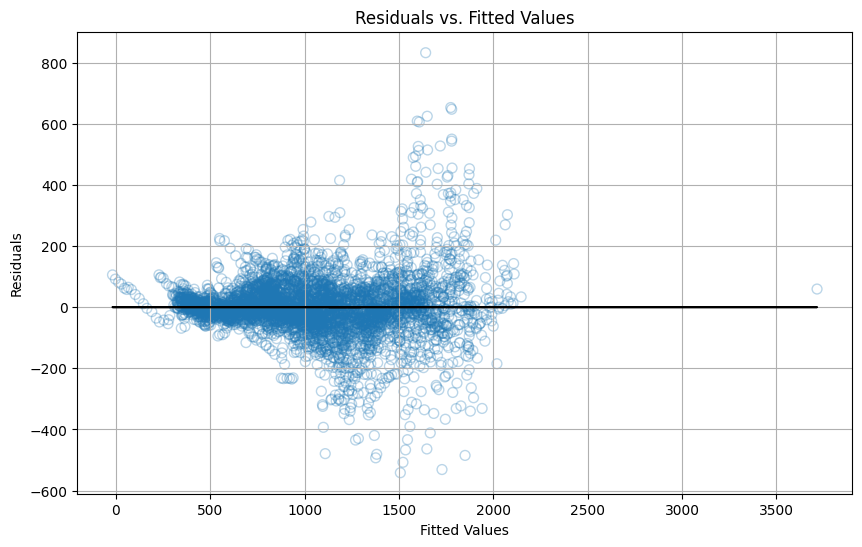

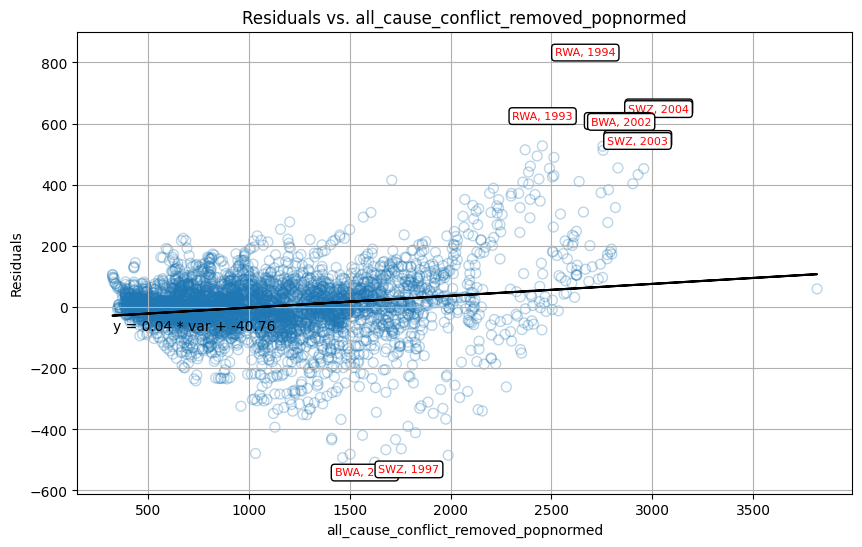

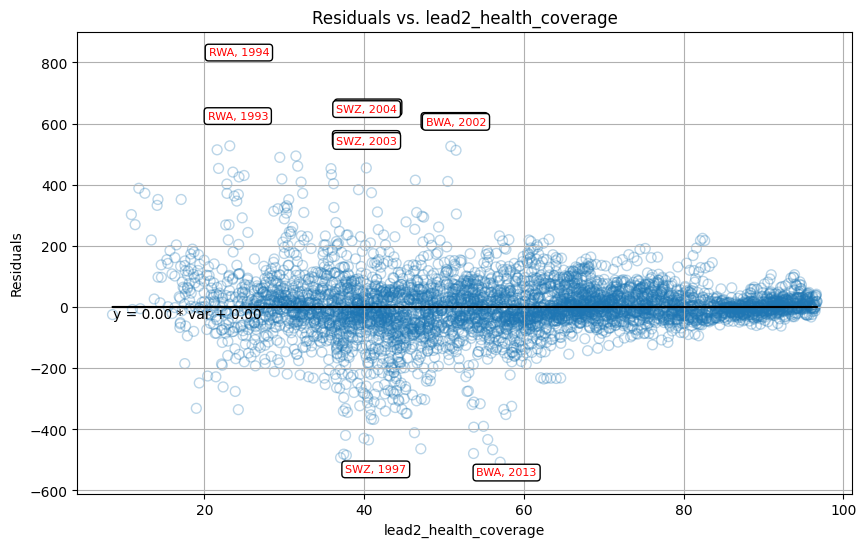

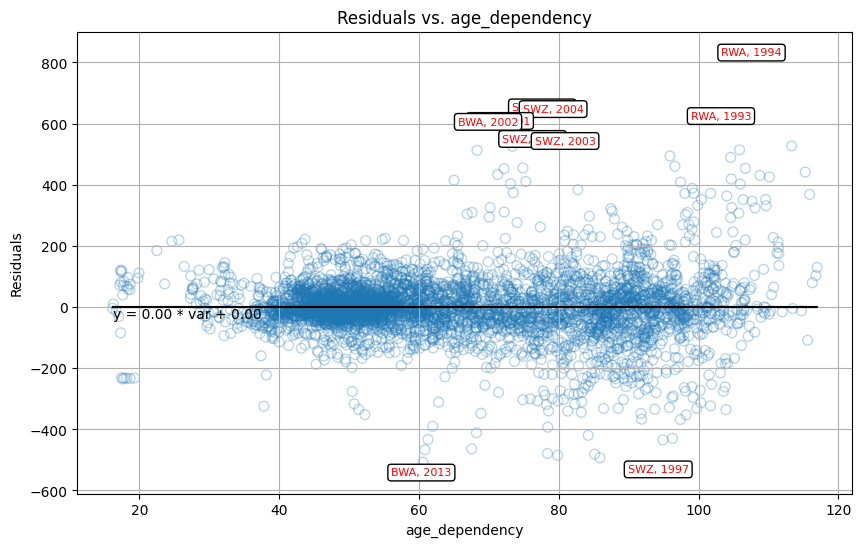

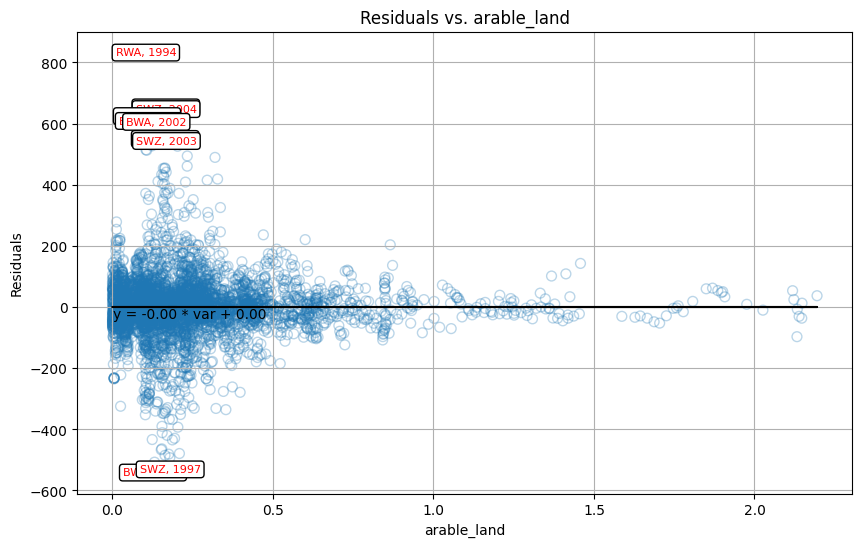

...

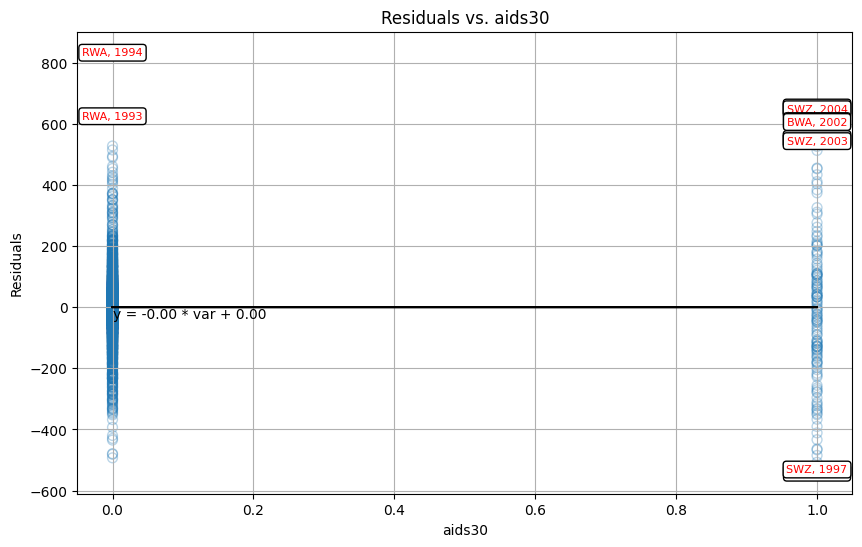

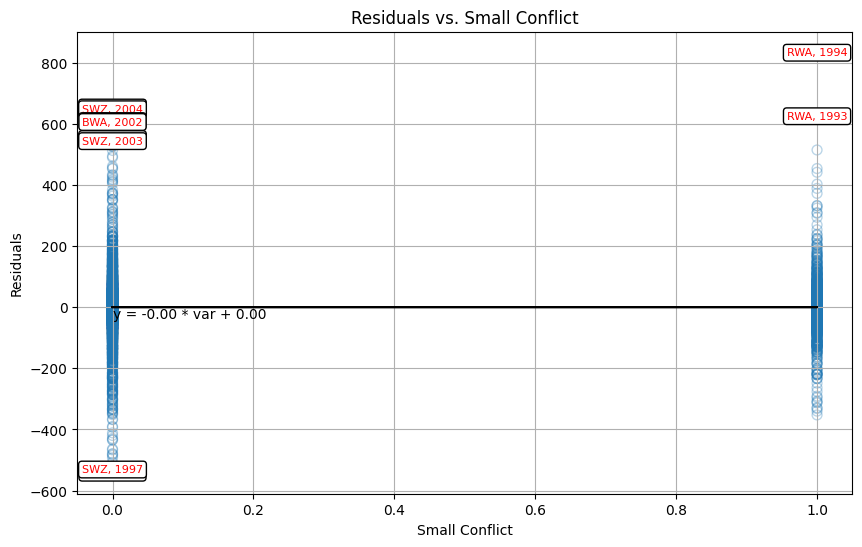

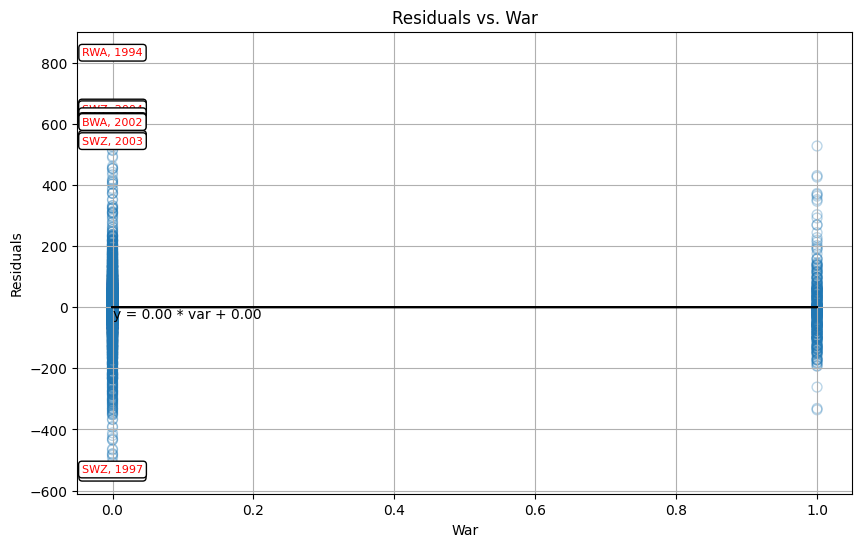

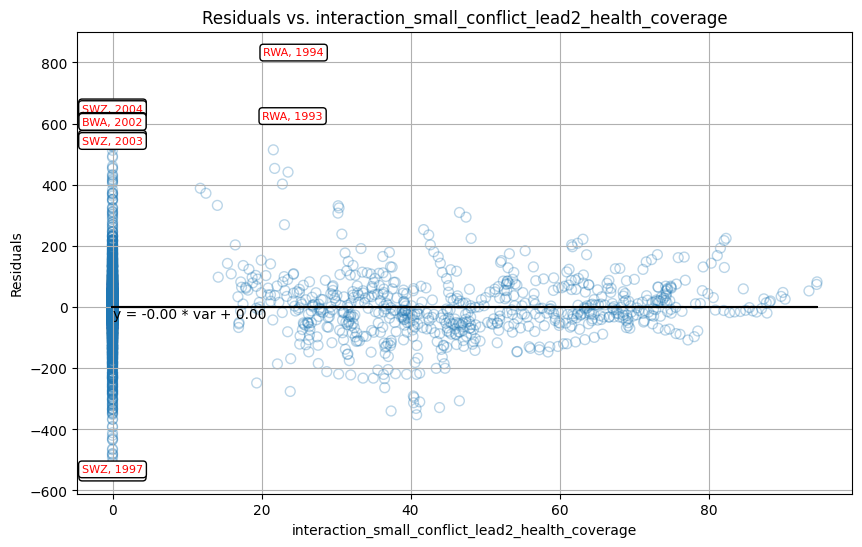

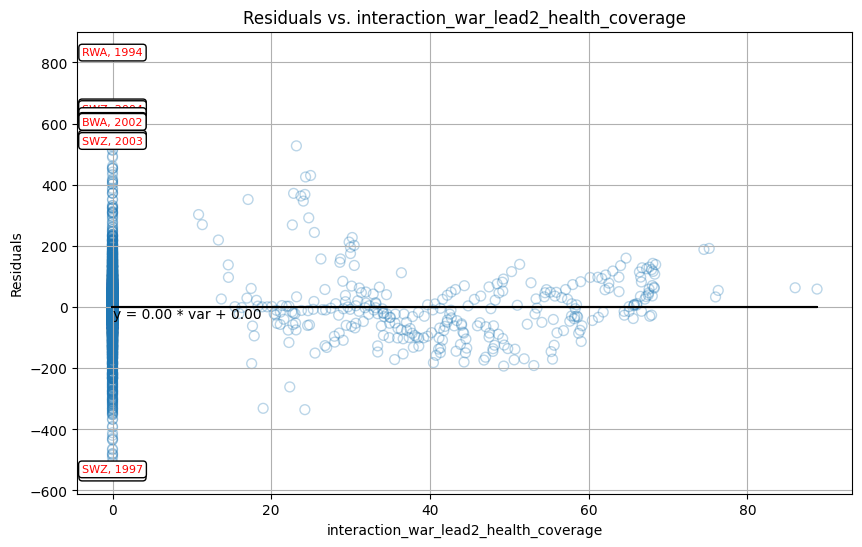

Breusch-Pagan test p-value: 1.0511955015735476e-217


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
### plotting residuals
residuals = war_health.resids
fitted = war_health._fitted
test = test.reset_index()
independent_vars = test[test.columns[~test.columns.isin(['ISO', 'year', 'const'])]].columns # skipping the constant, ISO, year

alpha=0.3
c = '#1f77b4'
# Identify the 10 most extreme residuals
top_residuals_idx = np.abs(residuals).argsort()[-10:][::-1]


# 1. Residuals vs. fitted values
f = plt.figure(figsize=(10, 6))
plt.scatter(fitted, residuals, alpha=alpha, marker='o', s=50, edgecolor=c, facecolor='none')
m, b = np.polyfit(np.squeeze(fitted.values), np.squeeze(residuals.values), 1)
plt.plot(fitted, m * fitted + b, color='black')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Residuals vs. Fitted Values')
plt.grid(True)
f.savefig(f.axes[0].get_title() + '.png', dpi=300)
# plt.show()

# 2. Residuals vs. independent variables
for var in independent_vars:
    f = plt.figure(figsize=(10, 6))
    plt.scatter(test[var], residuals, alpha=alpha, marker='o', s=50, edgecolor=c, facecolor='none')
    # Add labels to the plot for the top residuals
    for i in top_residuals_idx:
        iso = test.loc[i, 'ISO']
        year = test.loc[i, 'year']
        plt.text(test.loc[i, var], residuals[i], f'{iso}, {int(year)}', fontsize=8, ha='center', va='center', color='red', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))
    m, b = np.polyfit(test[var], residuals, 1)
    plt.plot(test[var], m * test[var] + b, color='black')
    label_text = f'y = {m:.2f} * var + {b:.2f}'
    plt.text(test[var].min(), b, label_text, fontsize=10, ha='left', va='top', color='black')
    plt.xlabel(var)
    plt.ylabel('Residuals')
    plt.title(f'Residuals vs. {var}')
    plt.grid(True)
    f.savefig(f.axes[0].get_title() + '.png', dpi=300)
    plt.show()

bp_test = sm.stats.het_breuschpagan(residuals, test.set_index(['ISO', 'year']))
print("Breusch-Pagan test p-value:", bp_test[1])
# white_test = sm.stats.het_white(residuals, test.set_index(['ISO', 'year']))
# print("White test p-value:", white_test[1])

for filename in os.listdir('/content/'):
    if filename.endswith("png"):
        files.download(filename)

In [ ]:
# ### using continuous conflict deaths and life exp as interation with conflict categoricals => no multicollinearity but also strange coefficients
# exogvars = ['all_cause_conflict_removed_popnormed','v2x_polyarchy', 'arable_land','unemployment',  'emdat_deaths_popnormed',
#             'gdp_pc', 'gbd_pop_est','pop_dense_sqkm', 'urbanisation',  'ihme_mean_adult_educ', 'year', 'ISO', 'conflict_deaths_popnormed','lag1_conflict_deaths']
# test = nod_merged[exogvars].dropna()
# col = 'lag1_conflict_deaths'
# conditions = [test[col] <25, (test[col] >= 25) & (test[col] <= 999), test[col] >= 1000]
# choices = [ "None", 'Small Conflict', 'War']
# test["lag1_conflict_type"] = np.select(conditions, choices)
# test.drop(columns=['lag1_conflict_deaths'], inplace=True)

# print(test['lag1_conflict_type'].value_counts())
# print(len(merged), len(test))
# conflict_dummies = pd.get_dummies(test['lag1_conflict_type'], drop_first=True)
# interaction = pd.Series(test['conflict_deaths_popnormed'].values * test['lag2_u1_life_exp'].values, name='interaction_life-exp_popnormed-conflict')
# test = pd.concat([test.iloc[:,:-1], conflict_dummies, interaction], axis=1)
# test = test.set_index(['ISO','year'])
# test -= test.mean()
# exog = sm.add_constant(test.iloc[:,1:])
# model = PanelOLS(test.all_cause_conflict_removed_popnormed, exog, entity_effects=True, time_effects=True)
# war_health = model.fit()
# print(war_health)
# war_health.summary.as_html()

###### successively adding covars for fixed effects interaction model

In [ ]:
# variables
want_interaction=True
modellist = []
successive_vars = list(set(covars)-set(basevars))
tmpvars = basevars.copy()


## run first without any interaction terms, no matter what
tmp = cat_convert(merged, basevars, interaction_terms=False)
tmp = tmp.set_index(['ISO', 'year'])
y = tmp.all_cause_conflict_removed_popnormed
tmp.drop(columns=['all_cause_conflict_removed_popnormed'], inplace=True)
modellist.append(PanelOLS(y, tmp, entity_effects=True, time_effects=True).fit(**lin_fit_dict))
if want_interaction:
    ## then run with interaction terms if interaction wanted
    tmp = cat_convert(merged, basevars, interaction_terms=want_interaction)
    tmp = tmp.set_index(['ISO', 'year'])
    y = tmp.all_cause_conflict_removed_popnormed
    tmp.drop(columns=['all_cause_conflict_removed_popnormed'], inplace=True)
    model = PanelOLS(y, tmp, entity_effects=True, time_effects=True).fit(**lin_fit_dict)
    # VIF(PanelOLS(y, tmp, entity_effects=True, time_effects=True))
    modellist.append(model)
for i, v in enumerate(successive_vars):
    print(f'model {i + 2 + want_interaction*1}, current var {v}') # use the interaction term boolean to int conversion trick to increase model count if interaction term is used, because then an additional model has run before
    tmpvars += [v]
    tmp = cat_convert(merged, tmpvars, interaction_terms=want_interaction)
    transform = [c for c in tmp.columns if c in ('gdp_pc', 'health_worker_density')]
    if transform:
        transformvars(tmp, transform)
    tmp = tmp.set_index(['ISO', 'year'])
    y = tmp.all_cause_conflict_removed_popnormed
    tmp.drop(columns=['all_cause_conflict_removed_popnormed'], inplace=True)
    model = PanelOLS(y, tmp, entity_effects=True, time_effects=True).fit(**lin_fit_dict)
    # print('\n',v)
    # VIF(PanelOLS(y, tmp, entity_effects=True, time_effects=True))
    modellist.append(model)
stargazer = Stargazer(modellist)
successive_transformedvars = [f'log({v})' if v in ('gdp_pc', 'health_worker_density') else v for v in successive_vars]
if want_interaction:

    stargazer.covariate_order(['const','lag2_health_coverage','Small Conflict', 'War','interaction_small_conflict_lag2_health_coverage','interaction_war_lag2_health_coverage'] + successive_transformedvars)
else:
    stargazer.covariate_order(['const','lag2_health_coverage','Small Conflict', 'War'] + successive_transformedvars)
stargazer.show_confidence_intervals(True)
stargazer.significance_levels([0.05, 0.01, 0.001])
stargazer
# stargazer.render_html()

kept:  5703 , dropped:  408  = 6.676485027000491 % dropped
features:  5
kept:  5703 , dropped:  408  = 6.676485027000491 % dropped
features:  7


<ipython-input-13-57c7a34926ce>:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["lag1_conflict_type"] = np.select(conditions, choices)
<ipython-input-13-57c7a34926ce>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test.drop(columns=['lag1_conflict_deaths'], inplace=True)


model 3, current var fertility
kept:  5703 , dropped:  408  = 6.676485027000491 % dropped
features:  8
model 4, current var gdp_pc
kept:  5363 , dropped:  748  = 12.2402225495009 % dropped
features:  9
model 5, current var pop_dense_sqkm
kept:  5323 , dropped:  788  = 12.894779905089186 % dropped
features:  10
model 6, current var unemployment
kept:  4872 , dropped:  1239  = 20.274914089347078 % dropped
features:  11
model 7, current var v2x_polyarchy
kept:  4612 , dropped:  1499  = 24.52953690067092 % dropped
features:  12
model 8, current var age_dependency
kept:  4612 , dropped:  1499  = 24.52953690067092 % dropped
features:  13
model 9, current var arable_land
kept:  4612 , dropped:  1499  = 24.52953690067092 % dropped
features:  14
model 10, current var emdat_deaths_popnormed
kept:  4604 , dropped:  1507  = 24.66044837178858 % dropped
features:  15
model 11, current var dev_aid
kept:  4604 , dropped:  1507  = 24.66044837178858 % dropped
features:  16
model 12, current var aids30
k

##### generalized propensity score

###### in progress

- IPW-resample
- IPW with sm.WLS, PanelOLS, RandomEffects
- covariate adjustment
- matching (with and without caliper)
- dose response


In [ ]:
from scipy.stats import norm
from scipy.linalg import sqrtm
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, Ridge, RidgeCV
import statsmodels.api as sm
from linearmodels import PanelOLS, RandomEffects, PooledOLS
import numpy as np
import pandas as pd

#

class GeneralizedPropensityScore:
    def __init__(self,
                 propensity_model=LinearRegression,
                 final_model=sm.OLS,
                 normalize_covars=False, # if not False expects scaler with fit_transform method
                 propensity_clip_values=None):

        self.propensity_model = propensity_model
        self.final_model = final_model
        self.normalize_covars = normalize_covars
        self.propensity_clip_values = None # if not None, expects tuple of (min, max)
        self.cont_vars = None # list[str] : stores continuous variable names, optional if fitted x is not a dataframe for better display in final results table
        self.cont_vars_col_ix = None
        self.cat_vars = None # list[str] : stores categorical variable names, optional if fitted x is not a dataframe for better display in final results table
        self.cat_vars_col_ix = None

    def _categorize_vars(self):
        if isinstance(self.x, pd.DataFrame):
            # use nunique instead
            self.cont_vars = self.x.select_dtypes(include=np.number).columns.tolist()
            self.cat_vars = self.x.select_dtypes(exclude=np.number).columns.tolist()
        elif isinstance(self.x, np.ndarray):
            # self.cont_vars = np.where(np.issubdtype(self.x.dtype, np.number))[0]
            # self.cat_vars =
        else: raise ValueError('x must be a dataframe or numpy array')


    def diagnostics(self):
        # add function that runs correlation treatment against each of the covariates with and without GPS weights (as in CBPS package of R)
        pass

    def fit(self, y, x, treatment, self.propensity_clip_values = None):
        pass

    def predict(self, x):
        pass




    def _orthogonalize(self, X):
        '''
        Similar to PCA but keeping all principal components.
        Expects a numpy array of shape (n_samples, n_features)
        Returns orthogonalized numpy array of shape (n_samples, n_features)
        '''
        mean = np.mean(X, axis=0)
        X_centered = X - mean
        cov = np.cov(X_centered, rowvar=False) # rowvar=False so that we get covariance of variables (same as X.T with rowvars=True)
        # if np.linalg.cond(X_centered)>1e6:
        try:
            # if non-invertible use pseudo inverse
            inv_cov = np.linalg.pinv(sqrtm(cov))
        except:
            inv_cov = np.linalg.inv(sqrtm(cov))
        X_orthogonal = np.dot(X_centered, inv_cov)
        return X_orthogonal

    def _filter_cat_cont(self, X, ignore_targetvars=None):
        '''
        Filters out indices of categorical and continuous variables for subsequent slicing.
        Expects a numpy array or pd.DataFrame. To avoid years or datetime columns being
        identified as continuous, input dataframe and name these columns either 'year' or 'datetime' to ignore them.
        If any particular columns should be ignored, pass them in as list or string to ignore_targetvars.

        If input was a pd.DataFrame, returns two tuples containing a list and array:
            (continuous column index, continuous variable name), (categorical_column_index, categorical variable)
        if input was a numpy array, returns two tuples of arrays:
            (continuous column index), (categorical_column_index)
        '''
        if isinstance(X, pd.DataFrame):
            X = X.astype(float, errors='ignore')
            types = X.dtypes.reset_index(name='type')
            nunique = X.nunique().reset_index(name='unique_values')
            # merge the dtypes and the count of unique values and then take only those indices
            nunique = types.merge(nunique, on='index')
            cat_cols_ix = nunique[(nunique.unique_values<=2) | (nunique['type']== object)]['index'].index.to_numpy()
            cat_cols_names = nunique[(nunique.unique_values<=2) | (nunique['type']==object)]['index'].tolist()
            ignoreset = set(['year', 'datetime'])
            if ignore_targetvars is not None:
                ignoreset.update([ignore_targetvars])
            cont_cols_ix = nunique[(nunique.unique_values>2) & (nunique['type']==np.float64) & (~nunique['index'].isin(ignoreset))]['index'].index.to_numpy()
            cont_cols_names = nunique[(nunique.unique_values>2) & (nunique['type']==np.float64)& (~nunique['index'].isin(ignoreset))]['index'].tolist()
            return (cat_cols_ix, cat_cols_names), (cont_cols_ix,cont_cols_names)
        else:
            X = pd.DataFrame(X).astype(float, errors='ignore')
            types = X.dtypes.reset_index(name='type')
            nunique = X.nunique().reset_index(name='unique_values')
            nunique = types.merge(nunique, on='index')
            cat_cols_ix = nunique[(nunique.unique_values<=2) | (nunique['type'] == object)]['index'].index.to_numpy()
            cont_cols_ix = nunique[(nunique.unique_values>2) & (nunique['type']==np.float64)]['index'].index.to_numpy()
            return cont_cols_ix, cat_cols_ix

    def _transform_cont_vars(self, X, trans_func, ignore_targetvars=None):
        '''
        Scale the continuous variables using function of choice
        Expects a numpy array or pd.DataFrame. To avoid years or datetime columns being
        Identified as continuous, input dataframe and name these columns either 'year' or 'datetime' to ignore them.

        '''
        if isinstance(X, pd.DataFrame):
            (cat_cols_ix, cat_cols_names), (cont_cols_ix,cont_cols_names) = _filter_cat_cont(X, ignore_targetvars=ignore_targetvars)
            X.loc[:, cont_cols_names] = trans_func(X[cont_cols_names].values)
            return X
        else:
            cont_cols_ix, cat_cols_ix = _filter_cat_cont(X)
            X[:, cont_cols_ix] = trans_func(X[:, cont_cols_ix])
            return X

kept:  4540 , dropped:  1571  = 25.70774014072983 % dropped
features:  17
Unit 0:
  Covariates (X): [-1.1293329136369525 0.2996458611695558 -0.6344241429051424
 -0.2566405204651231 -0.7233328134937685 -1.546063319587391
 -0.417316306504208 0.475950775238945 0.1996255244397611 1.407706960707478
 False False False True False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False 

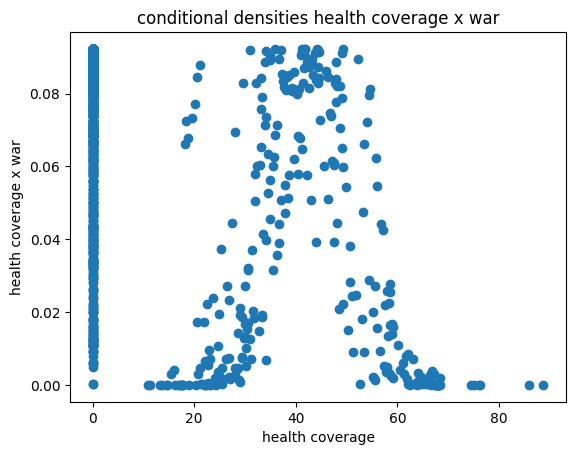

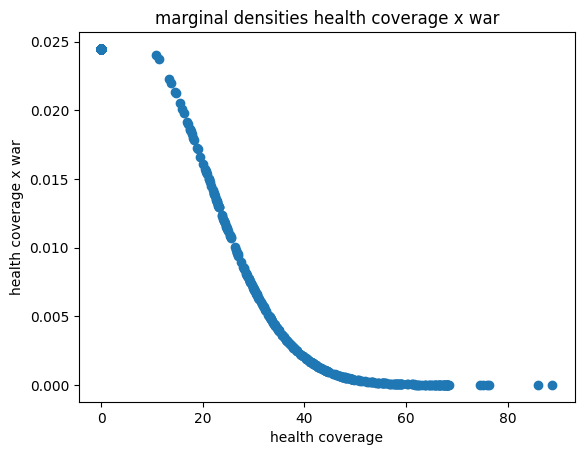

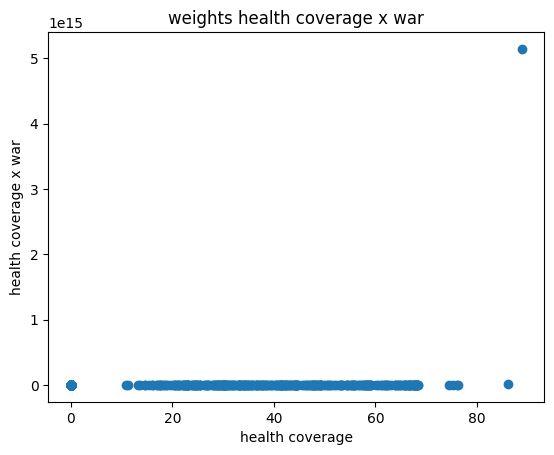

In [ ]:
# based on: https://meghapsimatrix.com/posts/continuous_ps/
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Lasso, Ridge

# Prepping the data
cont_covs = ['lag2_health_coverage', 'arable_land','gdp_pc','pop_dense_sqkm','unemployment','urbanisation','v2x_polyarchy',
        'popnormed_avg_temp','emdat_deaths_popnormed','dev_aid','aids30', 'War', 'Small Conflict']
df = cat_convert(merged, covars).dropna()
T = df[['interaction_small_conflict_lag2_health_coverage', 'interaction_war_lag2_health_coverage']].values
Y = df['all_cause_conflict_removed_popnormed'].values
X = df[cont_covs].values

scale = StandardScaler() # center and standardize to unit variance
X = np.concatenate([scale.fit_transform(X[:, :-3]), X[:,-3:]], axis=1) # only scaling continuous vars
X = np.concatenate([X, pd.concat([pd.get_dummies(df['year']), pd.get_dummies(df.ISO)], axis=1).values], axis=1)

# Fit the linear regression model to estimate mu(x_i)
# model = LinearRegression(fit_intercept=False) # cat_convert already adds constant
model = Ridge(fit_intercept=False)
# model = Lasso(fit_intercept=False)
model.fit(X, T)
mu_x_i = model.predict(X)

residuals = T - mu_x_i # mean for conditional density
sigma_sq = np.std(residuals) # sigma for conditional density

# conditional density function
def density(t, mu, sigma_sq):
    return norm.pdf(t, loc=mu, scale=sigma_sq) # loc=mean, scale=std

conditional_densities = density(T, mu_x_i, sigma_sq)

mu_t = np.mean(T) # mean for marginal density of T
sigma_t_sq = np.std(T) # sigma ...

marginal_densities = density(T, mu_t, sigma_t_sq)

stabilized_weights = marginal_densities / conditional_densities

# some sample output
for i in range(5):
    print(f"Unit {i}:")
    print(f"  Covariates (X): {X[i]}")
    print(f"  Treatment (T): {T[i]}")
    print(f"  Conditional Density: {conditional_densities[i]}")
    print(f"  Marginal Density: {marginal_densities[i]}")
    print(f"  Stabilized Weight: {stabilized_weights[i]}")
    print()

print(np.min(stabilized_weights, axis=0), np.max(stabilized_weights, axis=0), np.mean(stabilized_weights, axis=0), np.std(stabilized_weights, axis=0), np.round(np.percentile(stabilized_weights,[0.25,16,50,84,97.5,99], axis=0), 4))
plt.scatter(T[:,1], conditional_densities[:,1])
plt.title('conditional densities health coverage x war')
plt.xlabel('health coverage')
plt.ylabel('health coverage x war')
plt.show()
plt.scatter(T[:,1], marginal_densities[:,1])
plt.title('marginal densities health coverage x war')
plt.xlabel('health coverage')
plt.ylabel('health coverage x war')
plt.show()
plt.scatter(T[:,1], stabilized_weights[:,1])
plt.title('weights health coverage x war')
plt.xlabel('health coverage')
plt.ylabel('health coverage x war')
plt.show()

In [ ]:
np.quantile(stabilized_weights, [.99])

array([150.57358056])

In [ ]:
clipped_stabilized_weights = np.clip(stabilized_weights, 0.0001, 5) # it turns out without clipping it'll basically only have samples with health coverage levels of ~88
# clipped_equal_avg_weights = np.mean(clipped_stabilized_weigths, axis=1) # combining the weights makes no sense since the treatments are mutually exclusive
# df_reweighted = df.drop(columns=['const']).assign(sample_weight=clipped_equal_avg_weights).sample(10000, replace=True, weights='sample_weight')

df_reweighted = df.drop(columns=['const']).assign(smc_sample_weight=clipped_stabilized_weights[:,0],
                                                  war_sample_weight=clipped_stabilized_weights[:,1],
                                                  war_cov_adj=conditional_densities[:,1],
                                                  smc_cov_adj=conditional_densities[:,0])

In [ ]:
# # covariate balancing analysis: https://www.youtube.com/watch?v=mSueFNm_a9g
# df = df.assign(gps=clipped_equal_avg_weights)
# df['gps_quintile'] = pd.qcut(df['gps'], q=5, labels=False) + 1
# df.groupby('gps_quintile')[cont_covs].agg(['mean', 'std']).reset_index()

# def max_standardized_coefficient(df, covariate):
#     # Regression model: gps ~ gps_quintile + covariate
#     X = pd.get_dummies(df['gps_quintile'], prefix='quintile', drop_first=True)
#     X[covariate] = df[covariate]
#     X = sm.add_constant(X)
#     y = df['gps']

#     model = sm.OLS(y, X).fit()

#     # Extract absolute value of coefficients (excluding the intercept)
#     coefs = model.params.drop('const').abs()

#     # Get the maximum coefficient
#     max_coef = coefs.max()

#     return max_coef

# # Loop through covariates and calculate max standardized coefficient
# for covariate in cont_covs:
#     max_coef = max_coefficient(df, covariate)
#     results = results.append({'Variable': covariate, 'Coefficient': max_coef}, ignore_index=True)
# results = results.Coefficient / np.std()
# print(results)

In [ ]:
# display original data
target_treatment = 'interaction_war_lag2_health_coverage' # interaction_small_conflict_lag2_health_coverage	interaction_war_lag2_health_coverage
weightnamedict = {'interaction_small_conflict_lag2_health_coverage': 'smc_sample_weight', 'interaction_war_lag2_health_coverage': 'war_sample_weight'}

covs = [c for c in df.columns if not c in ['ISO', 'const', 'smc_sample_weight', 'war_sample_weight']]
pairplot = sns.pairplot(df[covs], diag_kind='kde', plot_kws={'alpha': 0.6})
plt.savefig('original_data.png', dpi=300)
plt.close()

# have a look at data shift with weighted resampling depending on sample size
for i in range(10000, 35000, 5000):
    covs = [c for c in df_reweighted.columns if not c in ['ISO', 'const', 'smc_sample_weight', 'war_sample_weight']]
    tmp = df_reweighted.drop(columns=['const']).sample(i, replace=True, weights=weightnamedict.get(target_treatment))
    print(f'duplicate cols {tmp.duplicated().sum()}')
    pairplot = sns.pairplot(covs[covs], diag_kind='kde', plot_kws={'alpha': 0.6})
    plt.savefig(str(i)[:-3]+'k propensity resampled.png', dpi=300)
    plt.close()

for filename in os.listdir('/content/'):
    if filename.endswith("png"):
        files.download(filename)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
war_resampled = df_reweighted[df_reweighted['Small Conflict']!=1].sample(8000, replace=True, weights='war_sample_weight') # excluding the other conflict type, because we've run the
smc_resampled = df_reweighted[df_reweighted['War']!=1].sample(8000, replace=True, weights='smc_sample_weight')
# print(war_resampled[war_resampled.interaction_war_lag2_health_coverage>0].describe())

# war_resampled = war_resampled.set_index(['ISO', 'year'])
war_resampled = war_resampled.drop(columns=['Small Conflict', 'interaction_small_conflict_lag2_health_coverage', 'smc_sample_weight']) # since conflict types are mutually exclusive we need to drop them

# smc_resampled = smc_resampled.set_index(['ISO', 'year'])
smc_resampled = smc_resampled.drop(columns=['War', 'interaction_war_lag2_health_coverage', 'war_sample_weight'])


treatment_dict = {0: ['interaction_small_conflict_lag2_health_coverage', 'Small Conflict'], 1: ['interaction_war_lag2_health_coverage', 'War']}
confounders = ['ISO', 'year','lag2_health_coverage', 'arable_land', 'gdp_pc', 'pop_dense_sqkm',
       'unemployment', 'urbanisation', 'v2x_polyarchy', 'popnormed_avg_temp',
       'emdat_deaths_popnormed', 'dev_aid', 'aids30']

def compute_vif(X):
    vif_data = pd.DataFrame()
    vif_data["feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]
    return vif_data

for c, confdf in enumerate([smc_resampled, war_resampled]):
    if c==0:
        print('\n\nConflict Type: SMALL CONFLICT\n')
        gpsprefix = 'smc_'
        target_treatment = 'interaction_small_conflict_lag2_health_coverage'
    else:
        print('\n\nConflict Type: WAR\n')
        gpsprefix = 'war_'
        target_treatment = 'interaction_war_lag2_health_coverage'
    print('fitting Panel of resampled df and treatment')
    y_weighted = confdf[['all_cause_conflict_removed_popnormed', 'ISO', 'year']].set_index(['ISO', 'year'])
    x_weighted = confdf[confounders + treatment_dict.get(c)].set_index(['ISO', 'year'])
    model = PanelOLS(y_weighted, x_weighted, entity_effects=True, time_effects=True)
    print('     ',model.fit(**lin_fit_dict))
    VIF(model)

    print('\n\nweighted regression on sample weights')
    y = df_reweighted[['all_cause_conflict_removed_popnormed', 'ISO', 'year']].set_index(['ISO', 'year'])
    x = df_reweighted[confounders + treatment_dict.get(c)].set_index(['ISO', 'year'])
    weights = df_reweighted[[gpsprefix + 'sample_weight', 'ISO', 'year']].set_index(['ISO', 'year'])#.values
    model = PanelOLS(y, x.astype(float), weights=weights, entity_effects=True, time_effects=True)
    print('    ' , model.fit(**lin_fit_dict))
    VIF(model)


    print('\n\ncovariate adjustment on conditional densities')
    y = df_reweighted['all_cause_conflict_removed_popnormed']
    x = df_reweighted[[gpsprefix + 'cov_adj'] + [target_treatment]]
    model = sm.OLS(y, x).fit(cov_type='HC1')
    print('    ' , model.summary())
    print(compute_vif(x))




Conflict Type: SMALL CONFLICT

fitting fill Panel of resampled df and treatment
                                   PanelOLS Estimation Summary                                    
Dep. Variable:     all_cause_conflict_removed_popnormed   R-squared:                        0.3416
Estimator:                                     PanelOLS   R-squared (Between):             -1.5794
No. Observations:                                  8000   R-squared (Within):               0.5990
Date:                                  Tue, Aug 06 2024   R-squared (Overall):             -1.0682
Time:                                          09:51:45   Log-likelihood                -4.758e+04
Cov. Estimator:                               Clustered                                           
                                                          F-statistic:                      311.13
Entities:                                           165   P-value                           0.0000
Avg Obs:                   

In [ ]:
print('\n\nweighted regression on sample weights')
y = df_reweighted[['all_cause_conflict_removed_popnormed', 'ISO', 'year']].set_index(['ISO', 'year'])
x = df_reweighted[confounders + [v for sublist in  treatment_dict.values() for v in sublist]].set_index(['ISO', 'year'])
weights = df_reweighted[['war_sample_weight', 'smc_sample_weight', 'ISO', 'year']].set_index(['ISO', 'year'])
weights['total'] = weights.war_sample_weight + weights.smc_sample_weight
model = PanelOLS(y, x.astype(float), weights=weights.total, entity_effects=True, time_effects=True) # transform_cont_vars(x.astype(float), trans_func=orthogonalize)
print(model.fit(**lin_fit_dict))
VIF(model)



weighted regression on sample weights
                                   PanelOLS Estimation Summary                                    
Dep. Variable:     all_cause_conflict_removed_popnormed   R-squared:                        0.3215
Estimator:                                     PanelOLS   R-squared (Between):             -0.8037
No. Observations:                                  4540   R-squared (Within):               0.5519
Date:                                  Tue, Aug 06 2024   R-squared (Overall):             -0.7820
Time:                                          10:03:15   Log-likelihood                -2.751e+04
Cov. Estimator:                               Clustered                                           
                                                          F-statistic:                      136.70
Entities:                                           170   P-value                           0.0000
Avg Obs:                                         26.706   Distributio

In [ ]:
remod = RandomEffects(y_weighted, x_weighted)
print(remod.fit(**lin_fit_dict))

                                 RandomEffects Estimation Summary                                 
Dep. Variable:     all_cause_conflict_removed_popnormed   R-squared:                        0.5868
Estimator:                                RandomEffects   R-squared (Between):              0.5999
No. Observations:                                 10000   R-squared (Within):               0.5856
Date:                                  Fri, Aug 02 2024   R-squared (Overall):              0.7241
Time:                                          16:03:05   Log-likelihood                -6.181e+04
Cov. Estimator:                               Clustered                                           
                                                          F-statistic:                      945.21
Entities:                                           170   P-value                           0.0000
Avg Obs:                                         58.824   Distribution:                 F(15,9985)
Min Obs:  

In [ ]:
cbps

,all_cause_conflict_removed_popnormed,ISO,year,lag2_health_coverage,arable_land,gdp_pc,pop_dense_sqkm,unemployment,urbanisation,v2x_polyarchy,popnormed_avg_temp,emdat_deaths_popnormed,dev_aid,aids30,small_conflict,War,interaction_small_conflict_lag2_health_coverage,interaction_war_lag2_health_coverage,weights,warweights,smcweights
0,1737.727438,TZA,1992,-0.398246,0.409306,-0.259219,-0.168492,-0.497190,-1.181940,0.121388,-0.028157,0.136995,1.407551,False,False,False,-0.584001,-0.791369,0.000237,0.000094,0.000143
1,1145.447667,ZAF,1992,-0.740728,0.275415,-0.570739,-0.170758,2.468112,0.117707,-0.743665,-0.263611,-0.033301,-0.522872,False,True,False,2.256852,0.039393,0.000227,0.000202,0.000025
2,1404.983631,NAM,1992,-0.899513,0.940756,-0.586113,-0.219803,2.264553,-1.049620,0.823021,0.132173,-0.057992,-0.318936,False,False,False,-0.337993,-0.255076,0.000437,0.000121,0.000315
3,1159.853195,TKM,1992,-0.128602,0.164352,-0.666661,-0.203346,-1.335290,-0.147171,-1.577373,-1.028470,-0.032539,-0.512243,False,False,False,-0.402252,-0.100503,0.000306,0.000135,0.000171
4,1704.579094,MMR,1992,-0.993866,-0.034635,-0.786210,-0.076761,-1.205636,-0.915873,-0.997346,0.146271,-0.039772,-0.379938,False,False,True,-0.247712,2.656587,0.000290,0.000004,0.000286
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4535,1036.951935,LAO,2019,0.027426,-0.079306,-0.488562,-0.172849,-0.720939,-0.608197,-1.481309,0.598687,-0.054506,0.150055,False,False,False,-0.475225,-0.362236,0.000285,0.000137,0.000147
4536,813.327645,GEO,2019,0.857703,-1.114572,-0.391522,-0.130149,0.276102,0.284800,0.142243,-1.178443,-0.045713,0.013735,False,False,False,-0.449632,-0.318287,0.000280,0.000127,0.000153
4537,724.973587,NIC,2019,1.667720,0.316446,-0.599530,-0.123934,-0.722616,0.294164,-1.679772,1.404733,-0.035327,-0.102859,False,False,False,-0.516074,-0.295913,0.000263,0.000125,0.000138
4538,1020.972110,SEN,2019,-0.055058,0.254108,-0.309781,-0.083203,-0.817765,0.306245,1.513448,1.095806,-0.093898,1.040549,False,False,False,-0.623400,-0.700553,0.000264,0.000127,0.000136


###### results

In [ ]:
cbps = pd.read_csv(wkdir+ 'cbps_weighted_panel_cont.csv')
treatment = 'interaction_conflict_health'
confounders = [c for c in cbps.columns if c in ['ISO', 'year','lag2_health_coverage', 'arable_land', 'gdp_pc', 'pop_dense_sqkm',
       'unemployment', 'urbanisation', 'v2x_polyarchy', 'popnormed_avg_temp','log1p_lag1_conflict_deaths_popnormed',
       'emdat_deaths_popnormed', 'dev_aid', 'aids30', 'age_dependency', 'primary_education', "gdp_pc_2010", 'allage_educ',  'ihme_mean_adult_educ', 'gdp_pc_2010']]

print('\n\nweighted regression on CBPS weights')
y = cbps[['all_cause_conflict_removed_popnormed', 'ISO', 'year']].set_index(['ISO', 'year'])
x = cbps[confounders + [treatment]].set_index(['ISO', 'year'])
weights = cbps[['weights', 'ISO', 'year']].set_index(['ISO', 'year'])
model = PanelOLS(y, x.astype(float), weights=weights.weights, entity_effects=True, time_effects=True) # transform_cont_vars(x.astype(float), trans_func=orthogonalize)
print('     ', model.fit(**lin_fit_dict))
VIF(model)

## using statsmodels WLS with clustered standard errors
## => results are IDENTICAL
isonumbermap = {iso:i for i, iso in enumerate(cbps.ISO.unique())}
entitynumbers = cbps.ISO.map(isonumbermap)
y = y.reset_index().drop(columns=['ISO', 'year'])
x = x.reset_index().drop(columns=['ISO', 'year'])
weights = weights.reset_index().drop(columns=['ISO', 'year'])
entity = pd.get_dummies(entitynumbers, prefix='entity', drop_first=True) # cbps['ISO']
time = pd.get_dummies(cbps['year'], prefix='time', drop_first=True)
x = pd.concat([x, entity, time], axis=1)
# model = sm.WLS(y, sm.add_constant(x.astype(float)), weights=weights.weights).fit(cov_type='cluster', cov_kwds={'groups': np.stack([entitynumbers.values, cbps['year'].values], axis=1)})
# print(model.summary())

## using statsmodels neg bin with clustered SEs
fam = sm.families.NegativeBinomial(link=sm.families.links.Log())
glmmodel = sm.GLM(y, sm.add_constant(x.astype(float)), family=fam, var_weights=weights.weights).fit(cov_type='cluster', cov_kwds={'groups': np.stack([entitynumbers.values, cbps['year'].values], axis=1)})
print('caution: weights in GLM are not equivalent to WLS\n',glmmodel.summary(), '\n')
bp = pd.DataFrame({'residuals': glmmodel.resid_pearson, 'fitted': glmmodel.fittedvalues})
print('Breusch-Pagan', het_breuschpagan(bp['residuals'], sm.add_constant(bp['fitted'])), '\n')

geemodel = sm.GEE(y, sm.add_constant(x.astype(float)), groups=np.squeeze(entitynumbers.values), family=fam).fit() # time=years,
print(f'GEE {geemodel.summary()}')



weighted regression on CBPS weights
                                         PanelOLS Estimation Summary                                    
Dep. Variable:     all_cause_conflict_removed_popnormed   R-squared:                        0.3599
Estimator:                                     PanelOLS   R-squared (Between):              0.0357
No. Observations:                                  4740   R-squared (Within):               0.6113
Date:                                  Tue, Aug 13 2024   R-squared (Overall):              0.0465
Time:                                          15:40:00   Log-likelihood                -2.775e+04
Cov. Estimator:                               Clustered                                           
                                                          F-statistic:                      195.83
Entities:                                           172   P-value                           0.0000
Avg Obs:                                         27.558   Distrib

/usr/local/lib/python3.10/dist-packages/statsmodels/genmod/families/family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
/usr/local/lib/python3.10/dist-packages/statsmodels/genmod/generalized_linear_model.py:1655: SpecificationWarning: cov_type not fully supported with var_weights
  warnings.warn('cov_type not fully supported with var_weights',


caution: weights in GLM are not equivalent to WLS
                           Generalized Linear Model Regression Results                           
Dep. Variable:     all_cause_conflict_removed_popnormed   No. Observations:                 4740
Model:                                              GLM   Df Residuals:                     4528
Model Family:                          NegativeBinomial   Df Model:                          211
Link Function:                                      Log   Scale:                          1.0000
Method:                                            IRLS   Log-Likelihood:                -7.7214
Date:                                  Tue, 13 Aug 2024   Deviance:                    0.0031185
Time:                                          15:40:02   Pearson chi2:                  0.00311
No. Iterations:                                       4   Pseudo R-squ. (CS):          5.166e-05
Covariance Type:                                cluster                     

In [ ]:
cbps.smcweights.describe(), cbps.warweights.describe(), cbps.weights.describe()

(count    4222.000000
 mean        0.000238
 std         0.000136
 min         0.000001
 25%         0.000181
 50%         0.000231
 75%         0.000288
 max         0.002927
 Name: smcweights, dtype: float64,
 count    3.842000e+03
 mean     3.085396e-04
 std      5.449053e-03
 min      4.508122e-13
 25%      1.191855e-07
 50%      1.191855e-07
 75%      1.191855e-07
 max      1.191854e-01
 Name: warweights, dtype: float64,
 count    3537.000000
 mean        0.000564
 std         0.005671
 min         0.000001
 25%         0.000182
 50%         0.000234
 75%         0.000291
 max         0.119518
 Name: weights, dtype: float64)

In [ ]:
cbps = pd.read_csv(wkdir+ 'cbps_weighted_panel2.csv') # 'cbps_weighted_panel, exact, agedep, primeduc.csv'# 'cbps_weighted_panel, agedep.csv') #'cbps_weighted_panel, exact, educ, agedep.csv')#'cbps_weighted_panel.csv') # (wkdir+'cbps_weighted_panel_orthogonalized.csv')
cbps['weights'] = cbps.warweights.fillna(0).astype(float) + cbps.smcweights.fillna(0).astype(float)
cbps.loc[(cbps.small_conflict==0) & (cbps.War==0), 'weights'] = cbps.loc[(cbps.small_conflict==0) & (cbps.War==0), 'weights']/2 # average the weights in rows that served as control for both conflict types
treatment_dict = {0: ['interaction_small_conflict_lag2_health_coverage', 'small_conflict'], 1: ['interaction_war_lag2_health_coverage', 'War']}
confounders = [c for c in cbps.columns if c in ['ISO', 'year','lag2_health_coverage', 'arable_land', 'gdp_pc', 'pop_dense_sqkm',
       'unemployment', 'urbanisation', 'v2x_polyarchy', 'popnormed_avg_temp',
       'emdat_deaths_popnormed', 'dev_aid', 'aids30', 'age_dependency', 'primary_education', "gdp_pc_2010", 'allage_educ',  'ihme_mean_adult_educ', 'gdp_pc_2010']]#,]

print('\n\nweighted regression on CBPS weights')
y = cbps[['all_cause_conflict_removed_popnormed', 'ISO', 'year']].set_index(['ISO', 'year'])
x = cbps[confounders + [v for sublist in  treatment_dict.values() for v in sublist]].set_index(['ISO', 'year'])
weights = cbps[['weights', 'warweights', 'smcweights', 'ISO', 'year']].set_index(['ISO', 'year'])
weights.weights = weights.weights.mean()
model = PanelOLS(y, x.astype(float), weights=weights.weights, entity_effects=True, time_effects=True) # transform_cont_vars(x.astype(float), trans_func=orthogonalize)
print('     ', model.fit(**lin_fit_dict))
VIF(model)

## using statsmodels WLS with clustered standard errors
## => results are IDENTICAL
isonumbermap = {iso:i for i, iso in enumerate(cbps.ISO.unique())}
entitynumbers = cbps.ISO.map(isonumbermap)
y = y.reset_index().drop(columns=['ISO', 'year'])
x = x.reset_index().drop(columns=['ISO', 'year'])
weights = weights.reset_index().drop(columns=['ISO', 'year'])
entity = pd.get_dummies(entitynumbers, prefix='entity', drop_first=True) # cbps['ISO']
time = pd.get_dummies(cbps['year'], prefix='time', drop_first=True)
x = pd.concat([x, entity, time], axis=1)
# model = sm.WLS(y, sm.add_constant(x.astype(float)), weights=weights.weights).fit(cov_type='cluster', cov_kwds={'groups': np.stack([entitynumbers.values, cbps['year'].values], axis=1)})
# print(model.summary())

## using statsmodels neg bin with clustered SEs
fam = sm.families.NegativeBinomial(link=sm.families.links.Log())
glmmodel = sm.GLM(y, sm.add_constant(x.astype(float)), family=fam, var_weights=weights.weights).fit(cov_type='cluster', cov_kwds={'groups': np.stack([entitynumbers.values, cbps['year'].values], axis=1)})
print('caution: weights in GLM are not equivalent to WLS\n',glmmodel.summary(), '\n')
bp = pd.DataFrame({'residuals': glmmodel.resid_pearson, 'fitted': glmmodel.fittedvalues})
print('Breusch-Pagan', het_breuschpagan(bp['residuals'], sm.add_constant(bp['fitted'])), '\n')

geemodel = sm.GEE(y, sm.add_constant(x.astype(float)), groups=np.squeeze(entitynumbers.values), family=fam).fit() # time=years,
print(f'GEE {geemodel.summary()}')



weighted regression on CBPS weights
                                         PanelOLS Estimation Summary                                    
Dep. Variable:     all_cause_conflict_removed_popnormed   R-squared:                        0.4083
Estimator:                                     PanelOLS   R-squared (Between):             -1.7340
No. Observations:                                  4740   R-squared (Within):               0.6372
Date:                                  Mon, Aug 12 2024   R-squared (Overall):             -1.6704
Time:                                          20:53:18   Log-likelihood                 -2.86e+04
Cov. Estimator:                               Clustered                                           
                                                          F-statistic:                      223.15
Entities:                                           172   P-value                           0.0000
Avg Obs:                                         27.558   Distrib

/usr/local/lib/python3.10/dist-packages/statsmodels/genmod/families/family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
/usr/local/lib/python3.10/dist-packages/statsmodels/genmod/generalized_linear_model.py:1655: SpecificationWarning: cov_type not fully supported with var_weights
  warnings.warn('cov_type not fully supported with var_weights',


caution: weights in GLM are not equivalent to WLS
                           Generalized Linear Model Regression Results                           
Dep. Variable:     all_cause_conflict_removed_popnormed   No. Observations:                 4740
Model:                                              GLM   Df Residuals:                     4527
Model Family:                          NegativeBinomial   Df Model:                          212
Link Function:                                      Log   Scale:                          1.0000
Method:                                            IRLS   Log-Likelihood:                -8.9299
Date:                                  Mon, 12 Aug 2024   Deviance:                    0.0051811
Time:                                          20:53:20   Pearson chi2:                  0.00517
No. Iterations:                                       5   Pseudo R-squ. (CS):          4.867e-05
Covariance Type:                                cluster                     

In [ ]:
modeldict = {}
for i in range(2):
    print('\n\nweighted regression on sample weights')
    if i==0:
        print('\n\nConflict Type: SMALL CONFLICT\n')
        gpsprefix = 'smc'
        t = cbps[cbps.War==0].copy()
        y = t[['all_cause_conflict_removed_popnormed', 'ISO', 'year']].set_index(['ISO', 'year'])
        x = t[confounders + treatment_dict.get(i)].set_index(['ISO', 'year'])
        weights = t[[gpsprefix + 'weights', 'ISO', 'year']].set_index(['ISO', 'year'])#.values
    else:
        print('\n\nConflict Type: WAR\n')
        gpsprefix = 'war'
        t = cbps[cbps.small_conflict==0].copy()
        y = t[['all_cause_conflict_removed_popnormed', 'ISO', 'year']].set_index(['ISO', 'year'])
        x = t[confounders + treatment_dict.get(i)].set_index(['ISO', 'year'])
        weights = t[[gpsprefix + 'weights', 'ISO', 'year']].set_index(['ISO', 'year'])#.values
    model = PanelOLS(y, sm.add_constant(x.astype(float)), weights=weights, entity_effects=True, time_effects=True)
    modeldict['model_' + gpsprefix] = model.fit(**lin_fit_dict)
    print('    ' , modeldict.get('model_' + gpsprefix))
    VIF(model)

    print('\nGLM')
    y = y.reset_index().drop(columns=['ISO', 'year'])
    x = x.reset_index()
    isonumbermap = {iso:i for i, iso in enumerate(x.ISO.unique())}
    entitynumbers = x.ISO.map(isonumbermap).reset_index(drop=True)
    years = x.year.values
    weights = weights.reset_index().drop(columns=['ISO', 'year'])
    entity = pd.get_dummies(entitynumbers, prefix='entity', drop_first=True)
    time = pd.get_dummies(x['year'], prefix='time', drop_first=True)
    x.drop(columns=['ISO', 'year'], inplace=True)
    x = pd.concat([x, entity, time], axis=1)
    fam = sm.families.NegativeBinomial(link=sm.families.links.Log())
    glmmodel = sm.GLM(y, sm.add_constant(x.astype(float)), family=fam, var_weights=np.squeeze(weights)).fit(cov_type='cluster', cov_kwds={'groups': np.stack([entitynumbers.values, years], axis=1)}) #
    print('caution: weights in GLM are not equivalent to WLS\n',glmmodel.summary(), '\n')
    bp = pd.DataFrame({'residuals': glmmodel.resid_pearson, 'fitted': glmmodel.fittedvalues})
    print('Breusch-Pagan', het_breuschpagan(bp['residuals'], sm.add_constant(bp['fitted'])), '\n')

    geemodel = sm.GEE(y, sm.add_constant(x.astype(float)), groups=np.squeeze(entitynumbers.values), family=fam).fit() # time=years,
    print(f'GEE {geemodel.summary()}')



weighted regression on sample weights


Conflict Type: SMALL CONFLICT

                                        PanelOLS Estimation Summary                                    
Dep. Variable:     all_cause_conflict_removed_popnormed   R-squared:                        0.4168
Estimator:                                     PanelOLS   R-squared (Between):              0.7542
No. Observations:                                  4403   R-squared (Within):               0.6400
Date:                                  Mon, Aug 12 2024   R-squared (Overall):              0.7403
Time:                                          20:53:26   Log-likelihood                -2.635e+04
Cov. Estimator:                               Clustered                                           
                                                          F-statistic:                      3951.0
Entities:                                           172   P-value                           0.0000
Avg Obs:                       

/usr/local/lib/python3.10/dist-packages/statsmodels/genmod/families/family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
/usr/local/lib/python3.10/dist-packages/statsmodels/genmod/generalized_linear_model.py:1655: SpecificationWarning: cov_type not fully supported with var_weights
  warnings.warn('cov_type not fully supported with var_weights',


caution: weights in GLM are not equivalent to WLS
                           Generalized Linear Model Regression Results                           
Dep. Variable:     all_cause_conflict_removed_popnormed   No. Observations:                 4403
Model:                                              GLM   Df Residuals:                     4192
Model Family:                          NegativeBinomial   Df Model:                          210
Link Function:                                      Log   Scale:                          1.0000
Method:                                            IRLS   Log-Likelihood:                -7.8548
Date:                                  Mon, 12 Aug 2024   Deviance:                    0.0043635
Time:                                          20:53:28   Pearson chi2:                  0.00438
No. Iterations:                                       4   Pseudo R-squ. (CS):          4.608e-05
Covariance Type:                                cluster                     

/usr/local/lib/python3.10/dist-packages/statsmodels/genmod/families/family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
/usr/local/lib/python3.10/dist-packages/statsmodels/genmod/generalized_linear_model.py:1655: SpecificationWarning: cov_type not fully supported with var_weights
  warnings.warn('cov_type not fully supported with var_weights',


caution: weights in GLM are not equivalent to WLS
                           Generalized Linear Model Regression Results                           
Dep. Variable:     all_cause_conflict_removed_popnormed   No. Observations:                 4003
Model:                                              GLM   Df Residuals:                     3792
Model Family:                          NegativeBinomial   Df Model:                          210
Link Function:                                      Log   Scale:                          1.0000
Method:                                            IRLS   Log-Likelihood:                -7.8995
Date:                                  Mon, 12 Aug 2024   Deviance:                    0.0045231
Time:                                          20:53:33   Pearson chi2:                  0.00450
No. Iterations:                                       5   Pseudo R-squ. (CS):          5.217e-05
Covariance Type:                                cluster                     

In [ ]:

for i, (k,v) in enumerate(modeldict.items()):
    if k.startswith('war'):
        treated = cbps.loc[cbps.War>0, confounders + treatment_dict.get(i)].set_index(['ISO', 'year'])
        control = cbps.loc[(cbps.War==0) & (cbps.small_conflict==0), confounders + treatment_dict.get(i)].set_index(['ISO', 'year'])
    else:
        treated = cbps.loc[cbps.small_conflict>0, confounders + treatment_dict.get(i)].set_index(['ISO', 'year'])
        control = cbps.loc[(cbps.small_conflict==0) & (cbps.War==0), confounders + treatment_dict.get(i)].set_index(['ISO', 'year'])
    pred_treated = v.predict(sm.add_constant(treated))
    pred_control = v.predict(sm.add_constant(control))
    ATE = pred_treated.mean() - pred_control.mean()
    print(f'Average Treatment Effect for {k}: {ATE}')
# this doesn't quite work given that we can ONLY compare those that were treated for both war and interaction with those treated with neither!

Average Treatment Effect for model_smc: predictions    203.191193
dtype: float64
Average Treatment Effect for model_war: predictions    277.612915
dtype: float64


In [ ]:
## the issue is that in both dose response cases the treatment is an interaction var
## thus when we set the treatment at some level we need to also adjust the original variable
## and also the categorical
def dose_response(df, treatmentvar, gpsvar, outcomevar, confoundervars, dependent_var_kwds=None):
    '''
    calculates two kinds of dose response functions

    dependent_var_kwds:
        None or dictionary with column name and the value it should be set to when running the function.
        The value can be numerical (used for categoricals on which the occurrence of the treatmentvar may depend).
        If confounders should be included in the first of the two dose-response estimations,
        use a string with any of the recognised statsmodels formula operators and
        any column in the df (in this case the dictionary keyword is simply ignored).
        If changing the treatmentvar means changing another var in the same way, set the key to the column name
        and the value to 'treatment'
    '''

    treatment_percentiles = np.quantile(df[treatmentvar].unique(), np.linspace(0,1,100))
    tmp = df[[treatmentvar, gpsvar, outcomevar] + list(dependent_var_kwds.keys())].copy()
    tmp['treatment_bins'] = pd.qcut(tmp.loc[df[treatmentvar]>0, treatmentvar], q=10)
    tmp = tmp.sort_values(by=treatmentvar)
    formula = f'{outcomevar} ~ {treatmentvar} + {gpsvar} + I({treatmentvar}**2) + I({gpsvar}**2) + {treatmentvar}:{gpsvar}'
    if dependent_var_kwds:
            for k, v in dependent_var_kwds.items():
                if not isinstance(v, str): formula += f' + {k}'
                elif v!='treatment': formula += ' + ' + v
    quadraticmodel = smf.ols(formula=formula, data=tmp).fit()
    # use fitted values to calculate
    percentile_dict = {'percentile_est': [], 'quant_lower_bound':[], 'quant_upper_bound': [], 'ci95_lower_bound':[], 'ci95_upper_bound':[], 'treatment_level':[]}
    for percentile in treatment_percentiles:
        simulated = tmp.copy()
        simulated[treatmentvar] = percentile
        if dependent_var_kwds:
            for k, v in dependent_var_kwds.items():
                if not isinstance(v, str): simulated[k] = v
        pred_outcome = quadraticmodel.predict(simulated)
        tmp_mean = pred_outcome.mean()
        percentile_dict['percentile_est'].append(tmp_mean)
        percentile_dict['quant_lower_bound'].append(pred_outcome.quantile(0.025))
        percentile_dict['quant_upper_bound'].append(pred_outcome.quantile(0.975))
        percentile_dict['ci95_lower_bound'].append(tmp_mean + 1.96 * quadraticmodel.bse[treatmentvar])
        percentile_dict['ci95_upper_bound'].append(tmp_mean - 1.96 * quadraticmodel.bse[treatmentvar])
        percentile_dict['treatment_level'].append(percentile)

    # roughly following austin, 2017, except using panelOlS instead of OLS
    ## fit weighted regression on data, as before
    ## cut treatment levels into 9 bins.
    ## for each df-row set treatment to ?median treatment? of the interval and predict holding treatment constant at given level but using all other variables
    ## take mean of predictions and use this as the dose-response value for this treatment-median
    ## do this for each treatment-level bin
    ## use restricted cubic splines (in patsy) to fit to the values:
    tmp2 = df.copy()
    tmp2 = tmp2.set_index(['ISO', 'year'])
    basemodel = PanelOLS(tmp2[outcomevar], sm.add_constant(tmp2[[treatmentvar] + confoundervars]), entity_effects=True, time_effects=True, weights=tmp2[gpsvar]).fit(**lin_fit_dict)
    percentile_dict2 = {'percentile_est': [], 'quant_lower_bound':[], 'quant_upper_bound': [], 'ci95_lower_bound':[], 'ci95_upper_bound':[], 'treatment_level':[]}
    for upper in np.hstack([0, tmp.treatment_bins.cat.categories.right]): # using the upper part of the interval but adding 0 as starting point
        simulated = basemodel.model.exog.dataframe.copy()
        simulated[treatmentvar] = upper
        if dependent_var_kwds:
            for k, v in dependent_var_kwds.items():
                if not isinstance(v, str): simulated[k] = v
                elif v=='treatment': simulated[k] = upper
        pred_outcome = basemodel.predict(simulated)
        percentile_dict2['percentile_est'].append(pred_outcome.mean().values)
        percentile_dict2['quant_lower_bound'].append(pred_outcome.quantile(0.025).values)
        percentile_dict2['quant_upper_bound'].append(pred_outcome.quantile(0.975).values)
        percentile_dict2['ci95_lower_bound'].append((pred_outcome.mean() + 1.96 * basemodel.std_errors[treatmentvar]).values)
        percentile_dict2['ci95_upper_bound'].append((pred_outcome.mean() - 1.96 * basemodel.std_errors[treatmentvar]).values)
        percentile_dict2['treatment_level'].append(upper)

    return pd.DataFrame(percentile_dict), pd.DataFrame(percentile_dict2)



# follow textbook
## run ols on y ~ quadradic treatment-gps
## for each treatment percentile level (np.quantile(treatment, np.linspace(0,1,100))), get gps score, and predict based on those scores using the coefs from estimation
## use bootstrap (sample with replacement, estimate, take mean along 0 axis, get 2.5 and 97.5 percentiles) for CI95


# Leite
## run ols on y ~ quadradic treatment-gps formula
## for each treatment percentile level (whether observed or not), estimate dose-response with estimated quadratic formula coefficients with all GPS levels while holding this treatment constant
## average these dose-responses and set this as the treatment percentile level's response
## when finished doing this for all levels, use model's standard error for treatment * 1.96 +/- predicted mortality outcome to get confidence interval

# follow https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4744663/
## use actual treatments and covars to estimate GPS
## then take treatment levels of interest (the need not be observed), use fitted model to estimate their corresponding GPS
## then use quadratic treatment-gps formula to fit the actual treatments and the estimated gps
## then use the coefficients of quadratic treatment-gps formula to fit the treatment level of interest and the average of this treatment's GPS scores

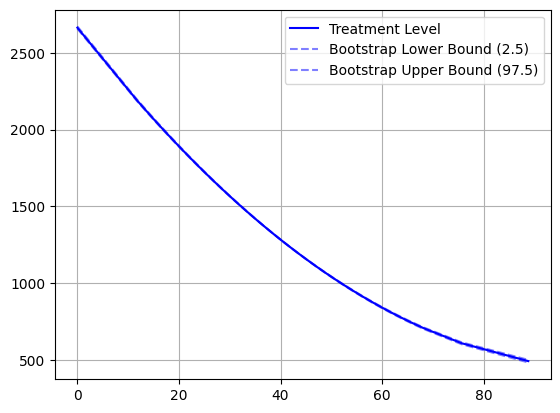

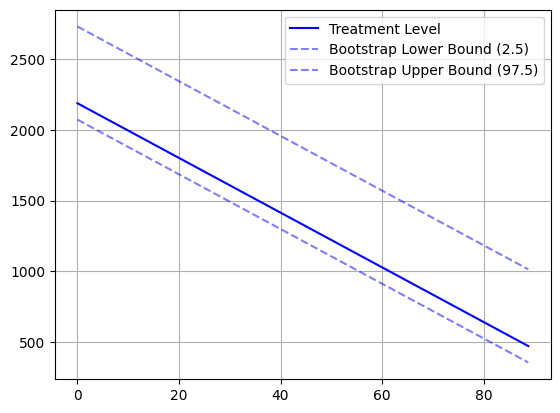

In [ ]:

nonpanel_confounders = confounders.copy()
nonpanel_confounders.remove('ISO')
nonpanel_confounders.remove('year')
dr1, dr2 = dose_response(cbps[cbps.small_conflict==0],
              treatmentvar='interaction_war_lag2_health_coverage',
              gpsvar='warweights',
              outcomevar='all_cause_conflict_removed_popnormed',
              confoundervars=nonpanel_confounders+['War'],
              dependent_var_kwds={'War': 1, 'lag2_health_coverage': 'treatment'})

plt.plot(dr1['treatment_level'], dr1['percentile_est'], color='blue', label='Treatment Level', linestyle='-')
plt.plot(dr1['treatment_level'], dr1['quant_lower_bound'], color='blue', label='Bootstrap Lower Bound (2.5)',  linestyle='--', alpha=0.5) # ci95_lower_bound
plt.plot(dr1['treatment_level'], dr1['quant_upper_bound'], color='blue', label='Bootstrap Upper Bound (97.5)',  linestyle='--', alpha=0.5) # ci95_upper_bound

plt.legend()
plt.grid(True)
plt.show()

# !pip install --quiet patsy
from patsy import dmatrix
# plt.plot(dr2['treatment_level'], dr2['percentile_est'], color='blue', label='Treatment Level', linestyle='-')
# plt.plot(dr2['treatment_level'], dr2['ci95_lower_bound'], color='blue', label='CI95 Lower Bound',  linestyle='--', alpha=0.5)
# plt.plot(dr2['treatment_level'], dr2['ci95_upper_bound'], color='blue', label='CI95 Upper Bound',  linestyle='--', alpha=0.5)
# plt.legend()
# plt.show()

num_knots = 4
knots = np.quantile(dr2['treatment_level'], np.linspace(0, 1, num_knots + 2)[1:-1])

# Generate the spline basis for treatment_level using the specified knots
spline_basis = dmatrix("bs(dr2['treatment_level'], knots=knots, degree=3, include_intercept=False)",
                       {"dr2['treatment_level']": dr2['treatment_level']}, return_type='dataframe')
spline_basis = spline_basis.astype(np.float64)
# Fit the models
# print(ndr2['percentile_est']), np.asarray(spline_basis))
model_est = sm.OLS(np.hstack(dr2['percentile_est']), spline_basis).fit()
model_lower = sm.OLS(np.hstack(dr2['quant_lower_bound']), spline_basis).fit()
model_upper = sm.OLS(np.hstack(dr2['quant_upper_bound']), spline_basis).fit()

# Get the fitted values
dr2['fitted_est'] = model_est.fittedvalues
dr2['fitted_lower'] = model_lower.fittedvalues
dr2['fitted_upper'] = model_upper.fittedvalues

# Plot the fitted spline lines
plt.plot(dr2['treatment_level'], dr2['fitted_est'], color='blue', label='Treatment Level', linestyle='-')
plt.plot(dr2['treatment_level'], dr2['fitted_lower'], color='blue', label='Bootstrap Lower Bound (2.5)', linestyle='--', alpha=0.5)
plt.plot(dr2['treatment_level'], dr2['fitted_upper'], color='blue', label='Bootstrap Upper Bound (97.5)', linestyle='--', alpha=0.5)
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
# do some form of matching
## run full panelOLS with weights
## then find matching GPS within a caliper but with very different treatments

##### doubly robust

In [ ]:
df.columns

Index(['const', 'all_cause_conflict_removed_popnormed', 'ISO', 'year',
       'lag1_health_coverage', 'arable_land', 'pop_dense_sqkm', 'unemployment',
       'urbanisation', 'v2x_polyarchy', 'emdat_deaths_popnormed', 'aids30',
       'gdp_pc_2010', 'ihme_mean_adult_educ', 'age_dependency',
       'health_coverage', 'Small Conflict', 'War'],
      dtype='object')

In [ ]:
from econml.dml import DML
from econml.sklearn_extensions.linear_model import StatsModelsLinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# df = merged[covars].dropna()
# df['war'] = df.lag1_conflict_deaths > 999
# df['interaction'] = (df.war * df.lag2_health_coverage) * 1
# df = df.drop(columns=['lag1_conflict_deaths', 'fertility'])
# T = df['interaction'].values
df = cat_convert(merged, covars + ['health_coverage'], interaction_terms=False).dropna()
# T = df[['interaction_small_conflict_lag2_health_coverage', 'interaction_war_lag2_health_coverage']].values
df.drop(columns=['lag1_health_coverage'], inplace=True)
T = df['health_coverage']
Y = df['all_cause_conflict_removed_popnormed'].values
X = df[confounders].values
# X = np.concatenate([X, pd.concat([df['year'], pd.get_dummies(df.ISO)], axis=1).values], axis=1)
W = pd.concat([df['year'], pd.get_dummies(df.ISO)], axis=1).values
# Instantiate the model
model = DML(model_y=RandomForestRegressor(n_estimators=100, random_state=42),
                         model_t=RandomForestRegressor(n_estimators=100, random_state=42),
                         model_final=StatsModelsLinearRegression(fit_intercept=True),
                         featurizer=None,
                         discrete_treatment=False,
                         random_state=42)

# Fit the model
model.fit(Y, T, X=X, W=W)


kept:  4886 , dropped:  1268  = 20.604484887877803 % dropped
features:  16


The final model has a nonzero intercept for at least one outcome; it will be subtracted, but consider fitting a model without an intercept if possible.


In [ ]:
print(model.ate(T0=np.zeros([X.shape[0],1]), T1=np.repeat(0.96, X.shape[0]).reshape(-1,1), X=X))
# print('small conflict doubly robust', model.ate(T0=np.zeros(X.shape[0]).reshape(-1,1), T1=T[:,0].reshape(-1,1), X=X))
# print('war doubly robust', model.ate(T0=np.zeros(X.shape[0]).reshape(-1,1), T1=T[:,1].reshape(-1,1), X=X))

ValueError: einstein sum subscripts string contains too many subscripts for operand 0


<sub>A linear parametric conditional average treatment effect (CATE) model was fitted:
$Y = \Theta(X)\cdot T + g(X, W) + \epsilon$
where for every outcome $i$ and treatment $j$ the CATE $\Theta_{ij}(X)$ has the form:
$\Theta_{ij}(X) = X' coef_{ij} + cate\_intercept_{ij}$
Coefficient Results table portrays the $coef_{ij}$ parameter vector for each outcome $i$ and treatment $j$. Intercept Results table portrays the $cate\_intercept_{ij}$ parameter.</sub>

In [ ]:
print(model.summary())
# ix = np.argsort(T, axis=0)
# T_sorted = T[ix, np.arange(T.shape[1])]
# print('\ncate model',model.model_cate)
# print('\nmodel coefs', model.coef_)

# # CATE = model.const_marginal_effect(X) # for all the features?
# CATE = model.effect(X, T0=np.zeros(X.shape[0]), T1=T[:,1])
# cate_lower, cate_upper = model.effect_interval(X, T0=np.zeros(X.shape[0]), T1=T[:,1], alpha=0.05)
# print(cate_lower.shape)
# print(cate_upper)

# CATE_sorted = CATE[ix, np.arange(T.shape[1])]
# plt.scatter(T_sorted[:,0], CATE_sorted[:,0], marker='o', facecolor='none', edgecolor='blue', s=5, alpha=0.4)
# plt.scatter(T_sorted[:,1], CATE_sorted[:,1], marker='o', facecolor='none', edgecolor='black', s=5, alpha=0.4)
# plt.grid(True)
# plt.show()

                  Coefficient Results                   
   point_estimate stderr zstat  pvalue ci_lower ci_upper
--------------------------------------------------------
X0          -1.13  2.189 -0.516  0.606    -5.42     3.16
X1         -0.005  0.002  -3.04  0.002   -0.009   -0.002
X2         -0.384  0.137   -2.8  0.005   -0.653   -0.115
X3          0.024  0.046  0.513  0.608   -0.067    0.114
X4          3.352  2.651  1.265  0.206   -1.843    8.548
X5         -0.763  0.151 -5.048    0.0    -1.06   -0.467
X6        -13.762  7.479  -1.84  0.066  -28.419    0.896
X7           -0.0    0.0 -0.677  0.499     -0.0      0.0
X8         -0.879  0.247 -3.558    0.0   -1.363   -0.395
X9         -0.143  0.056 -2.554  0.011   -0.254   -0.033
                       CATE Intercept Results                      
               point_estimate stderr zstat pvalue ci_lower ci_upper
-------------------------------------------------------------------
cate_intercept          9.661  5.473 1.765  0.078   -1.

In [ ]:
from sklearn.model_selection import cross_val_predict
from sklearn.ensemble import RandomForestRegressor

df = cat_convert(merged, covars).dropna()
T = df[['interaction_small_conflict_lag2_health_coverage', 'interaction_war_lag2_health_coverage']].values
Y = df['all_cause_conflict_removed_popnormed'].values
X = df[['lag2_health_coverage', 'arable_land','gdp_pc','pop_dense_sqkm','unemployment','urbanisation','v2x_polyarchy',
        'popnormed_avg_temp','emdat_deaths_popnormed','dev_aid','aids30', 'War', 'Small Conflict']].values

debias = RandomForestRegressor(n_estimators=100, random_state=42)
denoise = RandomForestRegressor(n_estimators=100, random_state=42)
X_cat = np.concatenate([X, pd.concat([df['year'], pd.get_dummies(df.ISO)], axis=1).values], axis=1)
T_smc_resid = T[:,0] - cross_val_predict(debias, X_cat, T[:,0], cv=5)
T_war_resid = T[:,1] - cross_val_predict(debias, X_cat, T[:,1], cv=5)
y_resid = Y - cross_val_predict(denoise, X, Y, cv=5)
T_resit = np.concatenate([T_smc_resid.reshape(-1,1), T_war_resid.reshape(-1,1)], axis=1)
T_frame = pd.DataFrame(sm.add_constant(T_resit),
             columns=['const','interaction_small_conflict_health_coverage','interaction_war_health_coverage'])
warmod = sm.OLS(y_resid, T_frame).fit(cov_type='HC1')
print(warmod.summary())
# w_smc = T_smc_resid ** 2
# w_war = T_war_resid ** 2
# y_star_smc = y_resid / T_smc_resid
# y_star_war = y_resid / T_war_resid
# model_smc = RandomForestRegressor(n_estimators=100, random_state=42)
# model_smc.fit(X, y_star_smc, sample_weight=w_smc)
# model_war = RandomForestRegressor(n_estimators=100, random_state=42)
# model_war.fit(X, y_star_war, sample_weight=w_war)

outcome_treatment_smc = np.mean(y_resid[T_frame['interaction_small_conflict_health_coverage'] > 1])
outcome_control_smc = np.mean(y_resid[(T_frame['interaction_small_conflict_health_coverage'] == 0) & (T_frame['interaction_war_health_coverage'] == 0)])
smc_ATE = outcome_treatment_smc - outcome_control_smc
outcome_treatment_war = np.mean(y_resid[T_frame['interaction_war_health_coverage'] > 1])
outcome_control_war = np.mean(y_resid[(T_frame['interaction_war_health_coverage'] == 0) & (T_frame['interaction_small_conflict_health_coverage'] == 0)])
war_ATE = outcome_treatment_war - outcome_control_war
print("Estimated small conflict x health coverage ATE: ", smc_ATE)
print("Estimated war x health coverage ATE: ", war_ATE)

kept:  4540 , dropped:  1571  = 25.70774014072983 % dropped
features:  17
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                     2.898
Date:                Tue, 06 Aug 2024   Prob (F-statistic):             0.0552
Time:                        16:27:24   Log-Likelihood:                -28577.
No. Observations:                4540   AIC:                         5.716e+04
Df Residuals:                    4537   BIC:                         5.718e+04
Df Model:                           2                                         
Covariance Type:                  HC1                                         
                                                 coef    std err          z      P>|z|      [0.025      0.975]
-------------------------

(array([  2.,   0.,   0.,   0.,   1.,   4.,   2.,   3.,   3.,   5.,   8.,
          7.,  12.,  13.,  16.,  22.,  32.,  50.,  57.,  94., 121., 202.,
        323., 610., 972., 808., 430., 206., 131., 115.,  70.,  56.,  35.,
         35.,  24.,  16.,  10.,   5.,   3.,   4.,   3.,   6.,   2.,   4.,
          3.,   8.,   1.,   2.,   1.,   0.,   0.,   1.,   0.,   0.,   1.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          1.]),
 array([-795.59898469, -763.63427614, -731.66956758, -699.70485902,
        -667.74015047, -635.77544191, -603.81073335, -571.8460248 ,
        -539.88131624, -507.91660769, -475.95189913, -443.98719057,
        -412.02248202, -380.05777346, -348.0930649 , -316.12835635,
        -284.16364779, -252.19893923, -220.234

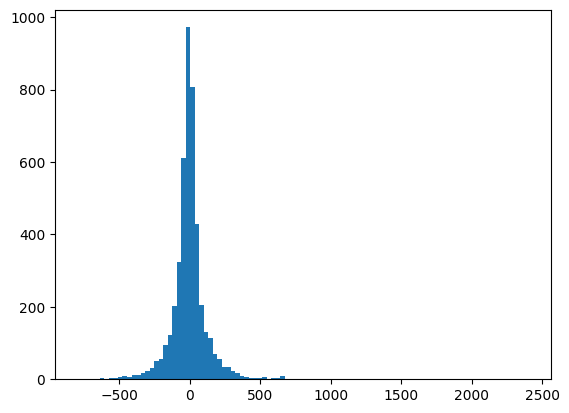

In [ ]:
plt.hist(y_resid, bins=100)

##### negative binomial GLM

using negative binomial with **LOG** link:
- interaction with **categoricals** ONLY significant when using robust SEs regardless of centering (loglik: -37273, AIC: 74973.7, BIC: -38287); deviance vs fitted was OK
- interaction with **log1p continuous** not significant regardless of SE measure (loglik: -37273, AIC: 74969.8, BIC: 76340.1) and deviance vs fitted OK
- interaction with **log1p popnormed continuous** not significant
with *clustered* SE but significant with *robust* SE (coef: -0.0002, p-val: 0.026) (loglik: -37273, AIC: 74969.7, BIC: 76340.0, deviance: 20.221), fitted vs deviance OK

using neg. binomial with **POWER** link (which yields identical result to Identity link):
- interaction with **categoricals** (regardless of centering) and *clustered* SEs ALMOST significant (coef: -2.3683, p-val: 0.053) and *very* significant with *robust* SEs (loglik: -37276, AIC: 74980.1, BIC: 76363.3); deviance vs fitted similar to Log-equivalent
- interaction with **log1p continous** is extremely significant (p-val: 0.000) with *robust* SEs and still significant (coef: -0.2783, p-val: 0.045) with *clustered* SEs (loglik: -37276; AIC: 74976.0, BIC: 76346.3); deviance vs fitted was OK
- interaction with **log1p popnormed continuous** is significant (coef: -0.9541; p-val: 0.013) with *clustered* SE and extremely significant with *robust* SE (p-val: 0.000) and deviance vs fitted looks OK regardless of centering (loglik: -37276, AIC: 74975.7, BIC: 76346.0, deviance: 26.235)


###### some tests with different forms and categories of interactions

In [ ]:
best_loglik = np.inf
i_at_best_loglik = 100
p_at_best_loglik = np.inf
p_war_at_best_loglik = np.inf
p_smc_at_best_loglik = np.inf

best_p_smc = np.inf
best_p_war = np.inf
best_p_war_loglik = np.inf
best_p_smc_loglik = np.inf
i_war = 100
j_smc = 0


abs_p = np.inf
loglik_at_best_p = np.inf
best_i = 100
best_j = 0
best_model = None
# VIF_at_best_p = None

increment_i = 100
increment_j = 50
i = 100
j = 0
X = None
while j<1000:
    j += increment_j
    if j%100==0: increment_j = 100
    while i <11000:
        i += increment_i
        if i%1000==0: increment = 1000
        fam = sm.families.NegativeBinomial(alpha=1, link=sm.families.links.Log())

        test = merged[covars].dropna()
        col = 'lag1_conflict_deaths'
        conditions = [(test[col] < j), (test[col] > j) & (test[col] < i), (test[col] >= i)]
        choices = ["No_conflict", 'Smc', 'War']
        test["lag1_conflict_type"] = np.select(conditions, choices)
        conflict_dummies = pd.get_dummies(test['lag1_conflict_type'], drop_first=True).astype(int)
        X = pd.concat([test, conflict_dummies], axis=1)


        X['interaction_Smc_health'] = (X.Smc * X.lag1_health_coverage)
        X['interaction_War_health'] = (X.War * X.lag1_health_coverage)
        X = X.drop(columns=['lag1_conflict_deaths', 'lag1_conflict_type', 'No_conflict'])

        isonumbermap = {iso:i for i, iso in enumerate(X.ISO.unique())}
        entitynumbers = X.ISO.map(isonumbermap)
        regiondummies = pd.get_dummies(X.ISO, drop_first=False)
        regiondummies.drop(columns=['USA'], inplace=True)

        y = X.all_cause_conflict_removed_popnormed.copy()
        X = pd.concat([X, regiondummies], axis=1)
        time_dummies = pd.get_dummies(X['year'], drop_first=True)
        X = pd.concat([X, time_dummies], axis=1)
        X.drop(columns=['ISO', 'all_cause_conflict_removed_popnormed', 'year'], inplace=True)
        model = sm.GLM(y, sm.add_constant(X).astype(float), family=fam)
        glmwar_health_with_entity = model.fit(cov_type='cluster', cov_kwds={'groups': np.stack([entitynumbers.values, test['year'].values], axis=1)})
        if glmwar_health_with_entity.llf < best_loglik:
            best_loglik = glmwar_health_with_entity.llf
            i_at_best_loglik = i
            p_war_at_best_loglik = glmwar_health_with_entity.pvalues['interaction_War_health']
            p_smc_at_best_loglik = glmwar_health_with_entity.pvalues['interaction_Smc_health']
        if glmwar_health_with_entity.pvalues['interaction_Smc_health'] < best_p_smc:
            best_p_smc = glmwar_health_with_entity.pvalues['interaction_Smc_health']
            best_p_smc_loglik = glmwar_health_with_entity.llf
            j_smc = j
        if glmwar_health_with_entity.pvalues['interaction_War_health'] < best_p_war:
            best_p_war = glmwar_health_with_entity.pvalues['interaction_War_health']
            best_p_war_loglik = glmwar_health_with_entity.llf
            i_war = i
        if glmwar_health_with_entity.pvalues['interaction_Smc_health']<abs_p or glmwar_health_with_entity.pvalues['interaction_War_health'] < abs_p:
            abs_p = min(glmwar_health_with_entity.pvalues['interaction_Smc_health'], glmwar_health_with_entity.pvalues['interaction_War_health'])
            best_model = glmwar_health_with_entity
            best_i = i
            best_j = j
            loglik_at_best_p = glmwar_health_with_entity.llf
            # VIF_at_best_p = VIF_df(X[[c for c in X.columns if not c in ['all_cause_conflict_removed_popnormed', 'ISO', 'year']]])

            print('p-val',abs_p)
            print(best_i, best_j)
            print()

print(f'\n\nvals at best loglik. i: {i_at_best_loglik}, p-war: {p_war_at_best_loglik}, p-smc: {p_smc_at_best_loglik}, loglik {best_loglik}')
print(f'smc at best p: {best_p_smc} at {j_smc} with loglik {best_p_smc_loglik}\nwar at best p:{best_p_war} at {i_war} with loglik: {best_p_war_loglik}')

print(f'\nvals at absolute best p:{abs_p}, i:{best_i}, j:{best_j}, loglik: {loglik_at_best_p}')
# print(VIF_at_best_p)
print(best_model.summary())

p-val 0.20890280886816703
200 50

p-val 0.16230439514425
400 50

p-val 0.15742843658346284
1300 50

p-val 0.1529597768943229
1400 50



vals at best loglik. i: 1800, p-war: 0.2495791875368707, p-smc: 0.18575203954405406, loglik -38444.46280304257
smc at best p: 0.1529597768943229 at 50 with loglik -38444.453354885845
war at best p:0.2043579172635076 at 2200 with loglik: -38444.45780146488

vals at absolute best p:0.1529597768943229, i:1400, j:50, loglik: -38444.453354885845
                          Generalized Linear Model Regression Results                           
Dep. Variable:     all_cause_conflict_removed_popnormed   No. Observations:                 4886
Model:                                              GLM   Df Residuals:                     4671
Model Family:                          NegativeBinomial   Df Model:                          214
Link Function:                                      Log   Scale:                          1.0000
Method:                             

In [ ]:
test

,const,all_cause_conflict_removed_popnormed,ISO,year,lag1_health_coverage,arable_land,pop_dense_sqkm,unemployment,urbanisation,v2x_polyarchy,emdat_deaths_popnormed,aids30,gdp_pc_2010,ihme_mean_adult_educ,age_dependency,Small Conflict,War,interaction_small_conflict_lag1_health_coverage,interaction_war_lag1_health_coverage
204,1.0,1346.044254,KEN,1991,36.334085,0.213101,42.025222,3.276,17.043,0.205,1.337002,0.0,2143.3203,7.075378,104.792244,False,False,0.000000,0.000000
206,1.0,533.929297,KWT,1991,67.110923,0.002986,75.168350,0.891,97.988,0.111,0.000000,0.0,23287.5530,8.977800,63.848479,False,True,0.000000,67.110923
207,1.0,1896.103394,MLI,1991,20.583606,0.226108,7.477499,1.212,23.751,0.208,0.590554,0.0,1002.2509,1.456475,101.910298,True,False,20.583606,0.000000
210,1.0,1046.617776,PRK,1991,56.297821,0.108925,175.363624,2.283,58.531,0.091,0.513620,0.0,2102.0203,8.825363,45.010266,False,False,0.000000,0.000000
211,1.0,1419.379048,SWZ,1991,39.975798,0.205685,51.727442,21.901,20.607,0.122,0.000000,0.0,5417.1826,6.676519,98.734389,False,False,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6105,1.0,866.975373,PHL,2019,54.493269,0.050643,370.194198,2.240,47.149,0.454,1.207390,0.0,8047.6406,11.852627,57.098989,True,False,54.493269,0.000000
6106,1.0,714.280384,BGD,2019,54.910149,0.048134,1271.538926,4.382,37.405,0.250,0.252418,0.0,3776.2327,7.572946,49.255277,True,False,54.910149,0.000000
6107,1.0,672.854791,VEN,2019,70.058201,0.089743,32.845851,5.092,88.240,0.209,0.277887,0.0,7107.9399,10.406719,56.805479,True,False,70.058201,0.000000
6108,1.0,906.533879,IND,2019,50.599707,0.112333,465.194639,6.510,34.472,0.436,0.191845,0.0,6837.4111,8.880221,49.401029,True,False,50.599707,0.000000


###### NB core model

In [ ]:
#######################
### GLM
#######################
print('GLM')

tempvars = covars.copy() + ['agg_hf_attacks']
# family
fam = sm.families.NegativeBinomial(alpha=1, link=sm.families.links.Log())

#### CATEGORICAL interaction
## 2 levels
# test = merged[tempvars].dropna()
# test = cat_convert(test, tempvars, demean=False)#+['popnormed_avg_temp', 'dev_aid', 'fertility', 'popnormed_5quintile_rain', 'primary_education'])
# # test = transform_cont_vars(test, orthogonalize, 'all_cause_conflict_removed_popnormed')

## quintiles INCOMPLETE
# test = merged[covars].dropna()
# conflict_quintile = pd.qcut(test[test.lag1_conflict_deaths>0].lag1_conflict_deaths, 5)
# bins = pd.qcut(test[test.lag1_conflict_deaths > 0].lag1_conflict_deaths, 5)
# bin_edges = bins.cat.categories
# min_edge = 0
# max_edge = max(test.lag1_conflict_deaths.max(), bin_edges.right.max())

# adjusted_bin_edges = pd.IntervalIndex.from_tuples(
#     [(min_edge, bin_edges[0].right)] +
#     [(bin_edges[i].left, bin_edges[i].right) for i in range(1, len(bin_edges)-1)] +
#     [(bin_edges[-1].left, max_edge)])

# test['conflict_quintile'] = pd.cut(test['lag1_conflict_deaths'], bins=adjusted_bin_edges)
# test['conflict_quintile'] = test['conflict_quintile'].fillna(0)
# cdummies = pd.get_dummies(test.conflict_quintile, drop_first=False)
# hc = cdummies * test.lag1_health_coverage




# ## 3 level
# test = merged[covars].dropna()
# interaction_var = 'lag1_health_coverage'
# col = 'lag1_conflict_deaths'
# conditions = [(test[col] < 25),(test[col] > 25) & (test[col] < 999), (test[col] >= 1000) & (test[col] < 10000), (test[col] >= 10000)]
# choices = [ "No_conflict", 'Smc', 'War', 'Severe_war']
# test["lag1_conflict_type"] = np.select(conditions, choices)
# test.drop(columns=['lag1_conflict_deaths'], inplace=True)
# conflict_dummies = pd.get_dummies(test['lag1_conflict_type'], drop_first=True)
# interaction = conflict_dummies * test[interaction_var].values.reshape(-1, 1)
# interaction.rename(columns={'No_conflict':'No_conflict_interaction',
#                             'War': 'interaction_war_'+interaction_var,
#                             'Smc': 'interaction_small_conflict_' + interaction_var,
#                             'Severe_war': 'interaction_severe_war_' + interaction_var}, inplace=True)
# interaction.drop(columns=['No_conflict_interaction'], inplace=True)
# conflict_dummies.drop(columns=['No_conflict'], inplace=True)
# test.drop(columns=['lag1_conflict_type'], inplace=True)
# test = pd.concat([test, conflict_dummies, interaction], axis=1)
# test = sm.add_constant(test)


#### CONTINUOUS interaction
## log 1p conflict deaths
test = merged[tempvars].dropna()
transformvars(test, ['lag1_conflict_deaths'], np.log1p)
test['interaction_conflict_health'] = test['log1p(lag1_conflict_deaths)'] * test.lag1_health_coverage
# test = transform_cont_vars(test, orthogonalize, 'all_cause_conflict_removed_popnormed')
test = sm.add_constant(test)

### log 1p popnormed conflict deaths
# test = merged[covars + ['lag1_conflict_deaths_popnormed']].dropna()
# transformvars(test, ['lag1_conflict_deaths_popnormed'], np.log1p)
# test.drop(columns=['lag1_conflict_deaths'], inplace=True)
# test['interaction_conflict_health'] = test['log1p(lag1_conflict_deaths_popnormed)'] * test.lag2_health_coverage
# test = sm.add_constant(test)


print('dispersed? mean < variance:', test.all_cause_conflict_removed_popnormed.mean() < test.all_cause_conflict_removed_popnormed.var())

isonumbermap = {iso:i for i, iso in enumerate(test.ISO.unique())}
entitynumbers = test.ISO.map(isonumbermap)
regiondummies = pd.get_dummies(test.ISO, drop_first=False)
regiondummies.drop(columns=['USA'], inplace=True) # this will be the comparison region
y = test.all_cause_conflict_removed_popnormed.copy()
regiontest = pd.concat([test, regiondummies], axis=1)
time_dummies = pd.get_dummies(regiontest['year'], drop_first=True)
X = pd.concat([regiontest, time_dummies], axis=1)
X.drop(columns=['ISO', 'all_cause_conflict_removed_popnormed', 'year'], inplace=True) # 'ihme_mean_adult_educ', 'age_dependency', 'gdp_pc_2010'
model = sm.GLM(y, X.astype(float), family=fam)
glmwar_health_with_entity = model.fit(cov_type='cluster', cov_kwds={'groups': entitynumbers.values})#np.stack([entitynumbers.values, test['year'].values], axis=1)})#cov_type='HC3')#cov_type='HAC', cov_kwds={'maxlags': 5})# # cov_type='HC1'
# s = Stargazer([glmwar_health_with_entity])
# s.significance_levels([0.05, 0.01,0.001])
# s.show_confidence_intervals(True)
# print(s)
print(VIF_df(test[[c for c in test.columns if not c in ['all_cause_conflict_removed_popnormed', 'ISO', 'year']]]))
print(glmwar_health_with_entity.summary())
# print('\ncoefficient interpretation for untransformed dependent variable in GLM in %')
# print(np.round((np.exp(glmwar_health_with_entity.params) - 1) * 100, 2)[:len(covars)+1], '\n\n\n') # percent change
# print(glmwar_health_with_entity.get_margeff(at='all').summary())#, atexog={'interaction_conflict_deaths': np.linspace(test.interaction_conflict_health.min(), test.interaction_conflict_health.max(), 100)}).summary()) #
print(f'AIC: {np.round(glmwar_health_with_entity.aic, 1)}, BIC: {np.round(glmwar_health_with_entity.bic_llf, 1)}')
# print(f'zero or negative values in predictions violating count-data/neg binomial assumptions? {np.any(glmwar_health_with_entity.predict(X) <= 0)}')
# print(f'{glmwar_health_with_entity.resid_pearson > glmwar_health_with_entity.model_df}')
# for val in np.linspace(test.interaction_conflict_health.min(), test.interaction_conflict_health.max(), 10):
#     atexog = glmwar_health_with_entity.model.exog.copy()
#     atexog[:, 15] = val
#     marg_eff = glmwar_health_with_entity.get_margeff(atexog=atexog)
#     print(f'Marginal effects at interaction_conflict_deaths = {val}')
#     print(marg_eff.summary())

GLM
dispersed? mean < variance: True
     const  log1p(lag1_conflict_deaths)  lag1_health_coverage  arable_land  \
0  113.669                        8.077                 8.364         1.07   

   pop_dense_sqkm  unemployment  urbanisation  v2x_polyarchy  \
0           1.131         1.207         2.697          1.692   

   emdat_deaths_popnormed  aids30  gdp_pc_2010  ihme_mean_adult_educ  \
0                   1.003   1.147        2.759                 4.341   

   age_dependency  agg_hf_attacks  interaction_conflict_health  
0           3.267           1.032                        7.323  
                          Generalized Linear Model Regression Results                           
Dep. Variable:     all_cause_conflict_removed_popnormed   No. Observations:                 4886
Model:                                              GLM   Df Residuals:                     4672
Model Family:                          NegativeBinomial   Df Model:                          213
Link Function:

/usr/local/lib/python3.10/dist-packages/statsmodels/genmod/families/family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


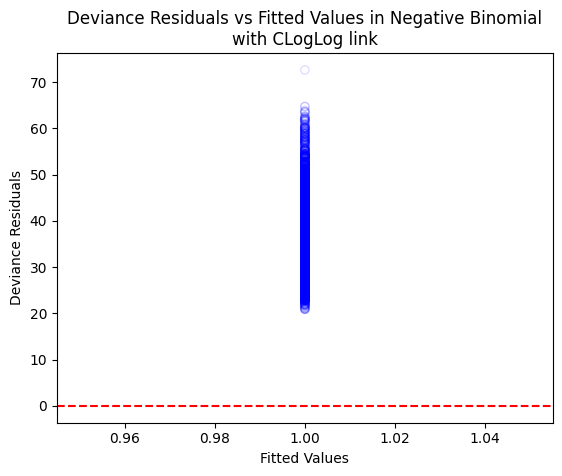

<Figure size 640x480 with 0 Axes>

In [ ]:
deviance_residuals = glmwar_health_with_entity.resid_deviance
fitted_values = glmwar_health_with_entity.fittedvalues

# Plot deviance residuals against fitted values
plt.scatter(fitted_values, deviance_residuals, facecolor='none', edgecolor='blue', alpha=0.13, marker='o')
plt.axhline(y=0, color='r', linestyle='--')
m, b = np.polyfit(fitted_values, deviance_residuals, 1)
plt.plot(fitted_values, m * deviance_residuals + b, color='black')
label_text = f'y = {m:.2f} * fitted + {b:.2f}'
linkname = str(type(fam.link)).split('\'')[1].split('.')[-1]
title_text = f'Deviance Residuals vs Fitted Values in Negative Binomial\nwith {linkname} link'
plt.title(title_text)
plt.text(fitted_values.min(), b, label_text, fontsize=10, ha='left', va='top', color='black')
plt.xlabel('Fitted Values')
plt.ylabel('Deviance Residuals')
plt.show()
plt.savefig(title_text + '.jpg', dpi=600)

In [ ]:
# # CATEGORICAL cross-val
# test = cat_convert(merged, covars)
# binary_cols = ['aids30', 'Small Conflict', 'War']

# CONTINUOUS cross-val
test = merged[covars].dropna()
transformvars(test, ['lag1_conflict_deaths'], np.log1p)
binary_cols = ['aids30']
test[['age_dependency', 'ihme_mean_adult_educ', 'v2x_polyarchy', 'gdp_pc_2010', 'unemployment', 'urbanisation', 'lag2_health_coverage']] -= test[['age_dependency', 'ihme_mean_adult_educ', 'v2x_polyarchy', 'gdp_pc_2010', 'unemployment', 'urbanisation', 'lag2_health_coverage']].mean()
test['interaction_conflict_health'] = test['log1p(lag1_conflict_deaths)'] * test.lag2_health_coverage

# outcome
y = test['all_cause_conflict_removed_popnormed']

# for clustering SEs
isonumbermap = {iso:i for i, iso in enumerate(test.ISO.unique())}
entitynumbers = test.ISO.map(isonumbermap)

# adding dummies to x
entity = pd.get_dummies(entitynumbers, prefix='entity', drop_first=True)
time = pd.get_dummies(test['year'], prefix='time', drop_first=True)
x = test.drop(columns=['ISO', 'year', 'all_cause_conflict_removed_popnormed']).astype(float)
# x = x.drop(columns=['age_dependency', 'ihme_mean_adult_educ', 'gdp_pc_2010'])
x = pd.concat([x, entity, time], axis=1).astype(float)
model_class = [sm.OLS, sm.GLM, sm.MixedLM]
model_class_keyed_params=[None, dict(family=sm.families.NegativeBinomial(link=sm.families.links.Log())), dict()]
clusterdict = dict(cov_type='cluster', cov_kwds={'groups': np.stack([entitynumbers.values, test['year'].values], axis=1)})
model_fit_keyed_params=[clusterdict, clusterdict, clusterdict]

result = cross_val_score_statsmodels(x, y, model_class, binary_cols=binary_cols,cv_folds=4, model_class_keyed_params=model_class_keyed_params, model_fit_keyed_params=model_fit_keyed_params)
print(result)

# # CATEGORICAL cross-val
# test = cat_convert(merged, covars)
# binary_cols = ['aids30', 'Small Conflict', 'War']

# CONTINUOUS cross-val
test = merged[covars].dropna()
transformvars(test, ['lag1_conflict_deaths'], np.log1p)
binary_cols = ['aids30']
# test[['age_dependency', 'ihme_mean_adult_educ', 'v2x_polyarchy', 'gdp_pc_2010', 'unemployment', 'urbanisation', 'lag1_health_coverage']] -= test[['age_dependency', 'ihme_mean_adult_educ', 'v2x_polyarchy', 'gdp_pc_2010', 'unemployment', 'urbanisation', 'lag2_health_coverage']].mean()
test['interaction_conflict_health'] = test['log1p(lag1_conflict_deaths)'] * test.lag1_health_coverage

# outcome
y = test['all_cause_conflict_removed_popnormed']

# for clustering SEs
isonumbermap = {iso:i for i, iso in enumerate(test.ISO.unique())}
entitynumbers = test.ISO.map(isonumbermap)

# adding dummies to x
entity = pd.get_dummies(entitynumbers, prefix='entity', drop_first=True)
time = pd.get_dummies(test['year'], prefix='time', drop_first=True)
x_ = test.drop(columns=['ISO', 'year', 'all_cause_conflict_removed_popnormed']).astype(float)
# x = x.drop(columns=['age_dependency', 'ihme_mean_adult_educ', 'gdp_pc_2010'])
x = pd.concat([x_, entity, time], axis=1).astype(float)
model_class = [sm.OLS, sm.GLM, RandomEffects]#sm.MixedLM]
model_class_keyed_params=[dict(X=x, y=y),
                          dict(X=x, y=y,family=sm.families.NegativeBinomial(link=sm.families.links.Log())),
                          dict(X=test.drop(columns='all_cause_conflict_removed_popnormed').set_index(['ISO', 'year']), y=pd.concat([y, test[['ISO', 'year']]], axis=1).set_index(['ISO', 'year']))]
                        #   dict(X=pd.concat([x_, time], axis=1).astype(float), y=y, groups=entity)]
clusterdict = dict(cov_type='cluster', cov_kwds={'groups': np.stack([entitynumbers.values], axis=1)}) # , test['year'].values
model_fit_keyed_params=[clusterdict, clusterdict, dict(cov_type='clustered', cluster_entity=True)]

result = cross_val_score_statsmodels(model_class, binary_cols=binary_cols,cv_folds=4, model_class_keyed_params=model_class_keyed_params)#, model_fit_keyed_params=model_fit_keyed_params)
print(result)

/usr/local/lib/python3.10/dist-packages/statsmodels/genmod/families/family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
/usr/local/lib/python3.10/dist-packages/statsmodels/genmod/families/family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Fold 0
warning, because a covariate was single-valued and dropped this fold's coefficients and p-values will not be part of the average.
Consider setting parameter num_core_features to only focus on the first n variables (e.g. disregarding entity and time)
warning, because a covariate was single-valued and dropped this fold's coefficients and p-values will not be part of the average.
Consider setting parameter num_core_features to only focus on the first n variables (e.g. disregarding entity and time)


/usr/local/lib/python3.10/dist-packages/statsmodels/genmod/generalized_linear_model.py:308: DomainWarning: The Power link function does not respect the domain of the NegativeBinomial family.
  warnings.warn((f"The {type(family.link).__name__} link function "


warning, because a covariate was single-valued and dropped this fold's coefficients and p-values will not be part of the average.
Consider setting parameter num_core_features to only focus on the first n variables (e.g. disregarding entity and time)
Fold 1
warning, because a covariate was single-valued and dropped this fold's coefficients and p-values will not be part of the average.
Consider setting parameter num_core_features to only focus on the first n variables (e.g. disregarding entity and time)
warning, because a covariate was single-valued and dropped this fold's coefficients and p-values will not be part of the average.
Consider setting parameter num_core_features to only focus on the first n variables (e.g. disregarding entity and time)


/usr/local/lib/python3.10/dist-packages/statsmodels/genmod/generalized_linear_model.py:308: DomainWarning: The Power link function does not respect the domain of the NegativeBinomial family.
  warnings.warn((f"The {type(family.link).__name__} link function "


warning, because a covariate was single-valued and dropped this fold's coefficients and p-values will not be part of the average.
Consider setting parameter num_core_features to only focus on the first n variables (e.g. disregarding entity and time)
Fold 2
warning, because a covariate was single-valued and dropped this fold's coefficients and p-values will not be part of the average.
Consider setting parameter num_core_features to only focus on the first n variables (e.g. disregarding entity and time)
warning, because a covariate was single-valued and dropped this fold's coefficients and p-values will not be part of the average.
Consider setting parameter num_core_features to only focus on the first n variables (e.g. disregarding entity and time)


/usr/local/lib/python3.10/dist-packages/statsmodels/genmod/generalized_linear_model.py:308: DomainWarning: The Power link function does not respect the domain of the NegativeBinomial family.
  warnings.warn((f"The {type(family.link).__name__} link function "


warning, because a covariate was single-valued and dropped this fold's coefficients and p-values will not be part of the average.
Consider setting parameter num_core_features to only focus on the first n variables (e.g. disregarding entity and time)
Fold 3
warning, because a covariate was single-valued and dropped this fold's coefficients and p-values will not be part of the average.
Consider setting parameter num_core_features to only focus on the first n variables (e.g. disregarding entity and time)
warning, because a covariate was single-valued and dropped this fold's coefficients and p-values will not be part of the average.
Consider setting parameter num_core_features to only focus on the first n variables (e.g. disregarding entity and time)


/usr/local/lib/python3.10/dist-packages/statsmodels/genmod/generalized_linear_model.py:308: DomainWarning: The Power link function does not respect the domain of the NegativeBinomial family.
  warnings.warn((f"The {type(family.link).__name__} link function "


warning, because a covariate was single-valued and dropped this fold's coefficients and p-values will not be part of the average.
Consider setting parameter num_core_features to only focus on the first n variables (e.g. disregarding entity and time)
{'OLS0': (11131.53312309504, 1193.6888104097018), 'GLM1': (9018.264248410547, 769.7477402825855), 'GLM2': (12228.130549202182, 1494.9744534718263)}


,OLS0_avg_coefficient,OLS0_avg_pvalues,GLM1_avg_coefficient,GLM1_avg_pvalues,GLM2_avg_coefficient,GLM2_avg_pvalues
log1p(lag1_conflict_deaths),0.0,0.0,0.0,0.0,0.0,0.0
lag2_health_coverage,0.0,0.0,0.0,0.0,0.0,0.0
arable_land,0.0,0.0,0.0,0.0,0.0,0.0
pop_dense_sqkm,0.0,0.0,0.0,0.0,0.0,0.0
unemployment,0.0,0.0,0.0,0.0,0.0,0.0
urbanisation,0.0,0.0,0.0,0.0,0.0,0.0
v2x_polyarchy,0.0,0.0,0.0,0.0,0.0,0.0
emdat_deaths_popnormed,0.0,0.0,0.0,0.0,0.0,0.0
aids30,0.0,0.0,0.0,0.0,0.0,0.0
gdp_pc_2010,0.0,0.0,0.0,0.0,0.0,0.0


##### Mixed Effects, statsmodels panel, & other models

In [ ]:
## mixed effects
import statsmodels.formula.api as smf
test = cat_convert(merged, covars)
test['ISO'] = test['ISO'].astype('category').cat.codes

formula = 'all_cause_conflict_removed_popnormed ~ arable_land + gdp_pc + pop_dense_sqkm + unemployment + v2x_polyarchy \
            + ihme_mean_adult_educ + popnormed_avg_temp + popnormed_5quintile_rain + fertility + health_worker_density \
            + lead2_health_coverage + emdat_deaths_popnormed + Q("Small Conflict") + Q("War") \
            + interaction_small_conflict_lead2_health_coverage + interaction_war_lead2_health_coverage + C(year) + (1 | ISO)'

# Fit the mixed effects model
mixed_model = smf.mixedlm(formula, test, groups=test['ISO'])
mlm_result = mixed_model.fit()
print(mlm_result.summary())
mlm_result.summary().as_html()

kept:  5382 , dropped:  2292  = 29.86708365910868 % dropped
features:  18
                               Mixed Linear Model Regression Results
Model:                   MixedLM      Dependent Variable:      all_cause_conflict_removed_popnormed
No. Observations:        5382         Method:                  REML                                
No. Groups:              166          Scale:                   11662.6251                          
Min. group size:         4            Log-Likelihood:          -33159.4470                         
Max. group size:         704          Converged:               Yes                                 
Mean group size:         32.4                                                                      
---------------------------------------------------------------------------------------------------
                                                   Coef.   Std.Err.    z    P>|z|  [0.025   0.975] 
---------------------------------------------------------

'<table class="simpletable">\n<tr>\n       <td>Model:</td>       <td>MixedLM</td> <td>Dependent Variable:</td> <td>all_cause_conflict_removed_popnormed</td>\n</tr>\n<tr>\n  <td>No. Observations:</td>  <td>5382</td>         <td>Method:</td>                       <td>REML</td>                \n</tr>\n<tr>\n     <td>No. Groups:</td>      <td>166</td>         <td>Scale:</td>                     <td>11662.6251</td>             \n</tr>\n<tr>\n  <td>Min. group size:</td>     <td>4</td>      <td>Log-Likelihood:</td>                <td>-33159.4470</td>            \n</tr>\n<tr>\n  <td>Max. group size:</td>    <td>704</td>       <td>Converged:</td>                       <td>Yes</td>                \n</tr>\n<tr>\n  <td>Mean group size:</td>   <td>32.4</td>            <td></td>                             <td></td>                  \n</tr>\n</table>\n<table class="simpletable">\n<tr>\n                          <td></td>                           <th>Coef.</th>   <th>Std.Err.</th>    <th>z</th>    <

In [ ]:
### just for comparison with statsmodels (very similar coefficients)
test = cat_convert(merged, covars, demean=True)
regiondummies = pd.get_dummies(test.ISO, drop_first=False)
regiondummies.drop(columns=['USA'], inplace=True) # this will be the comparison region
y = test.all_cause_conflict_removed_popnormed.copy()
to_transform = ['gdp_pc']
transformvars(test, to_transform)
regiontest = pd.concat([test, regiondummies], axis=1)
time_dummies = pd.get_dummies(regiontest['year'], drop_first=True)
X = pd.concat([regiontest, time_dummies], axis=1)
X.drop(columns=['ISO', 'all_cause_conflict_removed_popnormed', 'year'], inplace=True)
model = sm.OLS(y, X.astype(float))
results = model.fit(cov_type='HC1')
print(results.summary())

kept:  4604 , dropped:  1507  = 24.66044837178858 % dropped
features:  17
                                     OLS Regression Results                                     
Dep. Variable:     all_cause_conflict_removed_popnormed   R-squared:                       0.961
Model:                                              OLS   Adj. R-squared:                  0.959
Method:                                   Least Squares   F-statistic:                     1702.
Date:                                  Thu, 25 Jul 2024   Prob (F-statistic):               0.00
Time:                                          15:17:42   Log-Likelihood:                -27595.
No. Observations:                                  4604   AIC:                         5.562e+04
Df Residuals:                                      4391   BIC:                         5.699e+04
Df Model:                                           212                                         
Covariance Type:                                    H

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 212, but rank is 211
  warnings.warn('covariance of constraints does not have full '


#### geographic regions

In [ ]:
### checking regions
test = cat_convert(merged, covars) # c # newvars
test['region'] = test.ISO.map(iso_region)
regiondummies = pd.get_dummies(test.region, drop_first=False)
regiondummies.drop(columns=['Canada-US'], inplace=True) # this will be the comparison region
y = test.all_cause_conflict_removed_popnormed.copy()
test.drop(columns=['ISO', 'region', 'all_cause_conflict_removed_popnormed'], inplace=True)
regiontest = pd.concat([test, regiondummies], axis=1)

time_dummies = pd.get_dummies(regiontest['year'], drop_first=True)

# Concatenate time dummy variables with independent variables
X_with_time_effects = pd.concat([regiontest, time_dummies], axis=1)

# Fit panel OLS model with only time effects
model = sm.OLS(y, X_with_time_effects.astype(float))
results = model.fit(cov_type='HC1')

# Print regression results
print(results.summary())

kept:  4604 , dropped:  1507  = 24.66044837178858 % dropped
features:  17
                                     OLS Regression Results                                     
Dep. Variable:     all_cause_conflict_removed_popnormed   R-squared:                       0.882
Model:                                              OLS   Adj. R-squared:                  0.881
Method:                                   Least Squares   F-statistic:                     4208.
Date:                                  Fri, 28 Jun 2024   Prob (F-statistic):               0.00
Time:                                          17:53:01   Log-Likelihood:                -30151.
No. Observations:                                  4604   AIC:                         6.041e+04
Df Residuals:                                      4548   BIC:                         6.077e+04
Df Model:                                            55                                         
Covariance Type:                                    H

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 56, but rank is 55
  warnings.warn('covariance of constraints does not have full '


#### war & health africa

In [ ]:
interaction_var = 'lag2_health_coverage'
africanvars = covars + ['aids5_africa']#+ ['epidemics', 'aids5_africa'] # 'aids_deaths',
africa = merged[africanvars + ['lag1_acled_deaths']]
africa['is_african'] = africa.ISO.map(africanisos)=='Africa'
africa = africa.loc[africa.is_african]
africa.drop(columns=['is_african'], inplace=True)
ucdp_africa = africa.copy()
ucdp_africa.drop(columns=['lag1_acled_deaths'], inplace=True)
acled_africa = africa.copy()
acled_africa.drop(columns=['lag1_conflict_deaths'], inplace=True)
acled_africa.rename(columns={'lag1_acled_deaths': 'lag1_conflict_deaths'}, inplace=True)

ucdp_africa = cat_convert(ucdp_africa, africanvars)
acled_africa = cat_convert(acled_africa, africanvars)
# ucdp_africa['smc_duration'] = ucdp_africa.groupby((ucdp_africa['Small Conflict'] != ucdp_africa['Small Conflict'].shift()).cumsum())['Small Conflict'].transform('sum')
# ucdp_africa['war_duration'] = ucdp_africa.groupby((ucdp_africa['War'] != ucdp_africa['War'].shift()).cumsum())['War'].transform('sum')
# acled_africa['smc_duration'] = acled_africa.groupby((acled_africa['Small Conflict'] != acled_africa['Small Conflict'].shift()).cumsum())['Small Conflict'].transform('sum')
# acled_africa['war_duration'] = acled_africa.groupby((acled_africa['War'] != acled_africa['War'].shift()).cumsum())['War'].transform('sum')

ucdp_africa = ucdp_africa.set_index(['ISO','year'])
acled_africa = acled_africa.set_index(['ISO','year'])

to_transform = ['gdp_pc']
transformvars(ucdp_africa, to_transform)
to_transform = ['gdp_pc']
transformvars(acled_africa, to_transform)

ucdp_africa = sm.add_constant(ucdp_africa)
acled_africa = sm.add_constant(acled_africa)

ucdp_model = PanelOLS(ucdp_africa.all_cause_conflict_removed_popnormed,
                      ucdp_africa[[c for c in ucdp_africa.columns if c!='all_cause_conflict_removed_popnormed']],
                      entity_effects=True, time_effects=True)
acled_model = PanelOLS(acled_africa.all_cause_conflict_removed_popnormed,
                       acled_africa[[c for c in acled_africa.columns if c!='all_cause_conflict_removed_popnormed']],
                       entity_effects=True, time_effects=True)

ucdp_res = ucdp_model.fit(**lin_fit_dict)
acled_res = acled_model.fit(**lin_fit_dict)

bp_test = sm.stats.het_breuschpagan(ucdp_res.resids, ucdp_africa[[c for c in ucdp_africa.columns if c!='all_cause_conflict_removed_popnormed']])
print("\nBreusch-Pagan test p-value:", bp_test[1])
bp_test = sm.stats.het_breuschpagan(acled_res.resids, acled_africa[[c for c in acled_africa.columns if c!='all_cause_conflict_removed_popnormed']])
print("\nBreusch-Pagan test p-value:", bp_test[1])

print('number wars, small conflict in ucdp africa: ', len(ucdp_africa[ucdp_africa.War==1]), len(ucdp_africa[ucdp_africa['Small Conflict']==1]))
print('number wars, small conflict in acled africa: ', len(acled_africa[acled_africa.War==1]), len(acled_africa[acled_africa['Small Conflict']==1]))

analyse_multicollinearity(ucdp_africa.astype(float).reset_index(), 'all_cause_conflict_removed_popnormed').diagnose_collinearity()
analyse_multicollinearity(acled_africa.astype(float).reset_index(), 'all_cause_conflict_removed_popnormed').diagnose_collinearity()

stargazer = Stargazer([ucdp_res, acled_res])
stargazer.custom_columns(['UCDP', 'ACLED'])
cols = ['const','lag2_health_coverage','Small Conflict', 'War',
                           'interaction_small_conflict_lag2_health_coverage', 'interaction_war_lag2_health_coverage']
cols += [c for c in acled_africa.columns if c not in cols+['all_cause_conflict_removed_popnormed']]
stargazer.covariate_order(cols)
stargazer.show_confidence_intervals(True)
stargazer
# stargazer.render_html()

<ipython-input-61-f9337275c664>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  africa['is_african'] = africa.ISO.map(africanisos)=='Africa'


kept:  1228 , dropped:  392  = 24.19753086419753 % dropped
features:  18
kept:  1120 , dropped:  500  = 30.864197530864196 % dropped
features:  18

Breusch-Pagan test p-value: 8.970112077283144e-44

Breusch-Pagan test p-value: 3.5702437920946874e-45
number wars, small conflict in ucdp africa:  125 254
number wars, small conflict in acled africa:  129 273
some variables are a concern for intermediate collinearity
      lag2_health_coverage  age_dependency   arable_land   log(gdp_pc)  \
11          1.671595e-16   -4.137002e-17  1.606455e-16  5.908961e-17   
12          6.689479e-17    3.616341e-17 -1.865476e-16  5.215910e-17   
13         -6.503911e-17   -3.932005e-17  2.174012e-16  8.440002e-17   
14          1.950046e-16    8.917025e-18  2.203676e-16  2.190413e-17   
15          2.388760e-16   -5.551021e-17 -6.022978e-17  2.860706e-16   

    pop_dense_sqkm  unemployment  v2x_polyarchy     fertility  \
11   -1.288374e-16  1.241687e-16   2.518923e-16 -2.113280e-16   
12   -2.509913e-16 

In [ ]:
print(ucdp_africa[ucdp_africa.smc_duration>0].smc_duration.describe())
print(ucdp_africa[ucdp_africa.war_duration>0].war_duration.describe())
print(acled_africa[acled_africa.smc_duration]smc_duration.describe())
print(acled_africa[acled_africa.war_duration]war_duration.describe())

# durations of types of conflict between acled and ucdp are quite similar

In [ ]:
interaction_var = 'lag2_health_coverage'
africanvars = covars #+ ['epidemics', 'aids5_africa'] # 'aids_deaths',
africa = merged[africanvars + ['lag1_acled_deaths']]
africa['is_african'] = africa.ISO.map(africanisos)=='Africa'
africa = africa.loc[africa.is_african]
africa.drop(columns=['is_african'], inplace=True)
ucdp_africa = africa.copy()
ucdp_africa.drop(columns=['lag1_acled_deaths'], inplace=True)
acled_africa = africa.copy()
acled_africa.drop(columns=['lag1_conflict_deaths'], inplace=True)
acled_africa.rename(columns={'lag1_acled_deaths': 'lag1_conflict_deaths'}, inplace=True)

ucdp_africa = ucdp_africa.set_index(['ISO','year'])
acled_africa = acled_africa.set_index(['ISO','year'])

to_transform = ['gdp_pc']
transformvars(ucdp_africa, to_transform)
transformvars(acled_africa, to_transform)
to_transform = ['lag1_conflict_deaths']
transformvars(ucdp_africa, to_transform, trans_func=np.log1p)
transformvars(acled_africa, to_transform, trans_func=np.log1p)
ucdp_africa['interaction_conflict_health'] = ucdp_africa['log1p(lag1_conflict_deaths)'].values *  ucdp_africa['lag2_health_coverage'].values
acled_africa['interaction_conflict_health'] = acled_africa['log1p(lag1_conflict_deaths)'].values *  acled_africa['lag2_health_coverage'].values

ucdp_africa = sm.add_constant(ucdp_africa)
acled_africa = sm.add_constant(acled_africa)

ucdp_model = PanelOLS(ucdp_africa.all_cause_conflict_removed_popnormed,
                      ucdp_africa[[c for c in ucdp_africa.columns if c!='all_cause_conflict_removed_popnormed']],
                      entity_effects=True, time_effects=True)
acled_model = PanelOLS(acled_africa.all_cause_conflict_removed_popnormed,
                       acled_africa[[c for c in acled_africa.columns if c!='all_cause_conflict_removed_popnormed']],
                       entity_effects=True, time_effects=True)

ucdp_res = ucdp_model.fit(**lin_fit_dict)
acled_res = acled_model.fit(**lin_fit_dict)

VIF(acled_model)
VIF(ucdp_model)

stargazer = Stargazer([ucdp_res, acled_res])
stargazer.custom_columns(['UCDP', 'ACLED'])
cols = ['const','lag2_health_coverage','interaction_conflict_health']
cols += [c for c in acled_africa.columns if c not in cols+['all_cause_conflict_removed_popnormed']]
stargazer.covariate_order(cols)
stargazer.show_confidence_intervals(True)
stargazer
# stargazer.render_html()

<ipython-input-63-0ab9afdbf6b2>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  africa['is_african'] = africa.ISO.map(africanisos)=='Africa'
/usr/local/lib/python3.10/dist-packages/linearmodels/panel/model.py:1219: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(dependent, exog, weights=weights, check_rank=check_rank)
/usr/local/lib/python3.10/dist-packages/linearmodels/panel/model.py:1219: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(dependent, exog, weights=weights, check_rank=check_rank)


const:  432.729
lag2_health_coverage:  7.034
age_dependency:  5.593
arable_land:  1.407
log(gdp_pc):  3.037
pop_dense_sqkm:  1.452
unemployment:  2.169
v2x_polyarchy:  1.263
fertility:  7.266
emdat_deaths_popnormed:  1.017
dev_aid:  1.37
aids30:  1.338
log1p(lag1_conflict_deaths):  11.855
interaction_conflict_health:  12.991
const:  410.893
log1p(lag1_conflict_deaths):  10.328
lag2_health_coverage:  6.37
age_dependency:  4.579
arable_land:  1.343
log(gdp_pc):  3.232
pop_dense_sqkm:  1.391
unemployment:  2.001
v2x_polyarchy:  1.315
fertility:  7.365
emdat_deaths_popnormed:  1.018
dev_aid:  1.237
aids30:  1.258
interaction_conflict_health:  9.969


#### war & health cause by age sex

In [ ]:
merged[(merged.emdat_deaths > 100) & (merged.conflict_deaths>999)].emdat_deaths.describe()#[['ISO',  'year','emdat_deaths', 'conflict_deaths']]

count       215.000000
mean       2182.367442
std       11729.144317
min         106.000000
25%         198.500000
50%         361.000000
75%        1108.000000
max      167104.000000
Name: emdat_deaths, dtype: float64

In [ ]:
interaction_var = 'lag2_health_coverage'
tempvars = covars+ ['age', 'sex', 'cause', 'mortality']
tempvars.remove('all_cause_conflict_removed_popnormed')
test = cause_by_agesex[tempvars].copy()
tempvars2 = covars + ['mortality', 'log(gdp_pc)']
tempvars2 = [v for v in tempvars2 if v not in ['ISO', 'year', 'gdp_pc', 'all_cause_conflict_removed_popnormed']]

test = test.set_index(['ISO','year'])
# tmp = [c for c in covars if not c in ['all_cause_conflict_removed_popnormed', 'ISO', 'year']]
# test[tmp] = test[tmp].astype(float)

to_transform = ['gdp_pc']
transformvars(test, to_transform)

causedict = {c:[] for c in test.cause.unique()}
for cause in test.cause.unique():
    if not cause=='All causes':
        for age in test.age.unique():
            if not age=='All ages':
                print('\n',cause, age)
                subtest = test[(test.sex=='both') & (test.age==age) & (test.cause==cause)].copy()
                subtest.drop(columns=['sex', 'age', 'cause'], inplace=True)
                subtest = cat_convert(subtest, tempvars2).drop_duplicates()
                subtest = subtest.astype(float)
                if not subtest.empty: # age 55+ and maternal and neonatal disorders are empty
                    y = subtest.mortality.copy()
                    subtest =  subtest[[c for c in subtest.columns if c!='mortality']]
                    # subtest = del_rank_deficient_cols(subtest)
                    try:
                        model = PanelOLS(y, subtest,
                                        entity_effects=True, time_effects=True)
                        war_health = model.fit(**lin_fit_dict)
                        n, k, degree_freedom, coef_dict, s_hc, s_smc, s_war, s_hc_smc, s_hc_war = get_var_covar(war_health)
                        paramdf = pd.DataFrame([dict(zip(war_health._var_names,war_health._params))]).T.rename(columns={0:'params'})
                        paramdf = pd.concat([paramdf, war_health.conf_int(),war_health.pvalues], axis=1)
                        paramdf = paramdf.reset_index()
                        paramdf['var_covar'] = None
                        error_dict = {'War':s_war, 'interaction_war_lag2_health_coverage':s_hc_war, 'Small Conflict': s_smc, 'lag2_health_coverage':s_hc}
                        paramdf['var_covar'] = paramdf['index'].map(error_dict)
                        causedict[cause] += [age, paramdf]
                    except Exception as e: print(str(e))

        for sex in test.sex.unique():
            if not sex=='both':
                print('\n', cause, sex)
                subtest = test[(test.sex==sex) & (test.age=='All ages') & (test.cause==cause)].copy()
                subtest.drop(columns=['sex', 'age', 'cause'], inplace=True)
                subtest = cat_convert(subtest, tempvars2).drop_duplicates()
                subtest = subtest.astype(float)
                y = subtest.mortality.copy()
                subtest =  subtest[[c for c in subtest.columns if c!='mortality']]
                # subtest = del_rank_deficient_cols(subtest)
                try:
                    model = PanelOLS(y, subtest,
                                    entity_effects=True, time_effects=True)
                    war_health = model.fit(**lin_fit_dict)
                    n, k, degree_freedom, coef_dict, s_hc, s_smc, s_war, s_hc_smc, s_hc_war = get_var_covar(war_health)
                    paramdf = pd.DataFrame([dict(zip(war_health._var_names,war_health._params))]).T.rename(columns={0:'params'})
                    paramdf = pd.concat([paramdf, war_health.conf_int(),war_health.pvalues], axis=1)
                    paramdf = paramdf.reset_index()
                    paramdf['var_covar'] = None
                    error_dict = {'War':s_war, 'interaction_war_lag2_health_coverage':s_hc_war, 'Small Conflict': s_smc, 'lag2_health_coverage':s_hc}
                    paramdf['var_covar'] = paramdf['index'].map(error_dict)
                    causedict[cause] += [sex, paramdf]
                except Exception as e: print(str(e))

subtest = test[(test.sex=='both') & (test.age=='All ages') & (test.cause=='All causes')].copy()
subtest.drop(columns=['sex', 'age', 'cause'], inplace=True)
subtest = cat_convert(subtest, tempvars2).drop_duplicates()
model = PanelOLS(subtest.mortality, subtest[[c for c in subtest.columns if c!='mortality']], entity_effects=True, time_effects=True).fit(**lin_fit_dict)
n, k, degree_freedom, _, _,_,_,_,_ = get_var_covar(model)


 Cardiovascular diseases 20-54 years
kept:  3754 , dropped:  2838  = 43.05218446601942 % dropped
features:  15

 Cardiovascular diseases 5-19 years
kept:  3754 , dropped:  2838  = 43.05218446601942 % dropped
features:  15

 Cardiovascular diseases 55+ years
kept:  3754 , dropped:  2838  = 43.05218446601942 % dropped
features:  15

 Cardiovascular diseases <1 year
kept:  3754 , dropped:  2838  = 43.05218446601942 % dropped
features:  15

 Cardiovascular diseases <5 years
kept:  3754 , dropped:  2838  = 43.05218446601942 % dropped
features:  15

 Cardiovascular diseases female
kept:  3754 , dropped:  2838  = 43.05218446601942 % dropped
features:  15

 Cardiovascular diseases male
kept:  3754 , dropped:  2838  = 43.05218446601942 % dropped
features:  15

 Chronic respiratory diseases 20-54 years
kept:  3754 , dropped:  2838  = 43.05218446601942 % dropped
features:  15

 Chronic respiratory diseases 5-19 years
kept:  3754 , dropped:  2838  = 43.05218446601942 % dropped
features:  15

 Chr

In [ ]:
import pickle
with open(wkdir + 'causedict.pickle', 'wb') as handle:
    pickle.dump(causedict, handle, protocol=pickle.HIGHEST_PROTOCOL)

with open(wkdir + 'causedict.pickle', 'rb') as handle:
    causedict = pickle.load(handle)


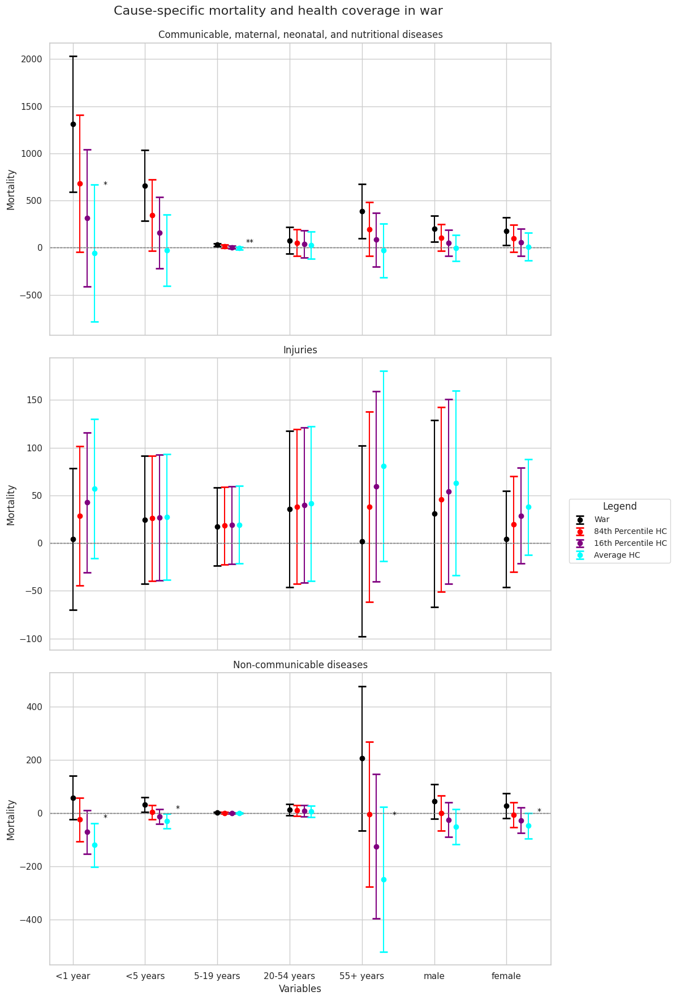

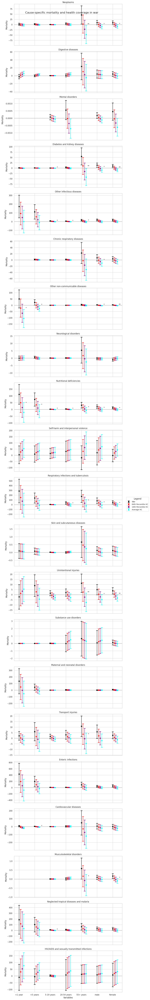

In [ ]:
main_causes = ['Communicable, maternal, neonatal, and nutritional diseases', 'Injuries','Non-communicable diseases']
order2_causes = set(cause_by_agesex.cause.unique()) - set(main_causes + ['All causes'])
agesex = ['<1 year', '<5 years',  '5-19 years', '20-54 years','55+ years', 'male', 'female']
avghc = merged.lag2_health_coverage.mean()
hc16 = merged.lag2_health_coverage.quantile(0.16)
hc84 = merged.lag2_health_coverage.quantile(0.84)
sns.set(style="whitegrid")
tval = t_lookup(0.05,3561)

def sort_by_custom_order(cats, dfs, order):
    i = 0
    new_dfs = []
    new_cats = []
    while i < len(agesex):
        try:
            ix = cats.index(order[i])
            new_dfs.append(dfs[ix])
            new_cats.append(order[i])
        except:
            new_dfs.append(pd.DataFrame())
            new_cats.append('')
        i += 1
    return new_cats, new_dfs

def add_significance_annotation(ax, x, y, pvalue):
    if pvalue < 0.001:
        ax.text(x, y, '***', ha='center', va='bottom', fontsize=10, color='black')
    elif pvalue < 0.01:
        ax.text(x, y, '**', ha='center', va='bottom', fontsize=10, color='black')
    elif pvalue < 0.05:
        ax.text(x, y, '*', ha='center', va='bottom', fontsize=10, color='black')

for k,causeset in enumerate([main_causes, order2_causes]):
    if k == 0: fig, axs = plt.subplots(len(main_causes), 1, figsize=(10, 18), sharex=True)
    else: fig, axs = plt.subplots(len(order2_causes), 1, figsize=(10, 80), sharex=True)
    for i, cause in enumerate(causeset):
        plotted_labels = set()
        frame = causedict.get(cause)
        cats = [e for i, e in enumerate(frame) if i % 2 == 0]
        dfs = [e for i, e in enumerate(frame) if i % 2 != 0]
        cats, dfs = sort_by_custom_order(cats, dfs, agesex)
        for j, (c, df) in enumerate(zip(cats, dfs)):
            if c in agesex:
                war = df[df['index'] == 'War']
                interaction = df[df['index'] == 'interaction_war_lag2_health_coverage']

                if not war.empty:
                    war_params = war['params'].values[0]
                    war_lower = war['lower'].values[0]
                    war_upper = war['upper'].values[0]
                    label = 'War' if 'War' not in plotted_labels else '_nolegend_'
                    axs[i].errorbar(j, war_params,
                                    yerr=[[war_params - war_lower], [war_upper - war_params]],
                                    fmt='o', capsize=5, capthick=2, ecolor='black', mfc='black', mec='black', label='War')
                    plotted_labels.add('War')

                if not interaction.empty:
                    interaction_params = interaction['params'].values[0]
                    interaction_lower = interaction['lower'].values[0]
                    interaction_upper = interaction['upper'].values[0]
                    pvalue = interaction['pvalue'].values[0]

                    se_war = df[df['index'] == 'War'].var_covar.values[0]
                    cov_hc_war = df[df['index'] == 'interaction_war_lag2_health_coverage'].var_covar.values[0]
                    se_hc = df[df['index'] == 'lag2_health_coverage'].var_covar.values[0]

                    # 16 percentile
                    beta_combined = war_params + interaction_params * hc16
                    se_combined = np.sqrt(se_war + se_hc + 2 * cov_hc_war)
                    label = '16th Percentile HC' if '16th Percentile HC' not in plotted_labels else '_nolegend_'
                    ci_combined = [beta_combined - tval * se_combined, beta_combined + tval * se_combined]
                    axs[i].errorbar(j+0.1, beta_combined,
                                    yerr=[beta_combined - ci_combined[0], ci_combined[1] - beta_combined],
                                    fmt='o', capsize=5, capthick=2, ecolor='red', mfc='red', mec='red', label='War-Health Coverage 16th Percentile')
                    plotted_labels.add('16th Percentile HC')


                    # AVG
                    beta_combined = war_params + interaction_params * avghc
                    label = 'Average HC' if 'Average HC' not in plotted_labels else '_nolegend_'
                    se_combined = np.sqrt(se_war + se_hc + 2 * cov_hc_war)
                    ci_combined = [beta_combined - tval * se_combined, beta_combined + tval * se_combined]
                    axs[i].errorbar(j+0.2, beta_combined,
                                    yerr=[beta_combined - ci_combined[0], ci_combined[1] - beta_combined],
                                    fmt='o', capsize=5, capthick=2, ecolor='purple', mfc='purple', mec='purple', label='War-Health Coverage Mean')
                    plotted_labels.add('Average HC')

                    # 84 percentile
                    beta_combined = war_params + interaction_params * hc84
                    label = '84th Percentile HC' if '84th Percentile HC' not in plotted_labels else '_nolegend_'
                    se_combined = np.sqrt(se_war + se_hc + 2 * cov_hc_war)
                    ci_combined = [beta_combined - tval * se_combined, beta_combined + tval * se_combined]
                    axs[i].errorbar(j+0.3, beta_combined,
                                    yerr=[beta_combined - ci_combined[0], ci_combined[1] - beta_combined],
                                    fmt='o', capsize=5, capthick=2, ecolor='cyan', mfc='cyan', mec='cyan',label='War-Health Coverage 84th Percentile')
                    plotted_labels.add('84th Percentile HC')
                    add_significance_annotation(axs[i], j+0.45, (max(beta_combined, war_params) - np.abs(min(beta_combined, war_params)))/2, pvalue)

            axs[i].axhline(0, color='grey', linestyle='--', linewidth=0.8)
            axs[i].set_title(f'{cause}')
            axs[i].set_ylabel('Mortality')
            axs[i].set_xticks(np.arange(len([c for c in cats if c in agesex])))
            axs[i].set_xticklabels([c for c in cats if c in agesex])

    # Set the xlabel for the last subplot
    axs[-1].set_xlabel('Variables')

    handles, labels = axs[-1].get_legend_handles_labels()
    fig.legend(handles, plotted_labels, loc='upper right', fontsize='small', title='Legend', bbox_to_anchor=(1.2, 0.5))
    fig.suptitle('Cause-specific mortality and health coverage in war\n', fontsize=16)
    plt.tight_layout()#(rect=[0, 0.03, 1, 0.95])
    plt.show()

kept:  4604 , dropped:  1507  = 24.66044837178858 % dropped
features:  17
Aggregated Balance Results: {'indirect_mortality': nan, 'year': nan, 'health_coverage': nan, 'age_dependency': nan, 'arable_land': nan, 'gdp_pc': nan, 'pop_dense_sqkm': nan, 'unemployment': nan, 'v2x_polyarchy': nan, 'fertility': nan, 'emdat_deaths_popnormed': nan, 'dev_aid': nan, 'aids30': nan}


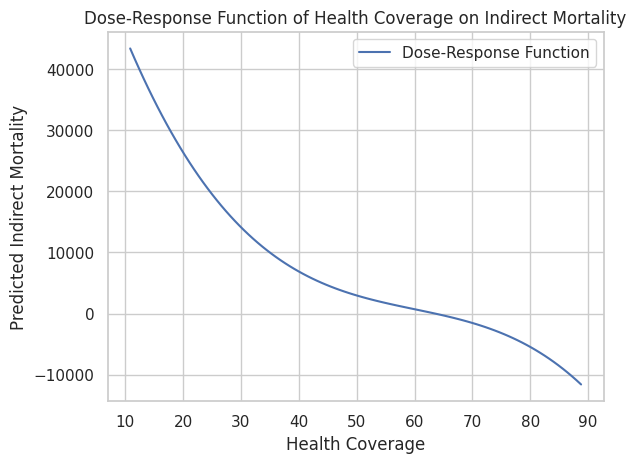

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

df = merged.copy()
covariates = ['indirect_mortality',
 'year',
 'health_coverage',
 'age_dependency',
 'arable_land',
 'gdp_pc',
 'pop_dense_sqkm',
 'unemployment',
 'v2x_polyarchy',
 'fertility',
 'emdat_deaths_popnormed',
 'dev_aid',
 'aids30']
df = cat_convert(df, covars)
df.rename(columns={'lag2_health_coverage': 'health_coverage', 'all_cause_conflict_removed_popnormed':'indirect_mortality', 'War': 'war'}, inplace=True)

df = df[df.war==1]

T = df['health_coverage']

# Divide the treatment into K intervals
K = 5
df['treatment_interval'] = pd.qcut(T, K, labels=False)

# compute GPS within each interval
def compute_gps(df, covariates, interval):
    X = df[df['treatment_interval'] == interval][covariates]
    T_interval = df[df['treatment_interval'] == interval]['health_coverage']

    poly = PolynomialFeatures(degree=2, include_bias=False)
    X_poly = poly.fit_transform(X)

    treatment_model = LinearRegression()
    treatment_model.fit(X_poly, T_interval)

    gps = treatment_model.predict(X_poly)
    return gps

for k in range(K):
    df.loc[df['treatment_interval'] == k, 'gps'] = compute_gps(df, covariates, k)

# number of GPS intervals
m = 5

# Function to calculate mean differences for covariates
def balance_check(df, covariates, treatment_interval, gps_interval):
    balance_results = {}
    for covariate in covariates:
        mean_treated = df[(df['treatment_interval'] == treatment_interval) & (df['gps_interval'] == gps_interval)][covariate].mean()
        mean_control = df[(df['treatment_interval'] != treatment_interval) & (df['gps_interval'] == gps_interval)][covariate].mean()
        balance_results[covariate] = mean_treated - mean_control
    return balance_results

# Divide each treatment interval into m GPS intervals
df['gps_interval'] = pd.qcut(df['gps'], m, labels=False)

# Perform balance check
balance_results = []
for k in range(K):
    for j in range(m):
        balance_results.append(balance_check(df, covariates, k, j))

# Aggregate balance results
aggregated_balance = {covariate: 0 for covariate in covariates}
for result in balance_results:
    for covariate, value in result.items():
        aggregated_balance[covariate] += value

for covariate in covariates:
    aggregated_balance[covariate] /= (K * m)

print("Aggregated Balance Results:", aggregated_balance)

from statsmodels.formula.api import ols

# Include the interaction term in the dataset
df['interaction'] = df['war'] * df['health_coverage']

# Fit a linear regression model using a polynomial approximation
formula = 'indirect_mortality ~ health_coverage + I(health_coverage ** 2) + I(health_coverage ** 3) + gps + I(gps ** 2) + I(gps ** 3) + war + interaction'
outcome_model = ols(formula, data=df).fit()

# Predict the conditional expectation of the outcome
df['predicted_outcome'] = outcome_model.predict(df)

# Re-estimate the GPS model to predict new health_coverage values
treatment_model = LinearRegression()
poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly.fit_transform(df[covariates])
treatment_model.fit(X_poly, df['health_coverage'])

# Create a sequence of treatment levels to evaluate the dose-response function
treatment_levels = np.linspace(df['health_coverage'].min(), df['health_coverage'].max(), 100)

# Calculate the predicted outcomes for each treatment level
predicted_outcomes = []
for t in treatment_levels:
    temp_df = df.copy()
    temp_df['health_coverage'] = t
    temp_df['gps'] = treatment_model.predict(poly.transform(temp_df[covariates]))
    temp_df['interaction'] = temp_df['war'] * t
    predicted_outcome = outcome_model.predict(temp_df).mean()
    predicted_outcomes.append(predicted_outcome)

# Plot the dose-response function
plt.plot(treatment_levels, predicted_outcomes, label='Dose-Response Function')
plt.xlabel('Health Coverage')
plt.ylabel('Predicted Indirect Mortality')
plt.title('Dose-Response Function of Health Coverage on Indirect Mortality')
plt.legend()
plt.show()

## war and **health facility attacks**

(too little data and results are counterintuitive)

In [ ]:
### basic preprocessing
# health_facility['Incident date'] = health_facility['Incident date'].apply(lambda x: int(x.split('-')[0]))
# hf_country_codes = {'Pakistan': 'PAK','Burkina Faso': 'BFA','Syria': 'SYR','Libya': 'LBY','South Sudan': 'SSD',
#     'Afghanistan': 'AFG','Yemen': 'YEM','Nigeria': 'NGA','Greece': 'GRC','Sudan': 'SDN','Saudi Arabia': 'SAU',
#     'Bangladesh': 'BGD','Somalia': 'SOM','Iraq': 'IRQ','Armenia': 'ARM','Lebanon': 'LBN','DRC': 'COD',  # Democratic Republic of the Congo
#     'Mexico': 'MEX','Niger': 'NER','Mali': 'MLI','CAR': 'CAF',  # Central African Republic
#     'India': 'IND','Egypt': 'EGY','OPT': 'PSE',  # Occupied Palestinian Territory
#     'Philippines': 'PHL','Turkey': 'TUR','Ethiopia': 'ETH','Cameroon': 'CMR','Ukraine': 'UKR',
#     'Myanmar': 'MMR','Chad': 'TCD','Indonesia': 'IDN','El Salvador': 'SLV','Iran': 'IRN',
#     'Colombia': 'COL','Mozambique': 'MOZ','Madagascar': 'MDG','Kenya': 'KEN','Brazil': 'BRA',
#     'Uganda': 'UGA','Burundi': 'BDI','USA': 'USA','Equatorial Guinea': 'GNQ','Haiti': 'HTI',
#     'Venezuela': 'VEN','Azerbaijan': 'AZE'}
# health_facility['ISO'] = health_facility.Country.map(hf_country_codes)
# health_facility.to_csv(wkdir+'health_facility_attacks/attack on health facilities.tsv', sep='\t', index=False)

health_facility = pd.read_csv(wkdir+'health_facility_attacks/attack on health facilities.tsv', sep='\t', header=0)
health_facility.rename(columns={'Incident date': 'year'}, inplace=True)
health_facility.drop(columns=['Deprivation of liberty'], inplace=True)
# ## converting all string entries to numbers
string_cols = health_facility.iloc[:, 5:-1].dtypes[health_facility.dtypes == 'object'].index.tolist()
for scol in string_cols:
    health_facility[scol] = health_facility[scol].apply(lambda x: int(x) if str(x).isnumeric() else 0)
health_facility['agg_hf_attacks'] = health_facility.iloc[:, 5:-1].sum(axis=1)
health_facility = health_facility.groupby(['ISO', 'year'])[['agg_hf_attacks']].sum().reset_index()
health_facility = health_facility.merge(merged[covars], on=['ISO', 'year'], how='outer')
health_facility['agg_hf_attacks'] = health_facility['agg_hf_attacks'].fillna(0)
health_facility = cat_convert(health_facility, covars+['agg_hf_attacks'], interaction_terms=False)
health_facility = health_facility[(health_facility.year>=2016) & (health_facility.year<=2019)] # health facility attack data is only available from 2016 and other data only until 2019
health_facility = health_facility.set_index(['ISO', 'year'])
y = np.log(health_facility.all_cause_conflict_removed_popnormed).copy()
health_facility.drop(columns=['all_cause_conflict_removed_popnormed'], inplace=True) # aids30 is only False so perfectly colinear with constant
model = PanelOLS(y, health_facility)
war_fac_attack = model.fit(cov_type='heteroskedastic')
print(war_fac_attack)

kept:  4604 , dropped:  1550  = 25.186870328241795 % dropped
features:  16
                                   PanelOLS Estimation Summary                                    
Dep. Variable:     all_cause_conflict_removed_popnormed   R-squared:                        0.8655
Estimator:                                     PanelOLS   R-squared (Between):              0.8702
No. Observations:                                   671   R-squared (Within):              -1.6119
Date:                                  Fri, Jul 05 2024   R-squared (Overall):              0.8655
Time:                                          01:26:32   Log-likelihood                    280.66
Cov. Estimator:                                  Robust                                           
                                                          F-statistic:                      301.60
Entities:                                           168   P-value                           0.0000
Avg Obs:                          

## **Geospatial** health care access model

- take no conflict countries within the 10 year time frame from merged and randomly sample k geodatapoints (how many?) from within the health care access and the population geotiffs and compare to conflict
- take the conflict points of country i with conflict and within the 10 year time frame and randomly sample j datapoints from the non-conflict areas
 from merged and randomly sample k geodatapoints (how many?) from within the health care access and the population geotiffs and compare to health care access and population in conflict; for conflict areas do fatalities_in_raster/pop_in_raster * transformed(health_access_raster)

### loading, extracting, preprocessing health access and population geodata|

#### loading health access & population rasters (2010, 2015, 2020)

we sample them one by one (for memory reasons) and from each of the rasters we sample those values matching UCDP conflict regions

/content/gdrive/MyDrive/Genocide/Deprivation of capabilities, Mortality, Demography, Ecocide/GBD, WDI, UCDP data//NASA population/gpw_v4_population_density_rev11_2020_30_sec.tif


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

NameError: name 'keep' is not defined

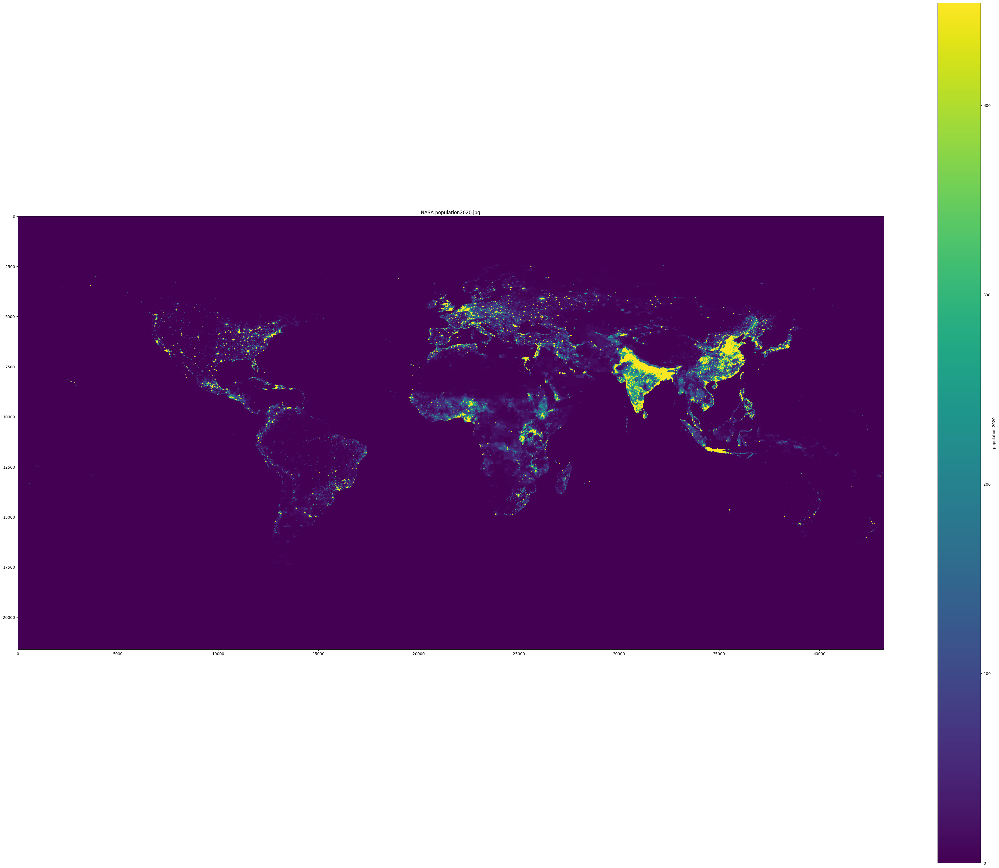

In [ ]:
import re, gc # gc for garbage collection
filepaths = []
# filepaths += [wkdir + "/health_access_geo/2020_motorized_travel_time_to_healthcare.geotiff"]
# filepaths += [wkdir + '/NASA population/gpw_v4_population_density_rev11_2010_30_sec.tif']
# filepaths += [wkdir + '/NASA population/gpw_v4_population_density_rev11_2015_30_sec.tif']
# filepaths += [wkdir + '/NASA population/gpw_v4_population_density_rev11_2020_30_sec.tif']
from rasterio.windows import Window
import rasterio.features
from rasterio.transform import rowcol
from shapely import wkt

def latlon_to_indices(lat, lon, transform):
    row, col = rowcol(transform, lon, lat)
    return row, col

def get_geotiff_vals_by_rowcol(row, col, matrix2D):
    return matrix2D[row, col]

def load_in_chunks(filepath, chunk_size=(1740//2, 4320//2)):
    with rasterio.open(filepath) as src:
        width, height = src.width, src.height
        data = np.zeros((height, width), dtype=np.float32)
        profile = src.profile
        profile.update(dtype=rasterio.uint32)
        for row_start in range(0, height, chunk_size[0]):
            row_stop = min(row_start + chunk_size[0], height)
            for col_start in range(0, width, chunk_size[1]):
                col_stop = min(col_start + chunk_size[1], width)
                window = Window(col_start, row_start, col_stop - col_start, row_stop - row_start)
                chunk = src.read(1, window=window)
                data[row_start:row_stop, col_start:col_stop] = chunk

        return data, src.transform, src.nodata, src.crs


keep = set(dir()) # used to keep current state of loaded modules and vars but to delete all after for memory preservation

for file in filepaths:
    print(file)
    # LOADING DATAFRAME
    try:
        ucdp_geo = pd.read_csv(wkdir + 'ucdp_health_access_geo.tsv', sep='\t')
        ucdp_geo.head()
    except:
        ucdp_geo = pd.read_csv(wkdir + 'UCDP_GED_1989-2022.csv', usecols=["year","best","country", 'latitude', 'longitude', 'geom_wkt'])
        # get ISO code for countries
        ucdp_iso_dict = {
            'Afghanistan': 'AFG', 'Albania': 'ALB', 'Algeria': 'DZA', 'Angola': 'AGO',
            'Argentina': 'ARG', 'Armenia': 'ARM', 'Australia': 'AUS', 'Austria': 'AUT',
            'Azerbaijan': 'AZE', 'Bahrain': 'BHR', 'Bangladesh': 'BGD', 'Belgium': 'BEL',
            'Benin': 'BEN', 'Bhutan': 'BTN', 'Bolivia': 'BOL', 'Bosnia-Herzegovina': 'BIH',
            'Botswana': 'BWA', 'Brazil': 'BRA', 'Burkina Faso': 'BFA', 'Burundi': 'BDI',
            'Cambodia (Kampuchea)': 'KHM', 'Cameroon': 'CMR', 'Canada': 'CAN', 'Central African Republic': 'CAF',
            'Chad': 'TCD', 'China': 'CHN', 'Colombia': 'COL', 'Comoros': 'COM',
            'Congo': 'COG', 'Croatia': 'HRV', 'Djibouti': 'DJI', 'DR Congo (Zaire)': 'COD',
            'Ecuador': 'ECU', 'Egypt': 'EGY', 'El Salvador': 'SLV', 'Eritrea': 'ERI',
            'Ethiopia': 'ETH', 'France': 'FRA', 'Gambia': 'GMB', 'Georgia': 'GEO',
            'Germany': 'DEU', 'Ghana': 'GHA', 'Guatemala': 'GTM', 'Guinea': 'GIN',
            'Guinea-Bissau': 'GNB', 'Guyana': 'GUY', 'Haiti': 'HTI', 'Honduras': 'HND',
            'India': 'IND', 'Indonesia': 'IDN', 'Iran': 'IRN', 'Iraq': 'IRQ',
            'Israel': 'ISR', 'Italy': 'ITA', 'Ivory Coast': 'CIV', 'Jamaica': 'JAM',
            'Jordan': 'JOR', 'Kenya': 'KEN', 'Kingdom of eSwatini (Swaziland)': 'SWZ',
            'Kuwait': 'KWT', 'Kyrgyzstan': 'KGZ', 'Laos': 'LAO', 'Lebanon': 'LBN',
            'Lesotho': 'LSO', 'Liberia': 'LBR', 'Libya': 'LBY', 'Macedonia, FYR': 'MKD',
            'Madagascar (Malagasy)': 'MDG', 'Malaysia': 'MYS', 'Mali': 'MLI',
            'Malta': 'MLT', 'Mauritania': 'MRT', 'Mexico': 'MEX', 'Moldova': 'MDA',
            'Morocco': 'MAR', 'Mozambique': 'MOZ', 'Myanmar (Burma)': 'MMR', 'Namibia': 'NAM',
            'Nepal': 'NPL', 'Netherlands': 'NLD', 'Nicaragua': 'NIC', 'Niger': 'NER',
            'Nigeria': 'NGA', 'Pakistan': 'PAK', 'Panama': 'PAN', 'Papua New Guinea': 'PNG',
            'Paraguay': 'PRY', 'Peru': 'PER', 'Philippines': 'PHL', 'Poland': 'POL',
            'Qatar': 'QAT', 'Romania': 'ROU', 'Russia (Soviet Union)': 'RUS', 'Rwanda': 'RWA',
            'Saudi Arabia': 'SAU', 'Senegal': 'SEN', 'Serbia (Yugoslavia)': 'SRB', 'Sierra Leone': 'SLE',
            'Solomon Islands': 'SLB', 'Somalia': 'SOM', 'South Africa': 'ZAF', 'South Sudan': 'SSD',
            'Spain': 'ESP', 'Sri Lanka': 'LKA', 'Sudan': 'SDN', 'Sweden': 'SWE',
            'Syria': 'SYR', 'Tajikistan': 'TJK', 'Tanzania': 'TZA', 'Thailand': 'THA',
            'Togo': 'TGO', 'Trinidad and Tobago': 'TTO', 'Tunisia': 'TUN', 'Turkey': 'TUR',
            'Uganda': 'UGA', 'Ukraine': 'UKR', 'United Arab Emirates': 'ARE', 'United Kingdom': 'GBR',
            'United States of America': 'USA', 'Uzbekistan': 'UZB', 'Venezuela': 'VEN',
            'Yemen (North Yemen)': 'YEM', 'Zambia': 'ZMB', 'Zimbabwe (Rhodesia)': 'ZWE'}
        ucdp_geo['ISO'] = ucdp_geo.country.map(ucdp_iso_dict)
        ucdp_geo.rename(columns={'best':'conflict_deaths'},inplace=True)

    # LOADING DATA
    data, transform, nodata, crs = load_in_chunks(filepath, chunk_size)
    # data[data==-9999] = data.max()
    # data = np.log1p(data)
    if 'population' in file:
        data[data<0] = 0

    ## VISUALIZING
    vmin, vmax = np.percentile(data, [0.5, 99.5])# data.min(), data.max()
    plt.figure(figsize=(50, 40))
    plt.imshow(data, cmap='viridis', vmin=vmin, vmax=vmax)
    filename = os.path.basename(file).split('.')[0]
    date = re.search(r"\d{4}", filename).group()
    if 'population' in filename:
        plt.colorbar(label='population ' + date)
    plt.title('NASA population' + date + '.jpg')
    plt.savefig(filename+ '.jpg')
    files.download(filename+ '.jpg')

    # # Populate the event matrix with fatalities using vectorized indexing
    # rows = ucdp_geo['row'].values.astype(int)
    # cols = ucdp_geo['col'].values.astype(int)
    # fatalities = ucdp_geo['conflict_deaths'].values

    # # Add data to ucdp_geo
    ucdp_geo['geom_wkt'] = ucdp_geo['geom_wkt'].apply(wkt.loads) # currently the geometric data is stored as str
    ucdp_geo['row'], ucdp_geo['col'] = zip(*ucdp_geo.apply(lambda x: latlon_to_indices(x.geom_wkt.y, x.geom_wkt.x, transform), axis=1))

    if 'population' in filename:
        ucdp_geo['population_'+date] = ucdp_geo.apply(lambda x: get_geotiff_vals_by_rowcol(x['row'], x['col'], data), axis=1)
    else:
        ucdp_geo['health_access'] = ucdp_geo.apply(lambda x: get_geotiff_vals_by_rowcol(x['row'], x['col'], data), axis=1)
    ucdp_geo.to_csv(wkdir + 'ucdp_health_access_geo.tsv', sep='\t', index=False)
    # removing all files and running again
    for name in dir():
        if name not in keep:
            del globals()[name]
    gc.collect()
    plt.close('all')

df.to_csv(wkdir + 'tmp_health_access_geodata.tsv', sep='\tsv', index=False)

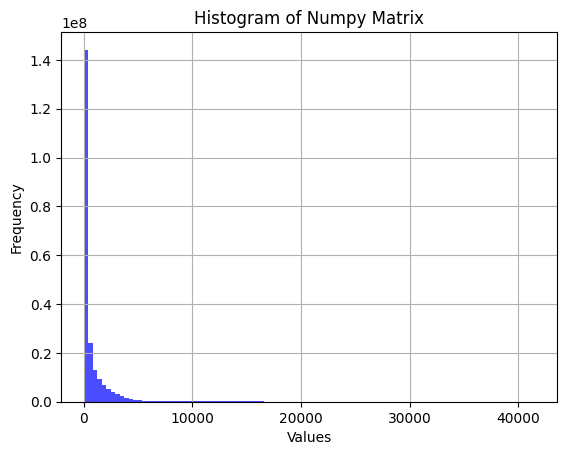

In [ ]:
## DISTRIBUTION OF MOTORIZED HEALTH ACCESS VALUES
plt.hist(data.ravel(), bins=100, color='blue', alpha=0.7)
plt.title('Histogram of Numpy Matrix')
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#### get each country's health access values

loading health access again, masking vectors with country borders to get the health access values, average them per country, merge all with "merged" (all cause, both sex, all age) df

In [ ]:
from rasterio.features import shapes, rasterize
from rasterio.windows import Window
from shapely.geometry import Polygon

filepath = wkdir + "/health_access_geo/2020_motorized_travel_time_to_healthcare.geotiff"

chunk_size = (1740//2, 4320//2)

def load_in_chunks(filepath, chunk_size=(1740//2, 4320//2)):
    with rasterio.open(filepath) as src:
        width, height = src.width, src.height
        data = np.zeros((height, width), dtype=np.float32)
        profile = src.profile
        profile.update(dtype=rasterio.uint32)
        for row_start in range(0, height, chunk_size[0]):
            row_stop = min(row_start + chunk_size[0], height)
            for col_start in range(0, width, chunk_size[1]):
                col_stop = min(col_start + chunk_size[1], width)
                window = Window(col_start, row_start, col_stop - col_start, row_stop - row_start)
                chunk = src.read(1, window=window)
                data[row_start:row_stop, col_start:col_stop] = chunk

        return data, src.transform, src.nodata, src.crs

# load raster of health care access
data, transform, nodata, crs = load_in_chunks(filepath, chunk_size)

# Load country boundaries
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres')) # replace with better admin boundaries?
world['name'].nunique()
nodatauint = 255 # max allowed value for np.uint8 ; num countries in naturalearth_lowres: 177

transform = rasterio.transform.from_bounds(-180, -90, 180, 90, data.shape[1], data.shape[0])

# Create a generator of (geometry, value) tuples
shapes = ((geom, idx + 1) for idx, geom in enumerate(world.geometry))

# Rasterize the shapes to the raster dimensions
country_mask = rasterize(shapes, out_shape=data.shape, transform=transform, dtype=np.uint8, fill=nodatauint)
#
# # Save the mask array
# np.save(wkdir+'country_mask.npy', country_mask)


<ipython-input-46-de1e6cb6192c>:29: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres')) # replace with better admin boundaries


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


avg number of country values 1405489.6101694915
% land 0.33
number of country values missing 101192044, % missing 0.4057980915563701, avg missing 571706.4632768362
total avg of valid values 332.9343486606695
10 countries with BEST mean health access [('PRT', 3.237499475479126), ('ESP', 5.679963111877441), ('NLD', 6.240423679351807), ('ITA', 6.485842704772949), ('BEL', 7.364238739013672), ('LUX', 7.523341655731201), ('MDA', 8.145072937011719), ('CZE', 8.491255760192871), ('HUN', 8.49924087524414), ('BGR', 9.42606258392334)]
10 countries with WORST mean health access [('CAF', 1236.8997802734375), ('USA', 1307.2786865234375), ('MRT', 1338.0145263671875), ('COG', 1369.5472412109375), ('GIN', 1439.93603515625), ('PER', 1662.4957275390625), ('GNB', 1811.968017578125), ('NPL', 1911.709228515625), ('PAK', 2578.9111328125), ('ATF', 7892.689453125)]




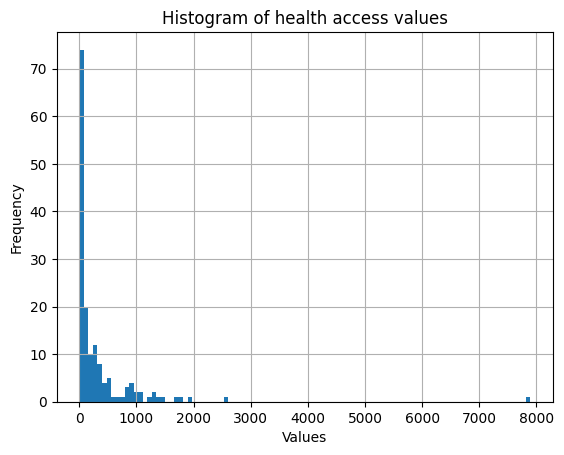

In [ ]:
# country_to_id = {country: idx + 1 for idx, country in enumerate(world['iso_a3'])} # not needed in the end
# id_to_country = {idx + 1: country for idx, country in enumerate(world['iso_a3'])}
land = len(country_mask[country_mask!=255])
water = len(country_mask[country_mask==255])

# getting dictionary {ISO: health_access values}
hc_dict = {iso: data[country_mask==idx] for idx, iso in enumerate(world['iso_a3'])}

# assessing missing data vs valid data
missing = [len(v[v<0]) for v in hc_dict.values()]
valid = [np.mean(v[v>=0]) for v in hc_dict.values()]
mask = np.array([1 if not np.isnan(v) else 0 for v in valid])
isos = np.array(list(hc_dict.keys()))[mask==1]
valid = np.array(valid)[mask==1]
ix = np.argsort(valid)
valid = valid[ix]
isos = isos[ix]

print('avg number of country values',np.mean([len(v) for v in hc_dict.values()]))
print(f'% land {np.round(land/(land+water), 2)}')
print(f'number of country values missing {sum(missing)}, % missing {sum(missing)/land}, avg missing {np.mean(missing)}')
print(f'total avg of valid values {np.mean(valid)}')
print(f'10 countries with BEST mean health access {list(zip(isos, valid))[:10]}') # higher means worse!
print(f'10 countries with WORST mean health access {list(zip(isos, valid))[-10:]}\n\n')

plt.hist(valid, bins=100)
plt.title('Histogram of health access values')
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [ ]:
ha = pd.DataFrame({iso: [val] for iso, val in hc_dict.items()}.items(), columns=['ISO', 'health_access_vals']) # all the dict values have to have same length, hence the repackaging in list
ha['year'] = 2010
ha['avg_health_access'] = ha.health_access_vals.apply(lambda x: np.mean(x[0][x[0]>=0])) # x is list[array], we just want to avg the array
# creating a multi-index in preparation for merging with merged
multiix = pd.MultiIndex.from_product([isos, np.arange(2010, 2021)], names=['ISO', 'year']).to_frame(index=False)
ha = ha.merge(multiix, on=['ISO', 'year'], how='outer')
# forward filling the other 19 years with the health access values (since we assume they stay constant over 10 year period)
ha[['health_access_vals', 'avg_health_access']] = ha.groupby('ISO')[['health_access_vals', 'avg_health_access']].ffill()

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


,ISO,health_access_vals,year,avg_health_access
0,FJI,[[]],2010,NaN
1,TZA,"[[-9999.0, -9999.0, -9999.0, -9999.0, -9999.0,...",2010,NaN
2,ESH,"[[173.96983, 164.46577, 141.2201, 131.78629, 1...",2010,125.712173
3,CAN,"[[-9999.0, -9999.0, -9999.0, -9999.0, -9999.0,...",2010,NaN
4,USA,"[[-9999.0, -9999.0, -9999.0, -9999.0, -9999.0,...",2010,1307.278687
...,...,...,...,...
1742,ATF,NaN,2016,NaN
1743,ATF,NaN,2017,NaN
1744,ATF,NaN,2018,NaN
1745,ATF,NaN,2019,NaN


In [ ]:
merged_geo = merged[merged.year.isin(list(range(2010,2021)))].merge(ha, on=['ISO', 'year'], how='outer')
merged_geo = merged_geo.drop_duplicates(subset=['ISO', 'year'])
merged_geo.to_csv(wkdir+'merged_geo.tsv', sep='\t', index=False)

#### aggregate conflict deaths in UCDP geo and interpolate populations

In [ ]:
# ucdp_geo.to_csv(wkdir + 'ucdp_health_access_geo.tsv', sep='\t', index=False)
# import pickle
# with open(wkdir + 'fatalitiesXhealth_access_matrix.pickle', 'wb') as handle:
#     pickle.dump(result_matrix, handle, protocol=pickle.HIGHEST_PROTOCOL)
# with open(wkdir + 'fatalitiesXhealth_access_matrix.pickle', 'rb') as handle:
#     result_matrix = pickle.load(handle)
ucdp_geo = pd.read_csv(wkdir + 'ucdp_health_access_geo.tsv', sep='\t')
ucdp_geo = ucdp_geo[ucdp_geo.year.isin(list(range(2010,2021)))]

# now we need to aggregate the conflict values per country, year, latitude, longitude
# (we add the other cols to retain their values but they are already specific to country-year-lat-long)
ucdp = ucdp_geo.groupby(['year', 'latitude', 'longitude', 'geom_wkt', 'country','ISO', 'row', 'col',
                         'health_access', 'population_2010', 'population_2015', 'population_2020'])[['conflict_deaths']].sum().reset_index()
ucdp_geo

,year,latitude,longitude,geom_wkt,country,conflict_deaths,ISO,row,col,health_access,population_2010,population_2015,population_2020
0,2017,34.531094,69.162796,POINT (69.162796 34.531094),Afghanistan,6,AFG,6656,29899,0.000000,8745.178000,9953.606000,11329.019000
321,2010,36.324882,68.623400,POINT (68.6234 36.324882),Afghanistan,7,AFG,6441,29834,89.688710,61.068120,65.661010,70.599335
322,2010,34.912834,69.736866,POINT (69.736866 34.912834),Afghanistan,1,AFG,6610,29968,69.466390,114.658104,124.427880,135.030100
323,2010,34.885887,69.663383,POINT (69.663383 34.885887),Afghanistan,4,AFG,6613,29959,62.715210,143.690770,155.934360,169.221180
324,2010,33.494694,70.004791,POINT (70.004791 33.494694),Afghanistan,2,AFG,6780,30000,30.804306,155.469820,200.220030,257.851070
...,...,...,...,...,...,...,...,...,...,...,...,...,...
316807,2019,-18.012741,31.075550,POINT (31.07555 -18.012741),Zimbabwe (Rhodesia),1,ZWE,12961,25329,1.764958,6574.206000,6956.604000,7361.245000
316808,2019,-18.975973,32.650092,POINT (32.650092 -18.975973),Zimbabwe (Rhodesia),1,ZWE,13077,25518,1.844862,1084.948900,1146.729600,1212.028300
316809,2019,-17.817777,31.044722,POINT (31.044722 -17.817777),Zimbabwe (Rhodesia),1,ZWE,12938,25325,0.000000,2350.062000,2486.756600,2631.402600
316810,2019,-21.358380,30.706680,POINT (30.70668 -21.35838),Zimbabwe (Rhodesia),2,ZWE,13363,25284,31.253824,12.659299,13.425394,14.237850


count    175063.000000
mean        189.764124
std         578.431091
min       -2408.255700
25%           4.494488
50%          21.513630
75%          75.382730
max       22755.960000
dtype: float64


<Axes: ylabel='Frequency'>

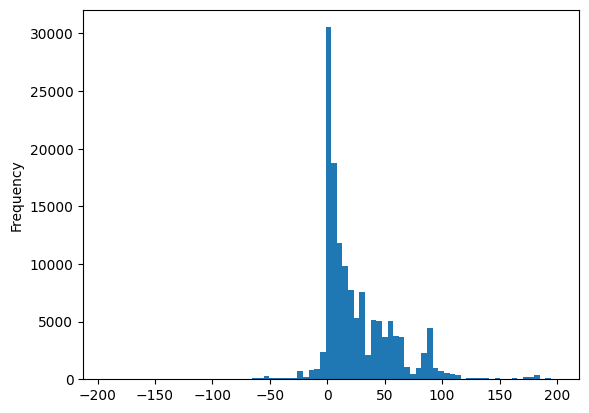

In [ ]:
diff1 = ucdp_geo.population_2015 - ucdp_geo.population_2010
diff2 = ucdp_geo.population_2020 - ucdp_geo.population_2015
val = 200
# diff1[(diff1<val) & (diff1>-val) ].plot.hist(bins=80)
print(diff1.describe())
diff2[(diff2<val) & (diff2>-val) ].plot.hist(bins=80)
# print(diff2.describe())

In [ ]:
pop = ucdp_geo[['ISO', 'latitude', 'longitude','population_2010', 'population_2015', 'population_2020']].drop_duplicates()
years = np.arange(2010, 2021)
uniques = pop[['ISO', 'latitude', 'longitude']].drop_duplicates()

geomerged = pd.DataFrame(np.hstack([np.vstack([uniques.values] * len(years)), # we need to repeat the whole ARRAYS for uniques and the ELEMENTS for years, then column stack them
                                    np.repeat(years, len(uniques)).reshape(-1,1)]), columns=['ISO', 'latitude', 'longitude','year'])\
                                        .sort_values(by=['ISO', 'latitude', 'longitude', 'year'])\
                                        .drop_duplicates(subset=['ISO','latitude','longitude', 'year'])

# perform a manual melt
for col in ['population_2010', 'population_2015', 'population_2020']:
    y = col[-4:] # get years
    temp = pop[['ISO', 'latitude', 'longitude', 'population_'+y]].drop_duplicates()
    temp['year'] = int(y)
    # adding the population values for the years 2010,2015,2020 to a new dataframe
    geomerged = geomerged.merge(temp, on=['ISO', 'year','latitude', 'longitude'], how='left')

# # now we create a new population column and add those values stored in the population columns for 2010,2015,2020 into it
geomerged['population'] = geomerged[['population_2010','population_2015','population_2020']].sum(axis=1)
# # using the sum function above sets nonexistent values in years without census data to 0, these we need to reset to NaNs so that we can interpolate them
geomerged.loc[geomerged.year.isin(list(range(2011,2015))+list(range(2016,2020))), 'population'] = np.nan
geomerged.drop(columns=['population_2010', 'population_2015', 'population_2020'], inplace=True)
geomerged.year = geomerged.year.astype(int)

geomerged = geomerged.groupby(['ISO', 'latitude', 'longitude']).apply(lambda group: group.set_index('year')['population'].interpolate(method='linear')).reset_index()
ucdp = ucdp_geo[['ISO', 'latitude', 'longitude','year', 'geom_wkt', 'country','conflict_deaths', 'health_access']]
geomerged = geomerged.merge(ucdp, on=['ISO', 'latitude', 'longitude', 'year'], how='left')
geomerged

,ISO,latitude,longitude,year,population,geom_wkt,country,conflict_deaths,health_access
0,AFG,29.433333,64.050000,2010,1.868052,NaN,NaN,NaN,NaN
1,AFG,29.433333,64.050000,2011,1.901687,NaN,NaN,NaN,NaN
2,AFG,29.433333,64.050000,2012,1.935322,NaN,NaN,NaN,NaN
3,AFG,29.433333,64.050000,2013,1.968957,POINT (64.05 29.433333),Afghanistan,45.0,206.44293
4,AFG,29.433333,64.050000,2014,2.002593,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
389590,ZWE,-17.166667,31.666667,2016,47.627948,NaN,NaN,NaN,NaN
389591,ZWE,-17.166667,31.666667,2017,48.341219,NaN,NaN,NaN,NaN
389592,ZWE,-17.166667,31.666667,2018,49.054491,NaN,NaN,NaN,NaN
389593,ZWE,-17.166667,31.666667,2019,49.767762,NaN,NaN,NaN,NaN


In [ ]:
geomerged[['conflict_deaths', 'health_access', 'population']][(geomerged.population>0) & (geomerged.health_access!=-9999)].dropna().describe()

,conflict_deaths,health_access,population
count,174714.000000,174714.000000,174714.000000
mean,5.807348,37.402854,1681.415334
std,68.935729,95.795725,4694.598837
min,0.000000,0.000000,0.011920
25%,1.000000,1.168868,55.296352
50%,2.000000,8.617423,203.986812
75%,5.000000,32.115363,619.733320
max,14162.000000,3720.709700,164453.652000


In [ ]:
subgeo = geomerged[['ISO', 'latitude', 'longitude', 'year','conflict_deaths', 'health_access', 'population']][(geomerged.population>0) & (geomerged.health_access!=-9999)].dropna()
percentiles = [10, 50, 75,80, 90, 95, 99, 99.5, 99.9, 99.99, 99.999]
pcs = np.percentile(((subgeo.conflict_deaths/subgeo.population)) * subgeo.health_access.values, percentiles)
print(list(zip(percentiles, pcs)))

subgeo['cdeaths_pc'] = subgeo.conflict_deaths/subgeo.population
subgeo['cdeaths_pcXhealth_access'] = subgeo.cdeaths_pc * subgeo.health_access
subgeo.to_csv(wkdir+'ucdp_health_access_geo2_pop.tsv', sep='\t', index=False)
subgeo

[(10, 0.0), (50, 0.054568823873369525), (75, 1.1500156238758776), (80, 2.4481355157913107), (90, 15.784463684495607), (95, 56.3596521966397), (99, 457.76133193435913), (99.5, 1273.120851348077), (99.9, 23726.5661641264), (99.99, 327915.1131856627), (99.999, 651996.9766587643)]


,ISO,latitude,longitude,year,conflict_deaths,health_access,population,cdeaths_pc,cdeaths_pcXhealth_access
3,AFG,29.433333,64.050000,2013,45.0,206.442930,1.968957,22.854735,4718.198547
8,AFG,29.433333,64.050000,2018,6.0,206.442930,2.146217,2.795616,577.135214
11,AFG,29.811497,65.805092,2010,7.0,242.990430,0.605411,11.562386,2809.549259
23,AFG,29.856593,60.901943,2011,6.0,180.119000,1.222167,4.909314,884.260744
34,AFG,29.889044,63.129694,2011,5.0,985.998100,2.041838,2.448774,2414.486155
...,...,...,...,...,...,...,...,...,...
389579,ZWE,-17.817777,31.044722,2019,1.0,0.000000,2602.473400,0.000384,0.000000
389580,ZWE,-17.817777,31.044722,2019,1.0,0.000000,2602.473400,0.000384,0.000000
389581,ZWE,-17.817777,31.044722,2019,0.0,0.000000,2602.473400,0.000000,0.000000
389582,ZWE,-17.817777,31.044722,2019,1.0,0.000000,2602.473400,0.000384,0.000000


<ipython-input-58-fa183e4cdaff>:4: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


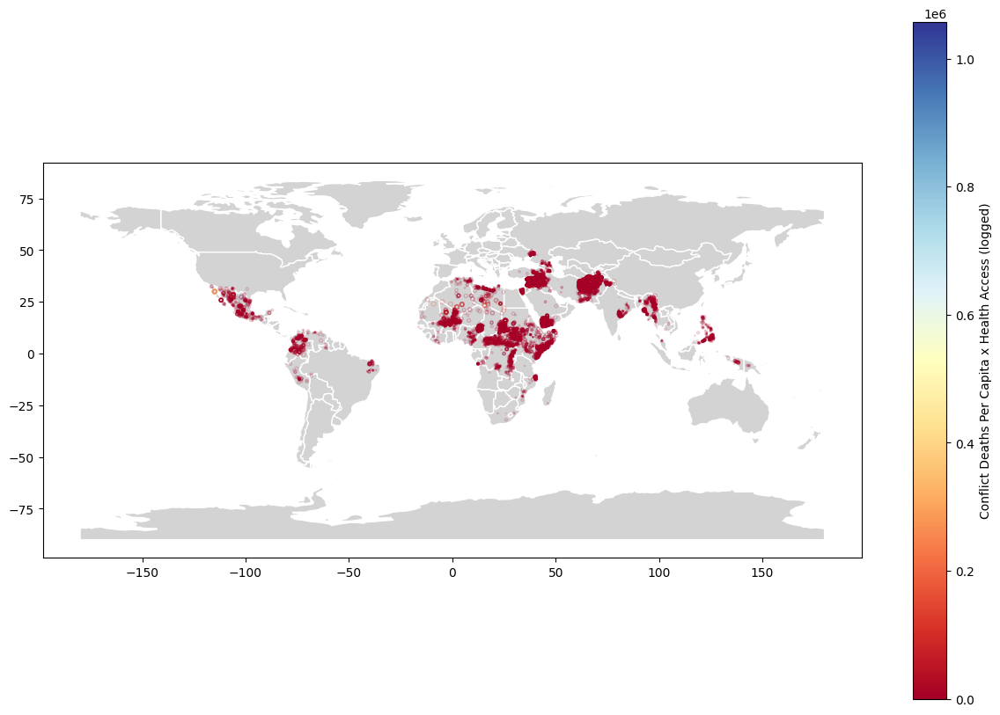

In [ ]:
col_to_display = 'cdeaths_pcXhealth_access'
import matplotlib.cm as cm

world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Create figure and axis
fig, ax = plt.subplots(figsize=(15, 10))

# Plot world map
world.plot(ax=ax, color='lightgray', edgecolor='white')
c_s = (subgeo[col_to_display].values)
norm = plt.Normalize(vmin=np.min(c_s), vmax=np.max(c_s))
edge_colors = cm.RdYlBu(norm(c_s))

# normed = (subgeo['cdeaths_pcXhealth_access'] - np.min(subgeo['cdeaths_pcXhealth_access'])) / (np.max(subgeo['cdeaths_pcXhealth_access']) - np.min(subgeo['cdeaths_pcXhealth_access'])) * 13
# normed = sigmoid(subgeo['cdeaths_pcXhealth_access']) * 10
normed = np.log(subgeo['cdeaths_pcXhealth_access'])

# Scatter plot with size and color based on log-transformed values
scatter = plt.scatter(subgeo['longitude'], subgeo['latitude'],
                      facecolors='none', edgecolors=edge_colors,
                      s=normed,
                    alpha=0.2)

# Create a colorbar
cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap='RdYlBu'),ax=ax, label='Conflict Deaths Per Capita x Health Access (logged)')
plt.show()


### regression models

In [ ]:
subgeo = pd.read_csv(wkdir+'ucdp_health_access_geo2_pop.tsv', sep='\t')
merged_geo = pd.read_csv(wkdir+'merged_geo.tsv', sep='\t')

In [ ]:
subgeo[(subgeo.conflict_deaths>subgeo.population) & (subgeo.ISO=='MEX')]

,ISO,latitude,longitude,year,conflict_deaths,health_access,population,cdeaths_pc,cdeaths_pcXhealth_access
54219,MEX,16.500000,-92.500000,2018,91.0,27.529161,51.915134,1.752861,4.825479e+01
54413,MEX,17.000000,-96.500000,2018,726.0,12.542314,12.314328,58.955716,7.394411e+02
54423,MEX,17.000000,-96.500000,2020,27.0,12.542314,12.346738,2.186812,2.742769e+01
54440,MEX,17.393070,-99.876780,2015,4.0,85.028190,1.659761,2.409985,2.049167e+02
54633,MEX,18.000000,-92.666667,2018,248.0,23.682568,52.272289,4.744388,1.123593e+02
54643,MEX,18.062760,-102.690290,2015,7.0,57.033688,5.764348,1.214361,6.925949e+01
54646,MEX,18.079462,-100.898299,2019,14.0,73.092790,7.825800,1.788955,1.307597e+02
54695,MEX,18.301630,-95.959670,2014,31.0,25.554764,24.071350,1.287838,3.291040e+01
54825,MEX,18.768330,-102.765410,2020,5.0,73.465550,2.554787,1.957110,1.437802e+02
54826,MEX,18.768330,-102.765410,2020,20.0,73.465550,2.554787,7.828440,5.751207e+02


#### country level aggregate

In [ ]:
print(f'in {round(100-len(subgeo[(subgeo.conflict_deaths<subgeo.population)])/len(subgeo) * 100,2)}% of cases the conflict deaths exceed the population.\n These may be because combat operations moved more people into a remote area than lived there,\nbut quite probably they are measurement errors (see e.g. MEX above where violence is from gangs not armies operating in remote terrain), so they are excluded.')
subgeo[(subgeo.conflict_deaths<subgeo.population)].groupby(['ISO', 'year'])[['cdeaths_pc', 'health_access','cdeaths_pcXhealth_access']].sum().reset_index().sort_values(by='cdeaths_pcXhealth_access', ascending=False)[:100]

in 3.51% of cases the conflict deaths exceed the population.
 These may be because combat operations moved more people into a remote area than lived there,
but quite probably they are measurement errors (see e.g. MEX above where violence is from gangs not armies operating in remote terrain), so they are excluded.


,ISO,year,cdeaths_pc,health_access,cdeaths_pcXhealth_access
476,SYR,2013,731.341466,313240.856949,85828.146443
9,AFG,2019,616.565997,440173.866128,79164.566507
8,AFG,2018,450.952805,336706.376868,62320.495297
477,SYR,2014,653.562648,247439.197801,57498.991686
10,AFG,2020,358.675847,275113.147706,40458.306989
7,AFG,2017,294.310227,209510.829275,39270.539788
6,AFG,2016,293.249510,204852.209590,35680.063464
2,AFG,2012,227.778464,233360.349503,35550.373426
5,AFG,2015,240.220607,203985.820436,31971.960154
475,SYR,2012,361.061371,151328.019816,28240.655872


In [ ]:
### some tests as to whether the subset 2010-2020 yields any significance wrt conflict, but no (whether with cat conversion or logged conflict deaths)
vars = ['ISO', 'year','lag1_conflict_deaths', 'lag2_health_coverage','all_cause_conflict_removed_popnormed',  'age_dependency', 'arable_land',
        'gdp_pc', 'pop_dense_sqkm','unemployment','v2x_polyarchy','fertility','emdat_deaths_popnormed','dev_aid', 'aids30'] #  'avg_health_access'
# shift ind vars
tmp = merged_geo.loc[merged_geo.year.isin(list(range(2010,2021))), vars]
# tmp = cat_convert(tmp, vars, interaction_terms=False)
transformvars(tmp, ['gdp_pc'], smoothing=1e-5)
transformvars(tmp, ['lag1_conflict_deaths'], smoothing=1e-5)
tmp = sm.add_constant(tmp).set_index(['ISO', 'year'])
model = PanelOLS(tmp.all_cause_conflict_removed_popnormed, tmp[[v for v in tmp.columns if not v=='all_cause_conflict_removed_popnormed']], entity_effects=True, time_effects=True, drop_absorbed=True)
geohealth = model.fit(cov_type='heteroskedastic')
# print(geohealth)
s = Stargazer([geohealth])
s.significance_levels([0.05, 0.01,0.001])
s.show_confidence_intervals(True)
print(VIF(model))
s

/usr/local/lib/python3.10/dist-packages/linearmodels/panel/model.py:1219: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(dependent, exog, weights=weights, check_rank=check_rank)
<ipython-input-164-c6b05dc207cd>:12: AbsorbingEffectWarning: 
Variables have been fully absorbed and have removed from the regression:

log(lag1_conflict_deaths), lag2_health_coverage, age_dependency, arable_land, log(gdp_pc), pop_dense_sqkm, unemployment, v2x_polyarchy, fertility, aids30, avg_health_access

  geohealth = model.fit(cov_type='heteroskedastic')


emdat_deaths_popnormed:  1.005
dev_aid:  1.005
None


<Axes: >

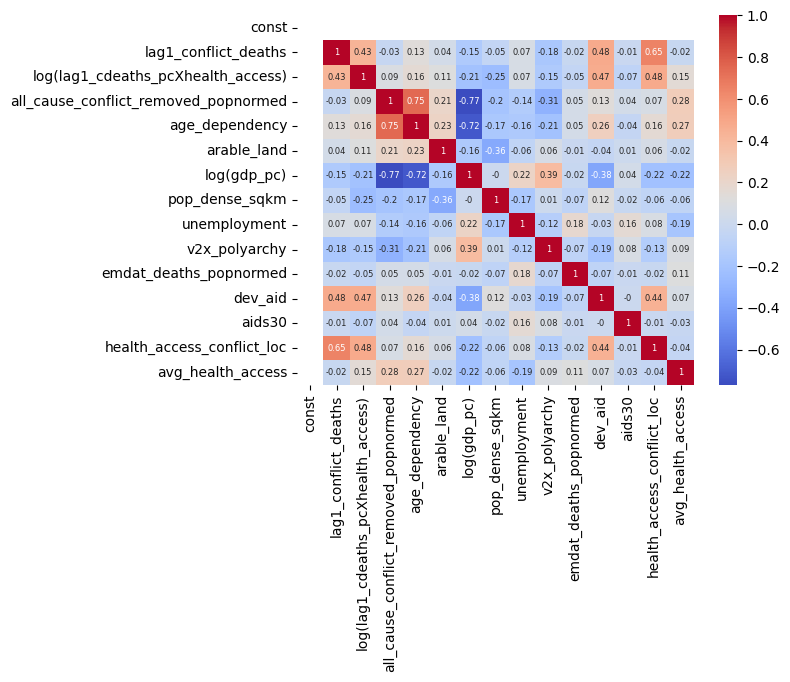

In [ ]:
sns.heatmap(np.round(tmp.corr(),2), cmap='coolwarm', annot=True, annot_kws={"size":6})

In [ ]:
subgeocum.avg_health_access.describe()

,avg_health_access
count,1727.000000
mean,332.934349
std,742.489575
min,3.237499
25%,25.418110
50%,105.633194
75%,330.994812
max,7892.689453


In [ ]:
subgeocum = subgeo[(subgeo.conflict_deaths<subgeo.population)].groupby(['ISO', 'year'])[['cdeaths_pc', 'health_access','cdeaths_pcXhealth_access']].sum().reset_index()
subgeocum.rename(columns={'health_access': 'health_access_conflict_loc'}, inplace=True)
subgeocum = subgeocum.merge(merged_geo, on=['ISO', 'year'], how='outer').drop_duplicates()
subgeocum[['lag1_conflict_deaths', 'lag1_cdeaths_pcXhealth_access']] = subgeocum.groupby('ISO')[['conflict_deaths', 'cdeaths_pcXhealth_access']].shift(1)

vars = ['ISO', 'year','lag1_conflict_deaths', 'lag1_cdeaths_pcXhealth_access', 'all_cause_conflict_removed_popnormed',  'age_dependency', 'arable_land',
        'gdp_pc', 'pop_dense_sqkm','unemployment','v2x_polyarchy','emdat_deaths_popnormed','dev_aid', 'aids30', 'health_access_conflict_loc', 'avg_health_access'] # ,'lag2_health_coverage', 'cdeaths_pc',
# shift ind vars
tmp = subgeocum[vars].dropna()
tmp = sm.add_constant(tmp).set_index(['ISO', 'year'])
transformvars(tmp, ['gdp_pc',], smoothing=1e-5) # 'health_access',  'cdeaths_pc',
transformvars(tmp, ['lag1_cdeaths_pcXhealth_access'], smoothing=1)
y = tmp.all_cause_conflict_removed_popnormed.copy()
model = PanelOLS(y, tmp[[v for v in tmp.columns if not v=='all_cause_conflict_removed_popnormed']], entity_effects=True, time_effects=True)
geohealth = model.fit(**lin_fit_dict)
print(geohealth)
# s = Stargazer([geohealth])
# s.significance_levels([0.05, 0.01,0.001])
# s.show_confidence_intervals(True)
# print(VIF(model))
# s

AbsorbingEffectError: 
The model cannot be estimated. The included effects have fully absorbed
one or more of the variables. This occurs when one or more of the dependent
variable is perfectly explained using the effects included in the model.

The following variables or variable combinations have been fully absorbed
or have become perfectly collinear after effects are removed:

          const, lag1_conflict_deaths, log(lag1_cdeaths_pcXhealth_access), age_dependency, arable_land, log(gdp_pc), pop_dense_sqkm, unemployment, v2x_polyarchy, emdat_deaths_popnormed, dev_aid, aids30, health_access_conflict_loc, avg_health_access

Set drop_absorbed=True to automatically drop absorbed variables.


<Axes: ylabel='Frequency'>

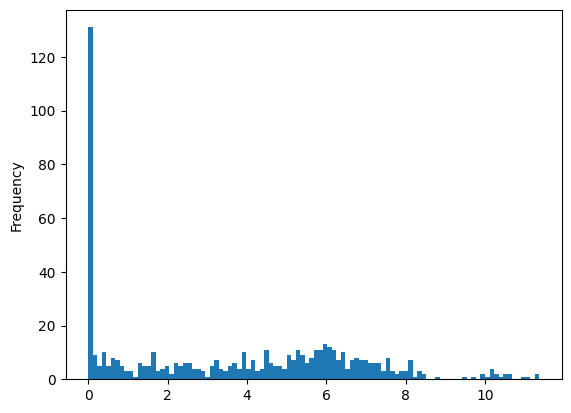

In [ ]:
np.log(subgeocum.cdeaths_pcXhealth_access + 1).plot.hist(bins=100)

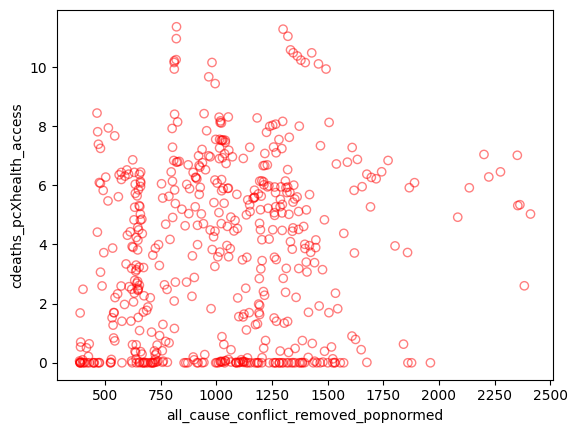

In [ ]:
ind_var = 'cdeaths_pcXhealth_access'
# plt.scatter(tmp.all_cause_conflict_removed_popnormed, tmp.cdeaths_pcXhealth_access, facecolor='none', marker='o', edgecolor='red', alpha=0.5)
plt.scatter(subgeocum.dropna(subset=['all_cause_conflict_removed_popnormed', ind_var]).all_cause_conflict_removed_popnormed,
            np.log(subgeocum.dropna(subset=['all_cause_conflict_removed_popnormed', ind_var]).cdeaths_pcXhealth_access+1),
            facecolor='none', marker='o', edgecolor='red', alpha=0.5)
plt.xlabel('all_cause_conflict_removed_popnormed')
plt.ylabel(ind_var)
plt.show()

#### hierarchical

In [ ]:
from statsmodels.regression.mixed_linear_model import MixedLM

higeo = subgeo[(subgeo.conflict_deaths<=subgeo.population)].merge(merged_geo[covars], on=['ISO', 'year'], how='outer')

# Transform health access data which has a very large range
### THIS NEEDS TO BE REPLACED WITH ACTUAL COUNTRY-LEVEL MEDIAN OR MEAN
print(higeo.health_access.describe())
higeo['health_access'].fillna(higeo['health_access'].median(), inplace=True)
# print(higeo['health_access'].quantile(0.25))
# higeo['health_access'].fillna(higeo['health_access'].quantile(0.25), inplace=True)
# higeo['health_access'].fillna(0, inplace=True)
# higeo['health_access'].fillna(higeo['health_access'].mean(), inplace=True)
# rando = np.random.choice(higeo['health_access'].values, size=1)[0] # tendentially the higher the health access fillings the higher its significance and that of cdeaths_pc interaction with it
# print('rando', rando, 'logged rando', np.log1p(rando), 'number to be filled with rando', len(higeo[higeo.health_access.isnull()]))
# higeo['health_access'].fillna(rando, inplace=True)
higeo.health_access = np.log1p(higeo.health_access)
#####

# Fill missing values for cdeaths_pc and for its interaction with health access with 0
higeo['cdeaths_pc'].fillna(0, inplace=True)
higeo['cdeaths_pc'] = (higeo['cdeaths_pc'] > 0.9)*1 # 0.01 - 0.02 are sensible categoricals
higeo['cdeaths_pcXhealth_access'] = higeo.cdeaths_pc * higeo.health_access
# higeo['cdeaths_pcXhealth_access'].fillna(0, inplace=True)

# Drop columns that are redundant or shouldn't be included
higeo.drop(columns=['population','latitude', 'longitude', 'conflict_deaths', 'lag1_conflict_deaths'], inplace=True)
higeo.dropna(inplace=True)
higeo.aids30 = higeo.aids30.astype(int)

print(len(higeo))
# Create the fixed effects design matrix (including intercept)
X = higeo[['cdeaths_pc', 'health_access', 'cdeaths_pcXhealth_access',
           'gdp_pc', 'age_dependency', 'arable_land',
           'pop_dense_sqkm', 'unemployment', 'v2x_polyarchy',
           'fertility', 'emdat_deaths_popnormed', 'dev_aid', 'aids30']]
X = sm.add_constant(X)

# Create the random effects design matrix (just the intercept in this case)
Z = sm.add_constant(higeo[['cdeaths_pc', 'health_access', 'cdeaths_pcXhealth_access']])

# Specify the groups / random effect intercepts
groups = higeo['ISO']  # -756994.6640
# groups = higeo['ISO'] + '_' + higeo['year'].astype(str) # Log-Likelihood: 1279136.7974
# groups = higeo['year'] # -977063.3626

# Fit the model
model = MixedLM(higeo['all_cause_conflict_removed_popnormed'], X, groups=groups, exog_re=Z)
result = model.fit()
print(result.summary())
vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
print(f'\n Variance Inflation: \n{vif_data}\n')
X[['cdeaths_pc', 'health_access', 'cdeaths_pcXhealth_access']].describe()

count    168578.000000
mean         32.996825
std          79.786700
min           0.000000
25%           1.109055
50%           8.396604
75%          28.078796
max        3273.714800
Name: health_access, dtype: float64
158372


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


                            Mixed Linear Model Regression Results
Model:                 MixedLM    Dependent Variable:    all_cause_conflict_removed_popnormed
No. Observations:      158372     Method:                REML                                
No. Groups:            171        Scale:                 849.4710                            
Min. group size:       11         Log-Likelihood:        -759832.3242                        
Max. group size:       81255      Converged:             Yes                                 
Mean group size:       926.2                                                                 
---------------------------------------------------------------------------------------------
                                               Coef.   Std.Err.    z    P>|z|  [0.025  0.975]
---------------------------------------------------------------------------------------------
const                                          459.871   22.571  20.375 0.000 415.633 50

,cdeaths_pc,health_access,cdeaths_pcXhealth_access
count,158372.000000,158372.000000,158372.000000
mean,0.004944,2.239198,0.018779
std,0.070140,1.588174,0.294399
min,0.000000,0.000000,0.000000
25%,0.000000,0.774205,0.000000
50%,0.000000,2.240348,0.000000
75%,0.000000,3.292615,0.000000
max,1.000000,8.093986,7.982803


In [ ]:
Stargazer([result])

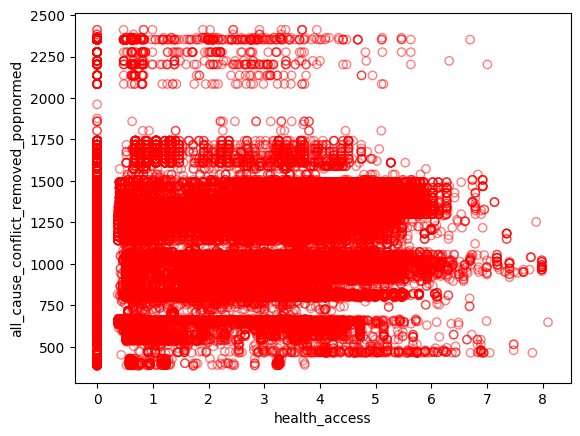

In [ ]:
plt.scatter(np.log1p(higeo.health_access), higeo.all_cause_conflict_removed_popnormed, facecolor='none', marker='o', edgecolor='red', alpha=0.5)
plt.xlabel('health_access')
plt.ylabel('all_cause_conflict_removed_popnormed')
plt.show()

In [ ]:
## average affected populations
subgeo.groupby(['ISO','year'])[['population']].sum().reset_index().groupby('ISO')[['population']].mean().reset_index().sort_values(by='population', ascending=False)

,ISO,population
77,SYR,1.638898e+07
53,MEX,2.578479e+06
89,YEM,1.152266e+06
62,PAK,8.673195e+05
12,BRA,8.428092e+05
0,AFG,7.996269e+05
73,SOM,6.479117e+05
41,ISR,5.960519e+05
60,NGA,5.912864e+05
40,IRQ,5.623219e+05


In [ ]:
# x, y = higeo.cdeaths_pc, higeo.all_cause_conflict_removed_popnormed
# plt.scatter(x,y, facecolor='none', marker='o', edgecolor='red', alpha=0.5)
# plt.xlabel('conflict deaths per capita')
# plt.ylabel('all_cause_conflict_removed_popnormed')
# plt.show()

higeo = subgeo[(subgeo.conflict_deaths<=subgeo.population)].merge(merged[covars], on=['ISO', 'year'], how='outer')
higeo['cdeaths_pc'].fillna(0, inplace=True)
higeo=higeo.dropna()
print('float cdeaths correlation with mortality: ',np.round(np.corrcoef(higeo.cdeaths_pc, higeo.all_cause_conflict_removed_popnormed)[0,1],2))
best = -np.inf
best_thresh = 0
for thresh in np.linspace(0,1,2000):
    x,y = (higeo.cdeaths_pc>thresh)*1, higeo.all_cause_conflict_removed_popnormed
    corr = np.abs(np.corrcoef(x,y)[0,1])
    if corr > best:
        best = corr
        best_thresh = thresh
print('categorical cdeaths correlation with mortality')
print(f'threshold {np.round(best_thresh,6)}: {np.round(best, 2)}')

float cdeaths correlation with mortality:  0.19
categorical cdeaths correlation with mortality
threshold 0.017509: 0.3


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


<Axes: ylabel='Frequency'>

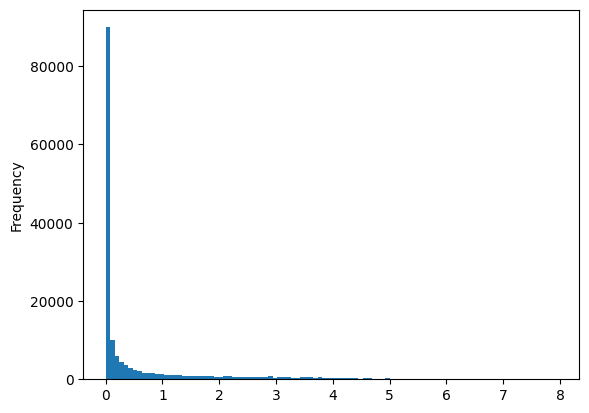

In [ ]:
(X['cdeaths_pcXhealth_access']).plot.hist(bins=100)

<Axes: ylabel='Frequency'>

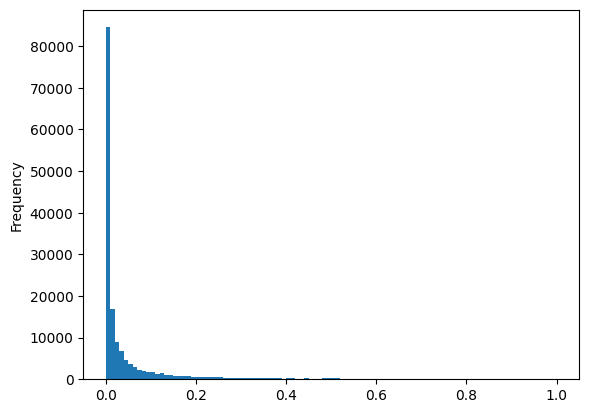

In [ ]:
higeo.cdeaths_pc.plot.hist(bins=100)

## tests: factor analysis, multicollinearity with random data, imputation

### factor analysis of war health coverage interactions

In [ ]:
!pip install --quiet factor_analyzer

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 kB 1.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
# np.ones(3*4).reshape(4,3) * np.arange(3)#[..., None]
(X_factor * factor_results._params[1:]).shape
# reconstituted.shape

(5382, 3)

In [ ]:
from factor_analyzer import FactorAnalyzer
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
from factor_analyzer.factor_analyzer import calculate_kmo

# war & health factor analysis
interaction_var = 'lead2_health_coverage'
test = cat_convert(merged, covars)
test = test.set_index(['ISO', 'year'])

### run tests for the appropriate number of factors (for this particular set of features it turns out 4 factors are sufficient)
y = test.all_cause_conflict_removed_popnormed.copy()
exclude = ['ISO', 'year', 'all_cause_conflict_removed_popnormed', 'const']
decompose = test.loc[:, ~test.columns.isin(exclude)].copy()
print('chi_square_value, p_value: ', calculate_bartlett_sphericity(decompose.values))
kmo_all, kmo_model = calculate_kmo(decompose.values)
print(f'KMO adequate?: {kmo_model>0.6}: {kmo_model}')
fa = FactorAnalyzer(rotation="varimax", n_factors=8).fit(decompose.values)
eig = fa.get_eigenvalues()[1]
eig_1 = eig[eig>=1] # only use those eigenvalues with more information than a single original feature
loadings = fa.loadings_
loadings_1 = loadings[np.ix_(np.arange(loadings.shape[0]),np.arange(len(eig_1)))] # use only those loadings with eigenvectors > 1
# variances = fa.get_factor_variance()
_, _, suff_p_val = fa.sufficiency(len(y))
print('selected number of factors sufficient? pval:' , suff_p_val)

### now transform the design matrix into factors
X_factor = FactorAnalyzer(rotation="varimax", n_factors=len(eig_1)).fit(decompose.values).transform(decompose.values)
factordf = test.reset_index()[['ISO', 'year']].copy()
factordf = factordf.set_index(['ISO', 'year'])
for i in range(len(eig_1)):
    factordf['f'+str(i)] = X_factor[:,i]
factordf = sm.add_constant(factordf)
model = PanelOLS(y, factordf[['const'] + ['f'+str(i) for i in range(len(eig_1))]], entity_effects=True, time_effects=True)
factor_results = model.fit()
reconstituted = (loadings_1 @ factor_results._params[1:])
print(sorted([(c, np.abs(coeff)) for c, coeff in zip(decompose.columns, reconstituted)], key=lambda x: x[1])[::-1])
# ('ihme_mean_adult_educ', 139.42197902748018), ('lead2_health_coverage', 135.54504293952814),
# ('health_worker_density', 131.67236683807556), ('fertility', 123.5283410706441), ('gdp_pc', 94.67382147068662),
# ('urbanisation', 75.89905116991594), ('v2x_polyarchy', 59.190282014293594), ('War', 36.73076771036448),
# ('Small Conflict', 33.536884860016805), ('interaction_war_lead2_health_coverage', 27.72865853083393),
# ('unemployment', 19.11093112695112), ('interaction_small_conflict_lead2_health_coverage', 18.086709265164178),
# ('pop_dense_sqkm', 10.393051222041258), ('arable_land', 10.140875300649029), ('emdat_deaths_popnormed', 6.980418297325916)
## sign of coefficients are not preserved and instead the magnitude of relationships is what matters
print(factor_results._params[1:])
print(pd.DataFrame(np.round(loadings_1, 3), index=test.columns[~test.columns.isin(exclude)]))

kept:  5382 , dropped:  2292  = 29.86708365910868 % dropped
features:  17
chi_square_value, p_value:  (55781.60611050305, 0.0)
KMO adequate?: True: 0.7497784838782058
selected number of factors sufficient? pval: 4.200442860925856e-62
[('ihme_mean_adult_educ', 139.42197902748018), ('lead2_health_coverage', 135.54504293952814), ('health_worker_density', 131.67236683807556), ('fertility', 123.5283410706441), ('gdp_pc', 94.67382147068662), ('urbanisation', 75.89905116991594), ('v2x_polyarchy', 59.190282014293594), ('War', 36.73076771036448), ('Small Conflict', 33.536884860016805), ('interaction_war_lead2_health_coverage', 27.72865853083393), ('unemployment', 19.11093112695112), ('interaction_small_conflict_lead2_health_coverage', 18.086709265164178), ('pop_dense_sqkm', 10.393051222041258), ('arable_land', 10.140875300649029), ('emdat_deaths_popnormed', 6.980418297325916)]
[-162.31115466   15.46270004   23.48168229]
                                                      0      1      2
lead2

### categorical conflict and categorical health coverage

coefficients are far too unstable (changing sign or magnitude including by factors of 10) if categories change slightly and it doesn't matter how many categories are used (I tried 3 or 5)

also the more categories are introduced the higher the multicollinearity (if using 5 all the War related coefficients including war-related interactions were extremely high (VIF < 100)

count    6174.000000
mean       58.503663
std        20.057038
min         8.487137
25%        42.681559
50%        59.063451
75%        72.653389
max        96.705950
Name: health_coverage, dtype: float64

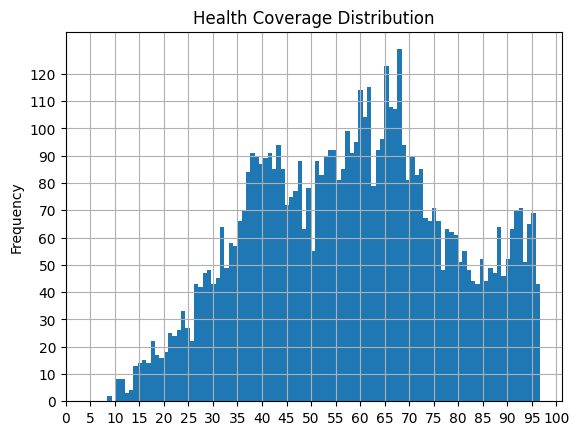

In [ ]:
merged.health_coverage.plot.hist(bins=100)
plt.xticks(list(range(0,105, 5)))
plt.yticks(list(range(0,130,10)))
plt.grid(True, zorder=-1)
plt.title('Health Coverage Distribution')
merged.health_coverage.describe()

In [ ]:
exogvars = ['all_cause_conflict_removed_popnormed','v2x_polyarchy', 'arable_land','unemployment',  'emdat_deaths_popnormed',
            'gdp_pc', 'gbd_pop_est','pop_dense_sqkm', 'urbanisation',  'ihme_mean_adult_educ', 'year', 'ISO', 'lead2_health_coverage','lead1_conflict_deaths']
test = merged[exogvars].dropna()
le_choices = ['hc_0', 'hc_1', 'hc_2', 'hc_3', 'hc_5']
test['qcut_hc'] = pd.qcut(test['lead2_health_coverage'], q=5, labels=le_choices)
test['ranged_bins_hc'] = pd.cut(test['lead2_health_coverage'], bins=5, labels=le_choices)
print('qcut even samples binning', test['qcut_hc'].value_counts())
#
mu = test['lead2_health_coverage'].mean()
std = test['lead2_health_coverage'].std()
le_conditions = [(test['lead2_health_coverage'] < mu - std), (test['lead2_health_coverage'] >= mu - std) & (test['lead2_health_coverage']<= mu + std), (test['lead2_health_coverage']>mu+std)]
test['normal_hc'] = np.select(le_conditions,['low_hc', 'medium_hc', 'high_hc'])
#
war_conditions = [test['lead1_conflict_deaths'] <25, (test['lead1_conflict_deaths'] >= 25) & (test['lead1_conflict_deaths'] <= 999), test['lead1_conflict_deaths'] >= 1000]
war_choices = [ "None", 'Small Conflict', 'War']
test['conflict_types'] = np.select(war_conditions, war_choices)

print('normal dist hc', test['normal_hc'].value_counts())
print('even ranged binning',test['ranged_bins_hc'].value_counts())
print('\n',test.groupby(["conflict_types", "qcut_hc"]).size().unstack())
print('\n',test.groupby(["conflict_types", "ranged_bins_hc"]).size().unstack())
print('\n',test.groupby(["conflict_types", "normal_hc"]).size().unstack())



conflict_dummies = pd.get_dummies(test['conflict_types'], drop_first=True)
qcut_dummies = pd.get_dummies(test['qcut_hc']).iloc[:, :-1]
cut_dummies = pd.get_dummies(test['ranged_bins_hc']).iloc[:, :-1]

cut_interaction = pd.DataFrame()
for x1 in cut_dummies.columns:
    if 'high_hc' not in x1:
        for x2 in conflict_dummies.columns:
                interaction_name = f"{x1} & {x2}"
                interaction_term = cut_dummies[x1] * conflict_dummies[x2]
                cut_interaction[interaction_name] = interaction_term
cut_interaction -= cut_interaction.mean() # centering

qcut_interaction = pd.DataFrame()
for x1 in qcut_dummies.columns:
    # if 'high_hc' not in x1:
        for x2 in conflict_dummies.columns:
                interaction_name = f"{x1} & {x2}"
                interaction_term = qcut_dummies[x1] * conflict_dummies[x2]
                qcut_interaction[interaction_name] = interaction_term
qcut_interaction -= qcut_interaction.mean() # centering

qcut_dummies = qcut_dummies
cut_dummies = cut_dummies
test.drop(columns=['lead1_conflict_deaths', 'qcut_hc',
       'ranged_bins_hc', 'normal_hc', 'conflict_types', 'lead2_health_coverage'], inplace=True)
qtest = test.copy()
qtest = pd.concat([test, conflict_dummies, qcut_dummies, qcut_interaction], axis=1)
test = pd.concat([test, conflict_dummies, cut_dummies, cut_interaction], axis=1)
test = test.set_index(['ISO','year'])
qtest = qtest.set_index(['ISO','year'])

exog = sm.add_constant(test.iloc[:,1:])
qexog = sm.add_constant(qtest.iloc[:,1:])
model = PanelOLS(test.all_cause_conflict_removed_popnormed, exog, entity_effects=True, time_effects=True)
qmodel = PanelOLS(test.all_cause_conflict_removed_popnormed, qexog, entity_effects=True, time_effects=True)

cut_conflict_health = model.fit()
qcut_conflict_health = qmodel.fit()

print('ranged bins for hc', cut_conflict_health)
print('vif for ranged bins', VIF(model))
print('\nqcut bins for hc' ,qcut_conflict_health)
print('vif for qcut bins', VIF(qmodel))

qcut even samples binning hc_0    919
hc_1    919
hc_3    919
hc_5    919
hc_2    918
Name: qcut_hc, dtype: int64
normal dist hc medium_hc    2890
high_hc       884
low_hc        820
Name: normal_hc, dtype: int64
even ranged binning hc_2    1201
hc_1    1199
hc_3    1135
hc_5     818
hc_0     241
Name: ranged_bins_hc, dtype: int64

 qcut_hc         hc_0  hc_1  hc_2  hc_3  hc_5
conflict_types                              
None             496   651   737   743   881
Small Conflict   277   184   121   126    37
War              146    84    60    50     1

 ranged_bins_hc  hc_0  hc_1  hc_2  hc_3  hc_5
conflict_types                              
None              95   777   924   927   785
Small Conflict    85   289   187   152    32
War               61   133    90    56     1

 normal_hc       high_hc  low_hc  medium_hc
conflict_types                            
None                847     429       2232
Small Conflict       36     252        457
War                   1     139        

### multicollinearity tests with random data



In [ ]:
### too much collinearity between conflict type and interaction term,
# no matter if there are multiple or single conflict types
# demeaning mitigates that but makes coefficients counterintuitive
# even random values used in interaction with conflict categories yield multicollinearity
exogvars = ['all_cause_conflict_removed_popnormed','v2x_polyarchy', 'arable_land','unemployment',  'emdat_deaths_popnormed',
            'gdp_pc', 'gbd_pop_est','pop_dense_sqkm', 'urbanisation',  'ihme_mean_adult_educ', 'year', 'ISO', 'lead2_u1_life_exp','lead1_conflict_deaths']
test = merged[exogvars].dropna()
col = 'lead1_conflict_deaths'
conditions = [(test[col] <= 999), test[col] >= 1000]
choices = [ "Non-War", 'War']
# war = np.select(conditions, choices)
# test["lead1_conflict_type"] = np.select(conditions, choices)
test.drop(columns=['lead1_conflict_deaths'], inplace=True)
# test['lead2_u1_life_exp'] = test['lead2_u1_life_exp'] - test['lead2_u1_life_exp'].mean()
# conflict_dummies = pd.get_dummies(test["lead1_conflict_type"], drop_first=True)
rand = pd.Series((np.random.randn(len(test)) >= 0) * 1,  name='rand_interaction')
random_dummies = pd.get_dummies(rand, drop_first=True).mul(test['lead2_u1_life_exp'].values.reshape(-1, 1))
# interaction = conflict_dummies * test['lead2_u1_life_exp'].values.reshape(-1, 1)
# interaction.rename(columns={'War': 'interaction_war_life_exp'}, inplace=True)

# test = pd.concat([test.iloc[:,:-1], conflict_dummies, interaction], axis=1)
test['rand'] = rand
test['rand_interaction'] = random_dummies
test = test.set_index(['ISO','year'])
exog = sm.add_constant(test.iloc[:,1:])
model = PanelOLS(test.all_cause_conflict_removed_popnormed, exog,entity_effects=True, time_effects=True)
war_health = model.fit()
print(war_health)
war_health.summary.as_html()

                                   PanelOLS Estimation Summary                                    
Dep. Variable:     all_cause_conflict_removed_popnormed   R-squared:                        0.6535
Estimator:                                     PanelOLS   R-squared (Between):              0.3499
No. Observations:                                  1440   R-squared (Within):               0.7882
Date:                                  Mon, Feb 19 2024   R-squared (Overall):              0.6718
Time:                                          11:27:43   Log-likelihood                   -8292.5
Cov. Estimator:                              Unadjusted                                           
                                                          F-statistic:                      203.81
Entities:                                           104   P-value                           0.0000
Avg Obs:                                         13.846   Distribution:                 F(12,1297)
Min Obs:  

/usr/local/lib/python3.10/dist-packages/linearmodels/panel/model.py:1214: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(dependent, exog, weights=weights, check_rank=check_rank)


'<table class="simpletable">\n<caption>PanelOLS Estimation Summary</caption>\n<tr>\n  <th>Dep. Variable:</th>    <td>all_cause_conflict_removed_popnormed</td> <th>  R-squared:         </th>     <td>0.6535</td>  \n</tr>\n<tr>\n  <th>Estimator:</th>                      <td>PanelOLS</td>               <th>  R-squared (Between):</th>    <td>0.3499</td>  \n</tr>\n<tr>\n  <th>No. Observations:</th>                 <td>1440</td>                 <th>  R-squared (Within):</th>     <td>0.7882</td>  \n</tr>\n<tr>\n  <th>Date:</th>                       <td>Mon, Feb 19 2024</td>           <th>  R-squared (Overall):</th>    <td>0.6718</td>  \n</tr>\n<tr>\n  <th>Time:</th>                           <td>11:27:43</td>               <th>  Log-likelihood     </th>     <td>-8292.5</td> \n</tr>\n<tr>\n  <th>Cov. Estimator:</th>                <td>Unadjusted</td>              <th>                     </th>        <td></td>     \n</tr>\n<tr>\n  <th></th>                                    <td></td>        

<Axes: xlabel='lead1_conflict_deaths_popnormed', ylabel='all_cause_conflict_removed_popnormed'>

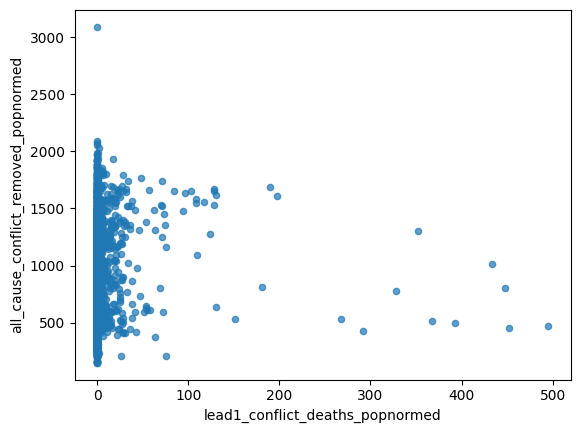

In [ ]:
nod_merged.plot.scatter(y='all_cause_conflict_removed_popnormed', x='lead1_conflict_deaths_popnormed', alpha=0.7)

<Axes: xlabel='conflict_deaths_popnormed', ylabel='lag1_all_cause_conflict_removed_popnormed'>

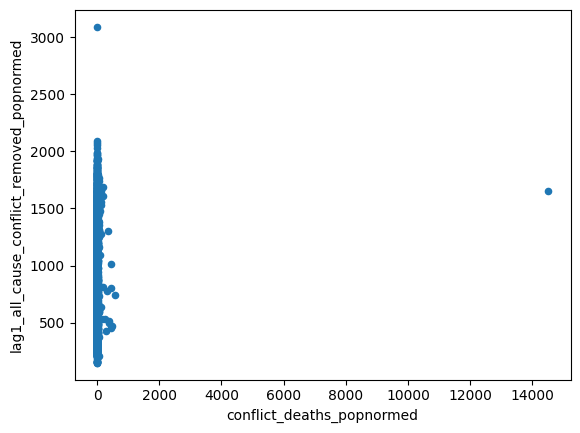

In [ ]:
merged.plot.scatter(y='all_cause_conflict_removed_popnormed', x='lead1_conflict_deaths_popnormed')

### investigating missing data / imputation

In [ ]:
c = covars.copy()
# c.remove('v2x_polyarchy')
# c.remove('ihme_mean_adult_educ')
# c.remove('gdp_pc')
set(merged[c].dropna().ISO.unique()) - set(merged[covars].dropna().ISO.unique())
set(merged.ISO.unique()) - set(merged[covars].dropna().ISO.unique())

In [ ]:
print('MISSING DATA')
for c in merged_df.columns:
    print(f'{c}\n  {merged_df[c].isnull().sum()} == {merged_df[c].isnull().sum()/len(merged_df)*100}%')

In [ ]:
len(merged_df)

In [ ]:
# polyarchy null in 14856 out of 78120
# polity null in 52574 out of 78120
# unfortunately there's no overlap between nonmissing polity and missing vdem (or vice versa)
# merged_df[(merged_df.polity2.isnull())] # (merged_df.v2x_polyarchy.isnull()) &
merged_df

#### imputation tests

imputation tests with iterative imputer (multiple imputation) are discouraging. imputed data tends to be quite more extreme than original

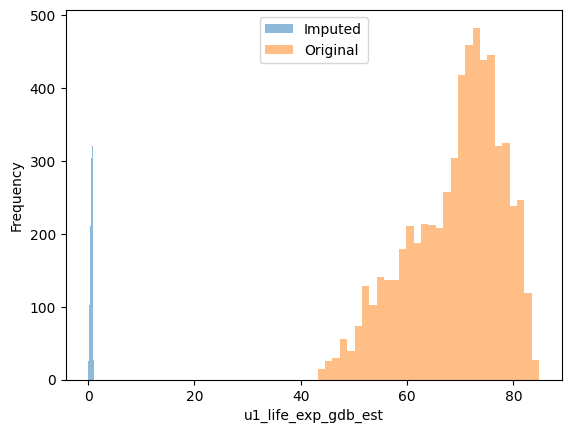

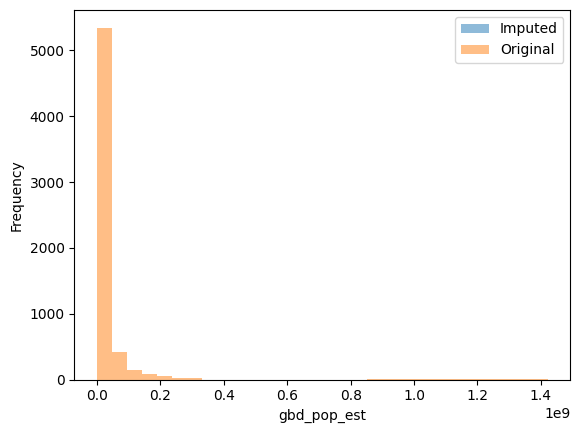

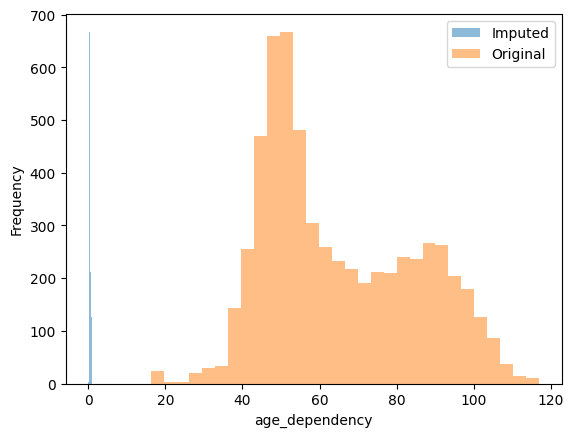

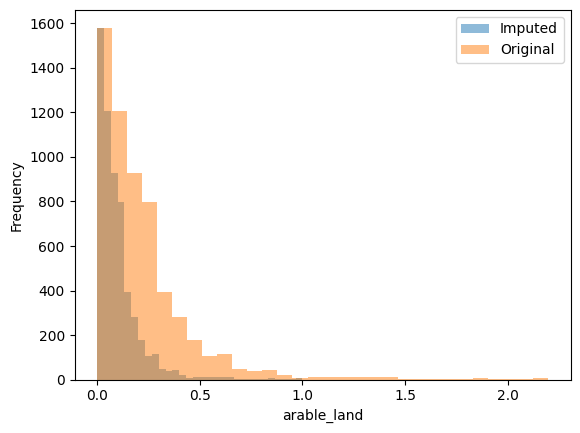

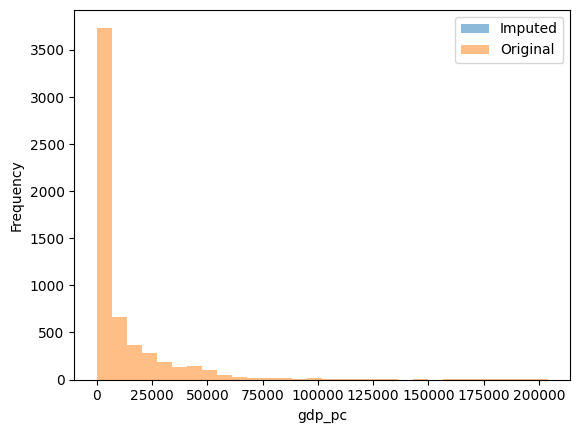

...

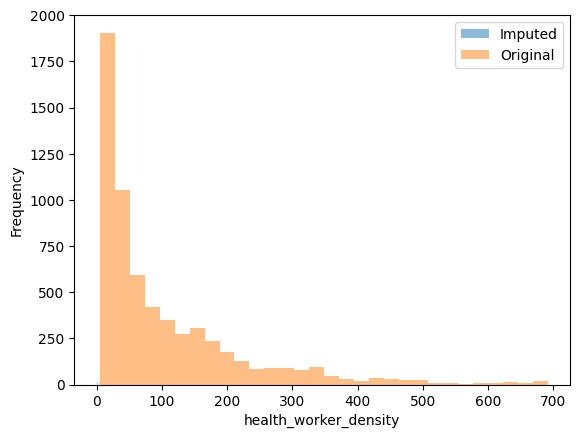

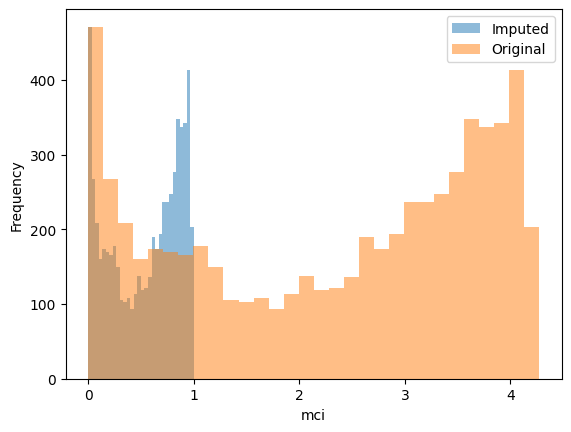

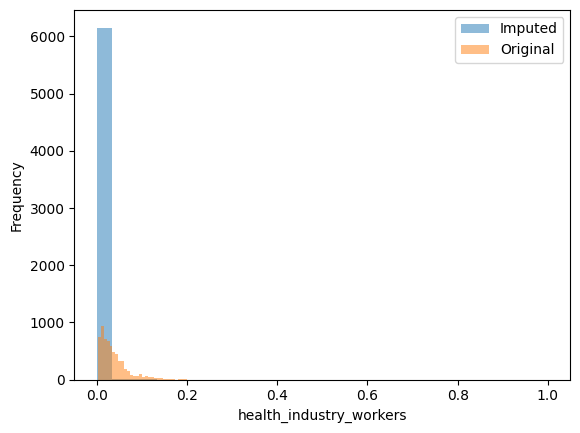

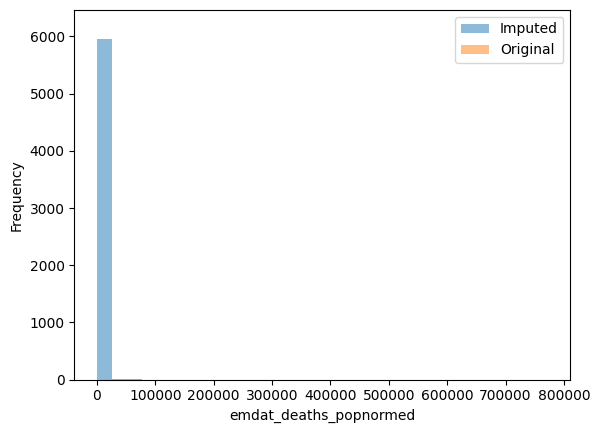

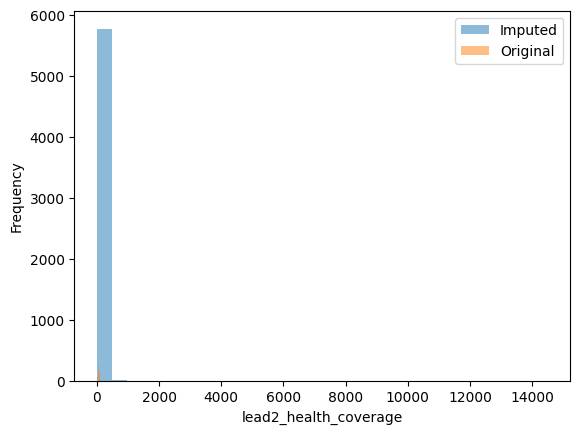

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

### use as many columns as reasonable, high collinearities are useful
imputebasecols =  ['u1_life_exp_gdb_est', 'gbd_pop_est', # 'ISO', 'year',
       'age_dependency', 'arable_land', 'gdp_pc', 'hospitalbeds_1kppl',
       'pop_dense_sqkm', 'unemployment', 'urbanisation', 'who_doc_density',
       'who_health_expenditure', 'v2x_polyarchy',# 'polity2',
       'ihme_mean_adult_educ', 'ihme_ppp_mean_hexp', 'popnormed_avg_temp',
       'popnormed_5quintile_rain', 'fertility', 'gbd_sdi',
       'health_worker_density', 'mci','lead1_conflict_deaths',
       'health_industry_workers', 'conflict_deaths_popnormed',
       'emdat_deaths_popnormed', 'all_cause_conflict_removed_popnormed',
       'lead1_conflict_deaths_popnormed','lead2_health_coverage']
data = merged[imputebasecols]
columns_to_scale_and_impute = ['u1_life_exp_gdb_est', 'gbd_pop_est',
       'age_dependency', 'arable_land', 'gdp_pc', 'hospitalbeds_1kppl',
       'pop_dense_sqkm', 'unemployment', 'urbanisation', 'who_doc_density',
       'who_health_expenditure', 'v2x_polyarchy', # 'polity2',
       'ihme_mean_adult_educ', 'ihme_ppp_mean_hexp', 'popnormed_avg_temp',
       'popnormed_5quintile_rain', 'fertility', 'gbd_sdi',
       'health_worker_density', 'mci',
       'health_industry_workers',
       'emdat_deaths_popnormed', 'lead2_health_coverage']

pipeline = Pipeline([
    ('scaling', MinMaxScaler()),
    ('imputation', IterativeImputer(max_iter=100))])

# column transformer to apply the pipeline to specific columns
preprocessor = ColumnTransformer(
    transformers=[
        ('scaling_and_imputation', pipeline, columns_to_scale_and_impute)],
    remainder='passthrough'  # pass through columns that don't need scaling and imputation
)

imputed_data = preprocessor.fit_transform(data)
for column_name in data.columns:
    if column_name in columns_to_scale_and_impute:
        plt.figure()
        plt.hist(imputed_data[data[column_name].notnull(), data.columns.get_loc(column_name)], bins=30, alpha=0.5, label='Imputed')
        plt.hist(data[column_name].dropna(), bins=30, alpha=0.5, label='Original')
        plt.xlabel(column_name)
        plt.ylabel('Frequency')
        plt.legend()
        plt.show()

In [ ]:
# t = [[1, 'A', 'Y', 28, 4.2, 1100],
#     [0, 'B', np.nan, 22, 3.8, 950],
#     [1, 'B','Y', 25, 4.0, 1200],
#     [0, np.nan,'Y', 30, 3.6, 1300],
#     [1, np.nan,'X', np.nan, 3.9, 1050],
#     [np.nan, 'C','X', 24, 3.7, np.nan],
#     [1, 'A','Y', 26, 4.1, 1250],
#     [0, 'B','Z', 23, 3.5, 1000],
#     [1, 'A','X', 29, 3.8, 1150],
#     [0, 'C',np.nan, 21, 4.3, 1400],
#     [1, 'B','Z', 27, 3.6, np.nan],
#     [0, 'C','Z', 20, 3.9, 900]]

# columns = ['Binary', 'Category1','Category2', 'Numeric1', 'Numeric2', 'Numeric3']

# df = pd.DataFrame(t, columns=columns)
# # df.nunique()
# data_cat = df[['Category1', 'Category2']]
# data_oh, cat_col_list = md.cat_conv(data_cat)
# # Midas requires the following order: [Continuous data], [Binary data], [Categorical data]
# df = pd.concat([df.iloc[:, 3:], df.iloc[:,0], data_oh], axis=1)
torg = [[25,1,50],
     [27,3,80],
     [29,5,110],
     [31,7,140],
     [33,9,170],
     [35,11,200]]
tnan = [[25,np.nan,50],
     [27,3,np.nan],
     [29,5,110],
     [31,7,140],
     [33,9,170],
     [np.nan,11,200]]
testcols = ['age', 'experience', 'salary']
df = pd.DataFrame(tnan, columns=testcols)

midas = md.Midas()
imputer = md.Midas(layer_structure= [256,256], vae_layer = False, seed= 89, input_drop = 0.1)
imputer.build_model(df)#, binary_columns = ['Binary'], softmax_columns = cat_col_list)
imputer.train_model(training_epochs = 10, verbose=False)

Size index: [3]

Computation graph constructed



In [ ]:
df

,age,experience,salary
0,25.0,NaN,50.0
1,27.0,3.0,NaN
2,29.0,5.0,110.0
3,31.0,7.0,140.0
4,33.0,9.0,170.0
5,NaN,11.0,200.0


In [ ]:
11*(-0.812185) + 200*(-0.029534) + 31.922061

17.081226

In [ ]:
models

[         term   estimate  std.error  statistic        df   p.value
 0       const  31.922061  12.110612   2.635875  1.975861  0.120304
 1  experience  -0.812185   3.198371  -0.253937  1.890380  0.824474
 2      salary  -0.029534   0.181101  -0.163081  1.935357  0.885885,
      term  estimate  std.error  statistic        df   p.value
 0   const  0.221728   5.525440   0.040129  1.771957  0.972045
 1     age -0.020256   0.141268  -0.143386  1.974769  0.899277
 2  salary  0.051262   0.024618   2.082283  1.767920  0.189222,
          term   estimate  std.error  statistic        df   p.value
 0       const  45.351414  79.391200   0.571240  1.433346  0.644392
 1         age  -0.434743   2.063068  -0.210727  1.860159  0.853907
 2  experience  13.715204   6.613693   2.073759  1.205070  0.251204]

In [ ]:
imputations

[    age  experience      salary
 0  25.0  -12.077139   50.000000
 1  27.0    3.000000   -2.438331
 2  29.0    5.000000  110.000000
 3  31.0    7.000000  140.000000
 4  33.0    9.000000  170.000000
 5   0.0   11.000000  200.000000,
     age  experience  salary
 0  25.0         0.0    50.0
 1  27.0         3.0     0.0
 2  29.0         5.0   110.0
 3  31.0         7.0   140.0
 4  33.0         9.0   170.0
 5   0.0        11.0   200.0,
     age  experience  salary
 0  25.0         0.0    50.0
 1  27.0         3.0     0.0
 2  29.0         5.0   110.0
 3  31.0         7.0   140.0
 4  33.0         9.0   170.0
 5   0.0        11.0   200.0,
          age  experience      salary
 0  25.000000         0.0   50.000000
 1  27.000000         3.0    0.400624
 2  29.000000         5.0  110.000000
 3  31.000000         7.0  140.000000
 4  33.000000         9.0  170.000000
 5  -1.461735        11.0  200.000000,
     age  experience     salary
 0  25.0         0.0   50.00000
 1  27.0         3.0   -7.908

In [ ]:
imputations = imputer.generate_samples(m=10).output_list
# for i in imputations:
#     print(i)
models = []
for col in df.columns:
    other_cols = [c for c in df.columns if not c==col ]
    model = md.combine(y_var = col,
                   X_vars = other_cols,
                   df_list = imputations)
    models.append(model)

Model restored.


In [ ]:
# for i, model in enumerate(models):
#     tmpdf = df.drop(index=i)
#     print(tmpdf)
(df.iloc[1:, :].to_numpy() @ models[0]['estimate'].to_numpy())
# df.iloc[1:, :].to_numpy().shape

array([           nan, 5.12250636e+09,            nan,            nan,
                  nan, 5.33594413e+09, 4.69563083e+09, 5.97625742e+09,
                  nan,            nan, 4.05531754e+09])

In [ ]:
## stack and take the mean
imputelist = [df.to_numpy() for df in imputations]
meanimputed = np.dstack(imputelist).mean(axis=-1)
## convert back to a dataframe
imputecols = imputations[0].columns
meanimputed = pd.DataFrame(meanimputed, columns=imputecols)
meanimputed

,age,experience,salary
0,25.000000,-1.520963,50.000000
1,27.000000,3.000000,-0.957931
2,29.000000,5.000000,110.000000
3,31.000000,7.000000,140.000000
4,33.000000,9.000000,170.000000
5,-2.485966,11.000000,200.000000


In [ ]:
### transform binary cols with threshold >=0.5
### transform cat cols with threshold >=0.5
### convert one hot cat cols back to condensed form?
# imputed = df[df == 1].idxmax(axis=1)

In [ ]:
print('MISSING DATA')
print(len(merged_df))
tmp = merged_df.loc[merged_df[['ISO', 'country']].dropna().index, :]
print(len(tmp))
for c in merged_df.columns:
    print(f'{c}\n  {tmp[c].isnull().sum()} == {tmp[c].isnull().sum()/len(tmp)*100}%')

MISSING DATA
78120
74820
ISO
  0 == 0.0%
year
  0 == 0.0%
region
  54132 == 72.3496391339214%
conflict_deaths
  0 == 0.0%
country
  0 == 0.0%
sex
  0 == 0.0%
cause
  0 == 0.0%
all_age_deaths
  0 == 0.0%
upper
  0 == 0.0%
lower
  0 == 0.0%
all_cause_conflict_removed
  0 == 0.0%
lower_conflict_removed
  0 == 0.0%
upper_conflict_removed
  0 == 0.0%
arable_land
  4608 == 6.1587810745789895%
GDP_pc
  5244 == 7.008821170809944%
pop_dense_sqkm
  3288 == 4.394546912590217%
population
  1800 == 2.405773857257418%
unemployment
  10068 == 13.456295108259825%
urbanisation
  1800 == 2.405773857257418%
WHO_doc_density
  40776 == 54.498797113071376%
WHO_health_expenditure
  28476 == 38.059342421812346%
emdat_deaths
  0 == 0.0%
v2x_polyarchy
  11616 == 15.525260625501202%
polity2
  49332 == 65.93424218123496%
conflict_deaths_popnormed
  1800 == 2.405773857257418%
emdat_deaths_popnormed
  1800 == 2.405773857257418%
all_cause_conflict_removed_popnormed
  1800 == 2.405773857257418%


count    7.812000e+04
mean    -2.910569e-18
std      4.969034e-01
min     -7.859166e+00
25%     -2.718721e-01
50%      6.149207e-17
75%      2.679870e-01
max      2.662437e+00
dtype: float64 

78120
78120
                                        hb  all_cause_conflict_removed_normed
hb                                 1.00000                           -0.63169
all_cause_conflict_removed_normed -0.63169                            1.00000


<Axes: xlabel='hb', ylabel='all_cause_conflict_removed_normed'>

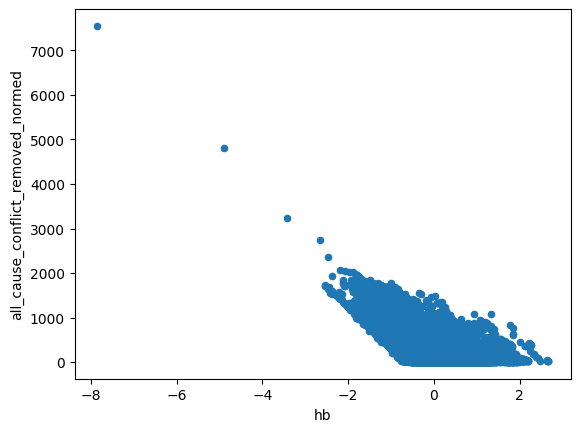

In [ ]:
hb = (scaling(merged_df['WHO_doc_density']) + scaling(merged_df['WHO_health_expenditure']) - scaling(merged_df['all_cause_conflict_removed_normed']))/3
print((hb).describe(), '\n')
print(len(hb.dropna()))
print(len(merged_df))
tmp = merged_df.copy()
tmp['hb'] = hb
print(tmp[['hb', 'all_cause_conflict_removed_normed']].corr())
tmp[['hb', 'all_cause_conflict_removed_normed']].plot(x='hb', y='all_cause_conflict_removed_normed', kind='scatter')

In [ ]:
merged_df['all_cause_conflict_removed_normed'].describe()

count    73020.000000
mean       286.155666
std        308.134163
min          2.894816
25%         45.059427
50%        183.333198
75%        428.920250
max       7551.188302
Name: all_cause_conflict_removed_normed, dtype: float64

In [ ]:
# forward filling missing values for 'WHO_doc_density' and 'WHO_health_expenditure'
merged_bothsex_allcause_sorted = merged_bothsex_allcause.sort_values(['ISO', 'year'])
merged_bothsex_allcause['WHO_doc_density'] = merged_bothsex_allcause_sorted.groupby('ISO')['WHO_doc_density'].transform(lambda x: x.ffill())
merged_bothsex_allcause['WHO_health_expenditure'] = merged_bothsex_allcause_sorted.groupby('ISO')['WHO_health_expenditure'].transform(lambda x: x.ffill())
print(len(merged_bothsex_allcause[merged_bothsex_allcause['WHO_doc_density'].isnull()])) # initially: 3668, after transform: 2119
print(len(merged_bothsex_allcause[merged_bothsex_allcause['WHO_health_expenditure'].isnull()])) # initially: 2643, after transform: 2622

In [ ]:
# need to scale the data before i can aggregate it with mean!!
print(merged_bothsex_allcause.WHO_health_expenditure.describe())
print(merged_bothsex_allcause.conflict_deaths_normed.describe())
print(merged_bothsex_allcause.WHO_doc_density.describe())
print(merged_bothsex_allcause.all_cause_conflict_removed.describe())

count    3862.000000
mean        9.784102
std         4.883041
min         0.730000
25%         6.320000
50%         9.080000
75%        12.727500
max        42.050000
Name: WHO_health_expenditure, dtype: float64
count     6085.000000
mean         4.122968
std        148.376545
min          0.000000
25%          0.000000
50%          0.000000
75%          0.011597
max      11473.361589
Name: conflict_deaths_normed, dtype: float64
count    2837.000000
mean       20.666006
std        14.654606
min         0.125000
25%         7.452000
50%        21.129000
75%        31.889000
max        84.273000
Name: WHO_doc_density, dtype: float64
count    6.505000e+03
mean     1.169831e+06
std      6.456016e+06
min      1.082834e+01
25%      9.754602e+03
50%      6.027007e+04
75%      1.929168e+05
max      5.643157e+07
Name: all_cause_conflict_removed, dtype: float64


#### checking missing values merged_df

In [ ]:
# merged_df[merged_df.unemployment.isnull()] # 698
# merged_df[merged_df.WHO_doc_density.isnull()] # 12220
# merged_df[merged_df.WHO_health_expenditure.isnull()] # 8049
# merged_df[merged_df.GDP_pc.isnull()] # 871
# merged_df[(merged_df.unemployment.isnull()) & (merged_df.WHO_doc_density.isnull())
#             & merged_df.WHO_health_expenditure.isnull() & merged_df.GDP_pc.isnull()] # 48

,ISO,year,conflict_deaths,country,sex,cause,all_age_deaths,upper,lower,all_cause_conflict_removed,...,upper_conflict_removed,arable_land,GDP_pc,pop_dense_sqkm,population,unemployment,urbanisation,WHO_doc_density,WHO_health_expenditure,emdat_deaths
0,AFG,1990,1514,Afghanistan,Male,Injuries,9823.511513,11729.470622,8174.271589,9823.511513,...,11729.470622,0.739612,NaN,16.397277,10694796.0,NaN,21.177,NaN,NaN,246.0
1,AFG,1990,1514,Afghanistan,Female,Injuries,4578.321285,5633.016110,3670.382029,4578.321285,...,5633.016110,0.739612,NaN,16.397277,10694796.0,NaN,21.177,NaN,NaN,246.0
2,AFG,1990,1514,Afghanistan,Both,Injuries,14401.832798,17357.003933,11945.933394,14401.832798,...,17357.003933,0.739612,NaN,16.397277,10694796.0,NaN,21.177,NaN,NaN,246.0
3,AFG,1990,1514,Afghanistan,Male,All causes,94512.560574,105689.494655,83365.499261,93517.872605,...,104437.379387,0.739612,NaN,16.397277,10694796.0,NaN,21.177,NaN,NaN,246.0
4,AFG,1990,1514,Afghanistan,Female,All causes,87572.097653,97317.506951,78060.599923,87076.785623,...,96694.007146,0.739612,NaN,16.397277,10694796.0,NaN,21.177,NaN,NaN,246.0
5,AFG,1990,1514,Afghanistan,Both,All causes,182084.658228,202821.075473,161483.089057,180594.658228,...,200945.460399,0.739612,NaN,16.397277,10694796.0,NaN,21.177,NaN,NaN,246.0
6,AFG,1990,1514,Afghanistan,Male,"Communicable, maternal, neonatal, and nutritio...",38067.844205,47467.659261,30370.146804,38067.844205,...,47467.659261,0.739612,NaN,16.397277,10694796.0,NaN,21.177,NaN,NaN,246.0
7,AFG,1990,1514,Afghanistan,Female,"Communicable, maternal, neonatal, and nutritio...",39434.164656,47096.728313,32060.678098,39434.164656,...,47096.728313,0.739612,NaN,16.397277,10694796.0,NaN,21.177,NaN,NaN,246.0
8,AFG,1990,1514,Afghanistan,Both,"Communicable, maternal, neonatal, and nutritio...",77502.008861,94138.111230,63361.934432,77502.008861,...,94138.111230,0.739612,NaN,16.397277,10694796.0,NaN,21.177,NaN,NaN,246.0
9,AFG,1990,1514,Afghanistan,Male,Non-communicable diseases,46621.204856,57220.461165,36736.349546,46621.204856,...,57220.461165,0.739612,NaN,16.397277,10694796.0,NaN,21.177,NaN,NaN,246.0
